In [1]:
import pandas as pd
import numpy as np
import datetime as dt
from datetime import datetime

import matplotlib.pyplot as plt

import numpy as np

from sklearn.preprocessing import MinMaxScaler

### Create the Stacked LSTM model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from keras.layers import Dropout

C:\Users\getto\AppData\Roaming\Python\Python36\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\getto\AppData\Roaming\Python\Python36\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\getto\AppData\Roaming\Python\Python36\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\getto\AppData\Roaming\Python\Python36\site-

In [4]:
df = pd.read_csv("HDFC.csv")
df.head()

,Date,Open Price,High Price,Low Price,Close Price,WAP,No.of Shares,No. of Trades,Total Turnover (Rs.),Deliverable Quantity,% Deli. Qty to Traded Qty,Spread High-Low,Spread Close-Open
0,18-Oct-22,1452.00,1465.00,1439.80,1444.15,1451.765186,120074,5008,174319253,55880.0,46.54,25.20,-7.85
1,17-Oct-22,1434.65,1457.30,1427.05,1446.35,1443.676582,277044,14249,399961935,89576.0,32.33,30.25,11.70
2,14-Oct-22,1412.00,1447.00,1412.00,1441.10,1434.102419,372227,19446,533811641,255735.0,68.70,35.00,29.10
3,13-Oct-22,1402.50,1406.85,1384.00,1393.70,1393.826194,68801,4435,95896636,30596.0,44.47,22.85,-8.80
4,12-Oct-22,1407.00,1414.10,1397.35,1409.40,1405.949168,122619,8854,172396081,57283.0,46.72,16.75,2.40


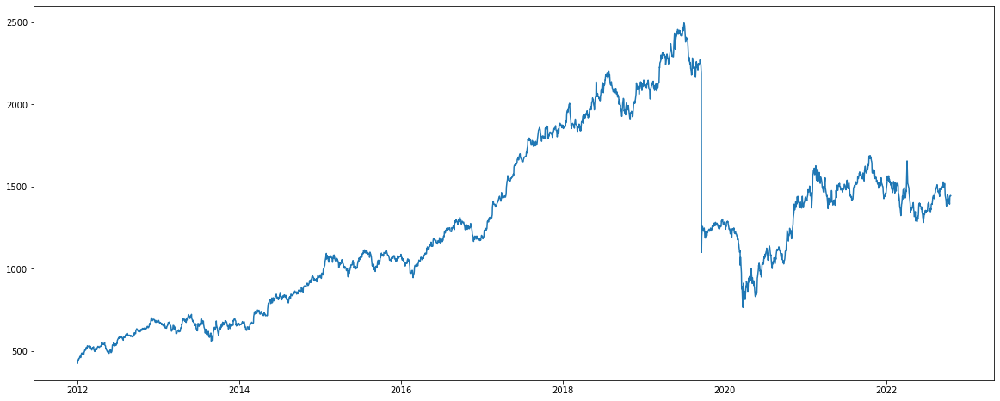

In [5]:
#setting index as date
df['Date'] = pd.to_datetime(df.Date,format='%d-%b-%y')
df.index = df['Date']

df.sort_index(inplace=True)
#plot
plt.figure(figsize=(20,8))
plt.plot(df['Close Price'], label='Historical Close Price')

In [6]:
dataset=df[['Open Price','High Price','Low Price','Close Price']].values

In [7]:
x=dataset[:-1,0:4]
x[0:5]

array([[431.8 , 431.8 , 419.35, 427.2 ],
       [431.  , 441.  , 431.  , 439.15],
       [440.1 , 444.85, 431.5 , 443.25],
       [444.1 , 446.7 , 439.25, 442.55],
       [440.  , 456.8 , 438.65, 452.5 ]])

In [12]:
y=dataset[1:,:1]
y[0:5]

array([[431. ],
       [440.1],
       [444.1],
       [440. ],
       [456. ]])

In [13]:
x_train = x[0:700,:]
y_train = y[0:700,:]
x_valid = x[700:,:]
y_valid = y[700:,:]

In [14]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(x)

MinMaxScaler()

In [15]:
scaled_data=scaler.transform(x_train)

In [16]:
x_train, y_train = np.array(scaled_data), np.array(y_train)

In [17]:
x_train[0:3]

array([[0.00038668, 0.        , 0.        , 0.        ],
       [0.        , 0.00444208, 0.00564192, 0.00578091],
       [0.00439847, 0.006301  , 0.00588406, 0.00776431]])

In [18]:
y_train[0:3]

array([[431. ],
       [440.1],
       [444.1]])

In [19]:
x_train = np.reshape(x_train, (x_train.shape[0],x_train.shape[1],1))

In [20]:
# create and fit the LSTM network
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1],1)))
#model.add(Dropout(rate = 0.2))

model.add(LSTM(units=50,activation='relu', return_sequences = True))
#model.add(Dropout(rate = 0.2))

model.add(LSTM(units=50, return_sequences = True))
#model.add(Dropout(rate = 0.2))

model.add(LSTM(units=50, return_sequences = False))
#model.add(Dropout(rate = 0.2))

model.add(Dense(1))

Instructions for updating:
Colocations handled automatically by placer.


In [21]:
model.compile(loss='mean_squared_error', optimizer='adam')

Instructions for updating:
Use tf.cast instead.


In [ ]:
model.fit(x_train, y_train, epochs=400000, batch_size=1024, verbose=1)

Epoch 1/400000
700/700 [==============================] - 0s 44us/sample - loss: 14.4917
Epoch 2/400000
700/700 [==============================] - 0s 44us/sample - loss: 14.8406
Epoch 3/400000
700/700 [==============================] - 0s 38us/sample - loss: 15.1711
Epoch 4/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.4089
Epoch 5/400000
700/700 [==============================] - 0s 47us/sample - loss: 15.5347
Epoch 6/400000
700/700 [==============================] - 0s 46us/sample - loss: 15.4852
Epoch 7/400000
700/700 [==============================] - 0s 53us/sample - loss: 15.2941
Epoch 8/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.9225
Epoch 9/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.4275
Epoch 10/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.8928
Epoch 11/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3827
Epoch 12/400000
700

700/700 [==============================] - 0s 56us/sample - loss: 15.0343
Epoch 93/400000
700/700 [==============================] - 0s 57us/sample - loss: 15.1777
Epoch 94/400000
700/700 [==============================] - 0s 56us/sample - loss: 15.1784
Epoch 95/400000
700/700 [==============================] - 0s 53us/sample - loss: 15.0453
Epoch 96/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.7632
Epoch 97/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.3575
Epoch 98/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.9030
Epoch 99/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4577
Epoch 100/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0853
Epoch 101/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8135
Epoch 102/400000
700/700 [==============================] - 0s 43us/sample - loss: 12.6707
Epoch 103/400000
700/70

Epoch 183/400000
700/700 [==============================] - 0s 43us/sample - loss: 14.5888
Epoch 184/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.3798
Epoch 185/400000
700/700 [==============================] - 0s 40us/sample - loss: 14.0844
Epoch 186/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.7621
Epoch 187/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.4282
Epoch 188/400000
700/700 [==============================] - 0s 43us/sample - loss: 13.1270
Epoch 189/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8900
Epoch 190/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7280
Epoch 191/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6476
Epoch 192/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6411
Epoch 193/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6887

700/700 [==============================] - 0s 48us/sample - loss: 13.3294
Epoch 274/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.2326
Epoch 275/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.1283
Epoch 276/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0078
Epoch 277/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8934
Epoch 278/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7945
Epoch 279/400000
700/700 [==============================] - 0s 43us/sample - loss: 12.7206
Epoch 280/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6696
Epoch 281/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6403
Epoch 282/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6294
Epoch 283/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.6323
Epoch 284/400000

Epoch 364/400000
700/700 [==============================] - 0s 54us/sample - loss: 15.3278
Epoch 365/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.3373
Epoch 366/400000
700/700 [==============================] - 0s 43us/sample - loss: 13.4817
Epoch 367/400000
700/700 [==============================] - 0s 43us/sample - loss: 12.8971
Epoch 368/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6516
Epoch 369/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7173
Epoch 370/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9927
Epoch 371/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.3735
Epoch 372/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.7490
Epoch 373/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.0134
Epoch 374/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.1463

700/700 [==============================] - 0s 40us/sample - loss: 12.9559
Epoch 455/400000
700/700 [==============================] - 0s 40us/sample - loss: 12.8447
Epoch 456/400000
700/700 [==============================] - 0s 38us/sample - loss: 12.7530
Epoch 457/400000
700/700 [==============================] - 0s 43us/sample - loss: 12.6868
Epoch 458/400000
700/700 [==============================] - 0s 41us/sample - loss: 12.6460
Epoch 459/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6257
Epoch 460/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6232
Epoch 461/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6329
Epoch 462/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6538
Epoch 463/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6838
Epoch 464/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7240
Epoch 465/400000

Epoch 545/400000
700/700 [==============================] - 0s 46us/sample - loss: 15.2685
Epoch 546/400000
700/700 [==============================] - 0s 46us/sample - loss: 15.2046
Epoch 547/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.9750
Epoch 548/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.6012
Epoch 549/400000
700/700 [==============================] - 0s 44us/sample - loss: 14.1387
Epoch 550/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.6470
Epoch 551/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.2231
Epoch 552/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8928
Epoch 553/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6908
Epoch 554/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6272
Epoch 555/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6763

700/700 [==============================] - 0s 57us/sample - loss: 13.5823
Epoch 636/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3946
Epoch 637/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.1861
Epoch 638/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.9859
Epoch 639/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.8176
Epoch 640/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6999
Epoch 641/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6357
Epoch 642/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6185
Epoch 643/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6360
Epoch 644/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6799
Epoch 645/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.7427
Epoch 646/400000

Epoch 726/400000
700/700 [==============================] - 0s 41us/sample - loss: 12.9571
Epoch 727/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7346
Epoch 728/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6314
Epoch 729/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6410
Epoch 730/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7337
Epoch 731/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8748
Epoch 732/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.0361
Epoch 733/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1866
Epoch 734/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.3202
Epoch 735/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4193
Epoch 736/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4768

700/700 [==============================] - 0s 57us/sample - loss: 12.6179
Epoch 817/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6776
Epoch 818/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8072
Epoch 819/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9757
Epoch 820/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.1694
Epoch 821/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3462
Epoch 822/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.5242
Epoch 823/400000
700/700 [==============================] - 0s 43us/sample - loss: 13.6555
Epoch 824/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.7468
Epoch 825/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.7682
Epoch 826/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.7298
Epoch 827/400000

Epoch 907/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9092
Epoch 908/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1215
Epoch 909/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.3172
Epoch 910/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.5066
Epoch 911/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.6427
Epoch 912/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.7324
Epoch 913/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.7529
Epoch 914/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.7098
Epoch 915/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.5979
Epoch 916/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.4326
Epoch 917/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.2444

700/700 [==============================] - 0s 48us/sample - loss: 13.8941
Epoch 998/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0489
Epoch 999/400000
700/700 [==============================] - 0s 43us/sample - loss: 12.6513
Epoch 1000/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7133
Epoch 1001/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.0975
Epoch 1002/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.6231
Epoch 1003/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.1175
Epoch 1004/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.4100
Epoch 1005/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.4498
Epoch 1006/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.2239
Epoch 1007/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.8374
Epoch 10

Epoch 1087/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.5271
Epoch 1088/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.6276
Epoch 1089/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6601
Epoch 1090/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.6287
Epoch 1091/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.5431
Epoch 1092/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4063
Epoch 1093/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2283
Epoch 1094/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.0355
Epoch 1095/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8662
Epoch 1096/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7357
Epoch 1097/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 46us/sample - loss: 13.7647
Epoch 1177/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.7016
Epoch 1178/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.5655
Epoch 1179/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.3698
Epoch 1180/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.1414
Epoch 1181/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.9282
Epoch 1182/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7590
Epoch 1183/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6543
Epoch 1184/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6074
Epoch 1185/400000
700/700 [==============================] - 0s 41us/sample - loss: 12.6057
Epoch 1186/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6391
Epoch 

Epoch 1266/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7988
Epoch 1267/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.0014
Epoch 1268/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.2195
Epoch 1269/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4076
Epoch 1270/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.5633
Epoch 1271/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.6389
Epoch 1272/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.6687
Epoch 1273/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.6346
Epoch 1274/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.5422
Epoch 1275/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3997
Epoch 1276/400000
700/700 [==============================] - 0s 53us/sample - lo

700/700 [==============================] - 0s 44us/sample - loss: 13.3378
Epoch 1356/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.7122
Epoch 1357/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.9768
Epoch 1358/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.0658
Epoch 1359/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.9889
Epoch 1360/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.7555
Epoch 1361/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.4456
Epoch 1362/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1090
Epoch 1363/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8294
Epoch 1364/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6520
Epoch 1365/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6018
Epoch 

Epoch 1445/400000
700/700 [==============================] - 0s 48us/sample - loss: 15.7229
Epoch 1446/400000
700/700 [==============================] - 0s 47us/sample - loss: 15.6884
Epoch 1447/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.4292
Epoch 1448/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.9569
Epoch 1449/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.3637
Epoch 1450/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.7472
Epoch 1451/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1944
Epoch 1452/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8017
Epoch 1453/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6157
Epoch 1454/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6234
Epoch 1455/400000
700/700 [==============================] - 0s 47us/sample - lo

700/700 [==============================] - 0s 44us/sample - loss: 13.4626
Epoch 1535/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3276
Epoch 1536/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1570
Epoch 1537/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9805
Epoch 1538/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.8204
Epoch 1539/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6992
Epoch 1540/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6241
Epoch 1541/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5900
Epoch 1542/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5902
Epoch 1543/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6175
Epoch 1544/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6647
Epoch 

Epoch 1624/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.1609
Epoch 1625/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.1895
Epoch 1626/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.1674
Epoch 1627/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.0806
Epoch 1628/400000
700/700 [==============================] - 0s 43us/sample - loss: 13.9461
Epoch 1629/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.7527
Epoch 1630/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.5257
Epoch 1631/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2885
Epoch 1632/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.0476
Epoch 1633/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8429
Epoch 1634/400000
700/700 [==============================] - 0s 44us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 13.3192
Epoch 1714/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.1014
Epoch 1715/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8987
Epoch 1716/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7396
Epoch 1717/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6347
Epoch 1718/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5865
Epoch 1719/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5849
Epoch 1720/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6167
Epoch 1721/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6744
Epoch 1722/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.7505
Epoch 1723/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8422
Epoch 

Epoch 1803/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7241
Epoch 1804/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6260
Epoch 1805/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5819
Epoch 1806/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5846
Epoch 1807/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6207
Epoch 1808/400000
700/700 [==============================] - 0s 41us/sample - loss: 12.6828
Epoch 1809/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7602
Epoch 1810/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8551
Epoch 1811/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.9591
Epoch 1812/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.0912
Epoch 1813/400000
700/700 [==============================] - 0s 43us/sample - lo

700/700 [==============================] - 0s 47us/sample - loss: 15.2438
Epoch 1893/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.2364
Epoch 1894/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2434
Epoch 1895/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6759
Epoch 1896/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6704
Epoch 1897/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0806
Epoch 1898/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.6155
Epoch 1899/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.9534
Epoch 1900/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.9189
Epoch 1901/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.5791
Epoch 1902/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1104
Epoch 

Epoch 1982/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0491
Epoch 1983/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7625
Epoch 1984/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6062
Epoch 1985/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5792
Epoch 1986/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6551
Epoch 1987/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8012
Epoch 1988/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.9783
Epoch 1989/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1638
Epoch 1990/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3235
Epoch 1991/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4409
Epoch 1992/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 12.5917
Epoch 2072/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6437
Epoch 2073/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7133
Epoch 2074/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7950
Epoch 2075/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.8815
Epoch 2076/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9801
Epoch 2077/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0910
Epoch 2078/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2093
Epoch 2079/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3424
Epoch 2080/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4634
Epoch 2081/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.5908
Epoch 

Epoch 2161/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1844
Epoch 2162/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9330
Epoch 2163/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7254
Epoch 2164/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6029
Epoch 2165/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5688
Epoch 2166/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6062
Epoch 2167/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6888
Epoch 2168/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7961
Epoch 2169/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9215
Epoch 2170/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0379
Epoch 2171/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 47us/sample - loss: 13.1247
Epoch 2251/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0735
Epoch 2252/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0082
Epoch 2253/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.9247
Epoch 2254/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.8352
Epoch 2255/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7492
Epoch 2256/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6749
Epoch 2257/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6194
Epoch 2258/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5859
Epoch 2259/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.5658
Epoch 2260/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.5564
Epoch 

Epoch 2340/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.5568
Epoch 2341/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5576
Epoch 2342/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5802
Epoch 2343/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6229
Epoch 2344/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6821
Epoch 2345/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7563
Epoch 2346/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8410
Epoch 2347/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9389
Epoch 2348/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0534
Epoch 2349/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.1986
Epoch 2350/400000
700/700 [==============================] - 0s 47us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 12.7478
Epoch 2430/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6692
Epoch 2431/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6113
Epoch 2432/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5750
Epoch 2433/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5552
Epoch 2434/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.5485
Epoch 2435/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5501
Epoch 2436/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5591
Epoch 2437/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5760
Epoch 2438/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6021
Epoch 2439/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6372
Epoch 

Epoch 2519/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6116
Epoch 2520/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6575
Epoch 2521/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7324
Epoch 2522/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8406
Epoch 2523/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0080
Epoch 2524/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2734
Epoch 2525/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.6767
Epoch 2526/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.2305
Epoch 2527/400000
700/700 [==============================] - 0s 48us/sample - loss: 15.0076
Epoch 2528/400000
700/700 [==============================] - 0s 51us/sample - loss: 15.9445
Epoch 2529/400000
700/700 [==============================] - 0s 47us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 13.3207
Epoch 2609/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4171
Epoch 2610/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.4790
Epoch 2611/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.4987
Epoch 2612/400000
700/700 [==============================] - 0s 43us/sample - loss: 13.4904
Epoch 2613/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.4280
Epoch 2614/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3376
Epoch 2615/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.2062
Epoch 2616/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0571
Epoch 2617/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9009
Epoch 2618/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7692
Epoch 

Epoch 2698/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.8234
Epoch 2699/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.4545
Epoch 2700/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.3028
Epoch 2701/400000
700/700 [==============================] - 0s 50us/sample - loss: 16.2873
Epoch 2702/400000
700/700 [==============================] - 0s 48us/sample - loss: 17.3599
Epoch 2703/400000
700/700 [==============================] - 0s 50us/sample - loss: 18.1338
Epoch 2704/400000
700/700 [==============================] - 0s 54us/sample - loss: 18.5749
Epoch 2705/400000
700/700 [==============================] - 0s 47us/sample - loss: 18.1917
Epoch 2706/400000
700/700 [==============================] - 0s 46us/sample - loss: 17.1942
Epoch 2707/400000
700/700 [==============================] - 0s 48us/sample - loss: 15.6046
Epoch 2708/400000
700/700 [==============================] - 0s 50us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 13.3386
Epoch 2788/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1933
Epoch 2789/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0456
Epoch 2790/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8907
Epoch 2791/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7564
Epoch 2792/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6498
Epoch 2793/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5789
Epoch 2794/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5423
Epoch 2795/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5345
Epoch 2796/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5480
Epoch 2797/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5770
Epoch 

Epoch 2877/400000
700/700 [==============================] - 0s 58us/sample - loss: 14.4686
Epoch 2878/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.5952
Epoch 2879/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.6681
Epoch 2880/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.6333
Epoch 2881/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.5032
Epoch 2882/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.2680
Epoch 2883/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.9462
Epoch 2884/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5889
Epoch 2885/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.2187
Epoch 2886/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8953
Epoch 2887/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 46us/sample - loss: 12.5267
Epoch 2967/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5354
Epoch 2968/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5541
Epoch 2969/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5821
Epoch 2970/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6221
Epoch 2971/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6770
Epoch 2972/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7569
Epoch 2973/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8548
Epoch 2974/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9810
Epoch 2975/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1608
Epoch 2976/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.3994
Epoch 

Epoch 3056/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3111
Epoch 3057/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.1550
Epoch 3058/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9972
Epoch 3059/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8303
Epoch 3060/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6904
Epoch 3061/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5898
Epoch 3062/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5372
Epoch 3063/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5266
Epoch 3064/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5485
Epoch 3065/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5917
Epoch 3066/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 47us/sample - loss: 12.5247
Epoch 3146/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5539
Epoch 3147/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6171
Epoch 3148/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6984
Epoch 3149/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.7905
Epoch 3150/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8937
Epoch 3151/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0012
Epoch 3152/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1230
Epoch 3153/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.2583
Epoch 3154/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4052
Epoch 3155/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.5468
Epoch 

Epoch 3235/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.6014
Epoch 3236/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6825
Epoch 3237/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.7693
Epoch 3238/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.8494
Epoch 3239/400000
700/700 [==============================] - 0s 44us/sample - loss: 13.9168
Epoch 3240/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.9471
Epoch 3241/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.9444
Epoch 3242/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.8959
Epoch 3243/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.8151
Epoch 3244/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6946
Epoch 3245/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 50us/sample - loss: 13.3158
Epoch 3325/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4449
Epoch 3326/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.5183
Epoch 3327/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.5328
Epoch 3328/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.4803
Epoch 3329/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.3650
Epoch 3330/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2114
Epoch 3331/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0214
Epoch 3332/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8462
Epoch 3333/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6935
Epoch 3334/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5897
Epoch 

Epoch 3414/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.5175
Epoch 3415/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4947
Epoch 3416/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4659
Epoch 3417/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4101
Epoch 3418/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3493
Epoch 3419/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.2833
Epoch 3420/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2007
Epoch 3421/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1078
Epoch 3422/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.0060
Epoch 3423/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8971
Epoch 3424/400000
700/700 [==============================] - 0s 53us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 12.8832
Epoch 3504/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0253
Epoch 3505/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2121
Epoch 3506/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.4502
Epoch 3507/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.7290
Epoch 3508/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.0451
Epoch 3509/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.3751
Epoch 3510/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.6796
Epoch 3511/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.9695
Epoch 3512/400000
700/700 [==============================] - 0s 51us/sample - loss: 15.1318
Epoch 3513/400000
700/700 [==============================] - 0s 47us/sample - loss: 15.1758
Epoch 

Epoch 3593/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0188
Epoch 3594/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2476
Epoch 3595/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.5607
Epoch 3596/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.9671
Epoch 3597/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.4881
Epoch 3598/400000
700/700 [==============================] - 0s 58us/sample - loss: 15.0716
Epoch 3599/400000
700/700 [==============================] - 0s 57us/sample - loss: 15.7301
Epoch 3600/400000
700/700 [==============================] - 0s 56us/sample - loss: 16.3173
Epoch 3601/400000
700/700 [==============================] - 0s 48us/sample - loss: 16.7985
Epoch 3602/400000
700/700 [==============================] - 0s 51us/sample - loss: 16.8308
Epoch 3603/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 13.4098
Epoch 3683/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.1797
Epoch 3684/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.9550
Epoch 3685/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7628
Epoch 3686/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6213
Epoch 3687/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5380
Epoch 3688/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5047
Epoch 3689/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.5106
Epoch 3690/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5453
Epoch 3691/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5999
Epoch 3692/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6711
Epoch 

Epoch 3772/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0993
Epoch 3773/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8048
Epoch 3774/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5955
Epoch 3775/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5108
Epoch 3776/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5418
Epoch 3777/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6486
Epoch 3778/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7942
Epoch 3779/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9417
Epoch 3780/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0570
Epoch 3781/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1465
Epoch 3782/400000
700/700 [==============================] - 0s 54us/sample - lo

700/700 [==============================] - 0s 48us/sample - loss: 12.5883
Epoch 3862/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6915
Epoch 3863/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8129
Epoch 3864/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9455
Epoch 3865/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0770
Epoch 3866/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.2112
Epoch 3867/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3416
Epoch 3868/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4433
Epoch 3869/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.5184
Epoch 3870/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.5861
Epoch 3871/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.6077
Epoch 

Epoch 3951/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3709
Epoch 3952/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2978
Epoch 3953/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1892
Epoch 3954/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0656
Epoch 3955/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9275
Epoch 3956/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8053
Epoch 3957/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.6966
Epoch 3958/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6122
Epoch 3959/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5498
Epoch 3960/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5137
Epoch 3961/400000
700/700 [==============================] - 0s 46us/sample - lo

700/700 [==============================] - 0s 50us/sample - loss: 12.6099
Epoch 4041/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5619
Epoch 4042/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5300
Epoch 4043/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5081
Epoch 4044/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4950
Epoch 4045/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4875
Epoch 4046/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4839
Epoch 4047/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4834
Epoch 4048/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4829
Epoch 4049/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4826
Epoch 4050/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4845
Epoch 

Epoch 4130/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1881
Epoch 4131/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4015
Epoch 4132/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6480
Epoch 4133/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.9097
Epoch 4134/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.1804
Epoch 4135/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.4034
Epoch 4136/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.5964
Epoch 4137/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.6621
Epoch 4138/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.6460
Epoch 4139/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.4680
Epoch 4140/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 58us/sample - loss: 14.6633
Epoch 4220/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.7859
Epoch 4221/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.7736
Epoch 4222/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.6094
Epoch 4223/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.3182
Epoch 4224/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.9212
Epoch 4225/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4889
Epoch 4226/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0751
Epoch 4227/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7456
Epoch 4228/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5497
Epoch 4229/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4874
Epoch 

Epoch 4309/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4836
Epoch 4310/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4763
Epoch 4311/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4839
Epoch 4312/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5049
Epoch 4313/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5436
Epoch 4314/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5928
Epoch 4315/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6565
Epoch 4316/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7334
Epoch 4317/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8380
Epoch 4318/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9616
Epoch 4319/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 13.6354
Epoch 4399/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4890
Epoch 4400/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.2460
Epoch 4401/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9840
Epoch 4402/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7347
Epoch 4403/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5584
Epoch 4404/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4838
Epoch 4405/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5011
Epoch 4406/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5802
Epoch 4407/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6890
Epoch 4408/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8155
Epoch 

Epoch 4488/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.5085
Epoch 4489/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.5852
Epoch 4490/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6572
Epoch 4491/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.6938
Epoch 4492/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.6784
Epoch 4493/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6213
Epoch 4494/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.5117
Epoch 4495/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.3671
Epoch 4496/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.2082
Epoch 4497/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0188
Epoch 4498/400000
700/700 [==============================] - 0s 47us/sample - lo

Epoch 4578/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3514
Epoch 4579/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3131
Epoch 4580/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2585
Epoch 4581/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.1705
Epoch 4582/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0627
Epoch 4583/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9389
Epoch 4584/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8206
Epoch 4585/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7118
Epoch 4586/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6288
Epoch 4587/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5641
Epoch 4588/400000
700/700 [==============================] - 0s 50us/sample - lo

700/700 [==============================] - 0s 48us/sample - loss: 12.9629
Epoch 4668/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.1703
Epoch 4669/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.4434
Epoch 4670/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.7994
Epoch 4671/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.2446
Epoch 4672/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.7359
Epoch 4673/400000
700/700 [==============================] - 0s 48us/sample - loss: 15.2439
Epoch 4674/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.6701
Epoch 4675/400000
700/700 [==============================] - 0s 51us/sample - loss: 15.9602
Epoch 4676/400000
700/700 [==============================] - 0s 46us/sample - loss: 15.9624
Epoch 4677/400000
700/700 [==============================] - 0s 46us/sample - loss: 15.6975
Epoch 

Epoch 4757/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4837
Epoch 4758/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5207
Epoch 4759/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5710
Epoch 4760/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6366
Epoch 4761/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7229
Epoch 4762/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8366
Epoch 4763/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9980
Epoch 4764/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.1964
Epoch 4765/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.4611
Epoch 4766/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.7755
Epoch 4767/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 48us/sample - loss: 13.4645
Epoch 4847/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3067
Epoch 4848/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1114
Epoch 4849/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.8912
Epoch 4850/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6887
Epoch 4851/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5415
Epoch 4852/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4702
Epoch 4853/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4704
Epoch 4854/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.5228
Epoch 4855/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6068
Epoch 4856/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7072
Epoch 

Epoch 4936/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8627
Epoch 4937/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.7922
Epoch 4938/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7137
Epoch 4939/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6424
Epoch 4940/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5795
Epoch 4941/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5350
Epoch 4942/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5019
Epoch 4943/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4806
Epoch 4944/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4673
Epoch 4945/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4601
Epoch 4946/400000
700/700 [==============================] - 0s 54us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 12.7002
Epoch 5026/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8277
Epoch 5027/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.0088
Epoch 5028/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2696
Epoch 5029/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6407
Epoch 5030/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.1440
Epoch 5031/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.7315
Epoch 5032/400000
700/700 [==============================] - 0s 46us/sample - loss: 15.4030
Epoch 5033/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.9976
Epoch 5034/400000
700/700 [==============================] - 0s 51us/sample - loss: 16.4729
Epoch 5035/400000
700/700 [==============================] - 0s 48us/sample - loss: 16.6282
Epoch 

Epoch 5115/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.5540
Epoch 5116/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3380
Epoch 5117/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6092
Epoch 5118/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5007
Epoch 5119/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8854
Epoch 5120/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.5201
Epoch 5121/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.1156
Epoch 5122/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.4580
Epoch 5123/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.4097
Epoch 5124/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.0498
Epoch 5125/400000
700/700 [==============================] - 0s 61us/sample - lo

700/700 [==============================] - 0s 80us/sample - loss: 13.1991
Epoch 5205/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2290
Epoch 5206/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2267
Epoch 5207/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1962
Epoch 5208/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1159
Epoch 5209/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0154
Epoch 5210/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8950
Epoch 5211/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7764
Epoch 5212/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6693
Epoch 5213/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5838
Epoch 5214/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5190
Epoch 

Epoch 5294/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6233
Epoch 5295/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5553
Epoch 5296/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5054
Epoch 5297/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4715
Epoch 5298/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4513
Epoch 5299/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4404
Epoch 5300/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4346
Epoch 5301/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4319
Epoch 5302/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4313
Epoch 5303/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4318
Epoch 5304/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 12.5045
Epoch 5384/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5348
Epoch 5385/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5757
Epoch 5386/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6327
Epoch 5387/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7086
Epoch 5388/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8185
Epoch 5389/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9821
Epoch 5390/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2082
Epoch 5391/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5134
Epoch 5392/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.9071
Epoch 5393/400000
700/700 [==============================] - 0s 58us/sample - loss: 14.3495
Epoch 

Epoch 5473/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9968
Epoch 5474/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8141
Epoch 5475/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6577
Epoch 5476/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5422
Epoch 5477/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4700
Epoch 5478/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4351
Epoch 5479/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4300
Epoch 5480/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4499
Epoch 5481/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4881
Epoch 5482/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5432
Epoch 5483/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 46us/sample - loss: 14.2966
Epoch 5563/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.1161
Epoch 5564/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.8340
Epoch 5565/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.4892
Epoch 5566/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1250
Epoch 5567/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8012
Epoch 5568/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.5775
Epoch 5569/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.4552
Epoch 5570/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4328
Epoch 5571/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4889
Epoch 5572/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6019
Epoch 

Epoch 5652/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4288
Epoch 5653/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4296
Epoch 5654/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4722
Epoch 5655/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5448
Epoch 5656/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.6415
Epoch 5657/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7514
Epoch 5658/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8734
Epoch 5659/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9971
Epoch 5660/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1326
Epoch 5661/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2642
Epoch 5662/400000
700/700 [==============================] - 0s 54us/sample - lo

Epoch 5742/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.1451
Epoch 5743/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.2106
Epoch 5744/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.2026
Epoch 5745/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.0995
Epoch 5746/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.9113
Epoch 5747/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6571
Epoch 5748/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.3638
Epoch 5749/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0504
Epoch 5750/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7725
Epoch 5751/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5621
Epoch 5752/400000
700/700 [==============================] - 0s 58us/sample - lo

Epoch 5832/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7119
Epoch 5833/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8103
Epoch 5834/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9247
Epoch 5835/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0366
Epoch 5836/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1783
Epoch 5837/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3334
Epoch 5838/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.4992
Epoch 5839/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6540
Epoch 5840/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.7835
Epoch 5841/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.9071
Epoch 5842/400000
700/700 [==============================] - 0s 47us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 12.4959
Epoch 5922/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4518
Epoch 5923/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4256
Epoch 5924/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4124
Epoch 5925/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4075
Epoch 5926/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4090
Epoch 5927/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4160
Epoch 5928/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.4309
Epoch 5929/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4552
Epoch 5930/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4959
Epoch 5931/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5641
Epoch 

Epoch 6011/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.2035
Epoch 6012/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8538
Epoch 6013/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5948
Epoch 6014/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4476
Epoch 6015/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4111
Epoch 6016/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4566
Epoch 6017/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.5604
Epoch 6018/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7049
Epoch 6019/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8616
Epoch 6020/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0180
Epoch 6021/400000
700/700 [==============================] - 0s 54us/sample - lo

700/700 [==============================] - 0s 47us/sample - loss: 12.8485
Epoch 6101/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9852
Epoch 6102/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1261
Epoch 6103/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2934
Epoch 6104/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.4677
Epoch 6105/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6561
Epoch 6106/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.8649
Epoch 6107/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.0575
Epoch 6108/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.2544
Epoch 6109/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.3786
Epoch 6110/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.4134
Epoch 

Epoch 6190/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5050
Epoch 6191/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.7230
Epoch 6192/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.9634
Epoch 6193/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.1930
Epoch 6194/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.4068
Epoch 6195/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.5358
Epoch 6196/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.5516
Epoch 6197/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.4223
Epoch 6198/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.1679
Epoch 6199/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.8150
Epoch 6200/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 13.3971
Epoch 6280/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.5781
Epoch 6281/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.7674
Epoch 6282/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.9745
Epoch 6283/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.1523
Epoch 6284/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.2933
Epoch 6285/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.3631
Epoch 6286/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.3733
Epoch 6287/400000
700/700 [==============================] - 0s 61us/sample - loss: 14.2729
Epoch 6288/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.0598
Epoch 6289/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.7451
Epoch 

Epoch 6369/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4768
Epoch 6370/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2617
Epoch 6371/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0223
Epoch 6372/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7928
Epoch 6373/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6059
Epoch 6374/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4757
Epoch 6375/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4092
Epoch 6376/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3926
Epoch 6377/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4134
Epoch 6378/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4686
Epoch 6379/400000
700/700 [==============================] - 0s 47us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 13.2243
Epoch 6459/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3671
Epoch 6460/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5209
Epoch 6461/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.6949
Epoch 6462/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.8762
Epoch 6463/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.0455
Epoch 6464/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.2148
Epoch 6465/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.2994
Epoch 6466/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.2979
Epoch 6467/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.1907
Epoch 6468/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.9688
Epoch 

Epoch 6548/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.3840
Epoch 6549/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4026
Epoch 6550/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4416
Epoch 6551/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4987
Epoch 6552/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5666
Epoch 6553/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6455
Epoch 6554/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7353
Epoch 6555/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8338
Epoch 6556/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9462
Epoch 6557/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0791
Epoch 6558/400000
700/700 [==============================] - 0s 57us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 12.6230
Epoch 6638/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7930
Epoch 6639/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9262
Epoch 6640/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.9922
Epoch 6641/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9884
Epoch 6642/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9341
Epoch 6643/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8413
Epoch 6644/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7277
Epoch 6645/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6120
Epoch 6646/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5091
Epoch 6647/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4372
Epoch 

Epoch 6727/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3796
Epoch 6728/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.3796
Epoch 6729/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4024
Epoch 6730/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4449
Epoch 6731/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5033
Epoch 6732/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.5746
Epoch 6733/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6639
Epoch 6734/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7612
Epoch 6735/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8591
Epoch 6736/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9633
Epoch 6737/400000
700/700 [==============================] - 0s 54us/sample - lo

700/700 [==============================] - 0s 51us/sample - loss: 12.3712
Epoch 6817/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.3777
Epoch 6818/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4072
Epoch 6819/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4555
Epoch 6820/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5212
Epoch 6821/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6094
Epoch 6822/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7078
Epoch 6823/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.8307
Epoch 6824/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9667
Epoch 6825/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1187
Epoch 6826/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.3089
Epoch 

Epoch 6906/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6113
Epoch 6907/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7483
Epoch 6908/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.8960
Epoch 6909/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0441
Epoch 6910/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1843
Epoch 6911/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2939
Epoch 6912/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.3681
Epoch 6913/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.3940
Epoch 6914/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.3855
Epoch 6915/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.3508
Epoch 6916/400000
700/700 [==============================] - 0s 58us/sample - lo

700/700 [==============================] - 0s 44us/sample - loss: 12.9167
Epoch 6996/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7966
Epoch 6997/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6931
Epoch 6998/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6026
Epoch 6999/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.5320
Epoch 7000/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.4746
Epoch 7001/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.4284
Epoch 7002/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.3953
Epoch 7003/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.3755
Epoch 7004/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.3646
Epoch 7005/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.3601
Epoch 

Epoch 7085/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.6082
Epoch 7086/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.5185
Epoch 7087/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3554
Epoch 7088/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1674
Epoch 7089/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9519
Epoch 7090/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7367
Epoch 7091/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5594
Epoch 7092/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4399
Epoch 7093/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3751
Epoch 7094/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3594
Epoch 7095/400000
700/700 [==============================] - 0s 50us/sample - lo

700/700 [==============================] - 0s 58us/sample - loss: 13.1904
Epoch 7175/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0860
Epoch 7176/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9591
Epoch 7177/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8139
Epoch 7178/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.6792
Epoch 7179/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5646
Epoch 7180/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4780
Epoch 7181/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4206
Epoch 7182/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3857
Epoch 7183/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3680
Epoch 7184/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3572
Epoch 

Epoch 7264/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.4242
Epoch 7265/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.4528
Epoch 7266/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.3548
Epoch 7267/400000
700/700 [==============================] - 0s 63us/sample - loss: 14.1028
Epoch 7268/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.7485
Epoch 7269/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3306
Epoch 7270/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9204
Epoch 7271/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6071
Epoch 7272/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4169
Epoch 7273/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3557
Epoch 7274/400000
700/700 [==============================] - 0s 51us/sample - lo

700/700 [==============================] - 0s 54us/sample - loss: 12.5246
Epoch 7354/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6779
Epoch 7355/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8244
Epoch 7356/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9402
Epoch 7357/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0104
Epoch 7358/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0259
Epoch 7359/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0003
Epoch 7360/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9310
Epoch 7361/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8323
Epoch 7362/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7208
Epoch 7363/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6057
Epoch 

Epoch 7443/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9818
Epoch 7444/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1455
Epoch 7445/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.3451
Epoch 7446/400000
700/700 [==============================] - 0s 70us/sample - loss: 13.5608
Epoch 7447/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.7887
Epoch 7448/400000
700/700 [==============================] - 0s 60us/sample - loss: 14.0340
Epoch 7449/400000
700/700 [==============================] - 0s 58us/sample - loss: 14.2345
Epoch 7450/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.3984
Epoch 7451/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.4524
Epoch 7452/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.3787
Epoch 7453/400000
700/700 [==============================] - 0s 60us/sample - lo

700/700 [==============================] - 0s 57us/sample - loss: 13.1073
Epoch 7533/400000
700/700 [==============================] - 0s 66us/sample - loss: 13.2733
Epoch 7534/400000
700/700 [==============================] - 0s 67us/sample - loss: 13.4361
Epoch 7535/400000
700/700 [==============================] - 0s 64us/sample - loss: 13.5874
Epoch 7536/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.6963
Epoch 7537/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.7708
Epoch 7538/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.8035
Epoch 7539/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.7745
Epoch 7540/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6724
Epoch 7541/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.5101
Epoch 7542/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2855
Epoch 

Epoch 7622/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4183
Epoch 7623/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4819
Epoch 7624/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5621
Epoch 7625/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6531
Epoch 7626/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7583
Epoch 7627/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8771
Epoch 7628/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.0260
Epoch 7629/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.2093
Epoch 7630/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.4363
Epoch 7631/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.7005
Epoch 7632/400000
700/700 [==============================] - 0s 58us/sample - lo

700/700 [==============================] - 0s 60us/sample - loss: 13.4667
Epoch 7712/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2442
Epoch 7713/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9596
Epoch 7714/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6827
Epoch 7715/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4689
Epoch 7716/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.3568
Epoch 7717/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3515
Epoch 7718/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4263
Epoch 7719/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5463
Epoch 7720/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6802
Epoch 7721/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.8035
Epoch 

Epoch 7801/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.3287
Epoch 7802/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3360
Epoch 7803/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3508
Epoch 7804/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3779
Epoch 7805/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4176
Epoch 7806/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4771
Epoch 7807/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.5565
Epoch 7808/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6647
Epoch 7809/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8163
Epoch 7810/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.0215
Epoch 7811/400000
700/700 [==============================] - 0s 70us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 14.7560
Epoch 7891/400000
700/700 [==============================] - 0s 58us/sample - loss: 15.3684
Epoch 7892/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.8530
Epoch 7893/400000
700/700 [==============================] - 0s 51us/sample - loss: 16.1780
Epoch 7894/400000
700/700 [==============================] - 0s 53us/sample - loss: 16.0873
Epoch 7895/400000
700/700 [==============================] - 0s 51us/sample - loss: 15.6294
Epoch 7896/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.8162
Epoch 7897/400000
700/700 [==============================] - 0s 63us/sample - loss: 13.8439
Epoch 7898/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9743
Epoch 7899/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4540
Epoch 7900/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3643
Epoch 

Epoch 7980/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5163
Epoch 7981/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7095
Epoch 7982/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9142
Epoch 7983/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1163
Epoch 7984/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2760
Epoch 7985/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3831
Epoch 7986/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.3910
Epoch 7987/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3193
Epoch 7988/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1691
Epoch 7989/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9574
Epoch 7990/400000
700/700 [==============================] - 0s 56us/sample - lo

700/700 [==============================] - 0s 61us/sample - loss: 12.6066
Epoch 8070/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.4867
Epoch 8071/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.3978
Epoch 8072/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.3454
Epoch 8073/400000
700/700 [==============================] - 0s 73us/sample - loss: 12.3218
Epoch 8074/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.3202
Epoch 8075/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.3369
Epoch 8076/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.3730
Epoch 8077/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.4241
Epoch 8078/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4917
Epoch 8079/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5825
Epoch 

Epoch 8159/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.5096
Epoch 8160/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.8304
Epoch 8161/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1795
Epoch 8162/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.4868
Epoch 8163/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.6367
Epoch 8164/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.6567
Epoch 8165/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.5041
Epoch 8166/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.2395
Epoch 8167/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.9273
Epoch 8168/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6282
Epoch 8169/400000
700/700 [==============================] - 0s 54us/sample - lo

700/700 [==============================] - 0s 54us/sample - loss: 14.1856
Epoch 8249/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.8145
Epoch 8250/400000
700/700 [==============================] - 0s 53us/sample - loss: 15.4389
Epoch 8251/400000
700/700 [==============================] - 0s 48us/sample - loss: 16.0173
Epoch 8252/400000
700/700 [==============================] - 0s 63us/sample - loss: 16.3109
Epoch 8253/400000
700/700 [==============================] - 0s 61us/sample - loss: 16.2795
Epoch 8254/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.7572
Epoch 8255/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.8801
Epoch 8256/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.8440
Epoch 8257/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9455
Epoch 8258/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4233
Epoch 

Epoch 8338/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.5799
Epoch 8339/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3087
Epoch 8340/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9771
Epoch 8341/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6604
Epoch 8342/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4277
Epoch 8343/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3224
Epoch 8344/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3416
Epoch 8345/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4442
Epoch 8346/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5859
Epoch 8347/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7251
Epoch 8348/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 56us/sample - loss: 12.8994
Epoch 8428/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9159
Epoch 8429/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8953
Epoch 8430/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8373
Epoch 8431/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7518
Epoch 8432/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6438
Epoch 8433/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5353
Epoch 8434/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4361
Epoch 8435/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3617
Epoch 8436/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3161
Epoch 8437/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2998
Epoch 

Epoch 8517/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.8935
Epoch 8518/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.9196
Epoch 8519/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.8811
Epoch 8520/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.7924
Epoch 8521/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.6200
Epoch 8522/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.3952
Epoch 8523/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1205
Epoch 8524/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8265
Epoch 8525/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5737
Epoch 8526/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3980
Epoch 8527/400000
700/700 [==============================] - 0s 48us/sample - lo

700/700 [==============================] - 0s 66us/sample - loss: 13.2748
Epoch 8607/400000
700/700 [==============================] - 0s 63us/sample - loss: 13.1285
Epoch 8608/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.9573
Epoch 8609/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7762
Epoch 8610/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.6034
Epoch 8611/400000
700/700 [==============================] - 0s 70us/sample - loss: 12.4627
Epoch 8612/400000
700/700 [==============================] - 0s 68us/sample - loss: 12.3644
Epoch 8613/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.3092
Epoch 8614/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2920
Epoch 8615/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.3034
Epoch 8616/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.3386
Epoch 

Epoch 8696/400000
700/700 [==============================] - 0s 64us/sample - loss: 15.2799
Epoch 8697/400000
700/700 [==============================] - 0s 66us/sample - loss: 15.9109
Epoch 8698/400000
700/700 [==============================] - 0s 63us/sample - loss: 16.4394
Epoch 8699/400000
700/700 [==============================] - 0s 56us/sample - loss: 16.5829
Epoch 8700/400000
700/700 [==============================] - 0s 56us/sample - loss: 16.2824
Epoch 8701/400000
700/700 [==============================] - 0s 53us/sample - loss: 15.4693
Epoch 8702/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.3820
Epoch 8703/400000
700/700 [==============================] - 0s 64us/sample - loss: 13.2992
Epoch 8704/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.5529
Epoch 8705/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3146
Epoch 8706/400000
700/700 [==============================] - 0s 54us/sample - lo

700/700 [==============================] - 0s 67us/sample - loss: 12.3043
Epoch 8786/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.3910
Epoch 8787/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.5324
Epoch 8788/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6950
Epoch 8789/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.8453
Epoch 8790/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.9644
Epoch 8791/400000
700/700 [==============================] - 0s 66us/sample - loss: 13.0620
Epoch 8792/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.1039
Epoch 8793/400000
700/700 [==============================] - 0s 67us/sample - loss: 13.1063
Epoch 8794/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0468
Epoch 8795/400000
700/700 [==============================] - 0s 68us/sample - loss: 12.9285
Epoch 

Epoch 8875/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2965
Epoch 8876/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2822
Epoch 8877/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3024
Epoch 8878/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3439
Epoch 8879/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4054
Epoch 8880/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4771
Epoch 8881/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5551
Epoch 8882/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6416
Epoch 8883/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7268
Epoch 8884/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8166
Epoch 8885/400000
700/700 [==============================] - 0s 61us/sample - lo

700/700 [==============================] - 0s 57us/sample - loss: 12.3178
Epoch 8965/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2867
Epoch 8966/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2741
Epoch 8967/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2754
Epoch 8968/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2865
Epoch 8969/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3070
Epoch 8970/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3405
Epoch 8971/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3865
Epoch 8972/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4502
Epoch 8973/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5277
Epoch 8974/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6233
Epoch 

Epoch 9054/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2739
Epoch 9055/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.4215
Epoch 9056/400000
700/700 [==============================] - 0s 68us/sample - loss: 13.4952
Epoch 9057/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4442
Epoch 9058/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2888
Epoch 9059/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0377
Epoch 9060/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7597
Epoch 9061/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5174
Epoch 9062/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3505
Epoch 9063/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2810
Epoch 9064/400000
700/700 [==============================] - 0s 50us/sample - lo

700/700 [==============================] - 0s 50us/sample - loss: 12.2729
Epoch 9144/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.2998
Epoch 9145/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.3447
Epoch 9146/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4073
Epoch 9147/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4828
Epoch 9148/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5802
Epoch 9149/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6966
Epoch 9150/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8420
Epoch 9151/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0264
Epoch 9152/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.2301
Epoch 9153/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.4782
Epoch 

Epoch 9233/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8051
Epoch 9234/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5377
Epoch 9235/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.3512
Epoch 9236/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2755
Epoch 9237/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3012
Epoch 9238/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3977
Epoch 9239/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5402
Epoch 9240/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6923
Epoch 9241/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8306
Epoch 9242/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9622
Epoch 9243/400000
700/700 [==============================] - 0s 56us/sample - lo

700/700 [==============================] - 0s 56us/sample - loss: 12.5429
Epoch 9323/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6711
Epoch 9324/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7882
Epoch 9325/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8853
Epoch 9326/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9823
Epoch 9327/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.0584
Epoch 9328/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1005
Epoch 9329/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0845
Epoch 9330/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0039
Epoch 9331/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8763
Epoch 9332/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7232
Epoch 

Epoch 9412/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.3513
Epoch 9413/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1007
Epoch 9414/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8256
Epoch 9415/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5832
Epoch 9416/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4008
Epoch 9417/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2978
Epoch 9418/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.2597
Epoch 9419/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2758
Epoch 9420/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3340
Epoch 9421/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4257
Epoch 9422/400000
700/700 [==============================] - 0s 61us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 12.2617
Epoch 9502/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2810
Epoch 9503/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3133
Epoch 9504/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.3610
Epoch 9505/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4307
Epoch 9506/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5328
Epoch 9507/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6669
Epoch 9508/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.8302
Epoch 9509/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0549
Epoch 9510/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3246
Epoch 9511/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.6730
Epoch 

Epoch 9591/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6399
Epoch 9592/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.5209
Epoch 9593/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4172
Epoch 9594/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3400
Epoch 9595/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2887
Epoch 9596/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2600
Epoch 9597/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.2497
Epoch 9598/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2472
Epoch 9599/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2516
Epoch 9600/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2660
Epoch 9601/400000
700/700 [==============================] - 0s 56us/sample - lo

700/700 [==============================] - 0s 53us/sample - loss: 12.8795
Epoch 9681/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0058
Epoch 9682/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1175
Epoch 9683/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.1813
Epoch 9684/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1865
Epoch 9685/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1567
Epoch 9686/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0638
Epoch 9687/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9481
Epoch 9688/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7995
Epoch 9689/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6453
Epoch 9690/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5045
Epoch 

Epoch 9770/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4363
Epoch 9771/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3024
Epoch 9772/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2470
Epoch 9773/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2551
Epoch 9774/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3083
Epoch 9775/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3987
Epoch 9776/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5240
Epoch 9777/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6680
Epoch 9778/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8171
Epoch 9779/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9710
Epoch 9780/400000
700/700 [==============================] - 0s 63us/sample - lo

700/700 [==============================] - 0s 54us/sample - loss: 12.2406
Epoch 9860/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2349
Epoch 9861/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2341
Epoch 9862/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2377
Epoch 9863/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2472
Epoch 9864/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2645
Epoch 9865/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2945
Epoch 9866/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3478
Epoch 9867/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4296
Epoch 9868/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5398
Epoch 9869/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6935
Epoch 

Epoch 9949/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2876
Epoch 9950/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.7277
Epoch 9951/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.2895
Epoch 9952/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.9033
Epoch 9953/400000
700/700 [==============================] - 0s 54us/sample - loss: 15.5246
Epoch 9954/400000
700/700 [==============================] - 0s 53us/sample - loss: 15.9544
Epoch 9955/400000
700/700 [==============================] - 0s 53us/sample - loss: 16.1693
Epoch 9956/400000
700/700 [==============================] - 0s 56us/sample - loss: 15.9146
Epoch 9957/400000
700/700 [==============================] - 0s 54us/sample - loss: 15.2268
Epoch 9958/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.2309
Epoch 9959/400000
700/700 [==============================] - 0s 54us/sample - lo

Epoch 10038/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.9127
Epoch 10039/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6221
Epoch 10040/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1662
Epoch 10041/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6989
Epoch 10042/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3646
Epoch 10043/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2425
Epoch 10044/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3071
Epoch 10045/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4806
Epoch 10046/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6677
Epoch 10047/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8006
Epoch 10048/400000
700/700 [==============================] - 0s 60us/

700/700 [==============================] - 0s 53us/sample - loss: 12.2369
Epoch 10127/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.2283
Epoch 10128/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2488
Epoch 10129/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2878
Epoch 10130/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3417
Epoch 10131/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4018
Epoch 10132/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4639
Epoch 10133/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.5250
Epoch 10134/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5834
Epoch 10135/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6322
Epoch 10136/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6

Epoch 10215/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7293
Epoch 10216/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8715
Epoch 10217/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0397
Epoch 10218/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.2365
Epoch 10219/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.4572
Epoch 10220/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.6903
Epoch 10221/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.9259
Epoch 10222/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.0918
Epoch 10223/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.1500
Epoch 10224/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.0869
Epoch 10225/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 54us/sample - loss: 13.4382
Epoch 10304/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.8095
Epoch 10305/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.2071
Epoch 10306/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.5487
Epoch 10307/400000
700/700 [==============================] - 0s 60us/sample - loss: 14.8308
Epoch 10308/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.9184
Epoch 10309/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.8264
Epoch 10310/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.4737
Epoch 10311/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.9644
Epoch 10312/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.3657
Epoch 10313/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8

Epoch 10392/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2372
Epoch 10393/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2724
Epoch 10394/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3249
Epoch 10395/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3890
Epoch 10396/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4671
Epoch 10397/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5606
Epoch 10398/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.6777
Epoch 10399/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8298
Epoch 10400/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0119
Epoch 10401/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.2395
Epoch 10402/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 57us/sample - loss: 13.1683
Epoch 10481/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2555
Epoch 10482/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.2344
Epoch 10483/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1196
Epoch 10484/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9327
Epoch 10485/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.7007
Epoch 10486/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4860
Epoch 10487/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3249
Epoch 10488/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2356
Epoch 10489/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2132
Epoch 10490/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.2

Epoch 10569/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6710
Epoch 10570/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7402
Epoch 10571/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8129
Epoch 10572/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8676
Epoch 10573/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8856
Epoch 10574/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8700
Epoch 10575/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.8251
Epoch 10576/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7483
Epoch 10577/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6832
Epoch 10578/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6084
Epoch 10579/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 48us/sample - loss: 12.2411
Epoch 10658/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2243
Epoch 10659/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2152
Epoch 10660/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.2107
Epoch 10661/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2099
Epoch 10662/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2124
Epoch 10663/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2198
Epoch 10664/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.2348
Epoch 10665/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2628
Epoch 10666/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3056
Epoch 10667/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3

Epoch 10746/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.9901
Epoch 10747/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.4893
Epoch 10748/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.8105
Epoch 10749/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0821
Epoch 10750/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.5168
Epoch 10751/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2355
Epoch 10752/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2592
Epoch 10753/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5014
Epoch 10754/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.8455
Epoch 10755/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1695
Epoch 10756/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 60us/sample - loss: 13.6443
Epoch 10835/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.7286
Epoch 10836/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.6344
Epoch 10837/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3616
Epoch 10838/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9920
Epoch 10839/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6229
Epoch 10840/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3423
Epoch 10841/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2153
Epoch 10842/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2405
Epoch 10843/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3660
Epoch 10844/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5

Epoch 10923/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8748
Epoch 10924/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8058
Epoch 10925/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6891
Epoch 10926/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5344
Epoch 10927/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3853
Epoch 10928/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2678
Epoch 10929/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2044
Epoch 10930/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1927
Epoch 10931/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2234
Epoch 10932/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2815
Epoch 10933/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 50us/sample - loss: 13.0878
Epoch 11012/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.1385
Epoch 11013/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1798
Epoch 11014/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1480
Epoch 11015/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0709
Epoch 11016/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9358
Epoch 11017/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.8081
Epoch 11018/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6572
Epoch 11019/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5112
Epoch 11020/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3833
Epoch 11021/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2

Epoch 11100/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8897
Epoch 11101/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4433
Epoch 11102/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2138
Epoch 11103/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2132
Epoch 11104/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.3996
Epoch 11105/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6991
Epoch 11106/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0271
Epoch 11107/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.3172
Epoch 11108/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.5082
Epoch 11109/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5545
Epoch 11110/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 50us/sample - loss: 12.9736
Epoch 11189/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1391
Epoch 11190/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.3119
Epoch 11191/400000
700/700 [==============================] - 0s 63us/sample - loss: 13.4923
Epoch 11192/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.6572
Epoch 11193/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.7702
Epoch 11194/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.8418
Epoch 11195/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.7907
Epoch 11196/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.6303
Epoch 11197/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.3394
Epoch 11198/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0

Epoch 11277/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3749
Epoch 11278/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4922
Epoch 11279/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6297
Epoch 11280/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.7893
Epoch 11281/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9737
Epoch 11282/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1582
Epoch 11283/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3238
Epoch 11284/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.4470
Epoch 11285/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.5103
Epoch 11286/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.5048
Epoch 11287/400000
700/700 [==============================] - 0s 48us/

700/700 [==============================] - 0s 71us/sample - loss: 12.2324
Epoch 11366/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2887
Epoch 11367/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.3569
Epoch 11368/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4454
Epoch 11369/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5607
Epoch 11370/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.7059
Epoch 11371/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8898
Epoch 11372/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1149
Epoch 11373/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.4016
Epoch 11374/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.7148
Epoch 11375/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.0

Epoch 11454/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1897
Epoch 11455/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1713
Epoch 11456/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2311
Epoch 11457/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3390
Epoch 11458/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4701
Epoch 11459/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6124
Epoch 11460/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7581
Epoch 11461/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.8818
Epoch 11462/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9565
Epoch 11463/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9770
Epoch 11464/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 54us/sample - loss: 14.6216
Epoch 11543/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.7270
Epoch 11544/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.6297
Epoch 11545/400000
700/700 [==============================] - 0s 46us/sample - loss: 14.2840
Epoch 11546/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.7598
Epoch 11547/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1538
Epoch 11548/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6287
Epoch 11549/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2815
Epoch 11550/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1670
Epoch 11551/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2521
Epoch 11552/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.4

Epoch 11631/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.7564
Epoch 11632/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.7645
Epoch 11633/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.5181
Epoch 11634/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.1220
Epoch 11635/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.6889
Epoch 11636/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3474
Epoch 11637/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1843
Epoch 11638/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.1916
Epoch 11639/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3177
Epoch 11640/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4845
Epoch 11641/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 51us/sample - loss: 12.5527
Epoch 11720/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3836
Epoch 11721/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2431
Epoch 11722/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.1655
Epoch 11723/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1577
Epoch 11724/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2053
Epoch 11725/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2962
Epoch 11726/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4027
Epoch 11727/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.5328
Epoch 11728/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6529
Epoch 11729/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7

Epoch 11808/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4211
Epoch 11809/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5344
Epoch 11810/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6426
Epoch 11811/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.7551
Epoch 11812/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8840
Epoch 11813/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0183
Epoch 11814/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1659
Epoch 11815/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.3074
Epoch 11816/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.4304
Epoch 11817/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5049
Epoch 11818/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 57us/sample - loss: 12.1678
Epoch 11897/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2627
Epoch 11898/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4172
Epoch 11899/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6080
Epoch 11900/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8310
Epoch 11901/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0402
Epoch 11902/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1942
Epoch 11903/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2848
Epoch 11904/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2816
Epoch 11905/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1795
Epoch 11906/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0

Epoch 11985/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0228
Epoch 11986/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.2315
Epoch 11987/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3518
Epoch 11988/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3779
Epoch 11989/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2879
Epoch 11990/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0689
Epoch 11991/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7816
Epoch 11992/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4961
Epoch 11993/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2799
Epoch 11994/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1622
Epoch 11995/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 46us/sample - loss: 12.1331
Epoch 12074/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1321
Epoch 12075/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.1395
Epoch 12076/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1600
Epoch 12077/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.1979
Epoch 12078/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2561
Epoch 12079/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3296
Epoch 12080/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4288
Epoch 12081/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5718
Epoch 12082/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7412
Epoch 12083/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9

Epoch 12162/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.1968
Epoch 12163/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.1504
Epoch 12164/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.6770
Epoch 12165/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0257
Epoch 12166/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4552
Epoch 12167/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1690
Epoch 12168/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2114
Epoch 12169/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4755
Epoch 12170/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8039
Epoch 12171/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0146
Epoch 12172/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 51us/sample - loss: 12.4759
Epoch 12251/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6550
Epoch 12252/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7953
Epoch 12253/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9121
Epoch 12254/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9579
Epoch 12255/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9570
Epoch 12256/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8904
Epoch 12257/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7544
Epoch 12258/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.5797
Epoch 12259/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4008
Epoch 12260/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2

Epoch 12339/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2860
Epoch 12340/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4005
Epoch 12341/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5337
Epoch 12342/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6725
Epoch 12343/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7974
Epoch 12344/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9145
Epoch 12345/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9791
Epoch 12346/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9900
Epoch 12347/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9346
Epoch 12348/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8286
Epoch 12349/400000
700/700 [==============================] - 0s 63us/

Epoch 12428/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.5674
Epoch 12429/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.5248
Epoch 12430/400000
700/700 [==============================] - 0s 48us/sample - loss: 14.2484
Epoch 12431/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.7761
Epoch 12432/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2020
Epoch 12433/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6485
Epoch 12434/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.2751
Epoch 12435/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1256
Epoch 12436/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1909
Epoch 12437/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4134
Epoch 12438/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 13.5101
Epoch 12517/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.5243
Epoch 12518/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.3728
Epoch 12519/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0900
Epoch 12520/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7339
Epoch 12521/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4129
Epoch 12522/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1967
Epoch 12523/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1187
Epoch 12524/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.1660
Epoch 12525/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3016
Epoch 12526/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4

Epoch 12605/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.8002
Epoch 12606/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.6837
Epoch 12607/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5207
Epoch 12608/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3605
Epoch 12609/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2275
Epoch 12610/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1438
Epoch 12611/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1069
Epoch 12612/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1137
Epoch 12613/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1571
Epoch 12614/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2310
Epoch 12615/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 50us/sample - loss: 12.9162
Epoch 12694/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9763
Epoch 12695/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9893
Epoch 12696/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9459
Epoch 12697/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.8588
Epoch 12698/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7555
Epoch 12699/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6271
Epoch 12700/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5054
Epoch 12701/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3870
Epoch 12702/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2981
Epoch 12703/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2

Epoch 12782/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1560
Epoch 12783/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1111
Epoch 12784/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0948
Epoch 12785/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0955
Epoch 12786/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1087
Epoch 12787/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.1355
Epoch 12788/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1822
Epoch 12789/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2532
Epoch 12790/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3593
Epoch 12791/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5093
Epoch 12792/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 56us/sample - loss: 12.6116
Epoch 12871/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.7209
Epoch 12872/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8149
Epoch 12873/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9080
Epoch 12874/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9773
Epoch 12875/400000
700/700 [==============================] - 0s 66us/sample - loss: 13.0541
Epoch 12876/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1141
Epoch 12877/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1471
Epoch 12878/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1404
Epoch 12879/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.1013
Epoch 12880/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0

Epoch 12959/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.4274
Epoch 12960/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2904
Epoch 12961/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1939
Epoch 12962/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1307
Epoch 12963/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0981
Epoch 12964/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0844
Epoch 12965/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0843
Epoch 12966/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.0926
Epoch 12967/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1111
Epoch 12968/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1465
Epoch 12969/400000
700/700 [==============================] - 0s 56us/

Epoch 13048/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8532
Epoch 13049/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9742
Epoch 13050/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0862
Epoch 13051/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1719
Epoch 13052/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.2314
Epoch 13053/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2421
Epoch 13054/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1815
Epoch 13055/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0563
Epoch 13056/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9103
Epoch 13057/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7220
Epoch 13058/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 46us/sample - loss: 13.1200
Epoch 13137/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8297
Epoch 13138/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5261
Epoch 13139/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.2720
Epoch 13140/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.1224
Epoch 13141/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.0830
Epoch 13142/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.1384
Epoch 13143/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.2534
Epoch 13144/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3918
Epoch 13145/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5325
Epoch 13146/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.6

Epoch 13225/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2940
Epoch 13226/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4388
Epoch 13227/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6039
Epoch 13228/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.7684
Epoch 13229/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9322
Epoch 13230/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0551
Epoch 13231/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1497
Epoch 13232/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1710
Epoch 13233/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1090
Epoch 13234/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9744
Epoch 13235/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 48us/sample - loss: 12.1630
Epoch 13314/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2387
Epoch 13315/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3533
Epoch 13316/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5481
Epoch 13317/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7958
Epoch 13318/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.1320
Epoch 13319/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.5462
Epoch 13320/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.0690
Epoch 13321/400000
700/700 [==============================] - 0s 58us/sample - loss: 14.6232
Epoch 13322/400000
700/700 [==============================] - 0s 48us/sample - loss: 15.1847
Epoch 13323/400000
700/700 [==============================] - 0s 51us/sample - loss: 15.5

Epoch 13402/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.0028
Epoch 13403/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9922
Epoch 13404/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8780
Epoch 13405/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6853
Epoch 13406/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4545
Epoch 13407/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.2515
Epoch 13408/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1174
Epoch 13409/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0690
Epoch 13410/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0909
Epoch 13411/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1623
Epoch 13412/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 56us/sample - loss: 12.8855
Epoch 13491/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9140
Epoch 13492/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.8851
Epoch 13493/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8093
Epoch 13494/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6910
Epoch 13495/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5701
Epoch 13496/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4411
Epoch 13497/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.3264
Epoch 13498/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2289
Epoch 13499/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1621
Epoch 13500/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1

Epoch 13579/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1630
Epoch 13580/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2860
Epoch 13581/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4336
Epoch 13582/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6124
Epoch 13583/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7727
Epoch 13584/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9063
Epoch 13585/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.9871
Epoch 13586/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0208
Epoch 13587/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9771
Epoch 13588/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8698
Epoch 13589/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 56us/sample - loss: 12.7377
Epoch 13668/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5345
Epoch 13669/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3398
Epoch 13670/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2032
Epoch 13671/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1081
Epoch 13672/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.0594
Epoch 13673/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.0483
Epoch 13674/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0663
Epoch 13675/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1088
Epoch 13676/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1825
Epoch 13677/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3

Epoch 13756/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1546
Epoch 13757/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2518
Epoch 13758/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3637
Epoch 13759/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5208
Epoch 13760/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6869
Epoch 13761/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8770
Epoch 13762/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0263
Epoch 13763/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1393
Epoch 13764/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.1989
Epoch 13765/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2380
Epoch 13766/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 54us/sample - loss: 12.9670
Epoch 13845/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2422
Epoch 13846/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.5018
Epoch 13847/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.7390
Epoch 13848/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.9179
Epoch 13849/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.0408
Epoch 13850/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.0219
Epoch 13851/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.8801
Epoch 13852/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.5779
Epoch 13853/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1592
Epoch 13854/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7

Epoch 13933/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9702
Epoch 13934/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5624
Epoch 13935/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2640
Epoch 13936/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0918
Epoch 13937/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0404
Epoch 13938/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0768
Epoch 13939/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1778
Epoch 13940/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3245
Epoch 13941/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5005
Epoch 13942/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6838
Epoch 13943/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 54us/sample - loss: 12.9334
Epoch 14022/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.1488
Epoch 14023/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2476
Epoch 14024/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2379
Epoch 14025/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0886
Epoch 14026/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8247
Epoch 14027/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5137
Epoch 14028/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2454
Epoch 14029/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0793
Epoch 14030/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0350
Epoch 14031/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0

Epoch 14110/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1548
Epoch 14111/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.3622
Epoch 14112/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6124
Epoch 14113/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8325
Epoch 14114/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9732
Epoch 14115/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0335
Epoch 14116/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9752
Epoch 14117/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8140
Epoch 14118/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5684
Epoch 14119/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3232
Epoch 14120/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 60us/sample - loss: 12.0317
Epoch 14199/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0230
Epoch 14200/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0230
Epoch 14201/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0214
Epoch 14202/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0186
Epoch 14203/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0182
Epoch 14204/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.0173
Epoch 14205/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0157
Epoch 14206/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0154
Epoch 14207/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.0166
Epoch 14208/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.0

Epoch 14287/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0209
Epoch 14288/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0328
Epoch 14289/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1060
Epoch 14290/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2344
Epoch 14291/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3869
Epoch 14292/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5471
Epoch 14293/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6822
Epoch 14294/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8064
Epoch 14295/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8636
Epoch 14296/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8941
Epoch 14297/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 54us/sample - loss: 12.8762
Epoch 14376/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8064
Epoch 14377/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6692
Epoch 14378/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5001
Epoch 14379/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3270
Epoch 14380/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1972
Epoch 14381/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1028
Epoch 14382/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.0483
Epoch 14383/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0193
Epoch 14384/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0078
Epoch 14385/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.0

Epoch 14464/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.0548
Epoch 14465/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1147
Epoch 14466/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1921
Epoch 14467/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2815
Epoch 14468/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3757
Epoch 14469/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.4995
Epoch 14470/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.6198
Epoch 14471/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7634
Epoch 14472/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8744
Epoch 14473/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.9870
Epoch 14474/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 48us/sample - loss: 12.7655
Epoch 14553/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9117
Epoch 14554/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0394
Epoch 14555/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.1618
Epoch 14556/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2537
Epoch 14557/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3293
Epoch 14558/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3604
Epoch 14559/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.3364
Epoch 14560/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.2235
Epoch 14561/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0221
Epoch 14562/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7

Epoch 14641/400000
700/700 [==============================] - 0s 46us/sample - loss: 13.2976
Epoch 14642/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1018
Epoch 14643/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.8370
Epoch 14644/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5476
Epoch 14645/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2988
Epoch 14646/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1185
Epoch 14647/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0220
Epoch 14648/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9965
Epoch 14649/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0374
Epoch 14650/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1306
Epoch 14651/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 53us/sample - loss: 12.8189
Epoch 14730/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8902
Epoch 14731/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8317
Epoch 14732/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6767
Epoch 14733/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4872
Epoch 14734/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2788
Epoch 14735/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.1126
Epoch 14736/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0151
Epoch 14737/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9948
Epoch 14738/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0334
Epoch 14739/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1

Epoch 14818/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1075
Epoch 14819/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2701
Epoch 14820/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4722
Epoch 14821/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6443
Epoch 14822/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.7567
Epoch 14823/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.7939
Epoch 14824/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8033
Epoch 14825/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7130
Epoch 14826/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6049
Epoch 14827/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4477
Epoch 14828/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 53us/sample - loss: 13.6058
Epoch 14907/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3335
Epoch 14908/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9337
Epoch 14909/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4810
Epoch 14910/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.1398
Epoch 14911/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9971
Epoch 14912/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0601
Epoch 14913/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2770
Epoch 14914/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.5438
Epoch 14915/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.7763
Epoch 14916/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9

Epoch 14995/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.2516
Epoch 14996/400000
700/700 [==============================] - 0s 56us/sample - loss: 14.6813
Epoch 14997/400000
700/700 [==============================] - 0s 47us/sample - loss: 14.8746
Epoch 14998/400000
700/700 [==============================] - 0s 57us/sample - loss: 14.7576
Epoch 14999/400000
700/700 [==============================] - 0s 60us/sample - loss: 14.3177
Epoch 15000/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.6517
Epoch 15001/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9328
Epoch 15002/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3522
Epoch 15003/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0361
Epoch 15004/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0035
Epoch 15005/400000
700/700 [==============================] - 0s 48us/

700/700 [==============================] - 0s 66us/sample - loss: 12.0618
Epoch 15084/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1431
Epoch 15085/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2587
Epoch 15086/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4290
Epoch 15087/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6479
Epoch 15088/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9748
Epoch 15089/400000
700/700 [==============================] - 0s 64us/sample - loss: 13.3988
Epoch 15090/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.9458
Epoch 15091/400000
700/700 [==============================] - 0s 51us/sample - loss: 14.5173
Epoch 15092/400000
700/700 [==============================] - 0s 50us/sample - loss: 15.0800
Epoch 15093/400000
700/700 [==============================] - 0s 54us/sample - loss: 15.3

Epoch 15172/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3527
Epoch 15173/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2358
Epoch 15174/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1264
Epoch 15175/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0541
Epoch 15176/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.0025
Epoch 15177/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9712
Epoch 15178/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9610
Epoch 15179/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9636
Epoch 15180/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9823
Epoch 15181/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.0147
Epoch 15182/400000
700/700 [==============================] - 0s 66us/

700/700 [==============================] - 0s 63us/sample - loss: 11.9627
Epoch 15261/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9729
Epoch 15262/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0003
Epoch 15263/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0403
Epoch 15264/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0939
Epoch 15265/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1667
Epoch 15266/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.2837
Epoch 15267/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4342
Epoch 15268/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6333
Epoch 15269/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8670
Epoch 15270/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1

Epoch 15349/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7878
Epoch 15350/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5223
Epoch 15351/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2468
Epoch 15352/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0463
Epoch 15353/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9659
Epoch 15354/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.9845
Epoch 15355/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0648
Epoch 15356/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2030
Epoch 15357/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3567
Epoch 15358/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5120
Epoch 15359/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 58us/sample - loss: 11.9620
Epoch 15438/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.9776
Epoch 15439/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.0144
Epoch 15440/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0869
Epoch 15441/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1923
Epoch 15442/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3438
Epoch 15443/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5271
Epoch 15444/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7890
Epoch 15445/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.1011
Epoch 15446/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.5006
Epoch 15447/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.9

Epoch 15526/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6706
Epoch 15527/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1814
Epoch 15528/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9698
Epoch 15529/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.0138
Epoch 15530/400000
700/700 [==============================] - 0s 70us/sample - loss: 12.2327
Epoch 15531/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.5464
Epoch 15532/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8760
Epoch 15533/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0858
Epoch 15534/400000
700/700 [==============================] - 0s 61us/sample - loss: 13.1826
Epoch 15535/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.0781
Epoch 15536/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 56us/sample - loss: 12.2978
Epoch 15615/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.1793
Epoch 15616/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0953
Epoch 15617/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0285
Epoch 15618/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9908
Epoch 15619/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9659
Epoch 15620/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9511
Epoch 15621/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9445
Epoch 15622/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9442
Epoch 15623/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9457
Epoch 15624/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9

Epoch 15703/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4610
Epoch 15704/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2229
Epoch 15705/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8728
Epoch 15706/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5157
Epoch 15707/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2024
Epoch 15708/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0218
Epoch 15709/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9410
Epoch 15710/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9590
Epoch 15711/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0501
Epoch 15712/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1984
Epoch 15713/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 54us/sample - loss: 14.8430
Epoch 15792/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.2245
Epoch 15793/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.4236
Epoch 15794/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6493
Epoch 15795/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.1184
Epoch 15796/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9424
Epoch 15797/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0637
Epoch 15798/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3840
Epoch 15799/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7840
Epoch 15800/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0886
Epoch 15801/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.2

Epoch 15880/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9314
Epoch 15881/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9729
Epoch 15882/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0426
Epoch 15883/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1481
Epoch 15884/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2837
Epoch 15885/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4152
Epoch 15886/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.5651
Epoch 15887/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6673
Epoch 15888/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7339
Epoch 15889/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7562
Epoch 15890/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 51us/sample - loss: 12.8469
Epoch 15969/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.7989
Epoch 15970/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7159
Epoch 15971/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5604
Epoch 15972/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3683
Epoch 15973/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1871
Epoch 15974/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.0515
Epoch 15975/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9681
Epoch 15976/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9235
Epoch 15977/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9164
Epoch 15978/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9

Epoch 16057/400000
700/700 [==============================] - 0s 78us/sample - loss: 12.6200
Epoch 16058/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2367
Epoch 16059/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9936
Epoch 16060/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9202
Epoch 16061/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9853
Epoch 16062/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1458
Epoch 16063/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3559
Epoch 16064/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5446
Epoch 16065/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6816
Epoch 16066/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.7438
Epoch 16067/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 57us/sample - loss: 12.6185
Epoch 16146/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8701
Epoch 16147/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0441
Epoch 16148/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0883
Epoch 16149/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.9910
Epoch 16150/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.7515
Epoch 16151/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4525
Epoch 16152/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1779
Epoch 16153/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9968
Epoch 16154/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9198
Epoch 16155/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9

Epoch 16234/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0603
Epoch 16235/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9911
Epoch 16236/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.9470
Epoch 16237/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9178
Epoch 16238/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9011
Epoch 16239/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.8967
Epoch 16240/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9040
Epoch 16241/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9183
Epoch 16242/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9442
Epoch 16243/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9786
Epoch 16244/400000
700/700 [==============================] - 0s 61us/

700/700 [==============================] - 0s 51us/sample - loss: 12.7934
Epoch 16323/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8306
Epoch 16324/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7310
Epoch 16325/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5028
Epoch 16326/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2348
Epoch 16327/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0163
Epoch 16328/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9092
Epoch 16329/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9163
Epoch 16330/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0246
Epoch 16331/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2025
Epoch 16332/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3

Epoch 16411/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0506
Epoch 16412/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1293
Epoch 16413/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2507
Epoch 16414/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3942
Epoch 16415/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.5764
Epoch 16416/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7815
Epoch 16417/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0340
Epoch 16418/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2611
Epoch 16419/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.4792
Epoch 16420/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.6059
Epoch 16421/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 57us/sample - loss: 12.7259
Epoch 16500/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6343
Epoch 16501/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5390
Epoch 16502/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3909
Epoch 16503/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2306
Epoch 16504/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0862
Epoch 16505/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9819
Epoch 16506/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9185
Epoch 16507/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8875
Epoch 16508/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8794
Epoch 16509/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.8

Epoch 16588/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8814
Epoch 16589/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.8784
Epoch 16590/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.8993
Epoch 16591/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9378
Epoch 16592/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9975
Epoch 16593/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.0872
Epoch 16594/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2021
Epoch 16595/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3430
Epoch 16596/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5121
Epoch 16597/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6642
Epoch 16598/400000
700/700 [==============================] - 0s 61us/

700/700 [==============================] - 0s 48us/sample - loss: 11.9492
Epoch 16677/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0218
Epoch 16678/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.1358
Epoch 16679/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2714
Epoch 16680/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4302
Epoch 16681/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5955
Epoch 16682/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7954
Epoch 16683/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9986
Epoch 16684/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.2057
Epoch 16685/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3813
Epoch 16686/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.5

Epoch 16765/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0040
Epoch 16766/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0236
Epoch 16767/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9932
Epoch 16768/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.9245
Epoch 16769/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7615
Epoch 16770/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.5862
Epoch 16771/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3666
Epoch 16772/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1606
Epoch 16773/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9964
Epoch 16774/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9023
Epoch 16775/400000
700/700 [==============================] - 0s 66us/

700/700 [==============================] - 0s 56us/sample - loss: 11.9128
Epoch 16854/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8702
Epoch 16855/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8565
Epoch 16856/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8628
Epoch 16857/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.8870
Epoch 16858/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9362
Epoch 16859/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0078
Epoch 16860/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.1194
Epoch 16861/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.2760
Epoch 16862/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4531
Epoch 16863/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6

Epoch 16942/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2898
Epoch 16943/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4565
Epoch 16944/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6348
Epoch 16945/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8367
Epoch 16946/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0405
Epoch 16947/400000
700/700 [==============================] - 0s 47us/sample - loss: 13.2347
Epoch 16948/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3604
Epoch 16949/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3777
Epoch 16950/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2750
Epoch 16951/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.1206
Epoch 16952/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 58us/sample - loss: 12.1326
Epoch 17031/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.0296
Epoch 17032/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9460
Epoch 17033/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.8908
Epoch 17034/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8591
Epoch 17035/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8436
Epoch 17036/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8423
Epoch 17037/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.8495
Epoch 17038/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8616
Epoch 17039/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8845
Epoch 17040/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9

Epoch 17119/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5645
Epoch 17120/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3900
Epoch 17121/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1931
Epoch 17122/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.0367
Epoch 17123/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9222
Epoch 17124/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.8601
Epoch 17125/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8383
Epoch 17126/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8477
Epoch 17127/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8773
Epoch 17128/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9267
Epoch 17129/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 56us/sample - loss: 11.8292
Epoch 17208/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8420
Epoch 17209/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8830
Epoch 17210/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9492
Epoch 17211/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0390
Epoch 17212/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1563
Epoch 17213/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3064
Epoch 17214/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4796
Epoch 17215/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6695
Epoch 17216/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8587
Epoch 17217/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0

Epoch 17296/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6544
Epoch 17297/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8737
Epoch 17298/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0801
Epoch 17299/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.2505
Epoch 17300/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.3720
Epoch 17301/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.4186
Epoch 17302/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.3727
Epoch 17303/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2379
Epoch 17304/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9765
Epoch 17305/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6954
Epoch 17306/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 61us/sample - loss: 12.1365
Epoch 17385/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9937
Epoch 17386/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8825
Epoch 17387/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8244
Epoch 17388/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8242
Epoch 17389/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8563
Epoch 17390/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9135
Epoch 17391/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0022
Epoch 17392/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1037
Epoch 17393/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2011
Epoch 17394/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3

Epoch 17473/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8039
Epoch 17474/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8037
Epoch 17475/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.8041
Epoch 17476/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8110
Epoch 17477/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8235
Epoch 17478/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8514
Epoch 17479/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9157
Epoch 17480/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.0323
Epoch 17481/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2245
Epoch 17482/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5280
Epoch 17483/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 47us/sample - loss: 12.0892
Epoch 17562/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8758
Epoch 17563/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.8095
Epoch 17564/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8627
Epoch 17565/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9973
Epoch 17566/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1759
Epoch 17567/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3636
Epoch 17568/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5061
Epoch 17569/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6301
Epoch 17570/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6608
Epoch 17571/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6

Epoch 17650/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9197
Epoch 17651/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0343
Epoch 17652/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.0696
Epoch 17653/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0274
Epoch 17654/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9044
Epoch 17655/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7581
Epoch 17656/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.5477
Epoch 17657/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3321
Epoch 17658/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1197
Epoch 17659/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9453
Epoch 17660/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 11.7986
Epoch 17739/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7892
Epoch 17740/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8015
Epoch 17741/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8276
Epoch 17742/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8830
Epoch 17743/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9536
Epoch 17744/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0292
Epoch 17745/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.1219
Epoch 17746/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2357
Epoch 17747/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3787
Epoch 17748/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5

Epoch 17827/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6728
Epoch 17828/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8638
Epoch 17829/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9219
Epoch 17830/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8555
Epoch 17831/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6751
Epoch 17832/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4567
Epoch 17833/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1916
Epoch 17834/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.9825
Epoch 17835/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8421
Epoch 17836/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7863
Epoch 17837/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 50us/sample - loss: 12.7812
Epoch 17916/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8533
Epoch 17917/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.8420
Epoch 17918/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7701
Epoch 17919/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6682
Epoch 17920/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5018
Epoch 17921/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3304
Epoch 17922/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1369
Epoch 17923/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9659
Epoch 17924/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8466
Epoch 17925/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7

Epoch 18004/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7753
Epoch 18005/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.8042
Epoch 18006/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8726
Epoch 18007/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9713
Epoch 18008/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0847
Epoch 18009/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1861
Epoch 18010/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.3005
Epoch 18011/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3652
Epoch 18012/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3869
Epoch 18013/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3591
Epoch 18014/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 53us/sample - loss: 12.6008
Epoch 18093/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9101
Epoch 18094/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.2986
Epoch 18095/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.7096
Epoch 18096/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.1417
Epoch 18097/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.4177
Epoch 18098/400000
700/700 [==============================] - 0s 60us/sample - loss: 14.5507
Epoch 18099/400000
700/700 [==============================] - 0s 63us/sample - loss: 14.3519
Epoch 18100/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.8555
Epoch 18101/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1840
Epoch 18102/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5

Epoch 18181/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7384
Epoch 18182/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.8175
Epoch 18183/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.8817
Epoch 18184/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.8472
Epoch 18185/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8070
Epoch 18186/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6750
Epoch 18187/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5191
Epoch 18188/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2954
Epoch 18189/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.0784
Epoch 18190/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9072
Epoch 18191/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 48us/sample - loss: 11.8684
Epoch 18270/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9732
Epoch 18271/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1004
Epoch 18272/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2429
Epoch 18273/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.3742
Epoch 18274/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5339
Epoch 18275/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6687
Epoch 18276/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.8119
Epoch 18277/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.9030
Epoch 18278/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9938
Epoch 18279/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9

Epoch 18358/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8774
Epoch 18359/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8286
Epoch 18360/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7934
Epoch 18361/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7689
Epoch 18362/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7495
Epoch 18363/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7459
Epoch 18364/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7410
Epoch 18365/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.7394
Epoch 18366/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7449
Epoch 18367/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7496
Epoch 18368/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 58us/sample - loss: 11.7609
Epoch 18447/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8376
Epoch 18448/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9578
Epoch 18449/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0865
Epoch 18450/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2353
Epoch 18451/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3596
Epoch 18452/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4896
Epoch 18453/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5432
Epoch 18454/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5301
Epoch 18455/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4486
Epoch 18456/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3

Epoch 18535/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.0243
Epoch 18536/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8775
Epoch 18537/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7783
Epoch 18538/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7335
Epoch 18539/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7482
Epoch 18540/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8151
Epoch 18541/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.9300
Epoch 18542/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0649
Epoch 18543/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2361
Epoch 18544/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.3732
Epoch 18545/400000
700/700 [==============================] - 0s 61us/

700/700 [==============================] - 0s 50us/sample - loss: 12.5950
Epoch 18624/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.6305
Epoch 18625/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5744
Epoch 18626/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4538
Epoch 18627/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3149
Epoch 18628/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1531
Epoch 18629/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9974
Epoch 18630/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8611
Epoch 18631/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7639
Epoch 18632/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7291
Epoch 18633/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7

Epoch 18712/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7152
Epoch 18713/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7162
Epoch 18714/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7390
Epoch 18715/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7834
Epoch 18716/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8608
Epoch 18717/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9770
Epoch 18718/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1664
Epoch 18719/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3923
Epoch 18720/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6818
Epoch 18721/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9891
Epoch 18722/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 57us/sample - loss: 11.7434
Epoch 18801/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.7846
Epoch 18802/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8456
Epoch 18803/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9059
Epoch 18804/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.9642
Epoch 18805/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0585
Epoch 18806/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1587
Epoch 18807/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2940
Epoch 18808/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.3976
Epoch 18809/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5245
Epoch 18810/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5

Epoch 18889/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7358
Epoch 18890/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5984
Epoch 18891/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.4502
Epoch 18892/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2545
Epoch 18893/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0778
Epoch 18894/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9052
Epoch 18895/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7755
Epoch 18896/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.7157
Epoch 18897/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7087
Epoch 18898/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.7461
Epoch 18899/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 60us/sample - loss: 11.8740
Epoch 18978/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7387
Epoch 18979/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7043
Epoch 18980/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7559
Epoch 18981/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8747
Epoch 18982/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.0215
Epoch 18983/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1705
Epoch 18984/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3395
Epoch 18985/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4749
Epoch 18986/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6046
Epoch 18987/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.6

Epoch 19066/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1957
Epoch 19067/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2375
Epoch 19068/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.2048
Epoch 19069/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0145
Epoch 19070/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.6866
Epoch 19071/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3177
Epoch 19072/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0182
Epoch 19073/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8053
Epoch 19074/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7076
Epoch 19075/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7005
Epoch 19076/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 50us/sample - loss: 12.0608
Epoch 19155/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2952
Epoch 19156/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.4481
Epoch 19157/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5252
Epoch 19158/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4950
Epoch 19159/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4337
Epoch 19160/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2927
Epoch 19161/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1451
Epoch 19162/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.9803
Epoch 19163/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8200
Epoch 19164/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7

Epoch 19243/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.8838
Epoch 19244/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.9976
Epoch 19245/400000
700/700 [==============================] - 0s 44us/sample - loss: 12.1198
Epoch 19246/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2784
Epoch 19247/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4338
Epoch 19248/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.5974
Epoch 19249/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7116
Epoch 19250/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8109
Epoch 19251/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.8194
Epoch 19252/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7379
Epoch 19253/400000
700/700 [==============================] - 0s 47us/

700/700 [==============================] - 0s 53us/sample - loss: 13.3460
Epoch 19332/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4043
Epoch 19333/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.3074
Epoch 19334/400000
700/700 [==============================] - 0s 63us/sample - loss: 13.0944
Epoch 19335/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7472
Epoch 19336/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3352
Epoch 19337/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9780
Epoch 19338/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.7507
Epoch 19339/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6757
Epoch 19340/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7216
Epoch 19341/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8

Epoch 19420/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7984
Epoch 19421/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8974
Epoch 19422/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0106
Epoch 19423/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1509
Epoch 19424/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2949
Epoch 19425/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.4494
Epoch 19426/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5641
Epoch 19427/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.6135
Epoch 19428/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6125
Epoch 19429/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5914
Epoch 19430/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 56us/sample - loss: 12.9613
Epoch 19509/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7456
Epoch 19510/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4387
Epoch 19511/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1398
Epoch 19512/400000
700/700 [==============================] - 0s 68us/sample - loss: 11.8774
Epoch 19513/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7084
Epoch 19514/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6627
Epoch 19515/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7022
Epoch 19516/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.8053
Epoch 19517/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9284
Epoch 19518/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0

Epoch 19597/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9574
Epoch 19598/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.1818
Epoch 19599/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3104
Epoch 19600/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.3720
Epoch 19601/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.2701
Epoch 19602/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.0552
Epoch 19603/400000
700/700 [==============================] - 0s 46us/sample - loss: 12.7003
Epoch 19604/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3264
Epoch 19605/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.9786
Epoch 19606/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.7378
Epoch 19607/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 54us/sample - loss: 11.7523
Epoch 19686/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8496
Epoch 19687/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9836
Epoch 19688/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1510
Epoch 19689/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3664
Epoch 19690/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5745
Epoch 19691/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7892
Epoch 19692/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.9369
Epoch 19693/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.0564
Epoch 19694/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0701
Epoch 19695/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.0

Epoch 19774/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.8206
Epoch 19775/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7294
Epoch 19776/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6662
Epoch 19777/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6331
Epoch 19778/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6289
Epoch 19779/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.6491
Epoch 19780/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6827
Epoch 19781/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7292
Epoch 19782/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8141
Epoch 19783/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9219
Epoch 19784/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 54us/sample - loss: 12.3664
Epoch 19863/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4204
Epoch 19864/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4485
Epoch 19865/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.4006
Epoch 19866/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3182
Epoch 19867/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1817
Epoch 19868/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0373
Epoch 19869/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.8810
Epoch 19870/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7660
Epoch 19871/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6770
Epoch 19872/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.6

Epoch 19951/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.6880
Epoch 19952/400000
700/700 [==============================] - 0s 67us/sample - loss: 11.7792
Epoch 19953/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8979
Epoch 19954/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0018
Epoch 19955/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0840
Epoch 19956/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1313
Epoch 19957/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.1822
Epoch 19958/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.2063
Epoch 19959/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2398
Epoch 19960/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2299
Epoch 19961/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 53us/sample - loss: 11.7091
Epoch 20040/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8159
Epoch 20041/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9570
Epoch 20042/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.1395
Epoch 20043/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3121
Epoch 20044/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5146
Epoch 20045/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.6708
Epoch 20046/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8361
Epoch 20047/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9066
Epoch 20048/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.9190
Epoch 20049/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8

Epoch 20128/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7280
Epoch 20129/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.6426
Epoch 20130/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6019
Epoch 20131/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6125
Epoch 20132/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6668
Epoch 20133/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7613
Epoch 20134/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8945
Epoch 20135/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0555
Epoch 20136/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2215
Epoch 20137/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4216
Epoch 20138/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 51us/sample - loss: 11.8695
Epoch 20217/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7004
Epoch 20218/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6130
Epoch 20219/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6027
Epoch 20220/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6466
Epoch 20221/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7440
Epoch 20222/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.8764
Epoch 20223/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9986
Epoch 20224/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1018
Epoch 20225/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.1743
Epoch 20226/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2

Epoch 20305/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.7902
Epoch 20306/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8512
Epoch 20307/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8198
Epoch 20308/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7299
Epoch 20309/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5337
Epoch 20310/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3107
Epoch 20311/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0476
Epoch 20312/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8239
Epoch 20313/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6634
Epoch 20314/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5905
Epoch 20315/400000
700/700 [==============================] - 0s 63us/

700/700 [==============================] - 0s 57us/sample - loss: 12.3395
Epoch 20394/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5383
Epoch 20395/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7489
Epoch 20396/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.8738
Epoch 20397/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.9598
Epoch 20398/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.9070
Epoch 20399/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7906
Epoch 20400/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5533
Epoch 20401/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2735
Epoch 20402/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9672
Epoch 20403/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7

Epoch 20482/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9313
Epoch 20483/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.1041
Epoch 20484/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.3304
Epoch 20485/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.5605
Epoch 20486/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8328
Epoch 20487/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0658
Epoch 20488/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.2783
Epoch 20489/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.3994
Epoch 20490/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.4149
Epoch 20491/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2520
Epoch 20492/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 54us/sample - loss: 12.1176
Epoch 20571/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1792
Epoch 20572/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1516
Epoch 20573/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1237
Epoch 20574/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.0260
Epoch 20575/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9248
Epoch 20576/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8015
Epoch 20577/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7136
Epoch 20578/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.6392
Epoch 20579/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.5842
Epoch 20580/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5

Epoch 20659/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.5970
Epoch 20660/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6616
Epoch 20661/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7577
Epoch 20662/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8896
Epoch 20663/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0092
Epoch 20664/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1596
Epoch 20665/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2738
Epoch 20666/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.3874
Epoch 20667/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4421
Epoch 20668/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4805
Epoch 20669/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 50us/sample - loss: 11.8315
Epoch 20748/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7238
Epoch 20749/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6329
Epoch 20750/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5784
Epoch 20751/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5480
Epoch 20752/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.5474
Epoch 20753/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5649
Epoch 20754/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5936
Epoch 20755/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6446
Epoch 20756/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6966
Epoch 20757/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7

Epoch 20836/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5039
Epoch 20837/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.4374
Epoch 20838/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2745
Epoch 20839/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0932
Epoch 20840/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8865
Epoch 20841/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7117
Epoch 20842/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5851
Epoch 20843/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5437
Epoch 20844/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.5783
Epoch 20845/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6533
Epoch 20846/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 50us/sample - loss: 11.9561
Epoch 20925/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.1245
Epoch 20926/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3288
Epoch 20927/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5489
Epoch 20928/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8163
Epoch 20929/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0668
Epoch 20930/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.3388
Epoch 20931/400000
700/700 [==============================] - 0s 70us/sample - loss: 13.5195
Epoch 20932/400000
700/700 [==============================] - 0s 57us/sample - loss: 13.5934
Epoch 20933/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.4398
Epoch 20934/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.1

Epoch 21013/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1388
Epoch 21014/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.1280
Epoch 21015/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.0998
Epoch 21016/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0225
Epoch 21017/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9401
Epoch 21018/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8290
Epoch 21019/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7304
Epoch 21020/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6297
Epoch 21021/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5604
Epoch 21022/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5234
Epoch 21023/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 58us/sample - loss: 11.7483
Epoch 21102/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9706
Epoch 21103/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1760
Epoch 21104/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3586
Epoch 21105/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4432
Epoch 21106/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4793
Epoch 21107/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4167
Epoch 21108/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3203
Epoch 21109/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.1456
Epoch 21110/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9642
Epoch 21111/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7

Epoch 21190/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7193
Epoch 21191/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5849
Epoch 21192/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5219
Epoch 21193/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5096
Epoch 21194/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5385
Epoch 21195/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.6033
Epoch 21196/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7016
Epoch 21197/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8426
Epoch 21198/400000
700/700 [==============================] - 0s 66us/sample - loss: 12.0037
Epoch 21199/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1925
Epoch 21200/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 60us/sample - loss: 12.4623
Epoch 21279/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5747
Epoch 21280/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5697
Epoch 21281/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5086
Epoch 21282/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3393
Epoch 21283/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.1233
Epoch 21284/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8718
Epoch 21285/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6715
Epoch 21286/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5427
Epoch 21287/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5036
Epoch 21288/400000
700/700 [==============================] - 0s 67us/sample - loss: 11.5

Epoch 21367/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7898
Epoch 21368/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9391
Epoch 21369/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0739
Epoch 21370/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2281
Epoch 21371/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3326
Epoch 21372/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.4484
Epoch 21373/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.4803
Epoch 21374/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4885
Epoch 21375/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3998
Epoch 21376/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2869
Epoch 21377/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 54us/sample - loss: 11.4902
Epoch 21456/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5320
Epoch 21457/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5926
Epoch 21458/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6584
Epoch 21459/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7529
Epoch 21460/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.8359
Epoch 21461/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9212
Epoch 21462/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0019
Epoch 21463/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1102
Epoch 21464/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2030
Epoch 21465/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.3

Epoch 21544/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.3366
Epoch 21545/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.2326
Epoch 21546/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0580
Epoch 21547/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8805
Epoch 21548/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7067
Epoch 21549/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5788
Epoch 21550/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4975
Epoch 21551/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4773
Epoch 21552/400000
700/700 [==============================] - 0s 67us/sample - loss: 11.5078
Epoch 21553/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5689
Epoch 21554/400000
700/700 [==============================] - 0s 47us/

700/700 [==============================] - 0s 48us/sample - loss: 12.0515
Epoch 21633/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2174
Epoch 21634/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.4277
Epoch 21635/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5863
Epoch 21636/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7383
Epoch 21637/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7958
Epoch 21638/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8179
Epoch 21639/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7303
Epoch 21640/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.5613
Epoch 21641/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2837
Epoch 21642/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0

Epoch 21721/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4809
Epoch 21722/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5637
Epoch 21723/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6897
Epoch 21724/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.8445
Epoch 21725/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0236
Epoch 21726/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1728
Epoch 21727/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.3230
Epoch 21728/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3956
Epoch 21729/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4764
Epoch 21730/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4639
Epoch 21731/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 60us/sample - loss: 11.5362
Epoch 21810/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4661
Epoch 21811/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4569
Epoch 21812/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4974
Epoch 21813/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5810
Epoch 21814/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6919
Epoch 21815/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8164
Epoch 21816/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9722
Epoch 21817/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1088
Epoch 21818/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2698
Epoch 21819/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.3

Epoch 21898/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0905
Epoch 21899/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9136
Epoch 21900/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7619
Epoch 21901/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6075
Epoch 21902/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4918
Epoch 21903/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4478
Epoch 21904/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4686
Epoch 21905/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5466
Epoch 21906/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6466
Epoch 21907/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7470
Epoch 21908/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 56us/sample - loss: 12.4988
Epoch 21987/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.7480
Epoch 21988/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.9364
Epoch 21989/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.0861
Epoch 21990/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.0907
Epoch 21991/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0055
Epoch 21992/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.7457
Epoch 21993/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.4154
Epoch 21994/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0131
Epoch 21995/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.6793
Epoch 21996/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4

Epoch 22075/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8708
Epoch 22076/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9440
Epoch 22077/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9862
Epoch 22078/400000
700/700 [==============================] - 0s 81us/sample - loss: 12.0382
Epoch 22079/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0571
Epoch 22080/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0797
Epoch 22081/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0356
Epoch 22082/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9952
Epoch 22083/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9006
Epoch 22084/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8079
Epoch 22085/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 47us/sample - loss: 12.2654
Epoch 22164/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8260
Epoch 22165/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5268
Epoch 22166/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4305
Epoch 22167/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5256
Epoch 22168/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7399
Epoch 22169/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0069
Epoch 22170/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.2077
Epoch 22171/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3658
Epoch 22172/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3701
Epoch 22173/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3

Epoch 22252/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4402
Epoch 22253/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4846
Epoch 22254/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5538
Epoch 22255/400000
700/700 [==============================] - 0s 68us/sample - loss: 11.6495
Epoch 22256/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7928
Epoch 22257/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9601
Epoch 22258/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1870
Epoch 22259/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.3947
Epoch 22260/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6437
Epoch 22261/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.8459
Epoch 22262/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 48us/sample - loss: 11.5041
Epoch 22341/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4383
Epoch 22342/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4089
Epoch 22343/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4021
Epoch 22344/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4215
Epoch 22345/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4535
Epoch 22346/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4952
Epoch 22347/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5661
Epoch 22348/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6324
Epoch 22349/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7134
Epoch 22350/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8

Epoch 22429/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1640
Epoch 22430/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2133
Epoch 22431/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2617
Epoch 22432/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.2405
Epoch 22433/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1870
Epoch 22434/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.0580
Epoch 22435/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9232
Epoch 22436/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7493
Epoch 22437/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5868
Epoch 22438/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4761
Epoch 22439/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 53us/sample - loss: 11.4144
Epoch 22518/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4931
Epoch 22519/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6176
Epoch 22520/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7679
Epoch 22521/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9196
Epoch 22522/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.0980
Epoch 22523/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2293
Epoch 22524/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3513
Epoch 22525/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3753
Epoch 22526/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.3782
Epoch 22527/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2

Epoch 22606/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.6330
Epoch 22607/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5062
Epoch 22608/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4310
Epoch 22609/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3863
Epoch 22610/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3823
Epoch 22611/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.4031
Epoch 22612/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4489
Epoch 22613/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5125
Epoch 22614/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5907
Epoch 22615/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.7063
Epoch 22616/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 50us/sample - loss: 12.0838
Epoch 22695/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1888
Epoch 22696/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1771
Epoch 22697/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1138
Epoch 22698/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9751
Epoch 22699/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8132
Epoch 22700/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6470
Epoch 22701/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.5164
Epoch 22702/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4265
Epoch 22703/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3814
Epoch 22704/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3

Epoch 22783/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7971
Epoch 22784/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.8014
Epoch 22785/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7678
Epoch 22786/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7211
Epoch 22787/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6501
Epoch 22788/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5831
Epoch 22789/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5138
Epoch 22790/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4643
Epoch 22791/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4176
Epoch 22792/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3800
Epoch 22793/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 54us/sample - loss: 12.3930
Epoch 22872/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.4012
Epoch 22873/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.2185
Epoch 22874/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0050
Epoch 22875/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7400
Epoch 22876/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5429
Epoch 22877/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4049
Epoch 22878/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.3592
Epoch 22879/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.3903
Epoch 22880/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4734
Epoch 22881/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6

Epoch 22960/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.9218
Epoch 22961/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0513
Epoch 22962/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1248
Epoch 22963/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1837
Epoch 22964/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1596
Epoch 22965/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1298
Epoch 22966/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0288
Epoch 22967/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9086
Epoch 22968/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7502
Epoch 22969/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6118
Epoch 22970/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 51us/sample - loss: 11.3639
Epoch 23049/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3601
Epoch 23050/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4261
Epoch 23051/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5357
Epoch 23052/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.6897
Epoch 23053/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8324
Epoch 23054/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9897
Epoch 23055/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0927
Epoch 23056/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.1911
Epoch 23057/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.1948
Epoch 23058/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1

Epoch 23137/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6522
Epoch 23138/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.0129
Epoch 23139/400000
700/700 [==============================] - 0s 70us/sample - loss: 13.3819
Epoch 23140/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.7032
Epoch 23141/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.8246
Epoch 23142/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.7542
Epoch 23143/400000
700/700 [==============================] - 0s 58us/sample - loss: 13.3699
Epoch 23144/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7870
Epoch 23145/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1205
Epoch 23146/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5953
Epoch 23147/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 53us/sample - loss: 11.3253
Epoch 23226/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3458
Epoch 23227/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.3893
Epoch 23228/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.4554
Epoch 23229/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5199
Epoch 23230/400000
700/700 [==============================] - 0s 68us/sample - loss: 11.5734
Epoch 23231/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6280
Epoch 23232/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6828
Epoch 23233/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7217
Epoch 23234/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7695
Epoch 23235/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7

Epoch 23314/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.4864
Epoch 23315/400000
700/700 [==============================] - 0s 53us/sample - loss: 13.2371
Epoch 23316/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.7220
Epoch 23317/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1546
Epoch 23318/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6550
Epoch 23319/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3713
Epoch 23320/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3557
Epoch 23321/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5344
Epoch 23322/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8045
Epoch 23323/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.0443
Epoch 23324/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 51us/sample - loss: 11.4018
Epoch 23403/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4598
Epoch 23404/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5277
Epoch 23405/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5965
Epoch 23406/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.6444
Epoch 23407/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6996
Epoch 23408/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7210
Epoch 23409/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7249
Epoch 23410/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7102
Epoch 23411/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6728
Epoch 23412/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6

Epoch 23491/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4472
Epoch 23492/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3276
Epoch 23493/400000
700/700 [==============================] - 0s 68us/sample - loss: 11.3071
Epoch 23494/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3793
Epoch 23495/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5156
Epoch 23496/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.6857
Epoch 23497/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8619
Epoch 23498/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0508
Epoch 23499/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1974
Epoch 23500/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3177
Epoch 23501/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 54us/sample - loss: 12.3179
Epoch 23580/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.5809
Epoch 23581/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8171
Epoch 23582/400000
700/700 [==============================] - 0s 71us/sample - loss: 13.0349
Epoch 23583/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1721
Epoch 23584/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1847
Epoch 23585/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.0138
Epoch 23586/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6755
Epoch 23587/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2082
Epoch 23588/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7861
Epoch 23589/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4

Epoch 23668/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3649
Epoch 23669/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4084
Epoch 23670/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4647
Epoch 23671/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5385
Epoch 23672/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.6433
Epoch 23673/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7689
Epoch 23674/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9250
Epoch 23675/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1449
Epoch 23676/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.3332
Epoch 23677/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.5668
Epoch 23678/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 54us/sample - loss: 11.6330
Epoch 23757/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4712
Epoch 23758/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3539
Epoch 23759/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.2897
Epoch 23760/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2747
Epoch 23761/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.2912
Epoch 23762/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3210
Epoch 23763/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3667
Epoch 23764/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4203
Epoch 23765/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4781
Epoch 23766/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5

Epoch 23845/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.4748
Epoch 23846/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6055
Epoch 23847/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7573
Epoch 23848/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9378
Epoch 23849/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1120
Epoch 23850/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3262
Epoch 23851/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.5111
Epoch 23852/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.6980
Epoch 23853/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.7790
Epoch 23854/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.8102
Epoch 23855/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 60us/sample - loss: 12.5247
Epoch 23934/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.1750
Epoch 23935/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7718
Epoch 23936/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.4446
Epoch 23937/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2847
Epoch 23938/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2876
Epoch 23939/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4091
Epoch 23940/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6009
Epoch 23941/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.8154
Epoch 23942/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9730
Epoch 23943/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.0

Epoch 24022/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2507
Epoch 24023/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2688
Epoch 24024/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3009
Epoch 24025/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3425
Epoch 24026/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4093
Epoch 24027/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.4849
Epoch 24028/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5634
Epoch 24029/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6675
Epoch 24030/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7421
Epoch 24031/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8135
Epoch 24032/400000
700/700 [==============================] - 0s 63us/

700/700 [==============================] - 0s 50us/sample - loss: 11.4388
Epoch 24111/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5519
Epoch 24112/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.6770
Epoch 24113/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8209
Epoch 24114/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9472
Epoch 24115/400000
700/700 [==============================] - 0s 47us/sample - loss: 12.0706
Epoch 24116/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.1364
Epoch 24117/400000
700/700 [==============================] - 0s 67us/sample - loss: 12.2108
Epoch 24118/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2114
Epoch 24119/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1935
Epoch 24120/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0

Epoch 24199/400000
700/700 [==============================] - 0s 50us/sample - loss: 14.3700
Epoch 24200/400000
700/700 [==============================] - 0s 53us/sample - loss: 14.5528
Epoch 24201/400000
700/700 [==============================] - 0s 54us/sample - loss: 14.1604
Epoch 24202/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.4260
Epoch 24203/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.4415
Epoch 24204/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6300
Epoch 24205/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2718
Epoch 24206/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4235
Epoch 24207/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8866
Epoch 24208/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4241
Epoch 24209/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 58us/sample - loss: 12.1928
Epoch 24288/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6420
Epoch 24289/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3042
Epoch 24290/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2620
Epoch 24291/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4250
Epoch 24292/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7049
Epoch 24293/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9826
Epoch 24294/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2306
Epoch 24295/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.2664
Epoch 24296/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2219
Epoch 24297/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0

Epoch 24376/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2766
Epoch 24377/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3223
Epoch 24378/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3940
Epoch 24379/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4770
Epoch 24380/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.5572
Epoch 24381/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6551
Epoch 24382/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.7370
Epoch 24383/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8671
Epoch 24384/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.9744
Epoch 24385/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.1142
Epoch 24386/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 54us/sample - loss: 11.9953
Epoch 24465/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8476
Epoch 24466/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6515
Epoch 24467/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4692
Epoch 24468/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3250
Epoch 24469/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2395
Epoch 24470/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.2137
Epoch 24471/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2190
Epoch 24472/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2448
Epoch 24473/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.2908
Epoch 24474/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.3

Epoch 24553/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6503
Epoch 24554/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7960
Epoch 24555/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9236
Epoch 24556/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0871
Epoch 24557/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2016
Epoch 24558/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.3202
Epoch 24559/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3409
Epoch 24560/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3486
Epoch 24561/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2162
Epoch 24562/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0387
Epoch 24563/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 56us/sample - loss: 11.2052
Epoch 24642/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2457
Epoch 24643/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3477
Epoch 24644/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5012
Epoch 24645/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6624
Epoch 24646/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8001
Epoch 24647/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9257
Epoch 24648/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9919
Epoch 24649/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.0394
Epoch 24650/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0108
Epoch 24651/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9

Epoch 24730/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8804
Epoch 24731/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7572
Epoch 24732/400000
700/700 [==============================] - 0s 73us/sample - loss: 11.5941
Epoch 24733/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4423
Epoch 24734/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3166
Epoch 24735/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2321
Epoch 24736/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1916
Epoch 24737/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.1813
Epoch 24738/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1908
Epoch 24739/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2055
Epoch 24740/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 57us/sample - loss: 14.1970
Epoch 24819/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.4115
Epoch 24820/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4055
Epoch 24821/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5814
Epoch 24822/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.2203
Epoch 24823/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3150
Epoch 24824/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7082
Epoch 24825/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1742
Epoch 24826/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.5018
Epoch 24827/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6228
Epoch 24828/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.4

Epoch 24907/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2970
Epoch 24908/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.3667
Epoch 24909/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4712
Epoch 24910/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.6154
Epoch 24911/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7911
Epoch 24912/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0452
Epoch 24913/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3444
Epoch 24914/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.6804
Epoch 24915/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.9780
Epoch 24916/400000
700/700 [==============================] - 0s 48us/sample - loss: 13.2057
Epoch 24917/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 54us/sample - loss: 11.6419
Epoch 24996/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6856
Epoch 24997/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6999
Epoch 24998/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.6643
Epoch 24999/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6207
Epoch 25000/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.5412
Epoch 25001/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4660
Epoch 25002/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3898
Epoch 25003/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3185
Epoch 25004/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2565
Epoch 25005/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.2

Epoch 25084/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8716
Epoch 25085/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7508
Epoch 25086/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6093
Epoch 25087/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4468
Epoch 25088/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.3153
Epoch 25089/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2194
Epoch 25090/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1633
Epoch 25091/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1495
Epoch 25092/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1568
Epoch 25093/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1718
Epoch 25094/400000
700/700 [==============================] - 0s 66us/

700/700 [==============================] - 0s 48us/sample - loss: 11.1768
Epoch 25173/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1522
Epoch 25174/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2342
Epoch 25175/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.3822
Epoch 25176/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5849
Epoch 25177/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7805
Epoch 25178/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9402
Epoch 25179/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.0538
Epoch 25180/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.0655
Epoch 25181/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0218
Epoch 25182/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8

Epoch 25261/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.1145
Epoch 25262/400000
700/700 [==============================] - 0s 74us/sample - loss: 12.3558
Epoch 25263/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6091
Epoch 25264/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.7567
Epoch 25265/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.8141
Epoch 25266/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.6882
Epoch 25267/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.4189
Epoch 25268/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0468
Epoch 25269/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6840
Epoch 25270/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3694
Epoch 25271/400000
700/700 [==============================] - 0s 48us/

700/700 [==============================] - 0s 48us/sample - loss: 11.2792
Epoch 25350/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4513
Epoch 25351/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.6362
Epoch 25352/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7969
Epoch 25353/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.8797
Epoch 25354/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.8950
Epoch 25355/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.8222
Epoch 25356/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.7248
Epoch 25357/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.5756
Epoch 25358/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4150
Epoch 25359/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2

Epoch 25438/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.1259
Epoch 25439/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1617
Epoch 25440/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2123
Epoch 25441/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2962
Epoch 25442/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.3855
Epoch 25443/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4875
Epoch 25444/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5965
Epoch 25445/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7153
Epoch 25446/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8204
Epoch 25447/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9596
Epoch 25448/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 53us/sample - loss: 11.3058
Epoch 25527/400000
700/700 [==============================] - 0s 74us/sample - loss: 11.3895
Epoch 25528/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4472
Epoch 25529/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.4864
Epoch 25530/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4808
Epoch 25531/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4674
Epoch 25532/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.4229
Epoch 25533/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3599
Epoch 25534/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2901
Epoch 25535/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2209
Epoch 25536/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1

Epoch 25615/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3206
Epoch 25616/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3958
Epoch 25617/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4533
Epoch 25618/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5007
Epoch 25619/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5284
Epoch 25620/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5493
Epoch 25621/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5309
Epoch 25622/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5091
Epoch 25623/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4594
Epoch 25624/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.4127
Epoch 25625/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 53us/sample - loss: 11.6615
Epoch 25704/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8012
Epoch 25705/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9338
Epoch 25706/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0880
Epoch 25707/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.1941
Epoch 25708/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2799
Epoch 25709/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.2660
Epoch 25710/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.1917
Epoch 25711/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.0099
Epoch 25712/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7901
Epoch 25713/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5

Epoch 25792/400000
700/700 [==============================] - 0s 83us/sample - loss: 11.1220
Epoch 25793/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1627
Epoch 25794/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2264
Epoch 25795/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3132
Epoch 25796/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4360
Epoch 25797/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5939
Epoch 25798/400000
700/700 [==============================] - 0s 68us/sample - loss: 11.7884
Epoch 25799/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.0291
Epoch 25800/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2741
Epoch 25801/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.5663
Epoch 25802/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 58us/sample - loss: 11.1338
Epoch 25881/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0994
Epoch 25882/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0822
Epoch 25883/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0711
Epoch 25884/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0683
Epoch 25885/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0723
Epoch 25886/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.0907
Epoch 25887/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1242
Epoch 25888/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1855
Epoch 25889/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2877
Epoch 25890/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4

Epoch 25969/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0703
Epoch 25970/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0634
Epoch 25971/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0622
Epoch 25972/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0714
Epoch 25973/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0786
Epoch 25974/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0938
Epoch 25975/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1218
Epoch 25976/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1590
Epoch 25977/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2280
Epoch 25978/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.3281
Epoch 25979/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 51us/sample - loss: 11.0926
Epoch 26058/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1856
Epoch 26059/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.3067
Epoch 26060/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4392
Epoch 26061/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5515
Epoch 26062/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6411
Epoch 26063/400000
700/700 [==============================] - 0s 76us/sample - loss: 11.6923
Epoch 26064/400000
700/700 [==============================] - 0s 70us/sample - loss: 11.7026
Epoch 26065/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6804
Epoch 26066/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6200
Epoch 26067/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5

Epoch 26146/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0468
Epoch 26147/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0636
Epoch 26148/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.1006
Epoch 26149/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1668
Epoch 26150/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2772
Epoch 26151/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4352
Epoch 26152/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6495
Epoch 26153/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9007
Epoch 26154/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.1905
Epoch 26155/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.5432
Epoch 26156/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 53us/sample - loss: 11.5476
Epoch 26235/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5483
Epoch 26236/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.5112
Epoch 26237/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.4564
Epoch 26238/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.3910
Epoch 26239/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3142
Epoch 26240/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2307
Epoch 26241/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1636
Epoch 26242/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1035
Epoch 26243/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0584
Epoch 26244/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0

Epoch 26323/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8822
Epoch 26324/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.1378
Epoch 26325/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.4537
Epoch 26326/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.7297
Epoch 26327/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.9911
Epoch 26328/400000
700/700 [==============================] - 0s 63us/sample - loss: 13.0119
Epoch 26329/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.8324
Epoch 26330/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.3882
Epoch 26331/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.8853
Epoch 26332/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4167
Epoch 26333/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 54us/sample - loss: 11.5883
Epoch 26412/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8497
Epoch 26413/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1793
Epoch 26414/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5135
Epoch 26415/400000
700/700 [==============================] - 0s 64us/sample - loss: 12.8422
Epoch 26416/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1159
Epoch 26417/400000
700/700 [==============================] - 0s 50us/sample - loss: 13.1677
Epoch 26418/400000
700/700 [==============================] - 0s 54us/sample - loss: 13.0073
Epoch 26419/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.5698
Epoch 26420/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0314
Epoch 26421/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5

Epoch 26500/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6219
Epoch 26501/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.7220
Epoch 26502/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.8096
Epoch 26503/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8750
Epoch 26504/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9010
Epoch 26505/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9013
Epoch 26506/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.8327
Epoch 26507/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7196
Epoch 26508/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5454
Epoch 26509/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3704
Epoch 26510/400000
700/700 [==============================] - 0s 63us/

700/700 [==============================] - 0s 50us/sample - loss: 11.0119
Epoch 26589/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0064
Epoch 26590/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0201
Epoch 26591/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0591
Epoch 26592/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1268
Epoch 26593/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2473
Epoch 26594/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4015
Epoch 26595/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6095
Epoch 26596/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8484
Epoch 26597/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0999
Epoch 26598/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.3

Epoch 26677/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1424
Epoch 26678/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8063
Epoch 26679/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4505
Epoch 26680/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1813
Epoch 26681/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0298
Epoch 26682/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0061
Epoch 26683/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0917
Epoch 26684/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2325
Epoch 26685/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4050
Epoch 26686/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.5585
Epoch 26687/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 11.0898
Epoch 26766/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0189
Epoch 26767/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9890
Epoch 26768/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9980
Epoch 26769/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0421
Epoch 26770/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1222
Epoch 26771/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2335
Epoch 26772/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3768
Epoch 26773/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.5376
Epoch 26774/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7125
Epoch 26775/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.8

Epoch 26854/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0123
Epoch 26855/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.0507
Epoch 26856/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1057
Epoch 26857/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1864
Epoch 26858/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2796
Epoch 26859/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4066
Epoch 26860/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5451
Epoch 26861/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.7055
Epoch 26862/400000
700/700 [==============================] - 0s 74us/sample - loss: 11.8838
Epoch 26863/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.0613
Epoch 26864/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 60us/sample - loss: 11.5096
Epoch 26943/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2140
Epoch 26944/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0344
Epoch 26945/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9735
Epoch 26946/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0314
Epoch 26947/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1738
Epoch 26948/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3630
Epoch 26949/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5449
Epoch 26950/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6828
Epoch 26951/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7581
Epoch 26952/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7

Epoch 27031/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8775
Epoch 27032/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6492
Epoch 27033/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.3965
Epoch 27034/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1772
Epoch 27035/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0329
Epoch 27036/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9675
Epoch 27037/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9756
Epoch 27038/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0400
Epoch 27039/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1578
Epoch 27040/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2915
Epoch 27041/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 50us/sample - loss: 11.5970
Epoch 27120/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6686
Epoch 27121/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7154
Epoch 27122/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7157
Epoch 27123/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.6894
Epoch 27124/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5920
Epoch 27125/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4832
Epoch 27126/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3484
Epoch 27127/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2184
Epoch 27128/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.1128
Epoch 27129/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.0

Epoch 27208/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1842
Epoch 27209/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2934
Epoch 27210/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4186
Epoch 27211/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5414
Epoch 27212/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6769
Epoch 27213/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7942
Epoch 27214/400000
700/700 [==============================] - 0s 73us/sample - loss: 11.8923
Epoch 27215/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.9511
Epoch 27216/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9772
Epoch 27217/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.9336
Epoch 27218/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 57us/sample - loss: 10.9698
Epoch 27297/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9326
Epoch 27298/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9424
Epoch 27299/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9690
Epoch 27300/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0086
Epoch 27301/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0602
Epoch 27302/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1401
Epoch 27303/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2187
Epoch 27304/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2972
Epoch 27305/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3865
Epoch 27306/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4

Epoch 27385/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9311
Epoch 27386/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9678
Epoch 27387/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0634
Epoch 27388/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1936
Epoch 27389/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3355
Epoch 27390/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.4622
Epoch 27391/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5823
Epoch 27392/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.6607
Epoch 27393/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7224
Epoch 27394/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.7369
Epoch 27395/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 50us/sample - loss: 11.3058
Epoch 27474/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1549
Epoch 27475/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.0260
Epoch 27476/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9505
Epoch 27477/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9161
Epoch 27478/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9249
Epoch 27479/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9708
Epoch 27480/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0479
Epoch 27481/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1482
Epoch 27482/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2828
Epoch 27483/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4

Epoch 27562/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2368
Epoch 27563/400000
700/700 [==============================] - 0s 60us/sample - loss: 12.2363
Epoch 27564/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1486
Epoch 27565/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9477
Epoch 27566/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6835
Epoch 27567/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3732
Epoch 27568/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.1142
Epoch 27569/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.9631
Epoch 27570/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9115
Epoch 27571/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.9559
Epoch 27572/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 58us/sample - loss: 11.3593
Epoch 27651/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4334
Epoch 27652/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.5019
Epoch 27653/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5667
Epoch 27654/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6026
Epoch 27655/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.6323
Epoch 27656/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.6257
Epoch 27657/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6116
Epoch 27658/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5539
Epoch 27659/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4801
Epoch 27660/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3

Epoch 27739/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9781
Epoch 27740/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.1496
Epoch 27741/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3326
Epoch 27742/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5046
Epoch 27743/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6205
Epoch 27744/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6779
Epoch 27745/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6580
Epoch 27746/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5918
Epoch 27747/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.4704
Epoch 27748/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3204
Epoch 27749/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 50us/sample - loss: 10.8923
Epoch 27828/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.9300
Epoch 27829/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9980
Epoch 27830/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0766
Epoch 27831/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1785
Epoch 27832/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2790
Epoch 27833/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4239
Epoch 27834/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5706
Epoch 27835/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.7459
Epoch 27836/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8999
Epoch 27837/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0

Epoch 27916/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1078
Epoch 27917/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9280
Epoch 27918/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.8789
Epoch 27919/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9270
Epoch 27920/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0483
Epoch 27921/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1912
Epoch 27922/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3491
Epoch 27923/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4659
Epoch 27924/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5646
Epoch 27925/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.6133
Epoch 27926/400000
700/700 [==============================] - 0s 53us/

Epoch 28005/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4312
Epoch 28006/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2379
Epoch 28007/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0739
Epoch 28008/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.9469
Epoch 28009/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8742
Epoch 28010/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8641
Epoch 28011/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9174
Epoch 28012/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0176
Epoch 28013/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1442
Epoch 28014/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3032
Epoch 28015/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 53us/sample - loss: 11.0469
Epoch 28094/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8401
Epoch 28095/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.6670
Epoch 28096/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.9850
Epoch 28097/400000
700/700 [==============================] - 0s 48us/sample - loss: 12.5408
Epoch 28098/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.7310
Epoch 28099/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0617
Epoch 28100/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8871
Epoch 28101/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1531
Epoch 28102/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5671
Epoch 28103/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8

700/700 [==============================] - 0s 51us/sample - loss: 11.3113
Epoch 28182/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2356
Epoch 28183/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1355
Epoch 28184/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0576
Epoch 28185/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9777
Epoch 28186/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9156
Epoch 28187/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.8764
Epoch 28188/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8525
Epoch 28189/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8438
Epoch 28190/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8383
Epoch 28191/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.8

Epoch 28270/400000
700/700 [==============================] - 0s 73us/sample - loss: 11.0764
Epoch 28271/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9366
Epoch 28272/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8594
Epoch 28273/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8414
Epoch 28274/400000
700/700 [==============================] - 0s 66us/sample - loss: 10.8735
Epoch 28275/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.9546
Epoch 28276/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0616
Epoch 28277/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1659
Epoch 28278/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2666
Epoch 28279/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3480
Epoch 28280/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 58us/sample - loss: 11.9850
Epoch 28359/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9374
Epoch 28360/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7995
Epoch 28361/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5947
Epoch 28362/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3414
Epoch 28363/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1067
Epoch 28364/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.9327
Epoch 28365/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8493
Epoch 28366/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8322
Epoch 28367/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.8779
Epoch 28368/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9

Epoch 28447/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1074
Epoch 28448/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.2082
Epoch 28449/400000
700/700 [==============================] - 0s 67us/sample - loss: 11.3508
Epoch 28450/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5016
Epoch 28451/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6865
Epoch 28452/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9006
Epoch 28453/400000
700/700 [==============================] - 0s 71us/sample - loss: 12.0897
Epoch 28454/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.2460
Epoch 28455/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3375
Epoch 28456/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.2727
Epoch 28457/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 50us/sample - loss: 10.8273
Epoch 28536/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8957
Epoch 28537/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1129
Epoch 28538/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3827
Epoch 28539/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6004
Epoch 28540/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7215
Epoch 28541/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6883
Epoch 28542/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5546
Epoch 28543/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.3434
Epoch 28544/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1364
Epoch 28545/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9

Epoch 28624/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4033
Epoch 28625/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4967
Epoch 28626/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.5613
Epoch 28627/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5960
Epoch 28628/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.5789
Epoch 28629/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5363
Epoch 28630/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.4520
Epoch 28631/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3384
Epoch 28632/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1946
Epoch 28633/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0487
Epoch 28634/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 11.0067
Epoch 28713/400000
700/700 [==============================] - 0s 71us/sample - loss: 11.0764
Epoch 28714/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1589
Epoch 28715/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2250
Epoch 28716/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3144
Epoch 28717/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3856
Epoch 28718/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4687
Epoch 28719/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.5428
Epoch 28720/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6034
Epoch 28721/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.6381
Epoch 28722/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6

Epoch 28801/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.1143
Epoch 28802/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.8404
Epoch 28803/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4829
Epoch 28804/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1583
Epoch 28805/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.9150
Epoch 28806/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.7971
Epoch 28807/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8114
Epoch 28808/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9208
Epoch 28809/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0937
Epoch 28810/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2695
Epoch 28811/400000
700/700 [==============================] - 0s 57us/

Epoch 28890/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2525
Epoch 28891/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2190
Epoch 28892/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1848
Epoch 28893/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1414
Epoch 28894/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0958
Epoch 28895/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0330
Epoch 28896/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9533
Epoch 28897/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8879
Epoch 28898/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8290
Epoch 28899/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7895
Epoch 28900/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 11.2093
Epoch 28979/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4640
Epoch 28980/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6466
Epoch 28981/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7341
Epoch 28982/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6907
Epoch 28983/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5779
Epoch 28984/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.3873
Epoch 28985/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1835
Epoch 28986/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0058
Epoch 28987/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8735
Epoch 28988/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7

Epoch 29067/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1530
Epoch 29068/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9367
Epoch 29069/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7980
Epoch 29070/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7624
Epoch 29071/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8277
Epoch 29072/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.9626
Epoch 29073/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1366
Epoch 29074/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3178
Epoch 29075/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4862
Epoch 29076/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6091
Epoch 29077/400000
700/700 [==============================] - 0s 60us/

Epoch 29156/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9799
Epoch 29157/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.2173
Epoch 29158/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.3790
Epoch 29159/400000
700/700 [==============================] - 0s 51us/sample - loss: 12.4110
Epoch 29160/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3130
Epoch 29161/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0437
Epoch 29162/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6672
Epoch 29163/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2708
Epoch 29164/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9463
Epoch 29165/400000
700/700 [==============================] - 0s 68us/sample - loss: 10.7818
Epoch 29166/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 53us/sample - loss: 11.1089
Epoch 29245/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2650
Epoch 29246/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4234
Epoch 29247/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.6104
Epoch 29248/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7816
Epoch 29249/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.9426
Epoch 29250/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0254
Epoch 29251/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0300
Epoch 29252/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.9221
Epoch 29253/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.7498
Epoch 29254/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4

Epoch 29333/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8135
Epoch 29334/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8618
Epoch 29335/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9248
Epoch 29336/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0233
Epoch 29337/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.1440
Epoch 29338/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2983
Epoch 29339/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4909
Epoch 29340/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7283
Epoch 29341/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.0014
Epoch 29342/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.2636
Epoch 29343/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 60us/sample - loss: 11.1633
Epoch 29422/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2625
Epoch 29423/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3712
Epoch 29424/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4683
Epoch 29425/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5662
Epoch 29426/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.6179
Epoch 29427/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6191
Epoch 29428/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5747
Epoch 29429/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.4890
Epoch 29430/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3519
Epoch 29431/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1

Epoch 29510/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7692
Epoch 29511/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8215
Epoch 29512/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8980
Epoch 29513/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0013
Epoch 29514/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.1600
Epoch 29515/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.3581
Epoch 29516/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6309
Epoch 29517/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9283
Epoch 29518/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2112
Epoch 29519/400000
700/700 [==============================] - 0s 63us/sample - loss: 12.3963
Epoch 29520/400000
700/700 [==============================] - 0s 63us/

700/700 [==============================] - 0s 51us/sample - loss: 11.4047
Epoch 29599/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5097
Epoch 29600/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5952
Epoch 29601/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.6338
Epoch 29602/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6291
Epoch 29603/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.5702
Epoch 29604/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4516
Epoch 29605/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2785
Epoch 29606/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0837
Epoch 29607/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.9029
Epoch 29608/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7

Epoch 29687/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7675
Epoch 29688/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7019
Epoch 29689/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6959
Epoch 29690/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7225
Epoch 29691/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7810
Epoch 29692/400000
700/700 [==============================] - 0s 68us/sample - loss: 10.8576
Epoch 29693/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9679
Epoch 29694/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0693
Epoch 29695/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2073
Epoch 29696/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3302
Epoch 29697/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 58us/sample - loss: 10.7573
Epoch 29776/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7151
Epoch 29777/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6869
Epoch 29778/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6787
Epoch 29779/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6808
Epoch 29780/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6869
Epoch 29781/400000
700/700 [==============================] - 0s 68us/sample - loss: 10.7017
Epoch 29782/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7253
Epoch 29783/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7771
Epoch 29784/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8578
Epoch 29785/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9

Epoch 29864/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7709
Epoch 29865/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6985
Epoch 29866/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6958
Epoch 29867/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7415
Epoch 29868/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8295
Epoch 29869/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9219
Epoch 29870/400000
700/700 [==============================] - 0s 68us/sample - loss: 10.9944
Epoch 29871/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0451
Epoch 29872/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0525
Epoch 29873/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0130
Epoch 29874/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 47us/sample - loss: 11.0071
Epoch 29953/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1130
Epoch 29954/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2169
Epoch 29955/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.3319
Epoch 29956/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4303
Epoch 29957/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.5247
Epoch 29958/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.5639
Epoch 29959/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5624
Epoch 29960/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5025
Epoch 29961/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3883
Epoch 29962/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2

Epoch 30041/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8808
Epoch 30042/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7687
Epoch 30043/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6849
Epoch 30044/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6572
Epoch 30045/400000
700/700 [==============================] - 0s 66us/sample - loss: 10.6610
Epoch 30046/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6959
Epoch 30047/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7514
Epoch 30048/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8406
Epoch 30049/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9411
Epoch 30050/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0433
Epoch 30051/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 54us/sample - loss: 11.6449
Epoch 30130/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.4243
Epoch 30131/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1699
Epoch 30132/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9166
Epoch 30133/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.7263
Epoch 30134/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6498
Epoch 30135/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6942
Epoch 30136/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8367
Epoch 30137/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.0370
Epoch 30138/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2492
Epoch 30139/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4

Epoch 30218/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.6867
Epoch 30219/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6497
Epoch 30220/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6347
Epoch 30221/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6467
Epoch 30222/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6802
Epoch 30223/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.7499
Epoch 30224/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.8364
Epoch 30225/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9525
Epoch 30226/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.0926
Epoch 30227/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2461
Epoch 30228/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 51us/sample - loss: 11.6148
Epoch 30307/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.7753
Epoch 30308/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8856
Epoch 30309/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.9138
Epoch 30310/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.8507
Epoch 30311/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.7144
Epoch 30312/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.4900
Epoch 30313/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2202
Epoch 30314/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9468
Epoch 30315/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.7377
Epoch 30316/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.6

Epoch 30395/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8839
Epoch 30396/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.9935
Epoch 30397/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0784
Epoch 30398/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1739
Epoch 30399/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2518
Epoch 30400/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.3223
Epoch 30401/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3807
Epoch 30402/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.4031
Epoch 30403/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3958
Epoch 30404/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3555
Epoch 30405/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 53us/sample - loss: 12.7465
Epoch 30484/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.4920
Epoch 30485/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.9646
Epoch 30486/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.4132
Epoch 30487/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9360
Epoch 30488/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6667
Epoch 30489/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6370
Epoch 30490/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.7864
Epoch 30491/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0379
Epoch 30492/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2965
Epoch 30493/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.4

Epoch 30572/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6172
Epoch 30573/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.6431
Epoch 30574/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6870
Epoch 30575/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7632
Epoch 30576/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8905
Epoch 30577/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0651
Epoch 30578/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3070
Epoch 30579/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5985
Epoch 30580/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.9088
Epoch 30581/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2062
Epoch 30582/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 48us/sample - loss: 10.9806
Epoch 30661/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1247
Epoch 30662/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2517
Epoch 30663/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.3847
Epoch 30664/400000
700/700 [==============================] - 0s 67us/sample - loss: 11.4888
Epoch 30665/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.5530
Epoch 30666/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5517
Epoch 30667/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4800
Epoch 30668/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3537
Epoch 30669/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1893
Epoch 30670/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.0

Epoch 30749/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7996
Epoch 30750/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9104
Epoch 30751/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0344
Epoch 30752/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1345
Epoch 30753/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.2426
Epoch 30754/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3238
Epoch 30755/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4161
Epoch 30756/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4689
Epoch 30757/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4262
Epoch 30758/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3357
Epoch 30759/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 48us/sample - loss: 11.9768
Epoch 30838/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6626
Epoch 30839/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2608
Epoch 30840/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8984
Epoch 30841/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6645
Epoch 30842/400000
700/700 [==============================] - 0s 66us/sample - loss: 10.5871
Epoch 30843/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6567
Epoch 30844/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8404
Epoch 30845/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0662
Epoch 30846/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2813
Epoch 30847/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4

Epoch 30926/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.5581
Epoch 30927/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.5616
Epoch 30928/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5806
Epoch 30929/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6257
Epoch 30930/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6908
Epoch 30931/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8065
Epoch 30932/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9660
Epoch 30933/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2127
Epoch 30934/400000
700/700 [==============================] - 0s 67us/sample - loss: 11.5302
Epoch 30935/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.9225
Epoch 30936/400000
700/700 [==============================] - 0s 63us/

700/700 [==============================] - 0s 47us/sample - loss: 11.1522
Epoch 31015/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1946
Epoch 31016/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2132
Epoch 31017/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1968
Epoch 31018/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1557
Epoch 31019/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0841
Epoch 31020/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9958
Epoch 31021/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.8816
Epoch 31022/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7571
Epoch 31023/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6622
Epoch 31024/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5

Epoch 31103/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8415
Epoch 31104/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9206
Epoch 31105/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9912
Epoch 31106/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0611
Epoch 31107/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.1191
Epoch 31108/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1485
Epoch 31109/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1549
Epoch 31110/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1271
Epoch 31111/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1050
Epoch 31112/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0532
Epoch 31113/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 11.1160
Epoch 31192/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.8782
Epoch 31193/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6762
Epoch 31194/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5674
Epoch 31195/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5454
Epoch 31196/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5933
Epoch 31197/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6821
Epoch 31198/400000
700/700 [==============================] - 0s 68us/sample - loss: 10.8315
Epoch 31199/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9683
Epoch 31200/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1262
Epoch 31201/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2

Epoch 31280/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9274
Epoch 31281/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.7458
Epoch 31282/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.6043
Epoch 31283/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5389
Epoch 31284/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5500
Epoch 31285/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5993
Epoch 31286/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6656
Epoch 31287/400000
700/700 [==============================] - 0s 67us/sample - loss: 10.7486
Epoch 31288/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8401
Epoch 31289/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9279
Epoch 31290/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 53us/sample - loss: 11.3826
Epoch 31369/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.3809
Epoch 31370/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3174
Epoch 31371/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2063
Epoch 31372/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0520
Epoch 31373/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8579
Epoch 31374/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.6838
Epoch 31375/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5648
Epoch 31376/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5271
Epoch 31377/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.5403
Epoch 31378/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5

Epoch 31457/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8464
Epoch 31458/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9705
Epoch 31459/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0954
Epoch 31460/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2170
Epoch 31461/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3101
Epoch 31462/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.3910
Epoch 31463/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.4281
Epoch 31464/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4165
Epoch 31465/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3591
Epoch 31466/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2444
Epoch 31467/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 57us/sample - loss: 11.1081
Epoch 31546/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9028
Epoch 31547/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7118
Epoch 31548/400000
700/700 [==============================] - 0s 66us/sample - loss: 10.5703
Epoch 31549/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5129
Epoch 31550/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5248
Epoch 31551/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.5738
Epoch 31552/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6537
Epoch 31553/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.7356
Epoch 31554/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.8347
Epoch 31555/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9

Epoch 31634/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9073
Epoch 31635/400000
700/700 [==============================] - 0s 64us/sample - loss: 11.0004
Epoch 31636/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0880
Epoch 31637/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1581
Epoch 31638/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1883
Epoch 31639/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1840
Epoch 31640/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1366
Epoch 31641/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.0592
Epoch 31642/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9497
Epoch 31643/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8360
Epoch 31644/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 47us/sample - loss: 10.8419
Epoch 31723/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8753
Epoch 31724/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.8992
Epoch 31725/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.9003
Epoch 31726/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8819
Epoch 31727/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.8493
Epoch 31728/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.7929
Epoch 31729/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7168
Epoch 31730/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6174
Epoch 31731/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5496
Epoch 31732/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5

Epoch 31811/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.8530
Epoch 31812/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6893
Epoch 31813/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5640
Epoch 31814/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4920
Epoch 31815/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4848
Epoch 31816/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5260
Epoch 31817/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.6222
Epoch 31818/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.7624
Epoch 31819/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9294
Epoch 31820/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1221
Epoch 31821/400000
700/700 [==============================] - 0s 48us/

700/700 [==============================] - 0s 54us/sample - loss: 11.2057
Epoch 31900/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.2070
Epoch 31901/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1737
Epoch 31902/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1167
Epoch 31903/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0186
Epoch 31904/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8867
Epoch 31905/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7494
Epoch 31906/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.6290
Epoch 31907/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5388
Epoch 31908/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4939
Epoch 31909/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4

Epoch 31988/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.6449
Epoch 31989/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8043
Epoch 31990/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9811
Epoch 31991/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2056
Epoch 31992/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4207
Epoch 31993/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6240
Epoch 31994/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.7557
Epoch 31995/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.8053
Epoch 31996/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.7379
Epoch 31997/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5502
Epoch 31998/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 58us/sample - loss: 10.8241
Epoch 32077/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9667
Epoch 32078/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0960
Epoch 32079/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.1461
Epoch 32080/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.1518
Epoch 32081/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0841
Epoch 32082/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.9501
Epoch 32083/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.7895
Epoch 32084/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6456
Epoch 32085/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5290
Epoch 32086/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4

Epoch 32165/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6320
Epoch 32166/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8060
Epoch 32167/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9927
Epoch 32168/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1291
Epoch 32169/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.2110
Epoch 32170/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.2025
Epoch 32171/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1581
Epoch 32172/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0287
Epoch 32173/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8855
Epoch 32174/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7213
Epoch 32175/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 51us/sample - loss: 10.5014
Epoch 32254/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5853
Epoch 32255/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7119
Epoch 32256/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8735
Epoch 32257/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0811
Epoch 32258/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.3423
Epoch 32259/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.6125
Epoch 32260/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.8532
Epoch 32261/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.0320
Epoch 32262/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.0854
Epoch 32263/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.9

Epoch 32342/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4397
Epoch 32343/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4506
Epoch 32344/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4744
Epoch 32345/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5222
Epoch 32346/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5979
Epoch 32347/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7144
Epoch 32348/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8624
Epoch 32349/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0480
Epoch 32350/400000
700/700 [==============================] - 0s 68us/sample - loss: 11.2529
Epoch 32351/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4676
Epoch 32352/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 56us/sample - loss: 10.5377
Epoch 32431/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6907
Epoch 32432/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8808
Epoch 32433/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0277
Epoch 32434/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1490
Epoch 32435/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2034
Epoch 32436/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1598
Epoch 32437/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0567
Epoch 32438/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9301
Epoch 32439/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7684
Epoch 32440/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6

Epoch 32519/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.9317
Epoch 32520/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1189
Epoch 32521/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.3365
Epoch 32522/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5484
Epoch 32523/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.7127
Epoch 32524/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7861
Epoch 32525/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.7518
Epoch 32526/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6253
Epoch 32527/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4086
Epoch 32528/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1498
Epoch 32529/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 57us/sample - loss: 10.4121
Epoch 32608/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4588
Epoch 32609/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5261
Epoch 32610/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5930
Epoch 32611/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6729
Epoch 32612/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7577
Epoch 32613/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8512
Epoch 32614/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.9428
Epoch 32615/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0149
Epoch 32616/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0974
Epoch 32617/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1

Epoch 32696/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9044
Epoch 32697/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7035
Epoch 32698/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5425
Epoch 32699/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.4326
Epoch 32700/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.4056
Epoch 32701/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.4462
Epoch 32702/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.5538
Epoch 32703/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6893
Epoch 32704/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8368
Epoch 32705/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.9706
Epoch 32706/400000
700/700 [==============================] - 0s 57us/

700/700 [==============================] - 0s 63us/sample - loss: 10.8652
Epoch 32785/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.9890
Epoch 32786/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0940
Epoch 32787/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2161
Epoch 32788/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.3270
Epoch 32789/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4162
Epoch 32790/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.4552
Epoch 32791/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4453
Epoch 32792/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3696
Epoch 32793/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2468
Epoch 32794/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0

Epoch 32873/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.4017
Epoch 32874/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.4387
Epoch 32875/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4991
Epoch 32876/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6020
Epoch 32877/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7546
Epoch 32878/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9764
Epoch 32879/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2494
Epoch 32880/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.6027
Epoch 32881/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.9454
Epoch 32882/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.2547
Epoch 32883/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 48us/sample - loss: 10.6645
Epoch 32962/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7884
Epoch 32963/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9146
Epoch 32964/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0154
Epoch 32965/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1309
Epoch 32966/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.2222
Epoch 32967/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.2562
Epoch 32968/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2450
Epoch 32969/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1900
Epoch 32970/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0927
Epoch 32971/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.9

Epoch 33050/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4633
Epoch 33051/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5592
Epoch 33052/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6385
Epoch 33053/400000
700/700 [==============================] - 0s 66us/sample - loss: 10.6995
Epoch 33054/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7600
Epoch 33055/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.8086
Epoch 33056/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.8699
Epoch 33057/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8794
Epoch 33058/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8868
Epoch 33059/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8583
Epoch 33060/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 50us/sample - loss: 10.3908
Epoch 33139/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3562
Epoch 33140/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3645
Epoch 33141/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4013
Epoch 33142/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.4576
Epoch 33143/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5274
Epoch 33144/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6042
Epoch 33145/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6859
Epoch 33146/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.7396
Epoch 33147/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7962
Epoch 33148/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8

Epoch 33227/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3709
Epoch 33228/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4551
Epoch 33229/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5784
Epoch 33230/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7495
Epoch 33231/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8855
Epoch 33232/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.9932
Epoch 33233/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0170
Epoch 33234/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9484
Epoch 33235/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8465
Epoch 33236/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7519
Epoch 33237/400000
700/700 [==============================] - 0s 48us/

700/700 [==============================] - 0s 56us/sample - loss: 10.4929
Epoch 33316/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5527
Epoch 33317/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5930
Epoch 33318/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.6303
Epoch 33319/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6644
Epoch 33320/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.6868
Epoch 33321/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7040
Epoch 33322/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6973
Epoch 33323/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6827
Epoch 33324/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6391
Epoch 33325/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.5

Epoch 33404/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.3996
Epoch 33405/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1714
Epoch 33406/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8831
Epoch 33407/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.6057
Epoch 33408/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.4036
Epoch 33409/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.3262
Epoch 33410/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.3361
Epoch 33411/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4135
Epoch 33412/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5250
Epoch 33413/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6680
Epoch 33414/400000
700/700 [==============================] - 0s 60us/

700/700 [==============================] - 0s 53us/sample - loss: 10.4284
Epoch 33493/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3382
Epoch 33494/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3189
Epoch 33495/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3544
Epoch 33496/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.4286
Epoch 33497/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5227
Epoch 33498/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6203
Epoch 33499/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.7099
Epoch 33500/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7774
Epoch 33501/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8293
Epoch 33502/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8

Epoch 33581/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.4491
Epoch 33582/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.3647
Epoch 33583/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.3216
Epoch 33584/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.3061
Epoch 33585/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3029
Epoch 33586/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3035
Epoch 33587/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3076
Epoch 33588/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.3327
Epoch 33589/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.3721
Epoch 33590/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4255
Epoch 33591/400000
700/700 [==============================] - 0s 48us/

700/700 [==============================] - 0s 54us/sample - loss: 10.8430
Epoch 33670/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1119
Epoch 33671/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.4388
Epoch 33672/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.8377
Epoch 33673/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.2374
Epoch 33674/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.5832
Epoch 33675/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.7203
Epoch 33676/400000
700/700 [==============================] - 0s 56us/sample - loss: 12.6686
Epoch 33677/400000
700/700 [==============================] - 0s 57us/sample - loss: 12.2902
Epoch 33678/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.7419
Epoch 33679/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0

Epoch 33758/400000
700/700 [==============================] - 0s 46us/sample - loss: 11.0120
Epoch 33759/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7417
Epoch 33760/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5200
Epoch 33761/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3584
Epoch 33762/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2884
Epoch 33763/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3268
Epoch 33764/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4040
Epoch 33765/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4947
Epoch 33766/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.5693
Epoch 33767/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.6522
Epoch 33768/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 50us/sample - loss: 10.5999
Epoch 33847/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7391
Epoch 33848/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8917
Epoch 33849/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0029
Epoch 33850/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0613
Epoch 33851/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.0917
Epoch 33852/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.0750
Epoch 33853/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0051
Epoch 33854/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8995
Epoch 33855/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7610
Epoch 33856/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6

Epoch 33935/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0330
Epoch 33936/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.4523
Epoch 33937/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.9985
Epoch 33938/400000
700/700 [==============================] - 0s 61us/sample - loss: 12.5810
Epoch 33939/400000
700/700 [==============================] - 0s 56us/sample - loss: 13.1809
Epoch 33940/400000
700/700 [==============================] - 0s 60us/sample - loss: 13.4535
Epoch 33941/400000
700/700 [==============================] - 0s 51us/sample - loss: 13.3540
Epoch 33942/400000
700/700 [==============================] - 0s 53us/sample - loss: 12.7380
Epoch 33943/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.9099
Epoch 33944/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.0524
Epoch 33945/400000
700/700 [==============================] - 0s 54us/

700/700 [==============================] - 0s 47us/sample - loss: 10.2656
Epoch 34024/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2577
Epoch 34025/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.2740
Epoch 34026/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3129
Epoch 34027/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.3747
Epoch 34028/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4838
Epoch 34029/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6022
Epoch 34030/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7160
Epoch 34031/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8298
Epoch 34032/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9542
Epoch 34033/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.0

Epoch 34112/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9789
Epoch 34113/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0916
Epoch 34114/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.1853
Epoch 34115/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2491
Epoch 34116/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2606
Epoch 34117/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1833
Epoch 34118/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0635
Epoch 34119/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8654
Epoch 34120/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6409
Epoch 34121/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4374
Epoch 34122/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 56us/sample - loss: 10.2689
Epoch 34201/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3148
Epoch 34202/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3695
Epoch 34203/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.4712
Epoch 34204/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5743
Epoch 34205/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.6722
Epoch 34206/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8079
Epoch 34207/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9880
Epoch 34208/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1888
Epoch 34209/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.3715
Epoch 34210/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.5

Epoch 34289/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.6736
Epoch 34290/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4301
Epoch 34291/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1205
Epoch 34292/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.7738
Epoch 34293/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4671
Epoch 34294/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2781
Epoch 34295/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2420
Epoch 34296/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3088
Epoch 34297/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4409
Epoch 34298/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6019
Epoch 34299/400000
700/700 [==============================] - 0s 60us/

700/700 [==============================] - 0s 53us/sample - loss: 11.2193
Epoch 34378/400000
700/700 [==============================] - 0s 76us/sample - loss: 11.1233
Epoch 34379/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9471
Epoch 34380/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.7242
Epoch 34381/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4998
Epoch 34382/400000
700/700 [==============================] - 0s 67us/sample - loss: 10.3408
Epoch 34383/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2486
Epoch 34384/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2211
Epoch 34385/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2656
Epoch 34386/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.3634
Epoch 34387/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.5

Epoch 34466/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7465
Epoch 34467/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8164
Epoch 34468/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8269
Epoch 34469/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8394
Epoch 34470/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7929
Epoch 34471/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.7478
Epoch 34472/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.6542
Epoch 34473/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.5390
Epoch 34474/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.4098
Epoch 34475/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3285
Epoch 34476/400000
700/700 [==============================] - 0s 46us/

Epoch 34555/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6090
Epoch 34556/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.4663
Epoch 34557/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1996
Epoch 34558/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8446
Epoch 34559/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5204
Epoch 34560/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3047
Epoch 34561/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2148
Epoch 34562/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2495
Epoch 34563/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4057
Epoch 34564/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6118
Epoch 34565/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 53us/sample - loss: 10.1981
Epoch 34644/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2420
Epoch 34645/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3401
Epoch 34646/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4778
Epoch 34647/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6009
Epoch 34648/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.7270
Epoch 34649/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8128
Epoch 34650/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8970
Epoch 34651/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8871
Epoch 34652/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8128
Epoch 34653/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6

Epoch 34732/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2067
Epoch 34733/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1832
Epoch 34734/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.2023
Epoch 34735/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.2377
Epoch 34736/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.2982
Epoch 34737/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3946
Epoch 34738/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5023
Epoch 34739/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6771
Epoch 34740/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8728
Epoch 34741/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1303
Epoch 34742/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 67us/sample - loss: 10.1910
Epoch 34821/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2189
Epoch 34822/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.2785
Epoch 34823/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3619
Epoch 34824/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4861
Epoch 34825/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6279
Epoch 34826/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8205
Epoch 34827/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9757
Epoch 34828/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1417
Epoch 34829/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2227
Epoch 34830/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2

Epoch 34909/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2571
Epoch 34910/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.3123
Epoch 34911/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3704
Epoch 34912/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4289
Epoch 34913/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.4855
Epoch 34914/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5438
Epoch 34915/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6179
Epoch 34916/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.6675
Epoch 34917/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.7570
Epoch 34918/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.8458
Epoch 34919/400000
700/700 [==============================] - 0s 51us/

700/700 [==============================] - 0s 56us/sample - loss: 10.1728
Epoch 34998/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2121
Epoch 34999/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2802
Epoch 35000/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.4044
Epoch 35001/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.6101
Epoch 35002/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.9125
Epoch 35003/400000
700/700 [==============================] - 0s 66us/sample - loss: 11.3390
Epoch 35004/400000
700/700 [==============================] - 0s 60us/sample - loss: 11.8411
Epoch 35005/400000
700/700 [==============================] - 0s 54us/sample - loss: 12.3368
Epoch 35006/400000
700/700 [==============================] - 0s 58us/sample - loss: 12.7926
Epoch 35007/400000
700/700 [==============================] - 0s 50us/sample - loss: 12.9

Epoch 35086/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3272
Epoch 35087/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1966
Epoch 35088/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1661
Epoch 35089/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2339
Epoch 35090/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3838
Epoch 35091/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5807
Epoch 35092/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7780
Epoch 35093/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.9555
Epoch 35094/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.0523
Epoch 35095/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0744
Epoch 35096/400000
700/700 [==============================] - 0s 50us/

700/700 [==============================] - 0s 63us/sample - loss: 10.1614
Epoch 35175/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2017
Epoch 35176/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2720
Epoch 35177/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3520
Epoch 35178/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4419
Epoch 35179/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5343
Epoch 35180/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.6696
Epoch 35181/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7900
Epoch 35182/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.8804
Epoch 35183/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9695
Epoch 35184/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.0

Epoch 35263/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.7759
Epoch 35264/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5998
Epoch 35265/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.4012
Epoch 35266/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2504
Epoch 35267/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.1659
Epoch 35268/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1366
Epoch 35269/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1391
Epoch 35270/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1654
Epoch 35271/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2246
Epoch 35272/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3085
Epoch 35273/400000
700/700 [==============================] - 0s 48us/

Epoch 35352/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2910
Epoch 35353/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3783
Epoch 35354/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4660
Epoch 35355/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5361
Epoch 35356/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6401
Epoch 35357/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.7746
Epoch 35358/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.9341
Epoch 35359/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0777
Epoch 35360/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2059
Epoch 35361/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2913
Epoch 35362/400000
700/700 [==============================] - 0s 53us/

700/700 [==============================] - 0s 51us/sample - loss: 10.1897
Epoch 35441/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.2105
Epoch 35442/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2525
Epoch 35443/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3283
Epoch 35444/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4814
Epoch 35445/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6222
Epoch 35446/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.7565
Epoch 35447/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.8405
Epoch 35448/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8868
Epoch 35449/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9438
Epoch 35450/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.9

Epoch 35529/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.9070
Epoch 35530/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8064
Epoch 35531/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.6802
Epoch 35532/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5292
Epoch 35533/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3754
Epoch 35534/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2498
Epoch 35535/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.1638
Epoch 35536/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1138
Epoch 35537/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1140
Epoch 35538/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1359
Epoch 35539/400000
700/700 [==============================] - 0s 54us/

Epoch 35618/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1330
Epoch 35619/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.1032
Epoch 35620/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0967
Epoch 35621/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1219
Epoch 35622/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1756
Epoch 35623/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2797
Epoch 35624/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4102
Epoch 35625/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5348
Epoch 35626/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6744
Epoch 35627/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8345
Epoch 35628/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 47us/sample - loss: 11.2594
Epoch 35707/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1166
Epoch 35708/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8768
Epoch 35709/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5824
Epoch 35710/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3117
Epoch 35711/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1423
Epoch 35712/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0922
Epoch 35713/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1332
Epoch 35714/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2658
Epoch 35715/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4583
Epoch 35716/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6

Epoch 35795/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1452
Epoch 35796/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0902
Epoch 35797/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0848
Epoch 35798/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1133
Epoch 35799/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1443
Epoch 35800/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1731
Epoch 35801/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2118
Epoch 35802/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.2692
Epoch 35803/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3362
Epoch 35804/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.3983
Epoch 35805/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 48us/sample - loss: 10.9927
Epoch 35884/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1190
Epoch 35885/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.1687
Epoch 35886/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.1502
Epoch 35887/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.0438
Epoch 35888/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9082
Epoch 35889/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7160
Epoch 35890/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5208
Epoch 35891/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.3095
Epoch 35892/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.1439
Epoch 35893/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0

Epoch 35972/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3768
Epoch 35973/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7220
Epoch 35974/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0833
Epoch 35975/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.2898
Epoch 35976/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.3103
Epoch 35977/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1358
Epoch 35978/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.8318
Epoch 35979/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5281
Epoch 35980/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2585
Epoch 35981/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1064
Epoch 35982/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 51us/sample - loss: 10.6676
Epoch 36061/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5000
Epoch 36062/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3601
Epoch 36063/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2346
Epoch 36064/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1344
Epoch 36065/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0782
Epoch 36066/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0529
Epoch 36067/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0673
Epoch 36068/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1126
Epoch 36069/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.2053
Epoch 36070/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.3

Epoch 36149/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.0720
Epoch 36150/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.0447
Epoch 36151/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0438
Epoch 36152/400000
700/700 [==============================] - 0s 70us/sample - loss: 10.0727
Epoch 36153/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1184
Epoch 36154/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2113
Epoch 36155/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3137
Epoch 36156/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4282
Epoch 36157/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5409
Epoch 36158/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6792
Epoch 36159/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 47us/sample - loss: 10.0494
Epoch 36238/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0617
Epoch 36239/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0848
Epoch 36240/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0947
Epoch 36241/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1148
Epoch 36242/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1678
Epoch 36243/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2832
Epoch 36244/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3991
Epoch 36245/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.4679
Epoch 36246/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.5318
Epoch 36247/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.5

Epoch 36326/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5433
Epoch 36327/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7255
Epoch 36328/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.9388
Epoch 36329/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.1811
Epoch 36330/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.4269
Epoch 36331/400000
700/700 [==============================] - 0s 71us/sample - loss: 11.6076
Epoch 36332/400000
700/700 [==============================] - 0s 57us/sample - loss: 11.6783
Epoch 36333/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.6045
Epoch 36334/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.3797
Epoch 36335/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0015
Epoch 36336/400000
700/700 [==============================] - 0s 73us/

700/700 [==============================] - 0s 50us/sample - loss: 10.0207
Epoch 36415/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.0618
Epoch 36416/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.1769
Epoch 36417/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.3390
Epoch 36418/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5398
Epoch 36419/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6762
Epoch 36420/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7472
Epoch 36421/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7803
Epoch 36422/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.7452
Epoch 36423/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6611
Epoch 36424/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.5

Epoch 36503/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0111
Epoch 36504/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0163
Epoch 36505/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0395
Epoch 36506/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.0749
Epoch 36507/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1274
Epoch 36508/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1884
Epoch 36509/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2862
Epoch 36510/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.4366
Epoch 36511/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.5793
Epoch 36512/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7344
Epoch 36513/400000
700/700 [==============================] - 0s 56us/

700/700 [==============================] - 0s 57us/sample - loss: 10.9544
Epoch 36592/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0160
Epoch 36593/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0093
Epoch 36594/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9744
Epoch 36595/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8896
Epoch 36596/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7187
Epoch 36597/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5389
Epoch 36598/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.3353
Epoch 36599/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1631
Epoch 36600/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0460
Epoch 36601/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0

Epoch 36680/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.0005
Epoch 36681/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0258
Epoch 36682/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0839
Epoch 36683/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1383
Epoch 36684/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1974
Epoch 36685/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2543
Epoch 36686/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3304
Epoch 36687/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4078
Epoch 36688/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5165
Epoch 36689/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.5915
Epoch 36690/400000
700/700 [==============================] - 0s 58us/

700/700 [==============================] - 0s 48us/sample - loss: 10.7930
Epoch 36769/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.9557
Epoch 36770/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0939
Epoch 36771/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1439
Epoch 36772/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1109
Epoch 36773/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.9758
Epoch 36774/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7678
Epoch 36775/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5389
Epoch 36776/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3190
Epoch 36777/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1280
Epoch 36778/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.0

Epoch 36857/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2065
Epoch 36858/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1262
Epoch 36859/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0591
Epoch 36860/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0404
Epoch 36861/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0297
Epoch 36862/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0221
Epoch 36863/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0242
Epoch 36864/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9902
Epoch 36865/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.9792
Epoch 36866/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9811
Epoch 36867/400000
700/700 [==============================] - 0s 57us/sam

Epoch 36946/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2215
Epoch 36947/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0869
Epoch 36948/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0059
Epoch 36949/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9714
Epoch 36950/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.9785
Epoch 36951/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0145
Epoch 36952/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0944
Epoch 36953/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1943
Epoch 36954/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3322
Epoch 36955/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.4443
Epoch 36956/400000
700/700 [==============================] - 0s 48us/sa

Epoch 37035/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1404
Epoch 37036/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2313
Epoch 37037/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3277
Epoch 37038/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4008
Epoch 37039/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.4928
Epoch 37040/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.6293
Epoch 37041/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7413
Epoch 37042/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.8247
Epoch 37043/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.9060
Epoch 37044/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.9121
Epoch 37045/400000
700/700 [==============================] - 0s 54us/

Epoch 37124/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4022
Epoch 37125/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2592
Epoch 37126/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1491
Epoch 37127/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0462
Epoch 37128/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9687
Epoch 37129/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9468
Epoch 37130/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.9541
Epoch 37131/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9903
Epoch 37132/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0315
Epoch 37133/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0777
Epoch 37134/400000
700/700 [==============================] - 0s 56us/samp

Epoch 37213/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.2697
Epoch 37214/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4051
Epoch 37215/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5993
Epoch 37216/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8101
Epoch 37217/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.0564
Epoch 37218/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2396
Epoch 37219/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.2927
Epoch 37220/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2317
Epoch 37221/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.0603
Epoch 37222/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8160
Epoch 37223/400000
700/700 [==============================] - 0s 51us/

Epoch 37302/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6668
Epoch 37303/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6314
Epoch 37304/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5412
Epoch 37305/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.4046
Epoch 37306/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2552
Epoch 37307/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.1018
Epoch 37308/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0039
Epoch 37309/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9525
Epoch 37310/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9312
Epoch 37311/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9435
Epoch 37312/400000
700/700 [==============================] - 0s 53us/sam

Epoch 37391/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3109
Epoch 37392/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4159
Epoch 37393/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5067
Epoch 37394/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.5576
Epoch 37395/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.6060
Epoch 37396/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.5984
Epoch 37397/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5559
Epoch 37398/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.4836
Epoch 37399/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3887
Epoch 37400/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2650
Epoch 37401/400000
700/700 [==============================] - 0s 54us/

Epoch 37480/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3554
Epoch 37481/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3646
Epoch 37482/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3856
Epoch 37483/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3854
Epoch 37484/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3922
Epoch 37485/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3701
Epoch 37486/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.3652
Epoch 37487/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.3392
Epoch 37488/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3233
Epoch 37489/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2799
Epoch 37490/400000
700/700 [==============================] - 0s 48us/

Epoch 37569/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9430
Epoch 37570/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9084
Epoch 37571/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9004
Epoch 37572/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9295
Epoch 37573/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.0010
Epoch 37574/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0884
Epoch 37575/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.1757
Epoch 37576/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.2823
Epoch 37577/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3987
Epoch 37578/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.5334
Epoch 37579/400000
700/700 [==============================] - 0s 47us/samp

Epoch 37658/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9593
Epoch 37659/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5797
Epoch 37660/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2059
Epoch 37661/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9965
Epoch 37662/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9108
Epoch 37663/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9465
Epoch 37664/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0601
Epoch 37665/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.2161
Epoch 37666/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3620
Epoch 37667/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5337
Epoch 37668/400000
700/700 [==============================] - 0s 60us/sam

Epoch 37747/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9700
Epoch 37748/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9145
Epoch 37749/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8978
Epoch 37750/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8927
Epoch 37751/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.8995
Epoch 37752/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.9177
Epoch 37753/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.9585
Epoch 37754/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0459
Epoch 37755/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.1874
Epoch 37756/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.3456
Epoch 37757/400000
700/700 [==============================] - 0s 54us/sample 

Epoch 37836/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.1018
Epoch 37837/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.2865
Epoch 37838/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.2473
Epoch 37839/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8857
Epoch 37840/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.4487
Epoch 37841/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0875
Epoch 37842/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.9086
Epoch 37843/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9250
Epoch 37844/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0696
Epoch 37845/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.2725
Epoch 37846/400000
700/700 [==============================] - 0s 60us/sa

Epoch 37925/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.6836
Epoch 37926/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.8329
Epoch 37927/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.8287
Epoch 37928/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.5950
Epoch 37929/400000
700/700 [==============================] - 0s 53us/sample - loss: 11.1645
Epoch 37930/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.6763
Epoch 37931/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2262
Epoch 37932/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9456
Epoch 37933/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.8919
Epoch 37934/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0337
Epoch 37935/400000
700/700 [==============================] - 0s 54us/sa

Epoch 38014/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8766
Epoch 38015/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5846
Epoch 38016/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2436
Epoch 38017/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9985
Epoch 38018/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8768
Epoch 38019/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9011
Epoch 38020/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0236
Epoch 38021/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1932
Epoch 38022/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3222
Epoch 38023/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.4330
Epoch 38024/400000
700/700 [==============================] - 0s 47us/sam

Epoch 38103/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8675
Epoch 38104/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8527
Epoch 38105/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8711
Epoch 38106/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8975
Epoch 38107/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9389
Epoch 38108/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.9930
Epoch 38109/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0724
Epoch 38110/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1782
Epoch 38111/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3277
Epoch 38112/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4963
Epoch 38113/400000
700/700 [==============================] - 0s 56us/sample

Epoch 38192/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8862
Epoch 38193/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.9234
Epoch 38194/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9748
Epoch 38195/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0486
Epoch 38196/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1568
Epoch 38197/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3141
Epoch 38198/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.5043
Epoch 38199/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7640
Epoch 38200/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0909
Epoch 38201/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.4629
Epoch 38202/400000
700/700 [==============================] - 0s 56us/sam

Epoch 38281/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5996
Epoch 38282/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7297
Epoch 38283/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.8464
Epoch 38284/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.9262
Epoch 38285/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.9231
Epoch 38286/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8106
Epoch 38287/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.6394
Epoch 38288/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.4416
Epoch 38289/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2214
Epoch 38290/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0717
Epoch 38291/400000
700/700 [==============================] - 0s 51us/

Epoch 38370/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0984
Epoch 38371/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9682
Epoch 38372/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8838
Epoch 38373/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8478
Epoch 38374/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8483
Epoch 38375/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.8513
Epoch 38376/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8459
Epoch 38377/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8524
Epoch 38378/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.8502
Epoch 38379/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8933
Epoch 38380/400000
700/700 [==============================] - 0s 66us/sample - 

Epoch 38459/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9385
Epoch 38460/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1141
Epoch 38461/400000
700/700 [==============================] - 0s 56us/sample - loss: 11.2121
Epoch 38462/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2176
Epoch 38463/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.1256
Epoch 38464/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8966
Epoch 38465/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.5827
Epoch 38466/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2421
Epoch 38467/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9882
Epoch 38468/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8459
Epoch 38469/400000
700/700 [==============================] - 0s 48us/sa

Epoch 38548/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6209
Epoch 38549/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.5098
Epoch 38550/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3776
Epoch 38551/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2100
Epoch 38552/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0400
Epoch 38553/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9007
Epoch 38554/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8211
Epoch 38555/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8110
Epoch 38556/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8416
Epoch 38557/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.9055
Epoch 38558/400000
700/700 [==============================] - 0s 58us/sampl

Epoch 38637/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9516
Epoch 38638/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1535
Epoch 38639/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2979
Epoch 38640/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3866
Epoch 38641/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3712
Epoch 38642/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.3100
Epoch 38643/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2357
Epoch 38644/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1160
Epoch 38645/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9901
Epoch 38646/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.8737
Epoch 38647/400000
700/700 [==============================] - 0s 54us/sam

Epoch 38726/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8063
Epoch 38727/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8037
Epoch 38728/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8279
Epoch 38729/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8732
Epoch 38730/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9443
Epoch 38731/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0344
Epoch 38732/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1418
Epoch 38733/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2853
Epoch 38734/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4849
Epoch 38735/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.7094
Epoch 38736/400000
700/700 [==============================] - 0s 51us/sampl

Epoch 38815/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9112
Epoch 38816/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7908
Epoch 38817/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.8239
Epoch 38818/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.9391
Epoch 38819/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1001
Epoch 38820/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2767
Epoch 38821/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4518
Epoch 38822/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5868
Epoch 38823/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.6776
Epoch 38824/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.6716
Epoch 38825/400000
700/700 [==============================] - 0s 58us/samp

Epoch 38904/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.9405
Epoch 38905/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.9951
Epoch 38906/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.8710
Epoch 38907/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.6388
Epoch 38908/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3715
Epoch 38909/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.0939
Epoch 38910/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9096
Epoch 38911/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8025
Epoch 38912/400000
700/700 [==============================] - 0s 67us/sample - loss: 9.7965
Epoch 38913/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8749
Epoch 38914/400000
700/700 [==============================] - 0s 54us/samp

Epoch 38993/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2381
Epoch 38994/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.0487
Epoch 38995/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9075
Epoch 38996/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8148
Epoch 38997/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7814
Epoch 38998/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7930
Epoch 38999/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8075
Epoch 39000/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8085
Epoch 39001/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8045
Epoch 39002/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8234
Epoch 39003/400000
700/700 [==============================] - 0s 51us/sample -

Epoch 39082/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8843
Epoch 39083/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9867
Epoch 39084/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1403
Epoch 39085/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3063
Epoch 39086/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.4301
Epoch 39087/400000
700/700 [==============================] - 0s 67us/sample - loss: 10.5423
Epoch 39088/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5323
Epoch 39089/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4648
Epoch 39090/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3529
Epoch 39091/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1954
Epoch 39092/400000
700/700 [==============================] - 0s 56us/sa

Epoch 39171/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4760
Epoch 39172/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2260
Epoch 39173/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0193
Epoch 39174/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8494
Epoch 39175/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7508
Epoch 39176/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7469
Epoch 39177/400000
700/700 [==============================] - 0s 68us/sample - loss: 9.7797
Epoch 39178/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.8587
Epoch 39179/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.9525
Epoch 39180/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0611
Epoch 39181/400000
700/700 [==============================] - 0s 53us/sample

Epoch 39260/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.4692
Epoch 39261/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3879
Epoch 39262/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2743
Epoch 39263/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1272
Epoch 39264/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.9677
Epoch 39265/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8357
Epoch 39266/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.7602
Epoch 39267/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7261
Epoch 39268/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.7328
Epoch 39269/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7671
Epoch 39270/400000
700/700 [==============================] - 0s 57us/sample

Epoch 39349/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.7436
Epoch 39350/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7126
Epoch 39351/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7129
Epoch 39352/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7568
Epoch 39353/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8066
Epoch 39354/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8940
Epoch 39355/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0214
Epoch 39356/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.1674
Epoch 39357/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.3737
Epoch 39358/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.6156
Epoch 39359/400000
700/700 [==============================] - 0s 60us/sample

Epoch 39438/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5176
Epoch 39439/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1374
Epoch 39440/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.8648
Epoch 39441/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.7410
Epoch 39442/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.7471
Epoch 39443/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8791
Epoch 39444/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0793
Epoch 39445/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3280
Epoch 39446/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5375
Epoch 39447/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6770
Epoch 39448/400000
700/700 [==============================] - 0s 53us/samp

Epoch 39527/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7314
Epoch 39528/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6877
Epoch 39529/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6994
Epoch 39530/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7695
Epoch 39531/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8733
Epoch 39532/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9880
Epoch 39533/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1333
Epoch 39534/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2734
Epoch 39535/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.4368
Epoch 39536/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5695
Epoch 39537/400000
700/700 [==============================] - 0s 48us/sample

Epoch 39616/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5122
Epoch 39617/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1139
Epoch 39618/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8905
Epoch 39619/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8009
Epoch 39620/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8168
Epoch 39621/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8955
Epoch 39622/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0111
Epoch 39623/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1943
Epoch 39624/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3826
Epoch 39625/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5016
Epoch 39626/400000
700/700 [==============================] - 0s 63us/samp

Epoch 39705/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.5519
Epoch 39706/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.6062
Epoch 39707/400000
700/700 [==============================] - 0s 63us/sample - loss: 11.4261
Epoch 39708/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.0436
Epoch 39709/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5385
Epoch 39710/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0705
Epoch 39711/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7872
Epoch 39712/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6867
Epoch 39713/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7501
Epoch 39714/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.9431
Epoch 39715/400000
700/700 [==============================] - 0s 60us/samp

Epoch 39794/400000
700/700 [==============================] - 0s 66us/sample - loss: 9.9768
Epoch 39795/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1009
Epoch 39796/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1978
Epoch 39797/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2845
Epoch 39798/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3072
Epoch 39799/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2418
Epoch 39800/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.1219
Epoch 39801/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0020
Epoch 39802/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8784
Epoch 39803/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7945
Epoch 39804/400000
700/700 [==============================] - 0s 51us/sam

Epoch 39883/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0677
Epoch 39884/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2683
Epoch 39885/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.4400
Epoch 39886/400000
700/700 [==============================] - 0s 76us/sample - loss: 10.5356
Epoch 39887/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.5760
Epoch 39888/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5731
Epoch 39889/400000
700/700 [==============================] - 0s 66us/sample - loss: 10.4877
Epoch 39890/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3590
Epoch 39891/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1963
Epoch 39892/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0278
Epoch 39893/400000
700/700 [==============================] - 0s 50us/

Epoch 39972/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0708
Epoch 39973/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9567
Epoch 39974/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8447
Epoch 39975/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7430
Epoch 39976/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6819
Epoch 39977/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6536
Epoch 39978/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6354
Epoch 39979/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.6487
Epoch 39980/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6739
Epoch 39981/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7298
Epoch 39982/400000
700/700 [==============================] - 0s 56us/sample - 

Epoch 40061/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.7465
Epoch 40062/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.5721
Epoch 40063/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.3017
Epoch 40064/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9770
Epoch 40065/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7723
Epoch 40066/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7006
Epoch 40067/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.7032
Epoch 40068/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7270
Epoch 40069/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7902
Epoch 40070/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8863
Epoch 40071/400000
700/700 [==============================] - 0s 54us/sample 

Epoch 40150/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9467
Epoch 40151/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0351
Epoch 40152/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1066
Epoch 40153/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1303
Epoch 40154/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1655
Epoch 40155/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1569
Epoch 40156/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1370
Epoch 40157/400000
700/700 [==============================] - 0s 67us/sample - loss: 10.0891
Epoch 40158/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0175
Epoch 40159/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9139
Epoch 40160/400000
700/700 [==============================] - 0s 58us/sa

Epoch 40239/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8392
Epoch 40240/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9327
Epoch 40241/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0504
Epoch 40242/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1631
Epoch 40243/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2565
Epoch 40244/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.3131
Epoch 40245/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.3169
Epoch 40246/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.2717
Epoch 40247/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1782
Epoch 40248/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0971
Epoch 40249/400000
700/700 [==============================] - 0s 54us/sa

Epoch 40328/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.7313
Epoch 40329/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8264
Epoch 40330/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9467
Epoch 40331/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0961
Epoch 40332/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2578
Epoch 40333/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.4550
Epoch 40334/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.6349
Epoch 40335/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8064
Epoch 40336/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.8829
Epoch 40337/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.8142
Epoch 40338/400000
700/700 [==============================] - 0s 51us/sam

Epoch 40417/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.1554
Epoch 40418/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2771
Epoch 40419/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.4013
Epoch 40420/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5129
Epoch 40421/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.5733
Epoch 40422/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.5538
Epoch 40423/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4807
Epoch 40424/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3577
Epoch 40425/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1453
Epoch 40426/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.9412
Epoch 40427/400000
700/700 [==============================] - 0s 48us/s

Epoch 40506/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.4507
Epoch 40507/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1195
Epoch 40508/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8231
Epoch 40509/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6415
Epoch 40510/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5924
Epoch 40511/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6554
Epoch 40512/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8177
Epoch 40513/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0589
Epoch 40514/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.3134
Epoch 40515/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.5200
Epoch 40516/400000
700/700 [==============================] - 0s 56us/sampl

Epoch 40595/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.3170
Epoch 40596/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1813
Epoch 40597/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0365
Epoch 40598/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8811
Epoch 40599/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7648
Epoch 40600/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6659
Epoch 40601/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6082
Epoch 40602/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6026
Epoch 40603/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6034
Epoch 40604/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6299
Epoch 40605/400000
700/700 [==============================] - 0s 53us/sample 

Epoch 40684/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.5198
Epoch 40685/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.4572
Epoch 40686/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3384
Epoch 40687/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.1626
Epoch 40688/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.9788
Epoch 40689/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7977
Epoch 40690/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.6719
Epoch 40691/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.6142
Epoch 40692/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6055
Epoch 40693/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.6173
Epoch 40694/400000
700/700 [==============================] - 0s 46us/sample

Epoch 40773/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6415
Epoch 40774/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5959
Epoch 40775/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.5568
Epoch 40776/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5648
Epoch 40777/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5645
Epoch 40778/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5884
Epoch 40779/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6339
Epoch 40780/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.6924
Epoch 40781/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8081
Epoch 40782/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9290
Epoch 40783/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 40862/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.1124
Epoch 40863/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.9403
Epoch 40864/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7813
Epoch 40865/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.6496
Epoch 40866/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.5814
Epoch 40867/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5550
Epoch 40868/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5616
Epoch 40869/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5859
Epoch 40870/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6269
Epoch 40871/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6962
Epoch 40872/400000
700/700 [==============================] - 0s 50us/sample - 

Epoch 40951/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9970
Epoch 40952/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0998
Epoch 40953/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1657
Epoch 40954/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.1756
Epoch 40955/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.1196
Epoch 40956/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9972
Epoch 40957/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8499
Epoch 40958/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7240
Epoch 40959/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6326
Epoch 40960/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5740
Epoch 40961/400000
700/700 [==============================] - 0s 50us/sample

Epoch 41040/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.1258
Epoch 41041/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1101
Epoch 41042/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0443
Epoch 41043/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9206
Epoch 41044/400000
700/700 [==============================] - 0s 66us/sample - loss: 9.7755
Epoch 41045/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6583
Epoch 41046/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5874
Epoch 41047/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5550
Epoch 41048/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5387
Epoch 41049/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5430
Epoch 41050/400000
700/700 [==============================] - 0s 47us/sample 

Epoch 41129/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1492
Epoch 41130/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0730
Epoch 41131/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9837
Epoch 41132/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.8622
Epoch 41133/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.7475
Epoch 41134/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6547
Epoch 41135/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5848
Epoch 41136/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5649
Epoch 41137/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5548
Epoch 41138/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5610
Epoch 41139/400000
700/700 [==============================] - 0s 50us/sample -

Epoch 41218/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5774
Epoch 41219/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6170
Epoch 41220/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6578
Epoch 41221/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7232
Epoch 41222/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8056
Epoch 41223/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9163
Epoch 41224/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0507
Epoch 41225/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1556
Epoch 41226/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2419
Epoch 41227/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2765
Epoch 41228/400000
700/700 [==============================] - 0s 54us/sample

Epoch 41307/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5992
Epoch 41308/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5495
Epoch 41309/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5352
Epoch 41310/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5111
Epoch 41311/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.5148
Epoch 41312/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5279
Epoch 41313/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5745
Epoch 41314/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6433
Epoch 41315/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7331
Epoch 41316/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8473
Epoch 41317/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 41396/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.7028
Epoch 41397/400000
700/700 [==============================] - 0s 68us/sample - loss: 9.5971
Epoch 41398/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.5312
Epoch 41399/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4999
Epoch 41400/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5097
Epoch 41401/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5297
Epoch 41402/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5799
Epoch 41403/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6513
Epoch 41404/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.7340
Epoch 41405/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8383
Epoch 41406/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 41485/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6047
Epoch 41486/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5280
Epoch 41487/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.5070
Epoch 41488/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5016
Epoch 41489/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5114
Epoch 41490/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5202
Epoch 41491/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5118
Epoch 41492/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5251
Epoch 41493/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5516
Epoch 41494/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6224
Epoch 41495/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 41574/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2854
Epoch 41575/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0669
Epoch 41576/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8490
Epoch 41577/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6780
Epoch 41578/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5485
Epoch 41579/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.4837
Epoch 41580/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5003
Epoch 41581/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5925
Epoch 41582/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7496
Epoch 41583/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.9265
Epoch 41584/400000
700/700 [==============================] - 0s 56us/sample -

Epoch 41663/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7268
Epoch 41664/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.9120
Epoch 41665/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1349
Epoch 41666/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3455
Epoch 41667/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.5596
Epoch 41668/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7795
Epoch 41669/400000
700/700 [==============================] - 0s 54us/sample - loss: 11.0107
Epoch 41670/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.2303
Epoch 41671/400000
700/700 [==============================] - 0s 58us/sample - loss: 11.3486
Epoch 41672/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.2355
Epoch 41673/400000
700/700 [==============================] - 0s 51us/sa

Epoch 41752/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.7910
Epoch 41753/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7956
Epoch 41754/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.7152
Epoch 41755/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.5284
Epoch 41756/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2486
Epoch 41757/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9553
Epoch 41758/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6773
Epoch 41759/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5047
Epoch 41760/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.4699
Epoch 41761/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5175
Epoch 41762/400000
700/700 [==============================] - 0s 54us/sampl

Epoch 41841/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2757
Epoch 41842/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0620
Epoch 41843/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8039
Epoch 41844/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5891
Epoch 41845/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4754
Epoch 41846/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4636
Epoch 41847/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5174
Epoch 41848/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5719
Epoch 41849/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6271
Epoch 41850/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7114
Epoch 41851/400000
700/700 [==============================] - 0s 58us/sample -

Epoch 41930/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7708
Epoch 41931/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5616
Epoch 41932/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4529
Epoch 41933/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4408
Epoch 41934/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.5196
Epoch 41935/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6641
Epoch 41936/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8556
Epoch 41937/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0469
Epoch 41938/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1935
Epoch 41939/400000
700/700 [==============================] - 0s 61us/sample - loss: 10.2726
Epoch 41940/400000
700/700 [==============================] - 0s 54us/sample 

Epoch 42019/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9851
Epoch 42020/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9495
Epoch 42021/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9123
Epoch 42022/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8124
Epoch 42023/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6732
Epoch 42024/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5421
Epoch 42025/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4559
Epoch 42026/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4352
Epoch 42027/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4576
Epoch 42028/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4957
Epoch 42029/400000
700/700 [==============================] - 0s 58us/sample - l

Epoch 42108/400000
700/700 [==============================] - 0s 64us/sample - loss: 10.2486
Epoch 42109/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3728
Epoch 42110/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3786
Epoch 42111/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.2700
Epoch 42112/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0455
Epoch 42113/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7981
Epoch 42114/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5951
Epoch 42115/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4692
Epoch 42116/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4266
Epoch 42117/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.4622
Epoch 42118/400000
700/700 [==============================] - 0s 58us/sampl

Epoch 42197/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3895
Epoch 42198/400000
700/700 [==============================] - 0s 77us/sample - loss: 10.3301
Epoch 42199/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.2060
Epoch 42200/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0082
Epoch 42201/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8116
Epoch 42202/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6216
Epoch 42203/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4784
Epoch 42204/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4103
Epoch 42205/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4212
Epoch 42206/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4797
Epoch 42207/400000
700/700 [==============================] - 0s 50us/sample

Epoch 42286/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0370
Epoch 42287/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7027
Epoch 42288/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4823
Epoch 42289/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.4053
Epoch 42290/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4664
Epoch 42291/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6338
Epoch 42292/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8652
Epoch 42293/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0965
Epoch 42294/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2872
Epoch 42295/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3598
Epoch 42296/400000
700/700 [==============================] - 0s 54us/sample

Epoch 42375/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5161
Epoch 42376/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5392
Epoch 42377/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6260
Epoch 42378/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7176
Epoch 42379/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8675
Epoch 42380/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9561
Epoch 42381/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0602
Epoch 42382/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.0799
Epoch 42383/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.0888
Epoch 42384/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1108
Epoch 42385/400000
700/700 [==============================] - 0s 48us/sample

Epoch 42464/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7818
Epoch 42465/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5726
Epoch 42466/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4256
Epoch 42467/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3813
Epoch 42468/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4011
Epoch 42469/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4834
Epoch 42470/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5998
Epoch 42471/400000
700/700 [==============================] - 0s 67us/sample - loss: 9.7601
Epoch 42472/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.9544
Epoch 42473/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1537
Epoch 42474/400000
700/700 [==============================] - 0s 57us/sample - 

Epoch 42553/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9499
Epoch 42554/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0861
Epoch 42555/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1774
Epoch 42556/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1851
Epoch 42557/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1345
Epoch 42558/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0003
Epoch 42559/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8367
Epoch 42560/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6978
Epoch 42561/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5628
Epoch 42562/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4743
Epoch 42563/400000
700/700 [==============================] - 0s 51us/sampl

Epoch 42642/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4589
Epoch 42643/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6459
Epoch 42644/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8659
Epoch 42645/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0802
Epoch 42646/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1999
Epoch 42647/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.2094
Epoch 42648/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1340
Epoch 42649/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9872
Epoch 42650/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7942
Epoch 42651/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6141
Epoch 42652/400000
700/700 [==============================] - 0s 51us/sample

Epoch 42731/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5860
Epoch 42732/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.7011
Epoch 42733/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8150
Epoch 42734/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9002
Epoch 42735/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.9625
Epoch 42736/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9602
Epoch 42737/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9039
Epoch 42738/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8252
Epoch 42739/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.7321
Epoch 42740/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6767
Epoch 42741/400000
700/700 [==============================] - 0s 58us/sample - l

Epoch 42820/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4097
Epoch 42821/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5853
Epoch 42822/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8479
Epoch 42823/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0914
Epoch 42824/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.2640
Epoch 42825/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3171
Epoch 42826/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.2399
Epoch 42827/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0797
Epoch 42828/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8845
Epoch 42829/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6799
Epoch 42830/400000
700/700 [==============================] - 0s 48us/sampl

Epoch 42909/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.1167
Epoch 42910/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1266
Epoch 42911/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1079
Epoch 42912/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0300
Epoch 42913/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8819
Epoch 42914/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7209
Epoch 42915/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5828
Epoch 42916/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4690
Epoch 42917/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.3848
Epoch 42918/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3425
Epoch 42919/400000
700/700 [==============================] - 0s 54us/sample

Epoch 42998/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6533
Epoch 42999/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9396
Epoch 43000/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1791
Epoch 43001/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3477
Epoch 43002/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3872
Epoch 43003/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.3191
Epoch 43004/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1501
Epoch 43005/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9144
Epoch 43006/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.6785
Epoch 43007/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4841
Epoch 43008/400000
700/700 [==============================] - 0s 51us/sampl

Epoch 43087/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8747
Epoch 43088/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8324
Epoch 43089/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7199
Epoch 43090/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5940
Epoch 43091/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4846
Epoch 43092/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.4259
Epoch 43093/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.4142
Epoch 43094/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.4037
Epoch 43095/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3765
Epoch 43096/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3490
Epoch 43097/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 43176/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3024
Epoch 43177/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3128
Epoch 43178/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3358
Epoch 43179/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3952
Epoch 43180/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4525
Epoch 43181/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5384
Epoch 43182/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6267
Epoch 43183/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.7062
Epoch 43184/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8575
Epoch 43185/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0472
Epoch 43186/400000
700/700 [==============================] - 0s 50us/sample - 

Epoch 43265/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2928
Epoch 43266/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3094
Epoch 43267/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3285
Epoch 43268/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3632
Epoch 43269/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4159
Epoch 43270/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5105
Epoch 43271/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6560
Epoch 43272/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.8386
Epoch 43273/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1023
Epoch 43274/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3886
Epoch 43275/400000
700/700 [==============================] - 0s 51us/sample -

Epoch 43354/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3060
Epoch 43355/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2910
Epoch 43356/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3873
Epoch 43357/400000
700/700 [==============================] - 0s 68us/sample - loss: 9.5740
Epoch 43358/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7813
Epoch 43359/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9500
Epoch 43360/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0818
Epoch 43361/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1409
Epoch 43362/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1586
Epoch 43363/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0847
Epoch 43364/400000
700/700 [==============================] - 0s 51us/sample

Epoch 43443/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2589
Epoch 43444/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3517
Epoch 43445/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.3825
Epoch 43446/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3160
Epoch 43447/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2128
Epoch 43448/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0444
Epoch 43449/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8650
Epoch 43450/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6864
Epoch 43451/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5061
Epoch 43452/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3611
Epoch 43453/400000
700/700 [==============================] - 0s 64us/samp

Epoch 43532/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.7441
Epoch 43533/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.0347
Epoch 43534/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.1900
Epoch 43535/400000
700/700 [==============================] - 0s 48us/sample - loss: 11.1204
Epoch 43536/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.7900
Epoch 43537/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.3040
Epoch 43538/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.8453
Epoch 43539/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5426
Epoch 43540/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4129
Epoch 43541/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4295
Epoch 43542/400000
700/700 [==============================] - 0s 53us/samp

Epoch 43621/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6991
Epoch 43622/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5122
Epoch 43623/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3869
Epoch 43624/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2937
Epoch 43625/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2479
Epoch 43626/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2658
Epoch 43627/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2911
Epoch 43628/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3584
Epoch 43629/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.4422
Epoch 43630/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5479
Epoch 43631/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 43710/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6929
Epoch 43711/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7859
Epoch 43712/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8358
Epoch 43713/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8844
Epoch 43714/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8842
Epoch 43715/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8469
Epoch 43716/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8079
Epoch 43717/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.7570
Epoch 43718/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6477
Epoch 43719/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5302
Epoch 43720/400000
700/700 [==============================] - 0s 61us/sample - l

Epoch 43799/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8188
Epoch 43800/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.6876
Epoch 43801/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5026
Epoch 43802/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3454
Epoch 43803/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2528
Epoch 43804/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.2266
Epoch 43805/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2524
Epoch 43806/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3208
Epoch 43807/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4059
Epoch 43808/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5115
Epoch 43809/400000
700/700 [==============================] - 0s 57us/sample - l

Epoch 43888/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.4763
Epoch 43889/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5793
Epoch 43890/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6862
Epoch 43891/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7803
Epoch 43892/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8554
Epoch 43893/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9069
Epoch 43894/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9053
Epoch 43895/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8411
Epoch 43896/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.7230
Epoch 43897/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6129
Epoch 43898/400000
700/700 [==============================] - 0s 63us/sample - l

Epoch 43977/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2991
Epoch 43978/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3647
Epoch 43979/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4749
Epoch 43980/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.5615
Epoch 43981/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6918
Epoch 43982/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7952
Epoch 43983/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9059
Epoch 43984/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.0082
Epoch 43985/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1115
Epoch 43986/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.2176
Epoch 43987/400000
700/700 [==============================] - 0s 50us/sample 

Epoch 44066/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5084
Epoch 44067/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.5648
Epoch 44068/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.6153
Epoch 44069/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6541
Epoch 44070/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6739
Epoch 44071/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6688
Epoch 44072/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6319
Epoch 44073/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5588
Epoch 44074/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.4540
Epoch 44075/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3609
Epoch 44076/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 44155/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5329
Epoch 44156/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4427
Epoch 44157/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3560
Epoch 44158/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2765
Epoch 44159/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2235
Epoch 44160/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1980
Epoch 44161/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1952
Epoch 44162/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2160
Epoch 44163/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2390
Epoch 44164/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2998
Epoch 44165/400000
700/700 [==============================] - 0s 47us/sample - l

Epoch 44244/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6741
Epoch 44245/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.8041
Epoch 44246/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.7686
Epoch 44247/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.6287
Epoch 44248/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.3474
Epoch 44249/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9222
Epoch 44250/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5448
Epoch 44251/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2864
Epoch 44252/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2061
Epoch 44253/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2876
Epoch 44254/400000
700/700 [==============================] - 0s 47us/sampl

Epoch 44333/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0057
Epoch 44334/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1315
Epoch 44335/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2137
Epoch 44336/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2404
Epoch 44337/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.1887
Epoch 44338/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.0767
Epoch 44339/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8748
Epoch 44340/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.6175
Epoch 44341/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3766
Epoch 44342/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2238
Epoch 44343/400000
700/700 [==============================] - 0s 64us/samp

Epoch 44422/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4908
Epoch 44423/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3587
Epoch 44424/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2500
Epoch 44425/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1842
Epoch 44426/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1700
Epoch 44427/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1832
Epoch 44428/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.2138
Epoch 44429/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2462
Epoch 44430/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2757
Epoch 44431/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3151
Epoch 44432/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 44511/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4824
Epoch 44512/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.2873
Epoch 44513/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2106
Epoch 44514/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2821
Epoch 44515/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4859
Epoch 44516/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.7399
Epoch 44517/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9125
Epoch 44518/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9618
Epoch 44519/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8427
Epoch 44520/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.6418
Epoch 44521/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 44600/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.8077
Epoch 44601/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8912
Epoch 44602/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.8901
Epoch 44603/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.8362
Epoch 44604/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7393
Epoch 44605/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5995
Epoch 44606/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4646
Epoch 44607/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3589
Epoch 44608/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2832
Epoch 44609/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2143
Epoch 44610/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 44689/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4988
Epoch 44690/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6716
Epoch 44691/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8216
Epoch 44692/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.9421
Epoch 44693/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.0346
Epoch 44694/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1092
Epoch 44695/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1482
Epoch 44696/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1420
Epoch 44697/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0735
Epoch 44698/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8878
Epoch 44699/400000
700/700 [==============================] - 0s 50us/sampl

Epoch 44778/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3405
Epoch 44779/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5121
Epoch 44780/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7287
Epoch 44781/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9680
Epoch 44782/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1253
Epoch 44783/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2351
Epoch 44784/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1691
Epoch 44785/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9659
Epoch 44786/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6496
Epoch 44787/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3745
Epoch 44788/400000
700/700 [==============================] - 0s 53us/sample 

Epoch 44867/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7525
Epoch 44868/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5863
Epoch 44869/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4192
Epoch 44870/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2704
Epoch 44871/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1736
Epoch 44872/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1208
Epoch 44873/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1225
Epoch 44874/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1705
Epoch 44875/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2521
Epoch 44876/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3589
Epoch 44877/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 44956/400000
700/700 [==============================] - 0s 63us/sample - loss: 10.0160
Epoch 44957/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0145
Epoch 44958/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9489
Epoch 44959/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8366
Epoch 44960/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6828
Epoch 44961/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.4837
Epoch 44962/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3212
Epoch 44963/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2134
Epoch 44964/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1575
Epoch 44965/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1613
Epoch 44966/400000
700/700 [==============================] - 0s 53us/sample -

Epoch 45045/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4385
Epoch 45046/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3174
Epoch 45047/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2087
Epoch 45048/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1269
Epoch 45049/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1315
Epoch 45050/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1771
Epoch 45051/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2568
Epoch 45052/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3603
Epoch 45053/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4612
Epoch 45054/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5375
Epoch 45055/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 45134/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9826
Epoch 45135/400000
700/700 [==============================] - 0s 47us/sample - loss: 10.3677
Epoch 45136/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.8294
Epoch 45137/400000
700/700 [==============================] - 0s 61us/sample - loss: 11.2669
Epoch 45138/400000
700/700 [==============================] - 0s 51us/sample - loss: 11.5406
Epoch 45139/400000
700/700 [==============================] - 0s 50us/sample - loss: 11.5880
Epoch 45140/400000
700/700 [==============================] - 0s 47us/sample - loss: 11.2243
Epoch 45141/400000
700/700 [==============================] - 0s 58us/sample - loss: 10.6286
Epoch 45142/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9092
Epoch 45143/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3376
Epoch 45144/400000
700/700 [==============================] - 0s 48us/sam

Epoch 45223/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2129
Epoch 45224/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3477
Epoch 45225/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4743
Epoch 45226/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5651
Epoch 45227/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.6628
Epoch 45228/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.7632
Epoch 45229/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.8893
Epoch 45230/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9462
Epoch 45231/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.9518
Epoch 45232/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8316
Epoch 45233/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 45312/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7225
Epoch 45313/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8082
Epoch 45314/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.9102
Epoch 45315/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.9884
Epoch 45316/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0801
Epoch 45317/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1210
Epoch 45318/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.0917
Epoch 45319/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9605
Epoch 45320/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7679
Epoch 45321/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.5131
Epoch 45322/400000
700/700 [==============================] - 0s 48us/sample 

Epoch 45401/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1187
Epoch 45402/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0932
Epoch 45403/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0983
Epoch 45404/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1064
Epoch 45405/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1532
Epoch 45406/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2161
Epoch 45407/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2777
Epoch 45408/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3745
Epoch 45409/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4583
Epoch 45410/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5661
Epoch 45411/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 45490/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5665
Epoch 45491/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2765
Epoch 45492/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1139
Epoch 45493/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1117
Epoch 45494/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2192
Epoch 45495/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3609
Epoch 45496/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4851
Epoch 45497/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5769
Epoch 45498/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6324
Epoch 45499/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.7319
Epoch 45500/400000
700/700 [==============================] - 0s 70us/sample - l

Epoch 45579/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3763
Epoch 45580/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1498
Epoch 45581/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0584
Epoch 45582/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0910
Epoch 45583/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2159
Epoch 45584/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3852
Epoch 45585/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.5517
Epoch 45586/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.6828
Epoch 45587/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8060
Epoch 45588/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.9105
Epoch 45589/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 45668/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0785
Epoch 45669/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0750
Epoch 45670/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.0683
Epoch 45671/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0538
Epoch 45672/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0538
Epoch 45673/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0583
Epoch 45674/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0738
Epoch 45675/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1041
Epoch 45676/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1750
Epoch 45677/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2698
Epoch 45678/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 58us/sample - loss: 9.8199
Epoch 45758/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7027
Epoch 45759/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5298
Epoch 45760/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3600
Epoch 45761/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1907
Epoch 45762/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.0686
Epoch 45763/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0330
Epoch 45764/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0760
Epoch 45765/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1793
Epoch 45766/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.3034
Epoch 45767/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4448
Epoch 4

700/700 [==============================] - 0s 50us/sample - loss: 9.2390
Epoch 45847/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3163
Epoch 45848/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3670
Epoch 45849/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4533
Epoch 45850/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5639
Epoch 45851/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.6759
Epoch 45852/400000
700/700 [==============================] - 0s 68us/sample - loss: 9.7703
Epoch 45853/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.8098
Epoch 45854/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8011
Epoch 45855/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7632
Epoch 45856/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6369
Epoch 4

Epoch 45936/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3139
Epoch 45937/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4029
Epoch 45938/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4801
Epoch 45939/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5249
Epoch 45940/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5388
Epoch 45941/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.5358
Epoch 45942/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4939
Epoch 45943/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4284
Epoch 45944/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3432
Epoch 45945/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2874
Epoch 45946/400000
700/700 [==============================] - 0s 64us/sample - l

Epoch 46025/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0600
Epoch 46026/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1707
Epoch 46027/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2902
Epoch 46028/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4380
Epoch 46029/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5576
Epoch 46030/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6656
Epoch 46031/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7609
Epoch 46032/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8099
Epoch 46033/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8425
Epoch 46034/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8154
Epoch 46035/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 46114/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3328
Epoch 46115/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3210
Epoch 46116/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3094
Epoch 46117/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2817
Epoch 46118/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2498
Epoch 46119/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2099
Epoch 46120/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.1431
Epoch 46121/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0931
Epoch 46122/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0491
Epoch 46123/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0242
Epoch 46124/400000
700/700 [==============================] - 0s 56us/sample - l

Epoch 46203/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0607
Epoch 46204/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1065
Epoch 46205/400000
700/700 [==============================] - 0s 71us/sample - loss: 9.1612
Epoch 46206/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.2519
Epoch 46207/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3612
Epoch 46208/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5082
Epoch 46209/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7028
Epoch 46210/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9073
Epoch 46211/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1432
Epoch 46212/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.3653
Epoch 46213/400000
700/700 [==============================] - 0s 60us/sample -

Epoch 46292/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0546
Epoch 46293/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4125
Epoch 46294/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0893
Epoch 46295/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1416
Epoch 46296/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4455
Epoch 46297/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8133
Epoch 46298/400000
700/700 [==============================] - 0s 56us/sample - loss: 10.1007
Epoch 46299/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.2228
Epoch 46300/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0317
Epoch 46301/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7046
Epoch 46302/400000
700/700 [==============================] - 0s 56us/sample

Epoch 46381/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1224
Epoch 46382/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0399
Epoch 46383/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9935
Epoch 46384/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9917
Epoch 46385/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0011
Epoch 46386/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.0128
Epoch 46387/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0172
Epoch 46388/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0390
Epoch 46389/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0717
Epoch 46390/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1004
Epoch 46391/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 9.7985
Epoch 46471/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.6432
Epoch 46472/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4579
Epoch 46473/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2389
Epoch 46474/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0709
Epoch 46475/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0021
Epoch 46476/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0111
Epoch 46477/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.0475
Epoch 46478/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0985
Epoch 46479/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.1398
Epoch 46480/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.1835
Epoch 4

Epoch 46560/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.0497
Epoch 46561/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9895
Epoch 46562/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9618
Epoch 46563/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9566
Epoch 46564/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9544
Epoch 46565/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9554
Epoch 46566/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.9719
Epoch 46567/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9955
Epoch 46568/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0372
Epoch 46569/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0923
Epoch 46570/400000
700/700 [==============================] - 0s 63us/sample - l

Epoch 46649/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0999
Epoch 46650/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0033
Epoch 46651/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9597
Epoch 46652/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9570
Epoch 46653/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9801
Epoch 46654/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0201
Epoch 46655/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0634
Epoch 46656/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1196
Epoch 46657/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1865
Epoch 46658/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2821
Epoch 46659/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 9.5578
Epoch 46739/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3570
Epoch 46740/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1657
Epoch 46741/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0318
Epoch 46742/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9643
Epoch 46743/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9477
Epoch 46744/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9982
Epoch 46745/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0890
Epoch 46746/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2499
Epoch 46747/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.4452
Epoch 46748/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6481
Epoch 4

700/700 [==============================] - 0s 48us/sample - loss: 9.6116
Epoch 46828/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3152
Epoch 46829/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0616
Epoch 46830/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9399
Epoch 46831/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9633
Epoch 46832/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0970
Epoch 46833/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.2717
Epoch 46834/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4256
Epoch 46835/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5388
Epoch 46836/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5891
Epoch 46837/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6484
Epoch 4

700/700 [==============================] - 0s 47us/sample - loss: 9.4098
Epoch 46917/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.5486
Epoch 46918/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.6066
Epoch 46919/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5982
Epoch 46920/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4876
Epoch 46921/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3360
Epoch 46922/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1672
Epoch 46923/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0293
Epoch 46924/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9521
Epoch 46925/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9225
Epoch 46926/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.9432
Epoch 4

Epoch 47006/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9365
Epoch 47007/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9134
Epoch 47008/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9181
Epoch 47009/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9375
Epoch 47010/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9608
Epoch 47011/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9798
Epoch 47012/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9959
Epoch 47013/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0384
Epoch 47014/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0769
Epoch 47015/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.1621
Epoch 47016/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 47095/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9454
Epoch 47096/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9099
Epoch 47097/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9208
Epoch 47098/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.9529
Epoch 47099/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9898
Epoch 47100/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0391
Epoch 47101/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0918
Epoch 47102/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1701
Epoch 47103/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2937
Epoch 47104/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4281
Epoch 47105/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 47185/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0603
Epoch 47186/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1689
Epoch 47187/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2848
Epoch 47188/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3414
Epoch 47189/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3906
Epoch 47190/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4504
Epoch 47191/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5317
Epoch 47192/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6238
Epoch 47193/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6898
Epoch 47194/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.7080
Epoch 47195/400000
700/700 [==============================] - 0s 58us/sample - l

Epoch 47274/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6902
Epoch 47275/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.7831
Epoch 47276/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8578
Epoch 47277/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8439
Epoch 47278/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7896
Epoch 47279/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.6351
Epoch 47280/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4281
Epoch 47281/400000
700/700 [==============================] - 0s 66us/sample - loss: 9.2023
Epoch 47282/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0096
Epoch 47283/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9213
Epoch 47284/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 47363/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.7103
Epoch 47364/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.7343
Epoch 47365/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5982
Epoch 47366/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3905
Epoch 47367/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.2055
Epoch 47368/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0403
Epoch 47369/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9638
Epoch 47370/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9524
Epoch 47371/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9900
Epoch 47372/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0498
Epoch 47373/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 57us/sample - loss: 8.9256
Epoch 47453/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0639
Epoch 47454/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2474
Epoch 47455/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.4504
Epoch 47456/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.6589
Epoch 47457/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8285
Epoch 47458/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9818
Epoch 47459/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0514
Epoch 47460/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.0294
Epoch 47461/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8854
Epoch 47462/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.6307
Epoch

700/700 [==============================] - 0s 46us/sample - loss: 9.0069
Epoch 47542/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.8964
Epoch 47543/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8650
Epoch 47544/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9054
Epoch 47545/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9855
Epoch 47546/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0747
Epoch 47547/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1886
Epoch 47548/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2878
Epoch 47549/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3901
Epoch 47550/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4957
Epoch 47551/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.5770
Epoch 4

Epoch 47631/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9378
Epoch 47632/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9414
Epoch 47633/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9452
Epoch 47634/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.9671
Epoch 47635/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0428
Epoch 47636/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1747
Epoch 47637/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3732
Epoch 47638/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5621
Epoch 47639/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.7328
Epoch 47640/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8353
Epoch 47641/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 9.5980
Epoch 47721/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4501
Epoch 47722/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2690
Epoch 47723/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1179
Epoch 47724/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0037
Epoch 47725/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9231
Epoch 47726/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8861
Epoch 47727/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.8798
Epoch 47728/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.9024
Epoch 47729/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9620
Epoch 47730/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0477
Epoch 4

Epoch 47810/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7679
Epoch 47811/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.9148
Epoch 47812/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.0171
Epoch 47813/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.9994
Epoch 47814/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.8954
Epoch 47815/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.7117
Epoch 47816/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4708
Epoch 47817/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2075
Epoch 47818/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.9914
Epoch 47819/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8901
Epoch 47820/400000
700/700 [==============================] - 0s 56us/sample - 

700/700 [==============================] - 0s 48us/sample - loss: 9.4806
Epoch 47900/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4882
Epoch 47901/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4076
Epoch 47902/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2756
Epoch 47903/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1200
Epoch 47904/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9865
Epoch 47905/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9252
Epoch 47906/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9261
Epoch 47907/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9415
Epoch 47908/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9330
Epoch 47909/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9098
Epoch 4

700/700 [==============================] - 0s 51us/sample - loss: 9.2871
Epoch 47989/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1570
Epoch 47990/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0606
Epoch 47991/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9563
Epoch 47992/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8705
Epoch 47993/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8294
Epoch 47994/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8303
Epoch 47995/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8563
Epoch 47996/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9066
Epoch 47997/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9939
Epoch 47998/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1324
Epoch 4

700/700 [==============================] - 0s 47us/sample - loss: 9.0005
Epoch 48078/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0690
Epoch 48079/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1597
Epoch 48080/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2344
Epoch 48081/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2753
Epoch 48082/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2666
Epoch 48083/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.2366
Epoch 48084/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1568
Epoch 48085/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.1062
Epoch 48086/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0687
Epoch 48087/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0265
Epoch 4

700/700 [==============================] - 0s 54us/sample - loss: 9.0490
Epoch 48167/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1899
Epoch 48168/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3699
Epoch 48169/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5904
Epoch 48170/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8504
Epoch 48171/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.1162
Epoch 48172/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.2757
Epoch 48173/400000
700/700 [==============================] - 0s 60us/sample - loss: 10.3364
Epoch 48174/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2311
Epoch 48175/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.9673
Epoch 48176/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6335
Epo

700/700 [==============================] - 0s 54us/sample - loss: 9.5979
Epoch 48256/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4993
Epoch 48257/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4095
Epoch 48258/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.2713
Epoch 48259/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1436
Epoch 48260/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9927
Epoch 48261/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8658
Epoch 48262/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8066
Epoch 48263/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8222
Epoch 48264/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8939
Epoch 48265/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0109
Epoch 4

Epoch 48345/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5857
Epoch 48346/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.6855
Epoch 48347/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.6757
Epoch 48348/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5470
Epoch 48349/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3169
Epoch 48350/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1297
Epoch 48351/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0184
Epoch 48352/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.9278
Epoch 48353/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8630
Epoch 48354/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8272
Epoch 48355/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 48434/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0369
Epoch 48435/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9169
Epoch 48436/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8727
Epoch 48437/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8934
Epoch 48438/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9882
Epoch 48439/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1239
Epoch 48440/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2816
Epoch 48441/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.4174
Epoch 48442/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.4778
Epoch 48443/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4736
Epoch 48444/400000
700/700 [==============================] - 0s 57us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 9.6241
Epoch 48524/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.4608
Epoch 48525/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2842
Epoch 48526/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0913
Epoch 48527/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9123
Epoch 48528/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8071
Epoch 48529/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7711
Epoch 48530/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8043
Epoch 48531/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9020
Epoch 48532/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0334
Epoch 48533/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1676
Epoch 4

Epoch 48613/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4869
Epoch 48614/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.6808
Epoch 48615/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.8329
Epoch 48616/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8725
Epoch 48617/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8215
Epoch 48618/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6401
Epoch 48619/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.4018
Epoch 48620/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1981
Epoch 48621/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0523
Epoch 48622/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9895
Epoch 48623/400000
700/700 [==============================] - 0s 57us/sample - l

Epoch 48702/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8077
Epoch 48703/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7581
Epoch 48704/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8348
Epoch 48705/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9841
Epoch 48706/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1242
Epoch 48707/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.2787
Epoch 48708/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3838
Epoch 48709/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.4197
Epoch 48710/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3413
Epoch 48711/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2023
Epoch 48712/400000
700/700 [==============================] - 0s 64us/sample - l

Epoch 48791/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7580
Epoch 48792/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8457
Epoch 48793/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9280
Epoch 48794/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9699
Epoch 48795/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9756
Epoch 48796/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9390
Epoch 48797/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9550
Epoch 48798/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0087
Epoch 48799/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0692
Epoch 48800/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1004
Epoch 48801/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 48881/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7412
Epoch 48882/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7876
Epoch 48883/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9139
Epoch 48884/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0761
Epoch 48885/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2041
Epoch 48886/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3168
Epoch 48887/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3745
Epoch 48888/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3967
Epoch 48889/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4216
Epoch 48890/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.4269
Epoch 48891/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.9183
Epoch 48971/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8128
Epoch 48972/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7624
Epoch 48973/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7803
Epoch 48974/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8172
Epoch 48975/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8562
Epoch 48976/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8837
Epoch 48977/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9066
Epoch 48978/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9484
Epoch 48979/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0477
Epoch 48980/400000
700/700 [==============================] - 0s 66us/sample - loss: 9.1868
Epoch 4

700/700 [==============================] - 0s 51us/sample - loss: 9.2990
Epoch 49060/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4071
Epoch 49061/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4082
Epoch 49062/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3095
Epoch 49063/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1757
Epoch 49064/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0244
Epoch 49065/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.8871
Epoch 49066/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7841
Epoch 49067/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7737
Epoch 49068/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8527
Epoch 49069/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9932
Epoch 4

Epoch 49149/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8851
Epoch 49150/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8088
Epoch 49151/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7445
Epoch 49152/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7227
Epoch 49153/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7370
Epoch 49154/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7693
Epoch 49155/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8133
Epoch 49156/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.8545
Epoch 49157/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.8903
Epoch 49158/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9329
Epoch 49159/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.7702
Epoch 49239/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7094
Epoch 49240/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7094
Epoch 49241/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7606
Epoch 49242/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8560
Epoch 49243/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9621
Epoch 49244/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1023
Epoch 49245/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.2447
Epoch 49246/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3801
Epoch 49247/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.4295
Epoch 49248/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4645
Epoch 4

Epoch 49328/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7842
Epoch 49329/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7204
Epoch 49330/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7009
Epoch 49331/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7206
Epoch 49332/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7705
Epoch 49333/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8447
Epoch 49334/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9401
Epoch 49335/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0416
Epoch 49336/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1573
Epoch 49337/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.2860
Epoch 49338/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 9.2349
Epoch 49418/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0310
Epoch 49419/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9299
Epoch 49420/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8733
Epoch 49421/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8563
Epoch 49422/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8317
Epoch 49423/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8061
Epoch 49424/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.7996
Epoch 49425/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.8276
Epoch 49426/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8833
Epoch 49427/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9752
Epoch 4

Epoch 49507/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4668
Epoch 49508/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3987
Epoch 49509/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2506
Epoch 49510/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0787
Epoch 49511/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9034
Epoch 49512/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8152
Epoch 49513/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7810
Epoch 49514/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7829
Epoch 49515/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8255
Epoch 49516/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8893
Epoch 49517/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 9.9135
Epoch 49597/400000
700/700 [==============================] - 0s 57us/sample - loss: 10.0698
Epoch 49598/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1210
Epoch 49599/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.0154
Epoch 49600/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7636
Epoch 49601/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3665
Epoch 49602/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9931
Epoch 49603/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7742
Epoch 49604/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7117
Epoch 49605/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7675
Epoch 49606/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9105
Epoc

Epoch 49686/400000
700/700 [==============================] - 0s 53us/sample - loss: 10.1556
Epoch 49687/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.2471
Epoch 49688/400000
700/700 [==============================] - 0s 50us/sample - loss: 10.1454
Epoch 49689/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8669
Epoch 49690/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4649
Epoch 49691/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0950
Epoch 49692/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8571
Epoch 49693/400000
700/700 [==============================] - 0s 67us/sample - loss: 8.7656
Epoch 49694/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7980
Epoch 49695/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8989
Epoch 49696/400000
700/700 [==============================] - 0s 48us/sample 

Epoch 49776/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7487
Epoch 49777/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8234
Epoch 49778/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9347
Epoch 49779/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0647
Epoch 49780/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2159
Epoch 49781/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3726
Epoch 49782/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.4711
Epoch 49783/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5598
Epoch 49784/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5809
Epoch 49785/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5603
Epoch 49786/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 9.1348
Epoch 49866/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.2958
Epoch 49867/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.4658
Epoch 49868/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6357
Epoch 49869/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.7860
Epoch 49870/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8511
Epoch 49871/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.7619
Epoch 49872/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5585
Epoch 49873/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3259
Epoch 49874/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.0345
Epoch 49875/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8243
Epoch 4

Epoch 49955/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5025
Epoch 49956/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4583
Epoch 49957/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3484
Epoch 49958/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1951
Epoch 49959/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9763
Epoch 49960/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7608
Epoch 49961/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6548
Epoch 49962/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6571
Epoch 49963/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7352
Epoch 49964/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8192
Epoch 49965/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.6428
Epoch 50045/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6782
Epoch 50046/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8548
Epoch 50047/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0792
Epoch 50048/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3126
Epoch 50049/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4823
Epoch 50050/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5027
Epoch 50051/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.4617
Epoch 50052/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3636
Epoch 50053/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1607
Epoch 50054/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9356
Epoch 5

Epoch 50134/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7572
Epoch 50135/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6411
Epoch 50136/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.6348
Epoch 50137/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7117
Epoch 50138/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8538
Epoch 50139/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0013
Epoch 50140/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1367
Epoch 50141/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2291
Epoch 50142/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2348
Epoch 50143/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2062
Epoch 50144/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 9.0184
Epoch 50224/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9115
Epoch 50225/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8355
Epoch 50226/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7851
Epoch 50227/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7367
Epoch 50228/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7086
Epoch 50229/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7018
Epoch 50230/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7127
Epoch 50231/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7595
Epoch 50232/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8534
Epoch 50233/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9813
Epoch 5

700/700 [==============================] - 0s 51us/sample - loss: 9.0775
Epoch 50313/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0758
Epoch 50314/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0352
Epoch 50315/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9506
Epoch 50316/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8467
Epoch 50317/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7375
Epoch 50318/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6713
Epoch 50319/400000
700/700 [==============================] - 0s 66us/sample - loss: 8.6227
Epoch 50320/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.5987
Epoch 50321/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.5994
Epoch 50322/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6187
Epoch 5

Epoch 50402/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7515
Epoch 50403/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8974
Epoch 50404/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.1065
Epoch 50405/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3351
Epoch 50406/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.5684
Epoch 50407/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.7823
Epoch 50408/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8606
Epoch 50409/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8457
Epoch 50410/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.6543
Epoch 50411/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3877
Epoch 50412/400000
700/700 [==============================] - 0s 57us/sample - l

Epoch 50492/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6534
Epoch 50493/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7169
Epoch 50494/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.8062
Epoch 50495/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9011
Epoch 50496/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0384
Epoch 50497/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1939
Epoch 50498/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3679
Epoch 50499/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.6025
Epoch 50500/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.8806
Epoch 50501/400000
700/700 [==============================] - 0s 48us/sample - loss: 10.0901
Epoch 50502/400000
700/700 [==============================] - 0s 50us/sample - 

700/700 [==============================] - 0s 53us/sample - loss: 8.7480
Epoch 50582/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6347
Epoch 50583/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.5930
Epoch 50584/400000
700/700 [==============================] - 0s 77us/sample - loss: 8.6124
Epoch 50585/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6794
Epoch 50586/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7660
Epoch 50587/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8541
Epoch 50588/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9227
Epoch 50589/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9989
Epoch 50590/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0860
Epoch 50591/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1754
Epoch 5

Epoch 50671/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7593
Epoch 50672/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8136
Epoch 50673/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8227
Epoch 50674/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.7385
Epoch 50675/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.4965
Epoch 50676/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1963
Epoch 50677/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8740
Epoch 50678/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6403
Epoch 50679/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.5758
Epoch 50680/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6591
Epoch 50681/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.7077
Epoch 50761/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7039
Epoch 50762/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7581
Epoch 50763/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9089
Epoch 50764/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0889
Epoch 50765/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2358
Epoch 50766/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3166
Epoch 50767/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3144
Epoch 50768/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2581
Epoch 50769/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1384
Epoch 50770/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0304
Epoch 5

Epoch 50850/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.6415
Epoch 50851/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3696
Epoch 50852/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1029
Epoch 50853/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.8751
Epoch 50854/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7388
Epoch 50855/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6638
Epoch 50856/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.6565
Epoch 50857/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7076
Epoch 50858/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8412
Epoch 50859/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0066
Epoch 50860/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 50940/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5986
Epoch 50941/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6494
Epoch 50942/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7428
Epoch 50943/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8537
Epoch 50944/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9816
Epoch 50945/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0759
Epoch 50946/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1565
Epoch 50947/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1994
Epoch 50948/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.2035
Epoch 50949/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1076
Epoch 50950/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.5542
Epoch 51030/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5836
Epoch 51031/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6403
Epoch 51032/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7268
Epoch 51033/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8796
Epoch 51034/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1134
Epoch 51035/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4169
Epoch 51036/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8068
Epoch 51037/400000
700/700 [==============================] - 0s 51us/sample - loss: 10.1847
Epoch 51038/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.4359
Epoch 51039/400000
700/700 [==============================] - 0s 54us/sample - loss: 10.5936
Epoc

700/700 [==============================] - 0s 61us/sample - loss: 9.9323
Epoch 51119/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.9801
Epoch 51120/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.8500
Epoch 51121/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5743
Epoch 51122/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2003
Epoch 51123/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8644
Epoch 51124/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6243
Epoch 51125/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.5427
Epoch 51126/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6061
Epoch 51127/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7703
Epoch 51128/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0080
Epoch 5

Epoch 51208/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6136
Epoch 51209/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7350
Epoch 51210/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8998
Epoch 51211/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0401
Epoch 51212/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1216
Epoch 51213/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.1672
Epoch 51214/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2200
Epoch 51215/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2889
Epoch 51216/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3810
Epoch 51217/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.4405
Epoch 51218/400000
700/700 [==============================] - 0s 57us/sample - l

Epoch 51298/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9963
Epoch 51299/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1267
Epoch 51300/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2826
Epoch 51301/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3974
Epoch 51302/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.4482
Epoch 51303/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4352
Epoch 51304/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.3157
Epoch 51305/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1360
Epoch 51306/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9530
Epoch 51307/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7568
Epoch 51308/400000
700/700 [==============================] - 0s 57us/sample - l

Epoch 51387/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5458
Epoch 51388/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5661
Epoch 51389/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5906
Epoch 51390/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6468
Epoch 51391/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7403
Epoch 51392/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9074
Epoch 51393/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0896
Epoch 51394/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2132
Epoch 51395/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3123
Epoch 51396/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.3111
Epoch 51397/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.8105
Epoch 51477/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.8596
Epoch 51478/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8521
Epoch 51479/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.7363
Epoch 51480/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6162
Epoch 51481/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5540
Epoch 51482/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5409
Epoch 51483/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5423
Epoch 51484/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5613
Epoch 51485/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5714
Epoch 51486/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5721
Epoch 5

Epoch 51566/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0723
Epoch 51567/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7217
Epoch 51568/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5458
Epoch 51569/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5700
Epoch 51570/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7608
Epoch 51571/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0333
Epoch 51572/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3371
Epoch 51573/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.5834
Epoch 51574/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6254
Epoch 51575/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5234
Epoch 51576/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 51656/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1564
Epoch 51657/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2493
Epoch 51658/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2946
Epoch 51659/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2644
Epoch 51660/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1228
Epoch 51661/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9012
Epoch 51662/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6552
Epoch 51663/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5205
Epoch 51664/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5318
Epoch 51665/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6411
Epoch 51666/400000
700/700 [==============================] - 0s 46us/sample - l

700/700 [==============================] - 0s 57us/sample - loss: 8.5667
Epoch 51746/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5781
Epoch 51747/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6494
Epoch 51748/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7535
Epoch 51749/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.8574
Epoch 51750/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9750
Epoch 51751/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0635
Epoch 51752/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0915
Epoch 51753/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0451
Epoch 51754/400000
700/700 [==============================] - 0s 85us/sample - loss: 8.9636
Epoch 51755/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8725
Epoch 5

Epoch 51835/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1596
Epoch 51836/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4565
Epoch 51837/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.7072
Epoch 51838/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.8975
Epoch 51839/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.9691
Epoch 51840/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.8190
Epoch 51841/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5465
Epoch 51842/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2248
Epoch 51843/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8955
Epoch 51844/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6739
Epoch 51845/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.9912
Epoch 51925/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7797
Epoch 51926/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.5899
Epoch 51927/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4963
Epoch 51928/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5132
Epoch 51929/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.6435
Epoch 51930/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8255
Epoch 51931/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0430
Epoch 51932/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2455
Epoch 51933/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3896
Epoch 51934/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4913
Epoch 5

Epoch 52014/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9602
Epoch 52015/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8565
Epoch 52016/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7257
Epoch 52017/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6279
Epoch 52018/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5370
Epoch 52019/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.4869
Epoch 52020/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4730
Epoch 52021/400000
700/700 [==============================] - 0s 68us/sample - loss: 8.5004
Epoch 52022/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.5604
Epoch 52023/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6566
Epoch 52024/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 8.7764
Epoch 52104/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9141
Epoch 52105/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1001
Epoch 52106/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3153
Epoch 52107/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.5514
Epoch 52108/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.7080
Epoch 52109/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.7443
Epoch 52110/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.5682
Epoch 52111/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2253
Epoch 52112/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8679
Epoch 52113/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6349
Epoch 5

Epoch 52193/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.5967
Epoch 52194/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.5428
Epoch 52195/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4424
Epoch 52196/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2153
Epoch 52197/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9141
Epoch 52198/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6307
Epoch 52199/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.4780
Epoch 52200/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.4598
Epoch 52201/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5273
Epoch 52202/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6675
Epoch 52203/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.8795
Epoch 52283/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1512
Epoch 52284/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.3694
Epoch 52285/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4509
Epoch 52286/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4444
Epoch 52287/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3807
Epoch 52288/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2800
Epoch 52289/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2074
Epoch 52290/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0822
Epoch 52291/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9228
Epoch 52292/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6934
Epoch 5

Epoch 52372/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4357
Epoch 52373/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4952
Epoch 52374/400000
700/700 [==============================] - 0s 66us/sample - loss: 8.6389
Epoch 52375/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8327
Epoch 52376/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0494
Epoch 52377/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2709
Epoch 52378/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4093
Epoch 52379/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4876
Epoch 52380/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4371
Epoch 52381/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2842
Epoch 52382/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 9.4707
Epoch 52462/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3890
Epoch 52463/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2575
Epoch 52464/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1130
Epoch 52465/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9747
Epoch 52466/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8366
Epoch 52467/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6650
Epoch 52468/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5374
Epoch 52469/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4787
Epoch 52470/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5323
Epoch 52471/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7112
Epoch 5

Epoch 52551/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5087
Epoch 52552/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6328
Epoch 52553/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8033
Epoch 52554/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0053
Epoch 52555/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1902
Epoch 52556/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2820
Epoch 52557/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3380
Epoch 52558/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3229
Epoch 52559/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.2697
Epoch 52560/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.1344
Epoch 52561/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 52641/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4226
Epoch 52642/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4036
Epoch 52643/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4114
Epoch 52644/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4384
Epoch 52645/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.4821
Epoch 52646/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.5755
Epoch 52647/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6809
Epoch 52648/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8308
Epoch 52649/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9840
Epoch 52650/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1434
Epoch 52651/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 8.6194
Epoch 52731/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7225
Epoch 52732/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8427
Epoch 52733/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9657
Epoch 52734/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1407
Epoch 52735/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2763
Epoch 52736/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.3751
Epoch 52737/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.3797
Epoch 52738/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.2679
Epoch 52739/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0308
Epoch 52740/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7698
Epoch 5

Epoch 52820/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.3697
Epoch 52821/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4683
Epoch 52822/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.4472
Epoch 52823/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.3236
Epoch 52824/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.1309
Epoch 52825/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8853
Epoch 52826/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6695
Epoch 52827/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5400
Epoch 52828/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5077
Epoch 52829/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5101
Epoch 52830/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.3972
Epoch 52910/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3888
Epoch 52911/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3813
Epoch 52912/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3864
Epoch 52913/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3901
Epoch 52914/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3895
Epoch 52915/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3881
Epoch 52916/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3975
Epoch 52917/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.4228
Epoch 52918/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4729
Epoch 52919/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5786
Epoch 5

Epoch 52999/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4318
Epoch 53000/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.3803
Epoch 53001/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4293
Epoch 53002/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5211
Epoch 53003/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6178
Epoch 53004/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6836
Epoch 53005/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7862
Epoch 53006/400000
700/700 [==============================] - 0s 70us/sample - loss: 8.8790
Epoch 53007/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9821
Epoch 53008/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0701
Epoch 53009/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 53089/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9509
Epoch 53090/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7173
Epoch 53091/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5081
Epoch 53092/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3880
Epoch 53093/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3843
Epoch 53094/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4604
Epoch 53095/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5856
Epoch 53096/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7062
Epoch 53097/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8587
Epoch 53098/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9525
Epoch 53099/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 9.0794
Epoch 53179/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.1823
Epoch 53180/400000
700/700 [==============================] - 0s 46us/sample - loss: 9.2319
Epoch 53181/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2437
Epoch 53182/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.1941
Epoch 53183/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0743
Epoch 53184/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8808
Epoch 53185/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6528
Epoch 53186/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5065
Epoch 53187/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3945
Epoch 53188/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.3566
Epoch 5

Epoch 53268/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.4847
Epoch 53269/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.5202
Epoch 53270/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.4675
Epoch 53271/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.2168
Epoch 53272/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.8505
Epoch 53273/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5525
Epoch 53274/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3842
Epoch 53275/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4064
Epoch 53276/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5461
Epoch 53277/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6724
Epoch 53278/400000
700/700 [==============================] - 0s 47us/sample - l

Epoch 53358/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4017
Epoch 53359/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5286
Epoch 53360/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7295
Epoch 53361/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9259
Epoch 53362/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0710
Epoch 53363/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1285
Epoch 53364/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1330
Epoch 53365/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0491
Epoch 53366/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9195
Epoch 53367/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7367
Epoch 53368/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.5510
Epoch 53448/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4167
Epoch 53449/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3425
Epoch 53450/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3500
Epoch 53451/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4038
Epoch 53452/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5013
Epoch 53453/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6169
Epoch 53454/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7304
Epoch 53455/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8255
Epoch 53456/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9033
Epoch 53457/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9512
Epoch 5

Epoch 53537/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1158
Epoch 53538/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1948
Epoch 53539/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.1981
Epoch 53540/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1264
Epoch 53541/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9437
Epoch 53542/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7147
Epoch 53543/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5155
Epoch 53544/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3974
Epoch 53545/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3622
Epoch 53546/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3827
Epoch 53547/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 8.6148
Epoch 53627/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7545
Epoch 53628/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8732
Epoch 53629/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9822
Epoch 53630/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0482
Epoch 53631/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0663
Epoch 53632/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0508
Epoch 53633/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0194
Epoch 53634/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8879
Epoch 53635/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7454
Epoch 53636/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.5737
Epoch 5

Epoch 53716/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1710
Epoch 53717/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.9213
Epoch 53718/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6946
Epoch 53719/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5422
Epoch 53720/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4464
Epoch 53721/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4473
Epoch 53722/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5202
Epoch 53723/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6430
Epoch 53724/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8116
Epoch 53725/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9867
Epoch 53726/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.8074
Epoch 53806/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.9214
Epoch 53807/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0013
Epoch 53808/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0137
Epoch 53809/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9304
Epoch 53810/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8034
Epoch 53811/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6736
Epoch 53812/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6031
Epoch 53813/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5670
Epoch 53814/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.5582
Epoch 53815/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5308
Epoch 5

Epoch 53895/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6055
Epoch 53896/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.4179
Epoch 53897/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3153
Epoch 53898/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.3089
Epoch 53899/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3878
Epoch 53900/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5282
Epoch 53901/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6926
Epoch 53902/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8966
Epoch 53903/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0237
Epoch 53904/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0754
Epoch 53905/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 8.9257
Epoch 53985/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0597
Epoch 53986/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1523
Epoch 53987/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1963
Epoch 53988/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.2028
Epoch 53989/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1580
Epoch 53990/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0298
Epoch 53991/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8681
Epoch 53992/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6478
Epoch 53993/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4433
Epoch 53994/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3254
Epoch 5

Epoch 54074/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3115
Epoch 54075/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3225
Epoch 54076/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3617
Epoch 54077/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4255
Epoch 54078/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5039
Epoch 54079/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6441
Epoch 54080/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7764
Epoch 54081/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9248
Epoch 54082/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0888
Epoch 54083/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.2312
Epoch 54084/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 54164/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6392
Epoch 54165/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5178
Epoch 54166/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3879
Epoch 54167/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3171
Epoch 54168/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3117
Epoch 54169/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3484
Epoch 54170/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.3967
Epoch 54171/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4170
Epoch 54172/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.4246
Epoch 54173/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4630
Epoch 54174/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.8781
Epoch 54254/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9202
Epoch 54255/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9323
Epoch 54256/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9255
Epoch 54257/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8668
Epoch 54258/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7590
Epoch 54259/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5905
Epoch 54260/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.4212
Epoch 54261/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3006
Epoch 54262/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2708
Epoch 54263/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3051
Epoch 5

700/700 [==============================] - 0s 47us/sample - loss: 8.2844
Epoch 54343/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2904
Epoch 54344/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3280
Epoch 54345/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3785
Epoch 54346/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4652
Epoch 54347/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5737
Epoch 54348/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.7369
Epoch 54349/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.8630
Epoch 54350/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9066
Epoch 54351/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8798
Epoch 54352/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7716
Epoch 5

Epoch 54432/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2919
Epoch 54433/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3735
Epoch 54434/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4933
Epoch 54435/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6346
Epoch 54436/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8056
Epoch 54437/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9452
Epoch 54438/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0729
Epoch 54439/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.1514
Epoch 54440/400000
700/700 [==============================] - 0s 64us/sample - loss: 9.1236
Epoch 54441/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0182
Epoch 54442/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.3926
Epoch 54522/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3541
Epoch 54523/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3471
Epoch 54524/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.3620
Epoch 54525/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4438
Epoch 54526/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.6059
Epoch 54527/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8460
Epoch 54528/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.1814
Epoch 54529/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.5619
Epoch 54530/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.8718
Epoch 54531/400000
700/700 [==============================] - 0s 46us/sample - loss: 10.0809
Epoch 

Epoch 54611/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7094
Epoch 54612/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.4462
Epoch 54613/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2866
Epoch 54614/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2467
Epoch 54615/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3117
Epoch 54616/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4490
Epoch 54617/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6514
Epoch 54618/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8640
Epoch 54619/400000
700/700 [==============================] - 0s 61us/sample - loss: 9.0198
Epoch 54620/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1208
Epoch 54621/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 54701/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8654
Epoch 54702/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0030
Epoch 54703/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1219
Epoch 54704/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1749
Epoch 54705/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1790
Epoch 54706/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1374
Epoch 54707/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9989
Epoch 54708/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8272
Epoch 54709/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6158
Epoch 54710/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4554
Epoch 54711/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.9113
Epoch 54791/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8260
Epoch 54792/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7030
Epoch 54793/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5292
Epoch 54794/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.3839
Epoch 54795/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2733
Epoch 54796/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2222
Epoch 54797/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2408
Epoch 54798/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3039
Epoch 54799/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4172
Epoch 54800/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5697
Epoch 5

Epoch 54880/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.4179
Epoch 54881/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.3093
Epoch 54882/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0053
Epoch 54883/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6333
Epoch 54884/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3559
Epoch 54885/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2351
Epoch 54886/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3026
Epoch 54887/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4602
Epoch 54888/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6550
Epoch 54889/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7385
Epoch 54890/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 8.8712
Epoch 54970/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8845
Epoch 54971/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8680
Epoch 54972/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.8338
Epoch 54973/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7711
Epoch 54974/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6818
Epoch 54975/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5767
Epoch 54976/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4883
Epoch 54977/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4005
Epoch 54978/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.3321
Epoch 54979/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3072
Epoch 5

Epoch 55059/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4330
Epoch 55060/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2651
Epoch 55061/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2276
Epoch 55062/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2928
Epoch 55063/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4164
Epoch 55064/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5471
Epoch 55065/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6875
Epoch 55066/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7793
Epoch 55067/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.8847
Epoch 55068/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.9447
Epoch 55069/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 8.6033
Epoch 55149/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5692
Epoch 55150/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5334
Epoch 55151/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4623
Epoch 55152/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3626
Epoch 55153/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2805
Epoch 55154/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2183
Epoch 55155/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1978
Epoch 55156/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2009
Epoch 55157/400000
700/700 [==============================] - 0s 71us/sample - loss: 8.2245
Epoch 55158/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2499
Epoch 5

Epoch 55238/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3053
Epoch 55239/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3935
Epoch 55240/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5308
Epoch 55241/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6918
Epoch 55242/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9191
Epoch 55243/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.1314
Epoch 55244/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.3225
Epoch 55245/400000
700/700 [==============================] - 0s 71us/sample - loss: 9.4244
Epoch 55246/400000
700/700 [==============================] - 0s 63us/sample - loss: 9.3506
Epoch 55247/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1759
Epoch 55248/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.7590
Epoch 55328/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4802
Epoch 55329/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3025
Epoch 55330/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2171
Epoch 55331/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2322
Epoch 55332/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3196
Epoch 55333/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4372
Epoch 55334/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5362
Epoch 55335/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6582
Epoch 55336/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7366
Epoch 55337/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8023
Epoch 5

Epoch 55417/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2160
Epoch 55418/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2098
Epoch 55419/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.3734
Epoch 55420/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6521
Epoch 55421/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9362
Epoch 55422/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1587
Epoch 55423/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2744
Epoch 55424/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2300
Epoch 55425/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0733
Epoch 55426/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8554
Epoch 55427/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 55507/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1892
Epoch 55508/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.1901
Epoch 55509/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2320
Epoch 55510/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3184
Epoch 55511/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4252
Epoch 55512/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5759
Epoch 55513/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7127
Epoch 55514/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8280
Epoch 55515/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9270
Epoch 55516/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9828
Epoch 55517/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.8449
Epoch 55597/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9504
Epoch 55598/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0037
Epoch 55599/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.0057
Epoch 55600/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9983
Epoch 55601/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1034
Epoch 55602/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1864
Epoch 55603/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.2255
Epoch 55604/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0985
Epoch 55605/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7889
Epoch 55606/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4195
Epoch 5

Epoch 55686/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.3156
Epoch 55687/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4080
Epoch 55688/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5223
Epoch 55689/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.6500
Epoch 55690/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7854
Epoch 55691/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8650
Epoch 55692/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9091
Epoch 55693/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8402
Epoch 55694/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7382
Epoch 55695/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.6350
Epoch 55696/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.2233
Epoch 55776/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3395
Epoch 55777/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4840
Epoch 55778/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.6399
Epoch 55779/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8020
Epoch 55780/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9277
Epoch 55781/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9860
Epoch 55782/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9859
Epoch 55783/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9127
Epoch 55784/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7922
Epoch 55785/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6541
Epoch 5

Epoch 55865/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2624
Epoch 55866/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3730
Epoch 55867/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4697
Epoch 55868/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5842
Epoch 55869/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.6764
Epoch 55870/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7666
Epoch 55871/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8430
Epoch 55872/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8753
Epoch 55873/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8042
Epoch 55874/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7121
Epoch 55875/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.1932
Epoch 55955/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1931
Epoch 55956/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1801
Epoch 55957/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.1775
Epoch 55958/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2020
Epoch 55959/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2669
Epoch 55960/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3917
Epoch 55961/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5989
Epoch 55962/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9253
Epoch 55963/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.2782
Epoch 55964/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.6621
Epoch 5

Epoch 56044/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9230
Epoch 56045/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9304
Epoch 56046/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8988
Epoch 56047/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8317
Epoch 56048/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6737
Epoch 56049/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4554
Epoch 56050/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2672
Epoch 56051/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1698
Epoch 56052/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1772
Epoch 56053/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2887
Epoch 56054/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.3492
Epoch 56134/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2213
Epoch 56135/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1562
Epoch 56136/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1412
Epoch 56137/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1824
Epoch 56138/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2562
Epoch 56139/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3635
Epoch 56140/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5119
Epoch 56141/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6255
Epoch 56142/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7114
Epoch 56143/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.7766
Epoch 5

Epoch 56223/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4635
Epoch 56224/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6189
Epoch 56225/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7341
Epoch 56226/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8527
Epoch 56227/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8724
Epoch 56228/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8208
Epoch 56229/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.7073
Epoch 56230/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5436
Epoch 56231/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3856
Epoch 56232/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2555
Epoch 56233/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.3353
Epoch 56313/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1855
Epoch 56314/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1311
Epoch 56315/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1864
Epoch 56316/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3233
Epoch 56317/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.4859
Epoch 56318/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6595
Epoch 56319/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.7905
Epoch 56320/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.8368
Epoch 56321/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.8327
Epoch 56322/400000
700/700 [==============================] - 0s 44us/sample - loss: 8.7209
Epoch 5

Epoch 56402/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2335
Epoch 56403/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2588
Epoch 56404/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3176
Epoch 56405/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3868
Epoch 56406/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4706
Epoch 56407/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5326
Epoch 56408/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5642
Epoch 56409/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5497
Epoch 56410/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5538
Epoch 56411/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5921
Epoch 56412/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.0910
Epoch 56492/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1124
Epoch 56493/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1903
Epoch 56494/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3109
Epoch 56495/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.4379
Epoch 56496/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5692
Epoch 56497/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7089
Epoch 56498/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8293
Epoch 56499/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9398
Epoch 56500/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9583
Epoch 56501/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9313
Epoch 5

Epoch 56581/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8177
Epoch 56582/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.5997
Epoch 56583/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3768
Epoch 56584/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1908
Epoch 56585/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0943
Epoch 56586/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1012
Epoch 56587/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.1883
Epoch 56588/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3424
Epoch 56589/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5370
Epoch 56590/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7250
Epoch 56591/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.5304
Epoch 56671/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.5469
Epoch 56672/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5183
Epoch 56673/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4974
Epoch 56674/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4209
Epoch 56675/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3153
Epoch 56676/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2020
Epoch 56677/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1142
Epoch 56678/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0827
Epoch 56679/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0780
Epoch 56680/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1019
Epoch 5

Epoch 56760/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1766
Epoch 56761/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2708
Epoch 56762/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3981
Epoch 56763/400000
700/700 [==============================] - 0s 77us/sample - loss: 8.5234
Epoch 56764/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6497
Epoch 56765/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7226
Epoch 56766/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7770
Epoch 56767/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.7622
Epoch 56768/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7281
Epoch 56769/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6460
Epoch 56770/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.2479
Epoch 56850/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4085
Epoch 56851/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.5423
Epoch 56852/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.6618
Epoch 56853/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7190
Epoch 56854/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7075
Epoch 56855/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6096
Epoch 56856/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4470
Epoch 56857/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.2845
Epoch 56858/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1623
Epoch 56859/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0846
Epoch 5

Epoch 56939/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.1989
Epoch 56940/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.3104
Epoch 56941/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4414
Epoch 56942/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.5424
Epoch 56943/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6803
Epoch 56944/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7556
Epoch 56945/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.8190
Epoch 56946/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.8113
Epoch 56947/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7208
Epoch 56948/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5927
Epoch 56949/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.1341
Epoch 57029/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0486
Epoch 57030/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0721
Epoch 57031/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1503
Epoch 57032/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2659
Epoch 57033/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4049
Epoch 57034/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5534
Epoch 57035/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.7289
Epoch 57036/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.9619
Epoch 57037/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.1677
Epoch 57038/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.3364
Epoch 5

700/700 [==============================] - 0s 47us/sample - loss: 8.6724
Epoch 57118/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5188
Epoch 57119/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3517
Epoch 57120/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2083
Epoch 57121/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.0893
Epoch 57122/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0413
Epoch 57123/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0484
Epoch 57124/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.1150
Epoch 57125/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2160
Epoch 57126/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.3800
Epoch 57127/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5576
Epoch 5

Epoch 57207/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6629
Epoch 57208/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4754
Epoch 57209/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2831
Epoch 57210/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1563
Epoch 57211/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1017
Epoch 57212/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1139
Epoch 57213/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1923
Epoch 57214/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.3295
Epoch 57215/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4945
Epoch 57216/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6892
Epoch 57217/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 8.3410
Epoch 57297/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2400
Epoch 57298/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.1766
Epoch 57299/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0983
Epoch 57300/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0385
Epoch 57301/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0157
Epoch 57302/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0131
Epoch 57303/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0446
Epoch 57304/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0864
Epoch 57305/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1436
Epoch 57306/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.2414
Epoch 5

Epoch 57386/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8370
Epoch 57387/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8332
Epoch 57388/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7752
Epoch 57389/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6237
Epoch 57390/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4481
Epoch 57391/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2577
Epoch 57392/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.1055
Epoch 57393/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.0184
Epoch 57394/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0193
Epoch 57395/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0846
Epoch 57396/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.7667
Epoch 57476/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9394
Epoch 57477/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.1116
Epoch 57478/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.1369
Epoch 57479/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0752
Epoch 57480/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8409
Epoch 57481/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5639
Epoch 57482/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3043
Epoch 57483/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0963
Epoch 57484/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0057
Epoch 57485/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0663
Epoch 5

Epoch 57565/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9722
Epoch 57566/400000
700/700 [==============================] - 0s 51us/sample - loss: 9.1477
Epoch 57567/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.2703
Epoch 57568/400000
700/700 [==============================] - 0s 60us/sample - loss: 9.2244
Epoch 57569/400000
700/700 [==============================] - 0s 57us/sample - loss: 9.0748
Epoch 57570/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7910
Epoch 57571/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4482
Epoch 57572/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.1573
Epoch 57573/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0054
Epoch 57574/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0291
Epoch 57575/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.7382
Epoch 57655/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9118
Epoch 57656/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9545
Epoch 57657/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.9420
Epoch 57658/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8257
Epoch 57659/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6507
Epoch 57660/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.4172
Epoch 57661/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1973
Epoch 57662/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0629
Epoch 57663/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0087
Epoch 57664/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0369
Epoch 5

Epoch 57744/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3506
Epoch 57745/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4354
Epoch 57746/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5335
Epoch 57747/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.6334
Epoch 57748/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7290
Epoch 57749/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.7364
Epoch 57750/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7196
Epoch 57751/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6047
Epoch 57752/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4737
Epoch 57753/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3099
Epoch 57754/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 8.6098
Epoch 57834/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5843
Epoch 57835/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5618
Epoch 57836/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.4770
Epoch 57837/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.3759
Epoch 57838/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.2391
Epoch 57839/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1085
Epoch 57840/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0205
Epoch 57841/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9844
Epoch 57842/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9982
Epoch 57843/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0666
Epoch 5

Epoch 57923/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3799
Epoch 57924/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2472
Epoch 57925/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1304
Epoch 57926/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0378
Epoch 57927/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9880
Epoch 57928/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9664
Epoch 57929/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9852
Epoch 57930/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.0420
Epoch 57931/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1343
Epoch 57932/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2295
Epoch 57933/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 58013/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8701
Epoch 58014/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.9467
Epoch 58015/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9130
Epoch 58016/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8172
Epoch 58017/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6238
Epoch 58018/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4170
Epoch 58019/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2266
Epoch 58020/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0764
Epoch 58021/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0231
Epoch 58022/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0136
Epoch 58023/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.4627
Epoch 58103/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6564
Epoch 58104/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7716
Epoch 58105/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.7733
Epoch 58106/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7309
Epoch 58107/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5841
Epoch 58108/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.4277
Epoch 58109/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2523
Epoch 58110/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0903
Epoch 58111/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9926
Epoch 58112/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.9710
Epoch 5

Epoch 58192/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2745
Epoch 58193/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.5355
Epoch 58194/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7555
Epoch 58195/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8801
Epoch 58196/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8726
Epoch 58197/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.7469
Epoch 58198/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5800
Epoch 58199/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3972
Epoch 58200/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2237
Epoch 58201/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1274
Epoch 58202/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.2791
Epoch 58282/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1505
Epoch 58283/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0458
Epoch 58284/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9915
Epoch 58285/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0014
Epoch 58286/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0738
Epoch 58287/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2157
Epoch 58288/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3993
Epoch 58289/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.5869
Epoch 58290/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7491
Epoch 58291/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.8475
Epoch 5

Epoch 58371/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0818
Epoch 58372/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9847
Epoch 58373/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9295
Epoch 58374/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9207
Epoch 58375/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9426
Epoch 58376/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0026
Epoch 58377/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0887
Epoch 58378/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2219
Epoch 58379/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3915
Epoch 58380/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5505
Epoch 58381/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.0367
Epoch 58461/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1052
Epoch 58462/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2622
Epoch 58463/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4937
Epoch 58464/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7796
Epoch 58465/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0519
Epoch 58466/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1898
Epoch 58467/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1976
Epoch 58468/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0249
Epoch 58469/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.8050
Epoch 58470/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6419
Epoch 5

Epoch 58550/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.2414
Epoch 58551/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3894
Epoch 58552/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5495
Epoch 58553/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6549
Epoch 58554/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6741
Epoch 58555/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6091
Epoch 58556/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.4585
Epoch 58557/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2798
Epoch 58558/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1327
Epoch 58559/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0001
Epoch 58560/400000
700/700 [==============================] - 0s 58us/sample - l

Epoch 58640/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1248
Epoch 58641/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2776
Epoch 58642/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4347
Epoch 58643/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5849
Epoch 58644/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6178
Epoch 58645/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6096
Epoch 58646/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5154
Epoch 58647/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4009
Epoch 58648/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2508
Epoch 58649/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0907
Epoch 58650/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.3563
Epoch 58730/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1371
Epoch 58731/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.9774
Epoch 58732/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8951
Epoch 58733/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9042
Epoch 58734/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9904
Epoch 58735/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1338
Epoch 58736/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2881
Epoch 58737/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4689
Epoch 58738/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5950
Epoch 58739/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6973
Epoch 5

Epoch 58819/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6143
Epoch 58820/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6854
Epoch 58821/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6200
Epoch 58822/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4875
Epoch 58823/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3031
Epoch 58824/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1444
Epoch 58825/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.0455
Epoch 58826/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9870
Epoch 58827/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9489
Epoch 58828/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9549
Epoch 58829/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.2373
Epoch 58909/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3547
Epoch 58910/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4715
Epoch 58911/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5694
Epoch 58912/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6608
Epoch 58913/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6729
Epoch 58914/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6518
Epoch 58915/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5707
Epoch 58916/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4505
Epoch 58917/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.2663
Epoch 58918/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0841
Epoch 5

Epoch 58998/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2479
Epoch 58999/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.3934
Epoch 59000/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5206
Epoch 59001/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6691
Epoch 59002/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8463
Epoch 59003/400000
700/700 [==============================] - 0s 47us/sample - loss: 9.0211
Epoch 59004/400000
700/700 [==============================] - 0s 81us/sample - loss: 9.1862
Epoch 59005/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.2510
Epoch 59006/400000
700/700 [==============================] - 0s 58us/sample - loss: 9.1795
Epoch 59007/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9338
Epoch 59008/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.6493
Epoch 59088/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.8349
Epoch 59089/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.8647
Epoch 59090/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.8864
Epoch 59091/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.7577
Epoch 59092/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5799
Epoch 59093/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3149
Epoch 59094/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0532
Epoch 59095/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9049
Epoch 59096/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8674
Epoch 59097/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.9245
Epoch 5

Epoch 59177/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2998
Epoch 59178/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3733
Epoch 59179/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4304
Epoch 59180/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4898
Epoch 59181/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5135
Epoch 59182/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5033
Epoch 59183/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4107
Epoch 59184/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2467
Epoch 59185/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1015
Epoch 59186/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9662
Epoch 59187/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 59267/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2538
Epoch 59268/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.4530
Epoch 59269/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.5927
Epoch 59270/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6966
Epoch 59271/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6615
Epoch 59272/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5508
Epoch 59273/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3283
Epoch 59274/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1061
Epoch 59275/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.9510
Epoch 59276/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.8704
Epoch 59277/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 8.3980
Epoch 59357/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5232
Epoch 59358/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6756
Epoch 59359/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.8162
Epoch 59360/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.9721
Epoch 59361/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.9833
Epoch 59362/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.8699
Epoch 59363/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5646
Epoch 59364/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2044
Epoch 59365/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9427
Epoch 59366/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8287
Epoch 5

Epoch 59446/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.0891
Epoch 59447/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1791
Epoch 59448/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2863
Epoch 59449/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3900
Epoch 59450/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5017
Epoch 59451/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5917
Epoch 59452/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7043
Epoch 59453/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.7567
Epoch 59454/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.7814
Epoch 59455/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.6647
Epoch 59456/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.9833
Epoch 59536/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9419
Epoch 59537/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8967
Epoch 59538/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8621
Epoch 59539/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8301
Epoch 59540/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8115
Epoch 59541/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8056
Epoch 59542/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8444
Epoch 59543/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9401
Epoch 59544/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0860
Epoch 59545/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.3372
Epoch 5

Epoch 59625/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3074
Epoch 59626/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3182
Epoch 59627/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.3022
Epoch 59628/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2859
Epoch 59629/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2490
Epoch 59630/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.1676
Epoch 59631/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0634
Epoch 59632/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9595
Epoch 59633/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8671
Epoch 59634/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8131
Epoch 59635/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.8161
Epoch 59715/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7915
Epoch 59716/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.6490
Epoch 59717/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3679
Epoch 59718/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1694
Epoch 59719/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0730
Epoch 59720/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0579
Epoch 59721/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.0741
Epoch 59722/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0819
Epoch 59723/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0535
Epoch 59724/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0687
Epoch 5

Epoch 59804/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9154
Epoch 59805/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0177
Epoch 59806/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1904
Epoch 59807/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3755
Epoch 59808/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6500
Epoch 59809/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8546
Epoch 59810/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.0293
Epoch 59811/400000
700/700 [==============================] - 0s 56us/sample - loss: 9.0297
Epoch 59812/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.9420
Epoch 59813/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6918
Epoch 59814/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 7.8881
Epoch 59894/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8004
Epoch 59895/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.8397
Epoch 59896/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.9734
Epoch 59897/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2196
Epoch 59898/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4188
Epoch 59899/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5645
Epoch 59900/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5651
Epoch 59901/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5343
Epoch 59902/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4433
Epoch 59903/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3999
Epoch 5

Epoch 59983/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7910
Epoch 59984/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7740
Epoch 59985/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.8549
Epoch 59986/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9914
Epoch 59987/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1538
Epoch 59988/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3045
Epoch 59989/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.4538
Epoch 59990/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5518
Epoch 59991/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.6383
Epoch 59992/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5840
Epoch 59993/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 8.4855
Epoch 60073/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3259
Epoch 60074/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1381
Epoch 60075/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9563
Epoch 60076/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8326
Epoch 60077/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7895
Epoch 60078/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8181
Epoch 60079/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9148
Epoch 60080/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0390
Epoch 60081/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1921
Epoch 60082/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3275
Epoch 6

Epoch 60162/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.6836
Epoch 60163/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.8677
Epoch 60164/400000
700/700 [==============================] - 0s 50us/sample - loss: 9.0666
Epoch 60165/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.1400
Epoch 60166/400000
700/700 [==============================] - 0s 53us/sample - loss: 9.0624
Epoch 60167/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.7785
Epoch 60168/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3524
Epoch 60169/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9570
Epoch 60170/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7701
Epoch 60171/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.8283
Epoch 60172/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.1694
Epoch 60252/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3407
Epoch 60253/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5267
Epoch 60254/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.7279
Epoch 60255/400000
700/700 [==============================] - 0s 67us/sample - loss: 8.8623
Epoch 60256/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9365
Epoch 60257/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.8352
Epoch 60258/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.6288
Epoch 60259/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3235
Epoch 60260/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.9951
Epoch 60261/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7769
Epoch 6

Epoch 60341/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2154
Epoch 60342/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0095
Epoch 60343/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.8442
Epoch 60344/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7529
Epoch 60345/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7282
Epoch 60346/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7758
Epoch 60347/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8701
Epoch 60348/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9889
Epoch 60349/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1253
Epoch 60350/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2596
Epoch 60351/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.7430
Epoch 60431/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.7161
Epoch 60432/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7648
Epoch 60433/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8744
Epoch 60434/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0197
Epoch 60435/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1816
Epoch 60436/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2961
Epoch 60437/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4020
Epoch 60438/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4019
Epoch 60439/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3856
Epoch 60440/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2706
Epoch 6

Epoch 60520/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8209
Epoch 60521/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7417
Epoch 60522/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.7328
Epoch 60523/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7955
Epoch 60524/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9396
Epoch 60525/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.0898
Epoch 60526/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.2115
Epoch 60527/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2973
Epoch 60528/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3195
Epoch 60529/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3370
Epoch 60530/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.4426
Epoch 60610/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3391
Epoch 60611/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1561
Epoch 60612/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9455
Epoch 60613/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7829
Epoch 60614/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7015
Epoch 60615/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6928
Epoch 60616/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7331
Epoch 60617/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.8075
Epoch 60618/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9059
Epoch 60619/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.0200
Epoch 6

Epoch 60699/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2467
Epoch 60700/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0520
Epoch 60701/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8570
Epoch 60702/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7306
Epoch 60703/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6864
Epoch 60704/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7071
Epoch 60705/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7690
Epoch 60706/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8773
Epoch 60707/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0136
Epoch 60708/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1347
Epoch 60709/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 66us/sample - loss: 8.1530
Epoch 60789/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.3809
Epoch 60790/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5628
Epoch 60791/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.5976
Epoch 60792/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5540
Epoch 60793/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3847
Epoch 60794/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2077
Epoch 60795/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9913
Epoch 60796/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8145
Epoch 60797/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7182
Epoch 60798/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6758
Epoch 6

Epoch 60878/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2624
Epoch 60879/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.1811
Epoch 60880/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.0922
Epoch 60881/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9994
Epoch 60882/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8950
Epoch 60883/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7782
Epoch 60884/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7030
Epoch 60885/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6616
Epoch 60886/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6530
Epoch 60887/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6727
Epoch 60888/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 8.5398
Epoch 60968/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.4234
Epoch 60969/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2497
Epoch 60970/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0445
Epoch 60971/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8678
Epoch 60972/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.7446
Epoch 60973/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7183
Epoch 60974/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8126
Epoch 60975/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9781
Epoch 60976/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1754
Epoch 60977/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4197
Epoch 6

Epoch 61057/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2150
Epoch 61058/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9475
Epoch 61059/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7585
Epoch 61060/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6604
Epoch 61061/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7030
Epoch 61062/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.8567
Epoch 61063/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0783
Epoch 61064/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2839
Epoch 61065/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.4010
Epoch 61066/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.4330
Epoch 61067/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 61147/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1437
Epoch 61148/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3612
Epoch 61149/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.5172
Epoch 61150/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.6658
Epoch 61151/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6478
Epoch 61152/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.5630
Epoch 61153/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.3380
Epoch 61154/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0692
Epoch 61155/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8051
Epoch 61156/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.6540
Epoch 61157/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.6843
Epoch 61237/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.6291
Epoch 61238/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6871
Epoch 61239/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8316
Epoch 61240/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0089
Epoch 61241/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1445
Epoch 61242/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2307
Epoch 61243/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.3131
Epoch 61244/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3074
Epoch 61245/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2443
Epoch 61246/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0976
Epoch 6

Epoch 61326/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2000
Epoch 61327/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9512
Epoch 61328/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.7674
Epoch 61329/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7099
Epoch 61330/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7704
Epoch 61331/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9477
Epoch 61332/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1407
Epoch 61333/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2814
Epoch 61334/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3909
Epoch 61335/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3694
Epoch 61336/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.7683
Epoch 61416/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.8010
Epoch 61417/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9117
Epoch 61418/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1046
Epoch 61419/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.1682
Epoch 61420/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.1644
Epoch 61421/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0542
Epoch 61422/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.9329
Epoch 61423/400000
700/700 [==============================] - 0s 64us/sample - loss: 7.8601
Epoch 61424/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8923
Epoch 61425/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.9720
Epoch 6

Epoch 61505/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9435
Epoch 61506/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.8094
Epoch 61507/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6726
Epoch 61508/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5945
Epoch 61509/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.5843
Epoch 61510/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6372
Epoch 61511/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7357
Epoch 61512/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9131
Epoch 61513/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.1180
Epoch 61514/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3446
Epoch 61515/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.5018
Epoch 61595/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4293
Epoch 61596/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2711
Epoch 61597/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0656
Epoch 61598/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8546
Epoch 61599/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6708
Epoch 61600/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5919
Epoch 61601/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5789
Epoch 61602/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.6425
Epoch 61603/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7318
Epoch 61604/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8440
Epoch 6

Epoch 61684/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3588
Epoch 61685/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1885
Epoch 61686/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0010
Epoch 61687/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7964
Epoch 61688/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6379
Epoch 61689/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.5713
Epoch 61690/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6035
Epoch 61691/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7128
Epoch 61692/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8770
Epoch 61693/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.0187
Epoch 61694/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 7.6218
Epoch 61774/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7196
Epoch 61775/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8494
Epoch 61776/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0176
Epoch 61777/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.2065
Epoch 61778/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3872
Epoch 61779/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5359
Epoch 61780/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.5287
Epoch 61781/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.4547
Epoch 61782/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.1892
Epoch 61783/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9597
Epoch 6

Epoch 61863/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6144
Epoch 61864/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5947
Epoch 61865/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5984
Epoch 61866/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6392
Epoch 61867/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7668
Epoch 61868/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9554
Epoch 61869/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2385
Epoch 61870/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.6083
Epoch 61871/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.9133
Epoch 61872/400000
700/700 [==============================] - 0s 48us/sample - loss: 9.1593
Epoch 61873/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 7.7049
Epoch 61953/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8197
Epoch 61954/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9290
Epoch 61955/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0509
Epoch 61956/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.1811
Epoch 61957/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2419
Epoch 61958/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2502
Epoch 61959/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2416
Epoch 61960/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2043
Epoch 61961/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1175
Epoch 61962/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9991
Epoch 6

Epoch 62042/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0355
Epoch 62043/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.0160
Epoch 62044/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9772
Epoch 62045/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.9475
Epoch 62046/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9071
Epoch 62047/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8358
Epoch 62048/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7557
Epoch 62049/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6700
Epoch 62050/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6049
Epoch 62051/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5630
Epoch 62052/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 8.3926
Epoch 62132/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.4856
Epoch 62133/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3409
Epoch 62134/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2025
Epoch 62135/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9759
Epoch 62136/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.7950
Epoch 62137/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6773
Epoch 62138/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.5976
Epoch 62139/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5574
Epoch 62140/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.5538
Epoch 62141/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5825
Epoch 6

Epoch 62221/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3495
Epoch 62222/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2871
Epoch 62223/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1468
Epoch 62224/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9537
Epoch 62225/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7719
Epoch 62226/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6307
Epoch 62227/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5245
Epoch 62228/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4990
Epoch 62229/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5317
Epoch 62230/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6123
Epoch 62231/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 7.5024
Epoch 62311/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5426
Epoch 62312/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6545
Epoch 62313/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7740
Epoch 62314/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9414
Epoch 62315/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0938
Epoch 62316/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2484
Epoch 62317/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.3495
Epoch 62318/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.4272
Epoch 62319/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.4178
Epoch 62320/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.4099
Epoch 6

Epoch 62400/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7658
Epoch 62401/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6806
Epoch 62402/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6630
Epoch 62403/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6525
Epoch 62404/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6220
Epoch 62405/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5868
Epoch 62406/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5713
Epoch 62407/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6364
Epoch 62408/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7669
Epoch 62409/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9730
Epoch 62410/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 7.7684
Epoch 62490/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6261
Epoch 62491/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5216
Epoch 62492/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4807
Epoch 62493/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4916
Epoch 62494/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5539
Epoch 62495/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6596
Epoch 62496/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8023
Epoch 62497/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9308
Epoch 62498/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0919
Epoch 62499/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1781
Epoch 6

Epoch 62579/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2131
Epoch 62580/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3959
Epoch 62581/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5849
Epoch 62582/400000
700/700 [==============================] - 0s 66us/sample - loss: 8.6473
Epoch 62583/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.5954
Epoch 62584/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.3782
Epoch 62585/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.0818
Epoch 62586/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7953
Epoch 62587/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.5971
Epoch 62588/400000
700/700 [==============================] - 0s 64us/sample - loss: 7.5266
Epoch 62589/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 7.8634
Epoch 62669/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.0465
Epoch 62670/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1827
Epoch 62671/400000
700/700 [==============================] - 0s 46us/sample - loss: 8.3387
Epoch 62672/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.3997
Epoch 62673/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4336
Epoch 62674/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.3580
Epoch 62675/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.2144
Epoch 62676/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.0123
Epoch 62677/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.7564
Epoch 62678/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5473
Epoch 6

Epoch 62758/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5815
Epoch 62759/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6889
Epoch 62760/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8171
Epoch 62761/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9897
Epoch 62762/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0898
Epoch 62763/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1895
Epoch 62764/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1828
Epoch 62765/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1823
Epoch 62766/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.0795
Epoch 62767/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9417
Epoch 62768/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.4136
Epoch 62848/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4146
Epoch 62849/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4502
Epoch 62850/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5068
Epoch 62851/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5844
Epoch 62852/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6885
Epoch 62853/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8165
Epoch 62854/400000
700/700 [==============================] - 0s 84us/sample - loss: 7.9389
Epoch 62855/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1056
Epoch 62856/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2675
Epoch 62857/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4768
Epoch 6

Epoch 62937/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8762
Epoch 62938/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.1716
Epoch 62939/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4486
Epoch 62940/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.6509
Epoch 62941/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.6493
Epoch 62942/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4738
Epoch 62943/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1320
Epoch 62944/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.8052
Epoch 62945/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.5535
Epoch 62946/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4536
Epoch 62947/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 58us/sample - loss: 8.0961
Epoch 63027/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2663
Epoch 63028/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2210
Epoch 63029/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1260
Epoch 63030/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8779
Epoch 63031/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.6521
Epoch 63032/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5183
Epoch 63033/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4539
Epoch 63034/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.4472
Epoch 63035/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4632
Epoch 63036/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5132
Epoch 6

Epoch 63116/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4367
Epoch 63117/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3863
Epoch 63118/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.4048
Epoch 63119/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4728
Epoch 63120/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5552
Epoch 63121/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.6615
Epoch 63122/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7737
Epoch 63123/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.8734
Epoch 63124/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0338
Epoch 63125/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1508
Epoch 63126/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 63206/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2291
Epoch 63207/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0048
Epoch 63208/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7817
Epoch 63209/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.5629
Epoch 63210/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4174
Epoch 63211/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.3706
Epoch 63212/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.4203
Epoch 63213/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5153
Epoch 63214/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6492
Epoch 63215/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7744
Epoch 63216/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 63296/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9538
Epoch 63297/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.7823
Epoch 63298/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.5676
Epoch 63299/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4171
Epoch 63300/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3580
Epoch 63301/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3786
Epoch 63302/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4742
Epoch 63303/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5905
Epoch 63304/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6820
Epoch 63305/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.7393
Epoch 63306/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 7.3516
Epoch 63386/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3825
Epoch 63387/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4447
Epoch 63388/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5331
Epoch 63389/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.6531
Epoch 63390/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8148
Epoch 63391/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0580
Epoch 63392/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.3387
Epoch 63393/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.6972
Epoch 63394/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.9434
Epoch 63395/400000
700/700 [==============================] - 0s 54us/sample - loss: 9.0979
Epoch 6

Epoch 63475/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.1051
Epoch 63476/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2446
Epoch 63477/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.3217
Epoch 63478/400000
700/700 [==============================] - 0s 68us/sample - loss: 8.3211
Epoch 63479/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.2877
Epoch 63480/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.1809
Epoch 63481/400000
700/700 [==============================] - 0s 68us/sample - loss: 8.0391
Epoch 63482/400000
700/700 [==============================] - 0s 71us/sample - loss: 7.8891
Epoch 63483/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.7666
Epoch 63484/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6178
Epoch 63485/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 57us/sample - loss: 8.3041
Epoch 63565/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1921
Epoch 63566/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.0327
Epoch 63567/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.7979
Epoch 63568/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.5611
Epoch 63569/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4168
Epoch 63570/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.3696
Epoch 63571/400000
700/700 [==============================] - 0s 68us/sample - loss: 7.3976
Epoch 63572/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4573
Epoch 63573/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5130
Epoch 63574/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.6014
Epoch 6

Epoch 63654/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0057
Epoch 63655/400000
700/700 [==============================] - 0s 64us/sample - loss: 8.0266
Epoch 63656/400000
700/700 [==============================] - 0s 56us/sample - loss: 8.0027
Epoch 63657/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9055
Epoch 63658/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.7627
Epoch 63659/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6180
Epoch 63660/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.4609
Epoch 63661/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.3587
Epoch 63662/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.3095
Epoch 63663/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.3140
Epoch 63664/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 58us/sample - loss: 7.8617
Epoch 63744/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.6327
Epoch 63745/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4521
Epoch 63746/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.3361
Epoch 63747/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.3010
Epoch 63748/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.3337
Epoch 63749/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.4210
Epoch 63750/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.5500
Epoch 63751/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.6971
Epoch 63752/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.8245
Epoch 63753/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.9478
Epoch 6

Epoch 63833/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.1772
Epoch 63834/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2705
Epoch 63835/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3668
Epoch 63836/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4597
Epoch 63837/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.5396
Epoch 63838/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.5264
Epoch 63839/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.2628
Epoch 63840/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.8431
Epoch 63841/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.4634
Epoch 63842/400000
700/700 [==============================] - 0s 64us/sample - loss: 7.3196
Epoch 63843/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 7.9463
Epoch 63923/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.0418
Epoch 63924/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.1333
Epoch 63925/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0417
Epoch 63926/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.9155
Epoch 63927/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7256
Epoch 63928/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5671
Epoch 63929/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4299
Epoch 63930/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.3537
Epoch 63931/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.3225
Epoch 63932/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3281
Epoch 6

Epoch 64012/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.5199
Epoch 64013/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4330
Epoch 64014/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.3594
Epoch 64015/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.3352
Epoch 64016/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3594
Epoch 64017/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4467
Epoch 64018/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6088
Epoch 64019/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.7736
Epoch 64020/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9718
Epoch 64021/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0655
Epoch 64022/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 64102/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9981
Epoch 64103/400000
700/700 [==============================] - 0s 61us/sample - loss: 8.1698
Epoch 64104/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2109
Epoch 64105/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2516
Epoch 64106/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.1504
Epoch 64107/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.0062
Epoch 64108/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.8060
Epoch 64109/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5918
Epoch 64110/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4239
Epoch 64111/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3414
Epoch 64112/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.9605
Epoch 64192/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7706
Epoch 64193/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5619
Epoch 64194/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4199
Epoch 64195/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.4094
Epoch 64196/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4525
Epoch 64197/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4748
Epoch 64198/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4784
Epoch 64199/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4235
Epoch 64200/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3549
Epoch 64201/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.2933
Epoch 6

Epoch 64281/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0678
Epoch 64282/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8283
Epoch 64283/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5220
Epoch 64284/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3060
Epoch 64285/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.2653
Epoch 64286/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.3384
Epoch 64287/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4910
Epoch 64288/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6381
Epoch 64289/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7818
Epoch 64290/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8610
Epoch 64291/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 7.3276
Epoch 64371/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2580
Epoch 64372/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2272
Epoch 64373/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2175
Epoch 64374/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.2549
Epoch 64375/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3000
Epoch 64376/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3638
Epoch 64377/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4862
Epoch 64378/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.5812
Epoch 64379/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7317
Epoch 64380/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.8800
Epoch 6

Epoch 64460/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9556
Epoch 64461/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7918
Epoch 64462/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6095
Epoch 64463/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.4546
Epoch 64464/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.3432
Epoch 64465/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2985
Epoch 64466/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.3127
Epoch 64467/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3785
Epoch 64468/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4641
Epoch 64469/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6084
Epoch 64470/400000
700/700 [==============================] - 0s 46us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.1979
Epoch 64550/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.2435
Epoch 64551/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2050
Epoch 64552/400000
700/700 [==============================] - 0s 60us/sample - loss: 8.0820
Epoch 64553/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8885
Epoch 64554/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.6294
Epoch 64555/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3805
Epoch 64556/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2205
Epoch 64557/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2068
Epoch 64558/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3274
Epoch 64559/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.5278
Epoch 6

Epoch 64639/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6999
Epoch 64640/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4637
Epoch 64641/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2805
Epoch 64642/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2147
Epoch 64643/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2541
Epoch 64644/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3831
Epoch 64645/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5644
Epoch 64646/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7441
Epoch 64647/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9538
Epoch 64648/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0186
Epoch 64649/400000
700/700 [==============================] - 0s 57us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 7.1971
Epoch 64729/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1764
Epoch 64730/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.2022
Epoch 64731/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2588
Epoch 64732/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.3626
Epoch 64733/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4903
Epoch 64734/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6193
Epoch 64735/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.7668
Epoch 64736/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8355
Epoch 64737/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.9167
Epoch 64738/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.8937
Epoch 6

Epoch 64818/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4839
Epoch 64819/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.5771
Epoch 64820/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7603
Epoch 64821/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8821
Epoch 64822/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9224
Epoch 64823/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7230
Epoch 64824/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4814
Epoch 64825/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2805
Epoch 64826/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1980
Epoch 64827/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.2503
Epoch 64828/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.2398
Epoch 64908/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2572
Epoch 64909/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3242
Epoch 64910/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4666
Epoch 64911/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.6684
Epoch 64912/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9849
Epoch 64913/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.2175
Epoch 64914/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.4175
Epoch 64915/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.3930
Epoch 64916/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.2703
Epoch 64917/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0273
Epoch 6

Epoch 64997/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2359
Epoch 64998/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.3095
Epoch 64999/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3641
Epoch 65000/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4286
Epoch 65001/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.5276
Epoch 65002/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.7049
Epoch 65003/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.9354
Epoch 65004/400000
700/700 [==============================] - 0s 58us/sample - loss: 8.2288
Epoch 65005/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.3573
Epoch 65006/400000
700/700 [==============================] - 0s 53us/sample - loss: 8.4152
Epoch 65007/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 8.1730
Epoch 65087/400000
700/700 [==============================] - 0s 47us/sample - loss: 8.2488
Epoch 65088/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1071
Epoch 65089/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9705
Epoch 65090/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.7995
Epoch 65091/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6668
Epoch 65092/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4954
Epoch 65093/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3428
Epoch 65094/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2284
Epoch 65095/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.2031
Epoch 65096/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.2740
Epoch 6

Epoch 65176/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.9586
Epoch 65177/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.9926
Epoch 65178/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9312
Epoch 65179/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8456
Epoch 65180/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6327
Epoch 65181/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4010
Epoch 65182/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2304
Epoch 65183/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.1270
Epoch 65184/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.1295
Epoch 65185/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2082
Epoch 65186/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.2139
Epoch 65266/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.2469
Epoch 65267/400000
700/700 [==============================] - 0s 57us/sample - loss: 8.2340
Epoch 65268/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1450
Epoch 65269/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9458
Epoch 65270/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6381
Epoch 65271/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3150
Epoch 65272/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1299
Epoch 65273/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.1315
Epoch 65274/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.2615
Epoch 65275/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4559
Epoch 6

Epoch 65355/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8818
Epoch 65356/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.9290
Epoch 65357/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9475
Epoch 65358/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8173
Epoch 65359/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6609
Epoch 65360/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4325
Epoch 65361/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2160
Epoch 65362/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1074
Epoch 65363/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.1185
Epoch 65364/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2257
Epoch 65365/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 7.2049
Epoch 65445/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1179
Epoch 65446/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0984
Epoch 65447/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1589
Epoch 65448/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2881
Epoch 65449/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5037
Epoch 65450/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7461
Epoch 65451/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9803
Epoch 65452/400000
700/700 [==============================] - 0s 63us/sample - loss: 8.1522
Epoch 65453/400000
700/700 [==============================] - 0s 54us/sample - loss: 8.1645
Epoch 65454/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0634
Epoch 6

Epoch 65534/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6223
Epoch 65535/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.7479
Epoch 65536/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.8531
Epoch 65537/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8400
Epoch 65538/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7867
Epoch 65539/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6115
Epoch 65540/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4456
Epoch 65541/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2910
Epoch 65542/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.1659
Epoch 65543/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1166
Epoch 65544/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 8.3523
Epoch 65624/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1671
Epoch 65625/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8622
Epoch 65626/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4932
Epoch 65627/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2326
Epoch 65628/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1514
Epoch 65629/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2259
Epoch 65630/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3875
Epoch 65631/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5337
Epoch 65632/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6816
Epoch 65633/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.7997
Epoch 6

Epoch 65713/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2224
Epoch 65714/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2673
Epoch 65715/400000
700/700 [==============================] - 0s 68us/sample - loss: 7.3683
Epoch 65716/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.5079
Epoch 65717/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6521
Epoch 65718/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.7915
Epoch 65719/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8542
Epoch 65720/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8076
Epoch 65721/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.7025
Epoch 65722/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5890
Epoch 65723/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.1579
Epoch 65803/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0622
Epoch 65804/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.0424
Epoch 65805/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0880
Epoch 65806/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1852
Epoch 65807/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3408
Epoch 65808/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5433
Epoch 65809/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7140
Epoch 65810/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8512
Epoch 65811/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8858
Epoch 65812/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8925
Epoch 6

Epoch 65892/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0940
Epoch 65893/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0252
Epoch 65894/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0442
Epoch 65895/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1605
Epoch 65896/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.3084
Epoch 65897/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4695
Epoch 65898/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6676
Epoch 65899/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7683
Epoch 65900/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.9021
Epoch 65901/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8952
Epoch 65902/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.7927
Epoch 65982/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7664
Epoch 65983/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6989
Epoch 65984/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5734
Epoch 65985/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4225
Epoch 65986/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.2247
Epoch 65987/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0804
Epoch 65988/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.0074
Epoch 65989/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0408
Epoch 65990/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1658
Epoch 65991/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3442
Epoch 6

Epoch 66071/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0358
Epoch 66072/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0660
Epoch 66073/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1440
Epoch 66074/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.2296
Epoch 66075/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3530
Epoch 66076/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4955
Epoch 66077/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.6231
Epoch 66078/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7072
Epoch 66079/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7671
Epoch 66080/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7911
Epoch 66081/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 7.1093
Epoch 66161/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1395
Epoch 66162/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1841
Epoch 66163/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2642
Epoch 66164/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3722
Epoch 66165/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.5398
Epoch 66166/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7312
Epoch 66167/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.9087
Epoch 66168/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0601
Epoch 66169/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1681
Epoch 66170/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.1830
Epoch 6

Epoch 66250/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8353
Epoch 66251/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7975
Epoch 66252/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6318
Epoch 66253/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4330
Epoch 66254/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2214
Epoch 66255/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0632
Epoch 66256/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0414
Epoch 66257/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.0897
Epoch 66258/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1375
Epoch 66259/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1453
Epoch 66260/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.6640
Epoch 66340/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8201
Epoch 66341/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8996
Epoch 66342/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.9447
Epoch 66343/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.9220
Epoch 66344/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.8267
Epoch 66345/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6714
Epoch 66346/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.4366
Epoch 66347/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1850
Epoch 66348/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0287
Epoch 66349/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.9929
Epoch 6

Epoch 66429/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3871
Epoch 66430/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.1813
Epoch 66431/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0286
Epoch 66432/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9751
Epoch 66433/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0348
Epoch 66434/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2113
Epoch 66435/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4687
Epoch 66436/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7215
Epoch 66437/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.9160
Epoch 66438/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.9618
Epoch 66439/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 7.4191
Epoch 66519/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5463
Epoch 66520/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6335
Epoch 66521/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6793
Epoch 66522/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7163
Epoch 66523/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6663
Epoch 66524/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.5751
Epoch 66525/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3613
Epoch 66526/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1441
Epoch 66527/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9988
Epoch 66528/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9487
Epoch 6

Epoch 66608/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.7973
Epoch 66609/400000
700/700 [==============================] - 0s 48us/sample - loss: 8.0055
Epoch 66610/400000
700/700 [==============================] - 0s 50us/sample - loss: 8.1371
Epoch 66611/400000
700/700 [==============================] - 0s 51us/sample - loss: 8.0584
Epoch 66612/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7758
Epoch 66613/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4534
Epoch 66614/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1684
Epoch 66615/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0035
Epoch 66616/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9686
Epoch 66617/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.0836
Epoch 66618/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.5056
Epoch 66698/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4012
Epoch 66699/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2685
Epoch 66700/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1320
Epoch 66701/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0177
Epoch 66702/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9562
Epoch 66703/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9480
Epoch 66704/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9891
Epoch 66705/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0777
Epoch 66706/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.2057
Epoch 66707/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3349
Epoch 6

Epoch 66787/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.8990
Epoch 66788/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.7143
Epoch 66789/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.4537
Epoch 66790/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1813
Epoch 66791/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9742
Epoch 66792/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.9062
Epoch 66793/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9798
Epoch 66794/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1508
Epoch 66795/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3175
Epoch 66796/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4373
Epoch 66797/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.9275
Epoch 66877/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9304
Epoch 66878/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9949
Epoch 66879/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0920
Epoch 66880/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2219
Epoch 66881/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4253
Epoch 66882/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6620
Epoch 66883/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8546
Epoch 66884/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.9999
Epoch 66885/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.9517
Epoch 66886/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.8114
Epoch 6

Epoch 66966/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.4944
Epoch 66967/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6092
Epoch 66968/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6245
Epoch 66969/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5769
Epoch 66970/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4903
Epoch 66971/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4354
Epoch 66972/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3190
Epoch 66973/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1682
Epoch 66974/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0596
Epoch 66975/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.9660
Epoch 66976/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 7.5056
Epoch 67056/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4512
Epoch 67057/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.3798
Epoch 67058/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2841
Epoch 67059/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.2247
Epoch 67060/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1527
Epoch 67061/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0811
Epoch 67062/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9992
Epoch 67063/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9510
Epoch 67064/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9409
Epoch 67065/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9890
Epoch 6

Epoch 67145/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8641
Epoch 67146/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.8765
Epoch 67147/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9951
Epoch 67148/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1280
Epoch 67149/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2544
Epoch 67150/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3550
Epoch 67151/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4301
Epoch 67152/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.4691
Epoch 67153/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.4645
Epoch 67154/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.4745
Epoch 67155/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.2776
Epoch 67235/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4000
Epoch 67236/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5037
Epoch 67237/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.5707
Epoch 67238/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6350
Epoch 67239/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6533
Epoch 67240/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5686
Epoch 67241/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.4447
Epoch 67242/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2747
Epoch 67243/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0823
Epoch 67244/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9257
Epoch 6

Epoch 67324/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.6282
Epoch 67325/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4113
Epoch 67326/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1799
Epoch 67327/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9772
Epoch 67328/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8531
Epoch 67329/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8417
Epoch 67330/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9114
Epoch 67331/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0253
Epoch 67332/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1527
Epoch 67333/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2673
Epoch 67334/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 7.2349
Epoch 67414/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3781
Epoch 67415/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5461
Epoch 67416/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6201
Epoch 67417/400000
700/700 [==============================] - 0s 68us/sample - loss: 7.6087
Epoch 67418/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4840
Epoch 67419/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3376
Epoch 67420/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.2034
Epoch 67421/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.0663
Epoch 67422/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.9583
Epoch 67423/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9108
Epoch 6

Epoch 67503/400000
700/700 [==============================] - 0s 46us/sample - loss: 7.0664
Epoch 67504/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1736
Epoch 67505/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.2761
Epoch 67506/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3468
Epoch 67507/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.3876
Epoch 67508/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.3949
Epoch 67509/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.4127
Epoch 67510/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4044
Epoch 67511/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3399
Epoch 67512/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.2519
Epoch 67513/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.2627
Epoch 67593/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4565
Epoch 67594/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6325
Epoch 67595/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.7363
Epoch 67596/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.7716
Epoch 67597/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.6674
Epoch 67598/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4268
Epoch 67599/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1819
Epoch 67600/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0263
Epoch 67601/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9373
Epoch 67602/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9077
Epoch 6

Epoch 67682/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.0022
Epoch 67683/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0515
Epoch 67684/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1693
Epoch 67685/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3067
Epoch 67686/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4978
Epoch 67687/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.7302
Epoch 67688/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.9115
Epoch 67689/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.9740
Epoch 67690/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.8409
Epoch 67691/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.5614
Epoch 67692/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.1953
Epoch 67772/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0702
Epoch 67773/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.9488
Epoch 67774/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8725
Epoch 67775/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.8247
Epoch 67776/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8137
Epoch 67777/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8348
Epoch 67778/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9058
Epoch 67779/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0105
Epoch 67780/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.1693
Epoch 67781/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.3491
Epoch 6

Epoch 67861/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8617
Epoch 67862/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8918
Epoch 67863/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0081
Epoch 67864/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1567
Epoch 67865/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3182
Epoch 67866/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4290
Epoch 67867/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5186
Epoch 67868/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5470
Epoch 67869/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.4870
Epoch 67870/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.3282
Epoch 67871/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 7.2530
Epoch 67951/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3017
Epoch 67952/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3232
Epoch 67953/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2782
Epoch 67954/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.1368
Epoch 67955/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9884
Epoch 67956/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8702
Epoch 67957/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8095
Epoch 67958/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7865
Epoch 67959/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.7915
Epoch 67960/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7975
Epoch 6

Epoch 68040/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4661
Epoch 68041/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.3968
Epoch 68042/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.2668
Epoch 68043/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1638
Epoch 68044/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0554
Epoch 68045/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9737
Epoch 68046/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9156
Epoch 68047/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8944
Epoch 68048/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.9015
Epoch 68049/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9222
Epoch 68050/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.8380
Epoch 68130/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7886
Epoch 68131/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8814
Epoch 68132/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0918
Epoch 68133/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3013
Epoch 68134/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4988
Epoch 68135/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6060
Epoch 68136/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.6304
Epoch 68137/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5064
Epoch 68138/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2969
Epoch 68139/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0233
Epoch 6

Epoch 68219/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3499
Epoch 68220/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3426
Epoch 68221/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2562
Epoch 68222/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1267
Epoch 68223/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9815
Epoch 68224/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8821
Epoch 68225/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8199
Epoch 68226/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.8192
Epoch 68227/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.8707
Epoch 68228/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9772
Epoch 68229/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 7.6718
Epoch 68309/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6752
Epoch 68310/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6525
Epoch 68311/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5640
Epoch 68312/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.4805
Epoch 68313/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3583
Epoch 68314/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2557
Epoch 68315/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1230
Epoch 68316/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0284
Epoch 68317/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.9777
Epoch 68318/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.0062
Epoch 6

700/700 [==============================] - 0s 51us/sample - loss: 7.6923
Epoch 68398/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.6081
Epoch 68399/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.4264
Epoch 68400/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1617
Epoch 68401/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9300
Epoch 68402/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7751
Epoch 68403/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7247
Epoch 68404/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7740
Epoch 68405/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8935
Epoch 68406/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0541
Epoch 68407/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.2198
Epoch 6

Epoch 68487/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.3732
Epoch 68488/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1147
Epoch 68489/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8338
Epoch 68490/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6852
Epoch 68491/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7148
Epoch 68492/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9009
Epoch 68493/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1264
Epoch 68494/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3404
Epoch 68495/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4921
Epoch 68496/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5694
Epoch 68497/400000
700/700 [==============================] - 0s 57us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.6414
Epoch 68577/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6972
Epoch 68578/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8532
Epoch 68579/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0710
Epoch 68580/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3043
Epoch 68581/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.4771
Epoch 68582/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.5939
Epoch 68583/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5959
Epoch 68584/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4361
Epoch 68585/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2038
Epoch 68586/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9500
Epoch 6

Epoch 68666/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3519
Epoch 68667/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.3892
Epoch 68668/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3260
Epoch 68669/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2390
Epoch 68670/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1028
Epoch 68671/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9589
Epoch 68672/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8403
Epoch 68673/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7725
Epoch 68674/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7766
Epoch 68675/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8304
Epoch 68676/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 7.2187
Epoch 68756/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9340
Epoch 68757/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7816
Epoch 68758/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7540
Epoch 68759/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.8068
Epoch 68760/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9082
Epoch 68761/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9590
Epoch 68762/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0199
Epoch 68763/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0844
Epoch 68764/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1879
Epoch 68765/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2714
Epoch 6

Epoch 68845/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1412
Epoch 68846/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0777
Epoch 68847/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0057
Epoch 68848/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8783
Epoch 68849/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.7472
Epoch 68850/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6734
Epoch 68851/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6478
Epoch 68852/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6385
Epoch 68853/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6526
Epoch 68854/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.6932
Epoch 68855/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 7.1536
Epoch 68935/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9349
Epoch 68936/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.7483
Epoch 68937/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6609
Epoch 68938/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.6789
Epoch 68939/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7641
Epoch 68940/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9101
Epoch 68941/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0620
Epoch 68942/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1882
Epoch 68943/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3207
Epoch 68944/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.4118
Epoch 6

Epoch 69024/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9035
Epoch 69025/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9730
Epoch 69026/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0145
Epoch 69027/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0207
Epoch 69028/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.9769
Epoch 69029/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8973
Epoch 69030/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.8372
Epoch 69031/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.7568
Epoch 69032/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6961
Epoch 69033/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6675
Epoch 69034/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 6.9874
Epoch 69114/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9522
Epoch 69115/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.8831
Epoch 69116/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8225
Epoch 69117/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7830
Epoch 69118/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7610
Epoch 69119/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7238
Epoch 69120/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6800
Epoch 69121/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6459
Epoch 69122/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.6173
Epoch 69123/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6007
Epoch 6

Epoch 69203/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8528
Epoch 69204/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9616
Epoch 69205/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1134
Epoch 69206/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2908
Epoch 69207/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4447
Epoch 69208/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5340
Epoch 69209/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5152
Epoch 69210/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.3147
Epoch 69211/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0495
Epoch 69212/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7775
Epoch 69213/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.9661
Epoch 69293/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3381
Epoch 69294/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.6974
Epoch 69295/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.8777
Epoch 69296/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.7659
Epoch 69297/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.4702
Epoch 69298/400000
700/700 [==============================] - 0s 60us/sample - loss: 7.0488
Epoch 69299/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7386
Epoch 69300/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6153
Epoch 69301/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6511
Epoch 69302/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7911
Epoch 6

Epoch 69382/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6024
Epoch 69383/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.8057
Epoch 69384/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.0213
Epoch 69385/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.2321
Epoch 69386/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3905
Epoch 69387/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.5197
Epoch 69388/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.5061
Epoch 69389/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3600
Epoch 69390/400000
700/700 [==============================] - 0s 64us/sample - loss: 7.0920
Epoch 69391/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8374
Epoch 69392/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 6.6227
Epoch 69472/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5538
Epoch 69473/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5097
Epoch 69474/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5030
Epoch 69475/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5102
Epoch 69476/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5467
Epoch 69477/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6014
Epoch 69478/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.7177
Epoch 69479/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8954
Epoch 69480/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1427
Epoch 69481/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4343
Epoch 6

Epoch 69561/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.6272
Epoch 69562/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2443
Epoch 69563/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.8530
Epoch 69564/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6189
Epoch 69565/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6072
Epoch 69566/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8078
Epoch 69567/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0636
Epoch 69568/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3031
Epoch 69569/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3502
Epoch 69570/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2439
Epoch 69571/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 7.0294
Epoch 69651/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.8613
Epoch 69652/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.6766
Epoch 69653/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5546
Epoch 69654/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.5233
Epoch 69655/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5648
Epoch 69656/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.6477
Epoch 69657/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.7522
Epoch 69658/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.8700
Epoch 69659/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9802
Epoch 69660/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1050
Epoch 6

Epoch 69740/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6991
Epoch 69741/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8435
Epoch 69742/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9660
Epoch 69743/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0460
Epoch 69744/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0959
Epoch 69745/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0838
Epoch 69746/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.0030
Epoch 69747/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.8680
Epoch 69748/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6886
Epoch 69749/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5339
Epoch 69750/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.2858
Epoch 69830/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3632
Epoch 69831/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3641
Epoch 69832/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3176
Epoch 69833/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2200
Epoch 69834/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0292
Epoch 69835/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8800
Epoch 69836/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7704
Epoch 69837/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.7299
Epoch 69838/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.7556
Epoch 69839/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8185
Epoch 6

Epoch 69919/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4542
Epoch 69920/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6432
Epoch 69921/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.7891
Epoch 69922/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.8254
Epoch 69923/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6678
Epoch 69924/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3558
Epoch 69925/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9159
Epoch 69926/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5863
Epoch 69927/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5213
Epoch 69928/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7120
Epoch 69929/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 6.5100
Epoch 70009/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5381
Epoch 70010/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7261
Epoch 70011/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9704
Epoch 70012/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2110
Epoch 70013/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3511
Epoch 70014/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3596
Epoch 70015/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.2240
Epoch 70016/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9921
Epoch 70017/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.7149
Epoch 70018/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4909
Epoch 7

Epoch 70098/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6284
Epoch 70099/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7630
Epoch 70100/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8770
Epoch 70101/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9977
Epoch 70102/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0402
Epoch 70103/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0753
Epoch 70104/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0118
Epoch 70105/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8649
Epoch 70106/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6907
Epoch 70107/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5704
Epoch 70108/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.3263
Epoch 70188/400000
700/700 [==============================] - 0s 58us/sample - loss: 7.2569
Epoch 70189/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0964
Epoch 70190/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8914
Epoch 70191/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.6950
Epoch 70192/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5155
Epoch 70193/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4278
Epoch 70194/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4350
Epoch 70195/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5278
Epoch 70196/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6830
Epoch 70197/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8263
Epoch 7

Epoch 70277/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8697
Epoch 70278/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.7249
Epoch 70279/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.6018
Epoch 70280/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.5402
Epoch 70281/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.5978
Epoch 70282/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7934
Epoch 70283/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0451
Epoch 70284/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3479
Epoch 70285/400000
700/700 [==============================] - 0s 63us/sample - loss: 7.6064
Epoch 70286/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.7917
Epoch 70287/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 7.1232
Epoch 70367/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2522
Epoch 70368/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2766
Epoch 70369/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1415
Epoch 70370/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9480
Epoch 70371/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.7143
Epoch 70372/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5323
Epoch 70373/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4672
Epoch 70374/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4807
Epoch 70375/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5235
Epoch 70376/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5751
Epoch 7

Epoch 70456/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.6169
Epoch 70457/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.6775
Epoch 70458/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.6150
Epoch 70459/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.3479
Epoch 70460/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.9753
Epoch 70461/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6624
Epoch 70462/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4953
Epoch 70463/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4823
Epoch 70464/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5785
Epoch 70465/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.7137
Epoch 70466/400000
700/700 [==============================] - 0s 57us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 6.4603
Epoch 70546/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4337
Epoch 70547/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4531
Epoch 70548/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4840
Epoch 70549/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5461
Epoch 70550/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.6659
Epoch 70551/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8221
Epoch 70552/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9797
Epoch 70553/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1241
Epoch 70554/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.2064
Epoch 70555/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2424
Epoch 7

Epoch 70635/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9062
Epoch 70636/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0554
Epoch 70637/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1985
Epoch 70638/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2416
Epoch 70639/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2854
Epoch 70640/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.2098
Epoch 70641/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0174
Epoch 70642/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7830
Epoch 70643/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5507
Epoch 70644/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.3868
Epoch 70645/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 7.2783
Epoch 70725/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9884
Epoch 70726/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.6835
Epoch 70727/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.4559
Epoch 70728/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3651
Epoch 70729/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4357
Epoch 70730/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6214
Epoch 70731/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8249
Epoch 70732/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.0416
Epoch 70733/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1687
Epoch 70734/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.1961
Epoch 7

Epoch 70814/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1312
Epoch 70815/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3179
Epoch 70816/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.3232
Epoch 70817/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1952
Epoch 70818/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.9065
Epoch 70819/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6101
Epoch 70820/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3777
Epoch 70821/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3085
Epoch 70822/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4088
Epoch 70823/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.6310
Epoch 70824/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.5849
Epoch 70904/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5008
Epoch 70905/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4036
Epoch 70906/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3180
Epoch 70907/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.2826
Epoch 70908/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2967
Epoch 70909/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3732
Epoch 70910/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.4955
Epoch 70911/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6314
Epoch 70912/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8050
Epoch 70913/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9787
Epoch 7

Epoch 70993/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8198
Epoch 70994/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1421
Epoch 70995/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.3539
Epoch 70996/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.4288
Epoch 70997/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.3176
Epoch 70998/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0691
Epoch 70999/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7143
Epoch 71000/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4321
Epoch 71001/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2896
Epoch 71002/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3098
Epoch 71003/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 71083/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.6691
Epoch 71084/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4358
Epoch 71085/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2977
Epoch 71086/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2796
Epoch 71087/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.3847
Epoch 71088/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5751
Epoch 71089/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7841
Epoch 71090/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0188
Epoch 71091/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.1727
Epoch 71092/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.2321
Epoch 71093/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 71173/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5793
Epoch 71174/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5897
Epoch 71175/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6802
Epoch 71176/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7718
Epoch 71177/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8211
Epoch 71178/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8185
Epoch 71179/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7330
Epoch 71180/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6697
Epoch 71181/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.6534
Epoch 71182/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.7284
Epoch 71183/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 6.4264
Epoch 71263/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.6248
Epoch 71264/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8283
Epoch 71265/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9898
Epoch 71266/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0791
Epoch 71267/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1027
Epoch 71268/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.0807
Epoch 71269/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.9468
Epoch 71270/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7597
Epoch 71271/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5640
Epoch 71272/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4039
Epoch 7

Epoch 71352/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.2022
Epoch 71353/400000
700/700 [==============================] - 0s 53us/sample - loss: 7.0803
Epoch 71354/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8379
Epoch 71355/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5641
Epoch 71356/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.3349
Epoch 71357/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2416
Epoch 71358/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3097
Epoch 71359/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4929
Epoch 71360/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.7309
Epoch 71361/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9273
Epoch 71362/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 57us/sample - loss: 6.2304
Epoch 71442/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2914
Epoch 71443/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.4373
Epoch 71444/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5935
Epoch 71445/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7691
Epoch 71446/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9046
Epoch 71447/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0013
Epoch 71448/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.9956
Epoch 71449/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9291
Epoch 71450/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7485
Epoch 71451/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5216
Epoch 7

Epoch 71531/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.4065
Epoch 71532/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3850
Epoch 71533/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4940
Epoch 71534/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6740
Epoch 71535/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8373
Epoch 71536/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.9100
Epoch 71537/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8603
Epoch 71538/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7295
Epoch 71539/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5824
Epoch 71540/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4984
Epoch 71541/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.4012
Epoch 71621/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3204
Epoch 71622/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2886
Epoch 71623/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.2842
Epoch 71624/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3083
Epoch 71625/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4138
Epoch 71626/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5438
Epoch 71627/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.7165
Epoch 71628/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.8232
Epoch 71629/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9280
Epoch 71630/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9308
Epoch 7

Epoch 71710/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2649
Epoch 71711/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1810
Epoch 71712/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2643
Epoch 71713/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4399
Epoch 71714/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6691
Epoch 71715/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8750
Epoch 71716/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.0545
Epoch 71717/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.1144
Epoch 71718/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0715
Epoch 71719/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8628
Epoch 71720/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 46us/sample - loss: 6.7400
Epoch 71800/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8007
Epoch 71801/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8498
Epoch 71802/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7872
Epoch 71803/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.6746
Epoch 71804/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5323
Epoch 71805/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4280
Epoch 71806/400000
700/700 [==============================] - 0s 64us/sample - loss: 6.3701
Epoch 71807/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.3405
Epoch 71808/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3290
Epoch 71809/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3211
Epoch 7

Epoch 71889/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8963
Epoch 71890/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.6674
Epoch 71891/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4289
Epoch 71892/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2397
Epoch 71893/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1587
Epoch 71894/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1458
Epoch 71895/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1954
Epoch 71896/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2790
Epoch 71897/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.3849
Epoch 71898/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5252
Epoch 71899/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 6.6777
Epoch 71979/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3485
Epoch 71980/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1503
Epoch 71981/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1744
Epoch 71982/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.3540
Epoch 71983/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6169
Epoch 71984/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8593
Epoch 71985/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0104
Epoch 71986/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.0100
Epoch 71987/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9186
Epoch 71988/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.6816
Epoch 7

Epoch 72068/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3617
Epoch 72069/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2595
Epoch 72070/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1665
Epoch 72071/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1128
Epoch 72072/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1057
Epoch 72073/400000
700/700 [==============================] - 0s 66us/sample - loss: 6.1428
Epoch 72074/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.2149
Epoch 72075/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3148
Epoch 72076/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4394
Epoch 72077/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5820
Epoch 72078/400000
700/700 [==============================] - 0s 70us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 6.1705
Epoch 72158/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.1037
Epoch 72159/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1620
Epoch 72160/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3013
Epoch 72161/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4926
Epoch 72162/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6904
Epoch 72163/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8466
Epoch 72164/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9589
Epoch 72165/400000
700/700 [==============================] - 0s 54us/sample - loss: 7.0363
Epoch 72166/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.9591
Epoch 72167/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8271
Epoch 7

Epoch 72247/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4272
Epoch 72248/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6820
Epoch 72249/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.9015
Epoch 72250/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.0581
Epoch 72251/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.0379
Epoch 72252/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9264
Epoch 72253/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.6740
Epoch 72254/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4215
Epoch 72255/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.2011
Epoch 72256/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1094
Epoch 72257/400000
700/700 [==============================] - 0s 56us/sample - l

Epoch 72337/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3155
Epoch 72338/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1431
Epoch 72339/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0958
Epoch 72340/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1734
Epoch 72341/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3302
Epoch 72342/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.5478
Epoch 72343/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7473
Epoch 72344/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9281
Epoch 72345/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.9901
Epoch 72346/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.9632
Epoch 72347/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 6.5886
Epoch 72427/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.7833
Epoch 72428/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.9025
Epoch 72429/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9668
Epoch 72430/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8302
Epoch 72431/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5822
Epoch 72432/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3063
Epoch 72433/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1428
Epoch 72434/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1031
Epoch 72435/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1536
Epoch 72436/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2591
Epoch 7

Epoch 72516/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6856
Epoch 72517/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.9670
Epoch 72518/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.2072
Epoch 72519/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.3602
Epoch 72520/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.3075
Epoch 72521/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.1903
Epoch 72522/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8748
Epoch 72523/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5014
Epoch 72524/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2353
Epoch 72525/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1465
Epoch 72526/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.0389
Epoch 72606/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1145
Epoch 72607/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.2987
Epoch 72608/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5274
Epoch 72609/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7695
Epoch 72610/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9081
Epoch 72611/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9498
Epoch 72612/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8439
Epoch 72613/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6565
Epoch 72614/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3830
Epoch 72615/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1366
Epoch 7

Epoch 72695/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8829
Epoch 72696/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5760
Epoch 72697/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2643
Epoch 72698/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.0741
Epoch 72699/400000
700/700 [==============================] - 0s 66us/sample - loss: 6.0498
Epoch 72700/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1699
Epoch 72701/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3534
Epoch 72702/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5779
Epoch 72703/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.7333
Epoch 72704/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.8551
Epoch 72705/400000
700/700 [==============================] - 0s 47us/sample - l

Epoch 72785/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1298
Epoch 72786/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2889
Epoch 72787/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4325
Epoch 72788/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6294
Epoch 72789/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7844
Epoch 72790/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9661
Epoch 72791/400000
700/700 [==============================] - 0s 56us/sample - loss: 7.0591
Epoch 72792/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0985
Epoch 72793/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.9487
Epoch 72794/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.7204
Epoch 72795/400000
700/700 [==============================] - 0s 57us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 6.3455
Epoch 72875/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5015
Epoch 72876/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6126
Epoch 72877/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6940
Epoch 72878/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6764
Epoch 72879/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6300
Epoch 72880/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4902
Epoch 72881/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3292
Epoch 72882/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.1818
Epoch 72883/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1045
Epoch 72884/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0692
Epoch 7

Epoch 72964/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.8327
Epoch 72965/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.5287
Epoch 72966/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2380
Epoch 72967/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0713
Epoch 72968/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.0577
Epoch 72969/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.1633
Epoch 72970/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3835
Epoch 72971/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5784
Epoch 72972/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7473
Epoch 72973/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8161
Epoch 72974/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.0066
Epoch 73054/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.0472
Epoch 73055/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1789
Epoch 73056/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3245
Epoch 73057/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5360
Epoch 73058/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6463
Epoch 73059/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.7015
Epoch 73060/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6552
Epoch 73061/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5693
Epoch 73062/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3908
Epoch 73063/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2362
Epoch 7

Epoch 73143/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.4837
Epoch 73144/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.6929
Epoch 73145/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7927
Epoch 73146/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8283
Epoch 73147/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7129
Epoch 73148/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5415
Epoch 73149/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2924
Epoch 73150/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0986
Epoch 73151/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9939
Epoch 73152/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0035
Epoch 73153/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 6.4902
Epoch 73233/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.5805
Epoch 73234/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6392
Epoch 73235/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5936
Epoch 73236/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5382
Epoch 73237/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.4205
Epoch 73238/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3465
Epoch 73239/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2728
Epoch 73240/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2203
Epoch 73241/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1869
Epoch 73242/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1826
Epoch 7

Epoch 73322/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1442
Epoch 73323/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3273
Epoch 73324/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.4911
Epoch 73325/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6536
Epoch 73326/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.7030
Epoch 73327/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7470
Epoch 73328/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.6855
Epoch 73329/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6006
Epoch 73330/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3989
Epoch 73331/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1884
Epoch 73332/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.8859
Epoch 73412/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8175
Epoch 73413/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5674
Epoch 73414/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2905
Epoch 73415/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0503
Epoch 73416/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9340
Epoch 73417/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9561
Epoch 73418/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0931
Epoch 73419/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3096
Epoch 73420/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.5278
Epoch 73421/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7584
Epoch 7

Epoch 73501/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9280
Epoch 73502/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9860
Epoch 73503/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0635
Epoch 73504/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1612
Epoch 73505/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2539
Epoch 73506/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3506
Epoch 73507/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3961
Epoch 73508/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4131
Epoch 73509/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3765
Epoch 73510/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3510
Epoch 73511/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.3357
Epoch 73591/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0929
Epoch 73592/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.9442
Epoch 73593/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8981
Epoch 73594/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.9234
Epoch 73595/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0056
Epoch 73596/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1370
Epoch 73597/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3036
Epoch 73598/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5075
Epoch 73599/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6613
Epoch 73600/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7954
Epoch 7

Epoch 73680/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1082
Epoch 73681/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1481
Epoch 73682/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1379
Epoch 73683/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1187
Epoch 73684/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.0830
Epoch 73685/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0878
Epoch 73686/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1303
Epoch 73687/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2560
Epoch 73688/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3537
Epoch 73689/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5030
Epoch 73690/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.7434
Epoch 73770/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4969
Epoch 73771/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2149
Epoch 73772/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0036
Epoch 73773/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9450
Epoch 73774/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0005
Epoch 73775/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1868
Epoch 73776/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4137
Epoch 73777/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7136
Epoch 73778/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.9038
Epoch 73779/400000
700/700 [==============================] - 0s 57us/sample - loss: 7.0689
Epoch 7

Epoch 73859/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2346
Epoch 73860/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.4578
Epoch 73861/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5861
Epoch 73862/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6580
Epoch 73863/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.6297
Epoch 73864/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6013
Epoch 73865/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4332
Epoch 73866/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3080
Epoch 73867/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2028
Epoch 73868/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.2078
Epoch 73869/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 6.4897
Epoch 73949/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.5446
Epoch 73950/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.5977
Epoch 73951/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5552
Epoch 73952/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5249
Epoch 73953/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4274
Epoch 73954/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3413
Epoch 73955/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1948
Epoch 73956/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0538
Epoch 73957/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9512
Epoch 73958/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8978
Epoch 7

Epoch 74038/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0555
Epoch 74039/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9002
Epoch 74040/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.8398
Epoch 74041/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8757
Epoch 74042/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9897
Epoch 74043/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1854
Epoch 74044/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3789
Epoch 74045/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5786
Epoch 74046/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6811
Epoch 74047/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7583
Epoch 74048/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.7984
Epoch 74128/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.8713
Epoch 74129/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8621
Epoch 74130/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6506
Epoch 74131/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3848
Epoch 74132/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.0831
Epoch 74133/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8837
Epoch 74134/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8328
Epoch 74135/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9035
Epoch 74136/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0777
Epoch 74137/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.3005
Epoch 7

Epoch 74217/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.0375
Epoch 74218/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8930
Epoch 74219/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9278
Epoch 74220/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1276
Epoch 74221/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4193
Epoch 74222/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.6580
Epoch 74223/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8212
Epoch 74224/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.8486
Epoch 74225/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7505
Epoch 74226/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5602
Epoch 74227/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.8430
Epoch 74307/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8146
Epoch 74308/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.9123
Epoch 74309/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0800
Epoch 74310/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2984
Epoch 74311/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.4652
Epoch 74312/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6001
Epoch 74313/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6281
Epoch 74314/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5964
Epoch 74315/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4407
Epoch 74316/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2835
Epoch 7

Epoch 74396/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4429
Epoch 74397/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3568
Epoch 74398/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.2833
Epoch 74399/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1386
Epoch 74400/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9796
Epoch 74401/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8571
Epoch 74402/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8039
Epoch 74403/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7943
Epoch 74404/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8101
Epoch 74405/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.8750
Epoch 74406/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 57us/sample - loss: 6.7805
Epoch 74486/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8172
Epoch 74487/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6531
Epoch 74488/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.5034
Epoch 74489/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2778
Epoch 74490/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0860
Epoch 74491/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9647
Epoch 74492/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9392
Epoch 74493/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.9804
Epoch 74494/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0609
Epoch 74495/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2143
Epoch 7

Epoch 74575/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1916
Epoch 74576/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3832
Epoch 74577/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5367
Epoch 74578/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7043
Epoch 74579/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7016
Epoch 74580/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6628
Epoch 74581/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4756
Epoch 74582/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3184
Epoch 74583/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1159
Epoch 74584/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9322
Epoch 74585/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.8621
Epoch 74665/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9732
Epoch 74666/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1381
Epoch 74667/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.3170
Epoch 74668/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5204
Epoch 74669/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6527
Epoch 74670/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7228
Epoch 74671/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6372
Epoch 74672/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5146
Epoch 74673/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.2704
Epoch 74674/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.0055
Epoch 7

Epoch 74754/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2402
Epoch 74755/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1578
Epoch 74756/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0230
Epoch 74757/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8857
Epoch 74758/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8099
Epoch 74759/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8283
Epoch 74760/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9239
Epoch 74761/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0524
Epoch 74762/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.1363
Epoch 74763/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.2083
Epoch 74764/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 74844/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8520
Epoch 74845/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8687
Epoch 74846/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.9596
Epoch 74847/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1043
Epoch 74848/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3186
Epoch 74849/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5083
Epoch 74850/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6890
Epoch 74851/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6287
Epoch 74852/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4559
Epoch 74853/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1829
Epoch 74854/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 5.7382
Epoch 74934/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.7719
Epoch 74935/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8310
Epoch 74936/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9489
Epoch 74937/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1014
Epoch 74938/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3236
Epoch 74939/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.4894
Epoch 74940/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.6366
Epoch 74941/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6577
Epoch 74942/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6462
Epoch 74943/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.4790
Epoch 7

Epoch 75023/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8121
Epoch 75024/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8625
Epoch 75025/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9268
Epoch 75026/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0692
Epoch 75027/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.2070
Epoch 75028/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4646
Epoch 75029/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6303
Epoch 75030/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.8626
Epoch 75031/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8340
Epoch 75032/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.8250
Epoch 75033/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.0676
Epoch 75113/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0427
Epoch 75114/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9879
Epoch 75115/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9259
Epoch 75116/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.9296
Epoch 75117/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9925
Epoch 75118/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1587
Epoch 75119/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3578
Epoch 75120/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.6325
Epoch 75121/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7854
Epoch 75122/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8697
Epoch 7

Epoch 75202/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.0186
Epoch 75203/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2239
Epoch 75204/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4677
Epoch 75205/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5749
Epoch 75206/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.6317
Epoch 75207/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5427
Epoch 75208/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4179
Epoch 75209/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1708
Epoch 75210/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9447
Epoch 75211/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7702
Epoch 75212/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 6.1142
Epoch 75292/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2931
Epoch 75293/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4533
Epoch 75294/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.5796
Epoch 75295/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5333
Epoch 75296/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3684
Epoch 75297/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1340
Epoch 75298/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9636
Epoch 75299/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8220
Epoch 75300/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7371
Epoch 75301/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7361
Epoch 7

Epoch 75381/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.5157
Epoch 75382/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1256
Epoch 75383/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8415
Epoch 75384/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7246
Epoch 75385/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7607
Epoch 75386/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8858
Epoch 75387/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0145
Epoch 75388/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.1688
Epoch 75389/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2852
Epoch 75390/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4520
Epoch 75391/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 5.7945
Epoch 75471/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6738
Epoch 75472/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6580
Epoch 75473/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7242
Epoch 75474/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8553
Epoch 75475/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.0418
Epoch 75476/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2152
Epoch 75477/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.3696
Epoch 75478/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.4450
Epoch 75479/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5053
Epoch 75480/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3872
Epoch 7

Epoch 75560/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7657
Epoch 75561/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6317
Epoch 75562/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2966
Epoch 75563/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9646
Epoch 75564/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7570
Epoch 75565/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7472
Epoch 75566/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8576
Epoch 75567/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9966
Epoch 75568/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.0908
Epoch 75569/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0597
Epoch 75570/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 6.3230
Epoch 75650/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.3676
Epoch 75651/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3461
Epoch 75652/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2302
Epoch 75653/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0653
Epoch 75654/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8883
Epoch 75655/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7578
Epoch 75656/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6743
Epoch 75657/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6482
Epoch 75658/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6883
Epoch 75659/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7865
Epoch 7

Epoch 75739/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5879
Epoch 75740/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.3476
Epoch 75741/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1069
Epoch 75742/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.8415
Epoch 75743/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.6921
Epoch 75744/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6368
Epoch 75745/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6654
Epoch 75746/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7699
Epoch 75747/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9371
Epoch 75748/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1624
Epoch 75749/400000
700/700 [==============================] - 0s 53us/sample - l

Epoch 75829/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8861
Epoch 75830/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9401
Epoch 75831/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9756
Epoch 75832/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.0738
Epoch 75833/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1082
Epoch 75834/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1369
Epoch 75835/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1278
Epoch 75836/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1803
Epoch 75837/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2296
Epoch 75838/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.4147
Epoch 75839/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 6.3988
Epoch 75919/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1292
Epoch 75920/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8627
Epoch 75921/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6780
Epoch 75922/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6043
Epoch 75923/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6433
Epoch 75924/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7363
Epoch 75925/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8418
Epoch 75926/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9123
Epoch 75927/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9751
Epoch 75928/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0505
Epoch 7

Epoch 76008/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.2015
Epoch 76009/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.3491
Epoch 76010/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.5179
Epoch 76011/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5806
Epoch 76012/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.5736
Epoch 76013/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3428
Epoch 76014/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0551
Epoch 76015/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.7534
Epoch 76016/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5980
Epoch 76017/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6285
Epoch 76018/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 76098/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3709
Epoch 76099/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.2782
Epoch 76100/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.1515
Epoch 76101/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9699
Epoch 76102/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8346
Epoch 76103/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7175
Epoch 76104/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6273
Epoch 76105/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5958
Epoch 76106/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6140
Epoch 76107/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6665
Epoch 76108/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.6796
Epoch 76188/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.5644
Epoch 76189/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2457
Epoch 76190/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9834
Epoch 76191/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7768
Epoch 76192/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7207
Epoch 76193/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8026
Epoch 76194/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9441
Epoch 76195/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1188
Epoch 76196/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2253
Epoch 76197/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3237
Epoch 7

Epoch 76277/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.5860
Epoch 76278/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6035
Epoch 76279/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7169
Epoch 76280/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9033
Epoch 76281/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1838
Epoch 76282/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4097
Epoch 76283/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6003
Epoch 76284/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.6155
Epoch 76285/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5953
Epoch 76286/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3379
Epoch 76287/400000
700/700 [==============================] - 0s 50us/sample - l

Epoch 76367/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9215
Epoch 76368/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1196
Epoch 76369/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.3640
Epoch 76370/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5193
Epoch 76371/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6151
Epoch 76372/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4746
Epoch 76373/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2629
Epoch 76374/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0279
Epoch 76375/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8861
Epoch 76376/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7676
Epoch 76377/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 6.3636
Epoch 76457/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7155
Epoch 76458/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.9633
Epoch 76459/400000
700/700 [==============================] - 0s 51us/sample - loss: 7.1708
Epoch 76460/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.0195
Epoch 76461/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.7696
Epoch 76462/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3486
Epoch 76463/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0074
Epoch 76464/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7415
Epoch 76465/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6554
Epoch 76466/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6983
Epoch 7

Epoch 76546/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9074
Epoch 76547/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.7107
Epoch 76548/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5830
Epoch 76549/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.5299
Epoch 76550/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5484
Epoch 76551/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6391
Epoch 76552/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7944
Epoch 76553/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0351
Epoch 76554/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2478
Epoch 76555/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4085
Epoch 76556/400000
700/700 [==============================] - 0s 61us/sample - l

Epoch 76636/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1935
Epoch 76637/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0179
Epoch 76638/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.9128
Epoch 76639/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8454
Epoch 76640/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8821
Epoch 76641/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9285
Epoch 76642/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9774
Epoch 76643/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.9485
Epoch 76644/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8668
Epoch 76645/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7313
Epoch 76646/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.5135
Epoch 76726/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5458
Epoch 76727/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.5822
Epoch 76728/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6317
Epoch 76729/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7095
Epoch 76730/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7755
Epoch 76731/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9314
Epoch 76732/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0872
Epoch 76733/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4161
Epoch 76734/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.7366
Epoch 76735/400000
700/700 [==============================] - 0s 48us/sample - loss: 7.1491
Epoch 7

Epoch 76815/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.5741
Epoch 76816/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5185
Epoch 76817/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.6217
Epoch 76818/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8448
Epoch 76819/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1545
Epoch 76820/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3888
Epoch 76821/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.5600
Epoch 76822/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5400
Epoch 76823/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4660
Epoch 76824/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1544
Epoch 76825/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.5630
Epoch 76905/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6284
Epoch 76906/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7465
Epoch 76907/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8263
Epoch 76908/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8714
Epoch 76909/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.9074
Epoch 76910/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.9377
Epoch 76911/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9181
Epoch 76912/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8571
Epoch 76913/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8295
Epoch 76914/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8268
Epoch 7

Epoch 76994/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5582
Epoch 76995/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5786
Epoch 76996/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6789
Epoch 76997/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8401
Epoch 76998/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1288
Epoch 76999/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4463
Epoch 77000/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.8993
Epoch 77001/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.2166
Epoch 77002/400000
700/700 [==============================] - 0s 47us/sample - loss: 7.5342
Epoch 77003/400000
700/700 [==============================] - 0s 50us/sample - loss: 7.4065
Epoch 77004/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 6.2969
Epoch 77084/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1528
Epoch 77085/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9248
Epoch 77086/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7424
Epoch 77087/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5712
Epoch 77088/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4725
Epoch 77089/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4666
Epoch 77090/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5075
Epoch 77091/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6175
Epoch 77092/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7123
Epoch 77093/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8553
Epoch 7

Epoch 77173/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9735
Epoch 77174/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.9289
Epoch 77175/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9996
Epoch 77176/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1017
Epoch 77177/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2624
Epoch 77178/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2846
Epoch 77179/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2528
Epoch 77180/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0148
Epoch 77181/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7385
Epoch 77182/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5712
Epoch 77183/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.2291
Epoch 77263/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0843
Epoch 77264/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.8394
Epoch 77265/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6401
Epoch 77266/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4939
Epoch 77267/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4540
Epoch 77268/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5148
Epoch 77269/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6595
Epoch 77270/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8791
Epoch 77271/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0850
Epoch 77272/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2728
Epoch 7

Epoch 77352/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7649
Epoch 77353/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5621
Epoch 77354/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.4672
Epoch 77355/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4619
Epoch 77356/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5515
Epoch 77357/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6731
Epoch 77358/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8843
Epoch 77359/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0669
Epoch 77360/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3292
Epoch 77361/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.4533
Epoch 77362/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.5252
Epoch 77442/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4584
Epoch 77443/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.3429
Epoch 77444/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1130
Epoch 77445/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8811
Epoch 77446/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6478
Epoch 77447/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4897
Epoch 77448/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4716
Epoch 77449/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5337
Epoch 77450/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.6364
Epoch 77451/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6781
Epoch 7

Epoch 77531/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2455
Epoch 77532/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0167
Epoch 77533/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.7433
Epoch 77534/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.5640
Epoch 77535/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.4626
Epoch 77536/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4644
Epoch 77537/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5950
Epoch 77538/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7934
Epoch 77539/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.0694
Epoch 77540/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2290
Epoch 77541/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.6230
Epoch 77621/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4738
Epoch 77622/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.4581
Epoch 77623/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5530
Epoch 77624/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.7189
Epoch 77625/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9365
Epoch 77626/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1222
Epoch 77627/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3561
Epoch 77628/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.4315
Epoch 77629/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.4739
Epoch 77630/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3649
Epoch 7

Epoch 77710/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6507
Epoch 77711/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7020
Epoch 77712/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8305
Epoch 77713/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9688
Epoch 77714/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1815
Epoch 77715/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3667
Epoch 77716/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.6010
Epoch 77717/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.7019
Epoch 77718/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.7446
Epoch 77719/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.5872
Epoch 77720/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.0169
Epoch 77800/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8716
Epoch 77801/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.7048
Epoch 77802/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5665
Epoch 77803/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4758
Epoch 77804/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4222
Epoch 77805/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4134
Epoch 77806/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4686
Epoch 77807/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.5694
Epoch 77808/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.7494
Epoch 77809/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9554
Epoch 7

Epoch 77889/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6054
Epoch 77890/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6251
Epoch 77891/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6904
Epoch 77892/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7713
Epoch 77893/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7946
Epoch 77894/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8548
Epoch 77895/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8580
Epoch 77896/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9227
Epoch 77897/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9519
Epoch 77898/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0365
Epoch 77899/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.5726
Epoch 77979/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4125
Epoch 77980/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4122
Epoch 77981/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5287
Epoch 77982/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7280
Epoch 77983/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9661
Epoch 77984/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1436
Epoch 77985/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.2623
Epoch 77986/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2534
Epoch 77987/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1567
Epoch 77988/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.8977
Epoch 7

Epoch 78068/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7535
Epoch 78069/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.9136
Epoch 78070/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0274
Epoch 78071/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1959
Epoch 78072/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1752
Epoch 78073/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0854
Epoch 78074/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9309
Epoch 78075/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8482
Epoch 78076/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7499
Epoch 78077/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6650
Epoch 78078/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.3470
Epoch 78158/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.3909
Epoch 78159/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.5265
Epoch 78160/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.7373
Epoch 78161/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9050
Epoch 78162/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0506
Epoch 78163/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1201
Epoch 78164/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.1631
Epoch 78165/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0349
Epoch 78166/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.8401
Epoch 78167/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6000
Epoch 7

Epoch 78247/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3184
Epoch 78248/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0218
Epoch 78249/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7687
Epoch 78250/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5383
Epoch 78251/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4136
Epoch 78252/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4189
Epoch 78253/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.5219
Epoch 78254/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6935
Epoch 78255/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8848
Epoch 78256/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.0801
Epoch 78257/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.9540
Epoch 78337/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1903
Epoch 78338/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.3287
Epoch 78339/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.4236
Epoch 78340/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.3366
Epoch 78341/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.1160
Epoch 78342/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7836
Epoch 78343/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5319
Epoch 78344/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3765
Epoch 78345/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3427
Epoch 78346/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.4180
Epoch 7

Epoch 78426/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8317
Epoch 78427/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7148
Epoch 78428/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5930
Epoch 78429/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5621
Epoch 78430/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.5685
Epoch 78431/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.5683
Epoch 78432/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5610
Epoch 78433/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5875
Epoch 78434/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7018
Epoch 78435/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8892
Epoch 78436/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.6823
Epoch 78516/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6458
Epoch 78517/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6141
Epoch 78518/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.5679
Epoch 78519/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5014
Epoch 78520/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4173
Epoch 78521/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3405
Epoch 78522/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3070
Epoch 78523/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.3269
Epoch 78524/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.3845
Epoch 78525/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.4441
Epoch 7

Epoch 78605/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.1644
Epoch 78606/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9914
Epoch 78607/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7439
Epoch 78608/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5565
Epoch 78609/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3966
Epoch 78610/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3113
Epoch 78611/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3002
Epoch 78612/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3337
Epoch 78613/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4038
Epoch 78614/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4833
Epoch 78615/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.7541
Epoch 78695/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7670
Epoch 78696/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.7461
Epoch 78697/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.7477
Epoch 78698/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7398
Epoch 78699/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7995
Epoch 78700/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7882
Epoch 78701/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8340
Epoch 78702/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8213
Epoch 78703/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8300
Epoch 78704/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7442
Epoch 7

Epoch 78784/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3048
Epoch 78785/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.2788
Epoch 78786/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2935
Epoch 78787/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3474
Epoch 78788/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.4494
Epoch 78789/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.6076
Epoch 78790/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7508
Epoch 78791/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9338
Epoch 78792/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0902
Epoch 78793/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.2743
Epoch 78794/400000
700/700 [==============================] - 0s 56us/sample - l

Epoch 78874/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8671
Epoch 78875/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6728
Epoch 78876/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5344
Epoch 78877/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4367
Epoch 78878/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4022
Epoch 78879/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4722
Epoch 78880/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.6101
Epoch 78881/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8625
Epoch 78882/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0643
Epoch 78883/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.2919
Epoch 78884/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.4372
Epoch 78964/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4863
Epoch 78965/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5505
Epoch 78966/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6460
Epoch 78967/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6524
Epoch 78968/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6719
Epoch 78969/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6125
Epoch 78970/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5582
Epoch 78971/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.4896
Epoch 78972/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.4838
Epoch 78973/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4888
Epoch 7

Epoch 79053/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5734
Epoch 79054/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7059
Epoch 79055/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8557
Epoch 79056/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9045
Epoch 79057/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.9781
Epoch 79058/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9132
Epoch 79059/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8222
Epoch 79060/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6714
Epoch 79061/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5899
Epoch 79062/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4823
Epoch 79063/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 6.2627
Epoch 79143/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3368
Epoch 79144/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1919
Epoch 79145/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9900
Epoch 79146/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6605
Epoch 79147/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4026
Epoch 79148/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2696
Epoch 79149/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2753
Epoch 79150/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4069
Epoch 79151/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6208
Epoch 79152/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8917
Epoch 7

Epoch 79232/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3172
Epoch 79233/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4028
Epoch 79234/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4985
Epoch 79235/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5767
Epoch 79236/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.6695
Epoch 79237/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7677
Epoch 79238/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9408
Epoch 79239/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0743
Epoch 79240/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2758
Epoch 79241/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.2692
Epoch 79242/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 56us/sample - loss: 5.7049
Epoch 79322/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7907
Epoch 79323/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.8616
Epoch 79324/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9768
Epoch 79325/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0114
Epoch 79326/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.0046
Epoch 79327/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9366
Epoch 79328/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8579
Epoch 79329/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7538
Epoch 79330/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.6169
Epoch 79331/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.4760
Epoch 7

Epoch 79411/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7751
Epoch 79412/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.0346
Epoch 79413/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2177
Epoch 79414/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5079
Epoch 79415/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.6791
Epoch 79416/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.9081
Epoch 79417/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.8370
Epoch 79418/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.7162
Epoch 79419/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3246
Epoch 79420/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8753
Epoch 79421/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.2779
Epoch 79501/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.2543
Epoch 79502/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3046
Epoch 79503/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.4127
Epoch 79504/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5510
Epoch 79505/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7583
Epoch 79506/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9131
Epoch 79507/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.0557
Epoch 79508/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0471
Epoch 79509/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9978
Epoch 79510/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8104
Epoch 7

Epoch 79590/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2443
Epoch 79591/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2802
Epoch 79592/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3918
Epoch 79593/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5853
Epoch 79594/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7594
Epoch 79595/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9709
Epoch 79596/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0283
Epoch 79597/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1137
Epoch 79598/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0390
Epoch 79599/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9466
Epoch 79600/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 5.2078
Epoch 79680/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1888
Epoch 79681/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2114
Epoch 79682/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2234
Epoch 79683/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.2709
Epoch 79684/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3033
Epoch 79685/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3868
Epoch 79686/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4951
Epoch 79687/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6642
Epoch 79688/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7834
Epoch 79689/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9030
Epoch 7

Epoch 79769/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6909
Epoch 79770/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9866
Epoch 79771/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1659
Epoch 79772/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.3276
Epoch 79773/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2912
Epoch 79774/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1745
Epoch 79775/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8798
Epoch 79776/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6331
Epoch 79777/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3836
Epoch 79778/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2390
Epoch 79779/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 79859/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7078
Epoch 79860/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7624
Epoch 79861/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.7099
Epoch 79862/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6157
Epoch 79863/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5379
Epoch 79864/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5691
Epoch 79865/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6431
Epoch 79866/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8527
Epoch 79867/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9046
Epoch 79868/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9005
Epoch 79869/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 79949/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2036
Epoch 79950/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2643
Epoch 79951/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3778
Epoch 79952/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5643
Epoch 79953/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.6769
Epoch 79954/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7323
Epoch 79955/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6848
Epoch 79956/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6584
Epoch 79957/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5340
Epoch 79958/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3959
Epoch 79959/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 6.0751
Epoch 80039/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9521
Epoch 80040/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8071
Epoch 80041/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5637
Epoch 80042/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3882
Epoch 80043/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2398
Epoch 80044/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1755
Epoch 80045/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2070
Epoch 80046/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3185
Epoch 80047/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5088
Epoch 80048/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6723
Epoch 8

Epoch 80128/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.2773
Epoch 80129/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2382
Epoch 80130/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1227
Epoch 80131/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8017
Epoch 80132/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5327
Epoch 80133/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2757
Epoch 80134/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1561
Epoch 80135/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2030
Epoch 80136/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3619
Epoch 80137/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6412
Epoch 80138/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 5.3419
Epoch 80218/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4966
Epoch 80219/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.6363
Epoch 80220/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6707
Epoch 80221/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6762
Epoch 80222/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6024
Epoch 80223/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6282
Epoch 80224/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6447
Epoch 80225/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7785
Epoch 80226/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9282
Epoch 80227/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1334
Epoch 8

Epoch 80307/400000
700/700 [==============================] - 0s 73us/sample - loss: 5.1904
Epoch 80308/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1983
Epoch 80309/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2434
Epoch 80310/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3415
Epoch 80311/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4378
Epoch 80312/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.5708
Epoch 80313/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7078
Epoch 80314/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8927
Epoch 80315/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0354
Epoch 80316/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1726
Epoch 80317/400000
700/700 [==============================] - 0s 51us/sample - l

Epoch 80397/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0658
Epoch 80398/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8696
Epoch 80399/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7023
Epoch 80400/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4929
Epoch 80401/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2785
Epoch 80402/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1709
Epoch 80403/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1415
Epoch 80404/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.1956
Epoch 80405/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2898
Epoch 80406/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4299
Epoch 80407/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.5557
Epoch 80487/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6703
Epoch 80488/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7673
Epoch 80489/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9699
Epoch 80490/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0358
Epoch 80491/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.1250
Epoch 80492/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0204
Epoch 80493/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9319
Epoch 80494/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6809
Epoch 80495/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4585
Epoch 80496/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.2461
Epoch 8

Epoch 80576/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.2792
Epoch 80577/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4038
Epoch 80578/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5253
Epoch 80579/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7333
Epoch 80580/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8439
Epoch 80581/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9717
Epoch 80582/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.9537
Epoch 80583/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9617
Epoch 80584/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8220
Epoch 80585/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6820
Epoch 80586/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.3465
Epoch 80666/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1767
Epoch 80667/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1138
Epoch 80668/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1670
Epoch 80669/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3175
Epoch 80670/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5097
Epoch 80671/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7791
Epoch 80672/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9532
Epoch 80673/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1381
Epoch 80674/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1538
Epoch 80675/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1483
Epoch 8

Epoch 80755/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5386
Epoch 80756/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6004
Epoch 80757/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.5734
Epoch 80758/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4694
Epoch 80759/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3395
Epoch 80760/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2347
Epoch 80761/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2434
Epoch 80762/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3311
Epoch 80763/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5114
Epoch 80764/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7473
Epoch 80765/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.4875
Epoch 80845/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6740
Epoch 80846/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.7417
Epoch 80847/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8071
Epoch 80848/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7948
Epoch 80849/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.8129
Epoch 80850/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6963
Epoch 80851/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5206
Epoch 80852/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3303
Epoch 80853/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1715
Epoch 80854/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1177
Epoch 8

Epoch 80934/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2338
Epoch 80935/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.2137
Epoch 80936/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1997
Epoch 80937/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1637
Epoch 80938/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1573
Epoch 80939/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1661
Epoch 80940/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2387
Epoch 80941/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3010
Epoch 80942/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3869
Epoch 80943/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5195
Epoch 80944/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.1561
Epoch 81024/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2023
Epoch 81025/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3200
Epoch 81026/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5638
Epoch 81027/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7209
Epoch 81028/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8472
Epoch 81029/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8627
Epoch 81030/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8767
Epoch 81031/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.7293
Epoch 81032/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.5138
Epoch 81033/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.3254
Epoch 8

Epoch 81113/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5456
Epoch 81114/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.4363
Epoch 81115/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3017
Epoch 81116/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1842
Epoch 81117/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1186
Epoch 81118/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1293
Epoch 81119/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2127
Epoch 81120/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3332
Epoch 81121/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.5308
Epoch 81122/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.6820
Epoch 81123/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 5.1314
Epoch 81203/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2150
Epoch 81204/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2857
Epoch 81205/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4147
Epoch 81206/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5121
Epoch 81207/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6717
Epoch 81208/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7282
Epoch 81209/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7733
Epoch 81210/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7059
Epoch 81211/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6813
Epoch 81212/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5750
Epoch 8

Epoch 81292/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1523
Epoch 81293/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3015
Epoch 81294/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.5229
Epoch 81295/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8093
Epoch 81296/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0099
Epoch 81297/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1857
Epoch 81298/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.1520
Epoch 81299/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.0634
Epoch 81300/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7740
Epoch 81301/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5264
Epoch 81302/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.2953
Epoch 81382/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1368
Epoch 81383/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0632
Epoch 81384/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0525
Epoch 81385/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0912
Epoch 81386/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1971
Epoch 81387/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3593
Epoch 81388/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6261
Epoch 81389/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8265
Epoch 81390/400000
700/700 [==============================] - 0s 64us/sample - loss: 6.0622
Epoch 81391/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1094
Epoch 8

Epoch 81471/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4472
Epoch 81472/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5940
Epoch 81473/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7199
Epoch 81474/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6882
Epoch 81475/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.5670
Epoch 81476/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3807
Epoch 81477/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2414
Epoch 81478/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2025
Epoch 81479/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3335
Epoch 81480/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5274
Epoch 81481/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 5.0781
Epoch 81561/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1186
Epoch 81562/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2486
Epoch 81563/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4102
Epoch 81564/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6657
Epoch 81565/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8387
Epoch 81566/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0222
Epoch 81567/400000
700/700 [==============================] - 0s 46us/sample - loss: 6.0424
Epoch 81568/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0785
Epoch 81569/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8455
Epoch 81570/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.5941
Epoch 8

Epoch 81650/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.0082
Epoch 81651/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2995
Epoch 81652/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0510
Epoch 81653/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.2808
Epoch 81654/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7896
Epoch 81655/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.2877
Epoch 81656/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.6741
Epoch 81657/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.6375
Epoch 81658/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.3659
Epoch 81659/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.8253
Epoch 81660/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 5.8381
Epoch 81740/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.0357
Epoch 81741/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.1135
Epoch 81742/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.1955
Epoch 81743/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.0498
Epoch 81744/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.8106
Epoch 81745/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4815
Epoch 81746/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.1946
Epoch 81747/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.0654
Epoch 81748/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0876
Epoch 81749/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2152
Epoch 8

Epoch 81829/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4124
Epoch 81830/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.3885
Epoch 81831/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.3886
Epoch 81832/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.3237
Epoch 81833/400000
700/700 [==============================] - 0s 44us/sample - loss: 5.3418
Epoch 81834/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3485
Epoch 81835/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4132
Epoch 81836/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4425
Epoch 81837/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.5020
Epoch 81838/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4868
Epoch 81839/400000
700/700 [==============================] - 0s 47us/sample - l

Epoch 81919/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.0228
Epoch 81920/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0341
Epoch 81921/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.0427
Epoch 81922/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0690
Epoch 81923/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0930
Epoch 81924/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1449
Epoch 81925/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.1908
Epoch 81926/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2931
Epoch 81927/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3878
Epoch 81928/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6236
Epoch 81929/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.9136
Epoch 82009/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0017
Epoch 82010/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0660
Epoch 82011/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.9196
Epoch 82012/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6966
Epoch 82013/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4075
Epoch 82014/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1799
Epoch 82015/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.0369
Epoch 82016/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.0060
Epoch 82017/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0890
Epoch 82018/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2459
Epoch 8

Epoch 82098/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2198
Epoch 82099/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.1703
Epoch 82100/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1931
Epoch 82101/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2697
Epoch 82102/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4374
Epoch 82103/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5962
Epoch 82104/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8254
Epoch 82105/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9442
Epoch 82106/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.0571
Epoch 82107/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9215
Epoch 82108/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 5.5132
Epoch 82188/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6287
Epoch 82189/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7174
Epoch 82190/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6926
Epoch 82191/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5690
Epoch 82192/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3709
Epoch 82193/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1974
Epoch 82194/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1219
Epoch 82195/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1906
Epoch 82196/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3340
Epoch 82197/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5752
Epoch 8

Epoch 82277/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6517
Epoch 82278/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5559
Epoch 82279/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5343
Epoch 82280/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4284
Epoch 82281/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2497
Epoch 82282/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1539
Epoch 82283/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.0839
Epoch 82284/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.0747
Epoch 82285/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0867
Epoch 82286/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1776
Epoch 82287/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.3952
Epoch 82367/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2220
Epoch 82368/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0756
Epoch 82369/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0370
Epoch 82370/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0822
Epoch 82371/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2221
Epoch 82372/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.3180
Epoch 82373/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4156
Epoch 82374/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4264
Epoch 82375/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4723
Epoch 82376/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3784
Epoch 8

Epoch 82456/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9832
Epoch 82457/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0623
Epoch 82458/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.9308
Epoch 82459/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.8294
Epoch 82460/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5448
Epoch 82461/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2761
Epoch 82462/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.0915
Epoch 82463/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0180
Epoch 82464/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0520
Epoch 82465/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1722
Epoch 82466/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.6234
Epoch 82546/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7015
Epoch 82547/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7214
Epoch 82548/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6661
Epoch 82549/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5398
Epoch 82550/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4208
Epoch 82551/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2957
Epoch 82552/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2114
Epoch 82553/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1515
Epoch 82554/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1299
Epoch 82555/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0862
Epoch 8

Epoch 82635/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.0171
Epoch 82636/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0550
Epoch 82637/400000
700/700 [==============================] - 0s 56us/sample - loss: 6.0368
Epoch 82638/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.8419
Epoch 82639/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6792
Epoch 82640/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4285
Epoch 82641/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2143
Epoch 82642/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0584
Epoch 82643/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9991
Epoch 82644/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9966
Epoch 82645/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 5.5494
Epoch 82725/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.7254
Epoch 82726/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7706
Epoch 82727/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.7593
Epoch 82728/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5904
Epoch 82729/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4601
Epoch 82730/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2661
Epoch 82731/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0818
Epoch 82732/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9942
Epoch 82733/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9763
Epoch 82734/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.0129
Epoch 8

Epoch 82814/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5497
Epoch 82815/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4711
Epoch 82816/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5085
Epoch 82817/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5399
Epoch 82818/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.6039
Epoch 82819/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.6764
Epoch 82820/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7868
Epoch 82821/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7691
Epoch 82822/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5541
Epoch 82823/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3222
Epoch 82824/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 5.4833
Epoch 82904/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3757
Epoch 82905/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3256
Epoch 82906/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2574
Epoch 82907/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1821
Epoch 82908/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0954
Epoch 82909/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0206
Epoch 82910/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9846
Epoch 82911/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0005
Epoch 82912/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.0870
Epoch 82913/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2115
Epoch 8

Epoch 82993/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4597
Epoch 82994/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5829
Epoch 82995/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.6342
Epoch 82996/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.6929
Epoch 82997/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5926
Epoch 82998/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4170
Epoch 82999/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2186
Epoch 83000/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0645
Epoch 83001/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9750
Epoch 83002/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.9280
Epoch 83003/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.5776
Epoch 83083/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4212
Epoch 83084/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3084
Epoch 83085/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1614
Epoch 83086/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0366
Epoch 83087/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.9839
Epoch 83088/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9736
Epoch 83089/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0145
Epoch 83090/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0511
Epoch 83091/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1261
Epoch 83092/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2234
Epoch 8

Epoch 83172/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2386
Epoch 83173/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0823
Epoch 83174/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9947
Epoch 83175/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9439
Epoch 83176/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9622
Epoch 83177/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0093
Epoch 83178/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.1087
Epoch 83179/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1854
Epoch 83180/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2792
Epoch 83181/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.3699
Epoch 83182/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.1967
Epoch 83262/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3039
Epoch 83263/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4908
Epoch 83264/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5913
Epoch 83265/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.6776
Epoch 83266/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7148
Epoch 83267/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7564
Epoch 83268/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6850
Epoch 83269/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5046
Epoch 83270/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3265
Epoch 83271/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1649
Epoch 8

Epoch 83351/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9831
Epoch 83352/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0069
Epoch 83353/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1161
Epoch 83354/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2257
Epoch 83355/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3311
Epoch 83356/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3939
Epoch 83357/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.4469
Epoch 83358/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4422
Epoch 83359/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4911
Epoch 83360/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4459
Epoch 83361/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.7551
Epoch 83441/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5899
Epoch 83442/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4309
Epoch 83443/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2339
Epoch 83444/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0743
Epoch 83445/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9778
Epoch 83446/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9788
Epoch 83447/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0819
Epoch 83448/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2378
Epoch 83449/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4531
Epoch 83450/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6464
Epoch 8

Epoch 83530/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.2346
Epoch 83531/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.4052
Epoch 83532/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.5454
Epoch 83533/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.3707
Epoch 83534/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0414
Epoch 83535/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.6019
Epoch 83536/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2342
Epoch 83537/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9935
Epoch 83538/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9041
Epoch 83539/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.9799
Epoch 83540/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.5062
Epoch 83620/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5840
Epoch 83621/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5396
Epoch 83622/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4269
Epoch 83623/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2100
Epoch 83624/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0250
Epoch 83625/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9578
Epoch 83626/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0307
Epoch 83627/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.1393
Epoch 83628/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2316
Epoch 83629/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2448
Epoch 8

Epoch 83709/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9980
Epoch 83710/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9521
Epoch 83711/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9539
Epoch 83712/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0205
Epoch 83713/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.1308
Epoch 83714/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2812
Epoch 83715/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4012
Epoch 83716/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5610
Epoch 83717/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6453
Epoch 83718/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7607
Epoch 83719/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 83799/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9345
Epoch 83800/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.8795
Epoch 83801/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.6560
Epoch 83802/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4261
Epoch 83803/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2063
Epoch 83804/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.0671
Epoch 83805/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9356
Epoch 83806/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9229
Epoch 83807/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9473
Epoch 83808/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0284
Epoch 83809/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 5.6576
Epoch 83889/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0053
Epoch 83890/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1991
Epoch 83891/400000
700/700 [==============================] - 0s 54us/sample - loss: 6.1838
Epoch 83892/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.0477
Epoch 83893/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9393
Epoch 83894/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.7341
Epoch 83895/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5772
Epoch 83896/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4662
Epoch 83897/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4249
Epoch 83898/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3745
Epoch 8

Epoch 83978/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9787
Epoch 83979/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1028
Epoch 83980/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2228
Epoch 83981/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4200
Epoch 83982/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5924
Epoch 83983/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8727
Epoch 83984/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.9341
Epoch 83985/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9585
Epoch 83986/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7505
Epoch 83987/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5574
Epoch 83988/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 84068/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0426
Epoch 84069/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9986
Epoch 84070/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9486
Epoch 84071/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9215
Epoch 84072/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.9077
Epoch 84073/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9566
Epoch 84074/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1091
Epoch 84075/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3309
Epoch 84076/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7218
Epoch 84077/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.0699
Epoch 84078/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 4.8894
Epoch 84158/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9879
Epoch 84159/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1389
Epoch 84160/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.2924
Epoch 84161/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5056
Epoch 84162/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6129
Epoch 84163/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.7403
Epoch 84164/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.7149
Epoch 84165/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7063
Epoch 84166/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5221
Epoch 84167/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3173
Epoch 8

Epoch 84247/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8929
Epoch 84248/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9327
Epoch 84249/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0296
Epoch 84250/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1989
Epoch 84251/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.3346
Epoch 84252/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4870
Epoch 84253/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5779
Epoch 84254/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6883
Epoch 84255/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6265
Epoch 84256/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4756
Epoch 84257/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 51us/sample - loss: 5.0063
Epoch 84337/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.1068
Epoch 84338/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2455
Epoch 84339/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4049
Epoch 84340/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4884
Epoch 84341/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4345
Epoch 84342/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2563
Epoch 84343/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0298
Epoch 84344/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.8778
Epoch 84345/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8700
Epoch 84346/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9739
Epoch 8

Epoch 84426/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1980
Epoch 84427/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3135
Epoch 84428/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3339
Epoch 84429/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3902
Epoch 84430/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3770
Epoch 84431/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3668
Epoch 84432/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.2988
Epoch 84433/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2004
Epoch 84434/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0975
Epoch 84435/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0007
Epoch 84436/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 5.3907
Epoch 84516/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2885
Epoch 84517/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1554
Epoch 84518/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.9965
Epoch 84519/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8945
Epoch 84520/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8381
Epoch 84521/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8391
Epoch 84522/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.8712
Epoch 84523/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9376
Epoch 84524/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0266
Epoch 84525/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1555
Epoch 8

Epoch 84605/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.8310
Epoch 84606/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7930
Epoch 84607/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6229
Epoch 84608/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3689
Epoch 84609/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1380
Epoch 84610/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0546
Epoch 84611/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0597
Epoch 84612/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1032
Epoch 84613/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1983
Epoch 84614/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2797
Epoch 84615/400000
700/700 [==============================] - 0s 54us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.8480
Epoch 84695/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8406
Epoch 84696/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7715
Epoch 84697/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5260
Epoch 84698/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3379
Epoch 84699/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0906
Epoch 84700/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8883
Epoch 84701/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8352
Epoch 84702/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8662
Epoch 84703/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9597
Epoch 84704/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0505
Epoch 8

Epoch 84784/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0208
Epoch 84785/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0067
Epoch 84786/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0388
Epoch 84787/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0829
Epoch 84788/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1676
Epoch 84789/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2000
Epoch 84790/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.2607
Epoch 84791/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2798
Epoch 84792/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3698
Epoch 84793/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4276
Epoch 84794/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.8510
Epoch 84874/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7981
Epoch 84875/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.7161
Epoch 84876/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.4959
Epoch 84877/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2130
Epoch 84878/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9735
Epoch 84879/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8375
Epoch 84880/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8581
Epoch 84881/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9823
Epoch 84882/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1911
Epoch 84883/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4162
Epoch 8

Epoch 84963/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5785
Epoch 84964/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.3553
Epoch 84965/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1857
Epoch 84966/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9971
Epoch 84967/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.8686
Epoch 84968/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8333
Epoch 84969/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.8655
Epoch 84970/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9360
Epoch 84971/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0205
Epoch 84972/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.1406
Epoch 84973/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 47us/sample - loss: 4.9812
Epoch 85053/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.1238
Epoch 85054/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3600
Epoch 85055/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.5253
Epoch 85056/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.6903
Epoch 85057/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.7442
Epoch 85058/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.8234
Epoch 85059/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7134
Epoch 85060/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5412
Epoch 85061/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.2897
Epoch 85062/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0954
Epoch 8

Epoch 85142/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.9565
Epoch 85143/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.8276
Epoch 85144/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.7980
Epoch 85145/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8380
Epoch 85146/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9518
Epoch 85147/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0964
Epoch 85148/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3083
Epoch 85149/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4593
Epoch 85150/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.6260
Epoch 85151/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6839
Epoch 85152/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.3274
Epoch 85232/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4097
Epoch 85233/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4939
Epoch 85234/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6357
Epoch 85235/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7567
Epoch 85236/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.8365
Epoch 85237/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8849
Epoch 85238/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.9026
Epoch 85239/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7134
Epoch 85240/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.4667
Epoch 85241/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1317
Epoch 8

Epoch 85321/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.5093
Epoch 85322/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5310
Epoch 85323/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5342
Epoch 85324/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.3971
Epoch 85325/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2634
Epoch 85326/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0530
Epoch 85327/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8754
Epoch 85328/400000
700/700 [==============================] - 0s 46us/sample - loss: 4.7925
Epoch 85329/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.7805
Epoch 85330/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.8254
Epoch 85331/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 4.8169
Epoch 85411/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9212
Epoch 85412/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0506
Epoch 85413/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2301
Epoch 85414/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.3854
Epoch 85415/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5814
Epoch 85416/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6470
Epoch 85417/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6371
Epoch 85418/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.5092
Epoch 85419/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.4080
Epoch 85420/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2353
Epoch 8

Epoch 85500/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0795
Epoch 85501/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1031
Epoch 85502/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2073
Epoch 85503/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3126
Epoch 85504/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5183
Epoch 85505/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6584
Epoch 85506/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.8697
Epoch 85507/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.9075
Epoch 85508/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9159
Epoch 85509/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7620
Epoch 85510/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 53us/sample - loss: 4.7658
Epoch 85590/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.7646
Epoch 85591/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.7912
Epoch 85592/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.8498
Epoch 85593/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9395
Epoch 85594/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0555
Epoch 85595/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1897
Epoch 85596/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3660
Epoch 85597/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5487
Epoch 85598/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.7876
Epoch 85599/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.8541
Epoch 8

Epoch 85679/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4683
Epoch 85680/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3316
Epoch 85681/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2000
Epoch 85682/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0580
Epoch 85683/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0168
Epoch 85684/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0053
Epoch 85685/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9963
Epoch 85686/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0312
Epoch 85687/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.0468
Epoch 85688/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0955
Epoch 85689/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 5.6374
Epoch 85769/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5840
Epoch 85770/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3488
Epoch 85771/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0881
Epoch 85772/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8706
Epoch 85773/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7649
Epoch 85774/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7700
Epoch 85775/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8552
Epoch 85776/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9864
Epoch 85777/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1394
Epoch 85778/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3342
Epoch 8

Epoch 85858/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.2434
Epoch 85859/400000
700/700 [==============================] - 0s 51us/sample - loss: 6.2325
Epoch 85860/400000
700/700 [==============================] - 0s 47us/sample - loss: 6.1254
Epoch 85861/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.8012
Epoch 85862/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5190
Epoch 85863/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1900
Epoch 85864/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9613
Epoch 85865/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.8365
Epoch 85866/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8613
Epoch 85867/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0175
Epoch 85868/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 85948/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8360
Epoch 85949/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9259
Epoch 85950/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0454
Epoch 85951/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2236
Epoch 85952/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3561
Epoch 85953/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5222
Epoch 85954/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6135
Epoch 85955/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7138
Epoch 85956/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.6977
Epoch 85957/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.6254
Epoch 85958/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 4.8352
Epoch 86038/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9093
Epoch 86039/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0286
Epoch 86040/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1535
Epoch 86041/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3168
Epoch 86042/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4018
Epoch 86043/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4823
Epoch 86044/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4286
Epoch 86045/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4039
Epoch 86046/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2442
Epoch 86047/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0946
Epoch 8

Epoch 86127/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.9315
Epoch 86128/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.8775
Epoch 86129/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8720
Epoch 86130/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9298
Epoch 86131/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0364
Epoch 86132/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.1726
Epoch 86133/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2606
Epoch 86134/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3324
Epoch 86135/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3909
Epoch 86136/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.5127
Epoch 86137/400000
700/700 [==============================] - 0s 48us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.3154
Epoch 86217/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4412
Epoch 86218/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4933
Epoch 86219/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5798
Epoch 86220/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5592
Epoch 86221/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6061
Epoch 86222/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.5015
Epoch 86223/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3993
Epoch 86224/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1806
Epoch 86225/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0411
Epoch 86226/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.9096
Epoch 8

Epoch 86306/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9164
Epoch 86307/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.8578
Epoch 86308/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8483
Epoch 86309/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9291
Epoch 86310/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0791
Epoch 86311/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3168
Epoch 86312/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4418
Epoch 86313/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5341
Epoch 86314/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4523
Epoch 86315/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3446
Epoch 86316/400000
700/700 [==============================] - 0s 57us/sample - l

Epoch 86396/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7221
Epoch 86397/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7854
Epoch 86398/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8990
Epoch 86399/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.0722
Epoch 86400/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1583
Epoch 86401/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2902
Epoch 86402/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3553
Epoch 86403/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5333
Epoch 86404/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7051
Epoch 86405/400000
700/700 [==============================] - 0s 50us/sample - loss: 6.0057
Epoch 86406/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.3768
Epoch 86486/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5523
Epoch 86487/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.7045
Epoch 86488/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.6532
Epoch 86489/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5439
Epoch 86490/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2601
Epoch 86491/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0088
Epoch 86492/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7886
Epoch 86493/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.7047
Epoch 86494/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.7592
Epoch 86495/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9102
Epoch 8

Epoch 86575/400000
700/700 [==============================] - 0s 48us/sample - loss: 6.7654
Epoch 86576/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.2844
Epoch 86577/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.6173
Epoch 86578/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0346
Epoch 86579/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7956
Epoch 86580/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9530
Epoch 86581/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3583
Epoch 86582/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.8206
Epoch 86583/400000
700/700 [==============================] - 0s 57us/sample - loss: 6.1412
Epoch 86584/400000
700/700 [==============================] - 0s 53us/sample - loss: 6.2943
Epoch 86585/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.5724
Epoch 86665/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.7333
Epoch 86666/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7809
Epoch 86667/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.7800
Epoch 86668/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6036
Epoch 86669/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.4021
Epoch 86670/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1370
Epoch 86671/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9498
Epoch 86672/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8661
Epoch 86673/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8678
Epoch 86674/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.8983
Epoch 8

Epoch 86754/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3704
Epoch 86755/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5164
Epoch 86756/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.5071
Epoch 86757/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.4721
Epoch 86758/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3253
Epoch 86759/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1945
Epoch 86760/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0208
Epoch 86761/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8725
Epoch 86762/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8028
Epoch 86763/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.8227
Epoch 86764/400000
700/700 [==============================] - 0s 50us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 4.9644
Epoch 86844/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9309
Epoch 86845/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9587
Epoch 86846/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0264
Epoch 86847/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1334
Epoch 86848/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2379
Epoch 86849/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3785
Epoch 86850/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4460
Epoch 86851/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4997
Epoch 86852/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3932
Epoch 86853/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2196
Epoch 8

Epoch 86933/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1152
Epoch 86934/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0348
Epoch 86935/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9119
Epoch 86936/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.7917
Epoch 86937/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.7139
Epoch 86938/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.6887
Epoch 86939/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7067
Epoch 86940/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7383
Epoch 86941/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7748
Epoch 86942/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8069
Epoch 86943/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 4.8663
Epoch 87023/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7672
Epoch 87024/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.7094
Epoch 87025/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7237
Epoch 87026/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7451
Epoch 87027/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.8087
Epoch 87028/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8574
Epoch 87029/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9543
Epoch 87030/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0647
Epoch 87031/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2481
Epoch 87032/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3374
Epoch 8

Epoch 87112/400000
700/700 [==============================] - 0s 56us/sample - loss: 5.1168
Epoch 87113/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0800
Epoch 87114/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9896
Epoch 87115/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9319
Epoch 87116/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9125
Epoch 87117/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.9200
Epoch 87118/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9408
Epoch 87119/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9560
Epoch 87120/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9518
Epoch 87121/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.8976
Epoch 87122/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 5.4223
Epoch 87202/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5208
Epoch 87203/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.4762
Epoch 87204/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.3446
Epoch 87205/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.1284
Epoch 87206/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9072
Epoch 87207/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.7539
Epoch 87208/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.6941
Epoch 87209/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7615
Epoch 87210/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.8943
Epoch 87211/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0684
Epoch 8

Epoch 87291/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0244
Epoch 87292/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9127
Epoch 87293/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8557
Epoch 87294/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.8586
Epoch 87295/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.9582
Epoch 87296/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.1180
Epoch 87297/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3481
Epoch 87298/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4813
Epoch 87299/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.5921
Epoch 87300/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5038
Epoch 87301/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 46us/sample - loss: 5.4972
Epoch 87381/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.2986
Epoch 87382/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1056
Epoch 87383/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.8934
Epoch 87384/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7639
Epoch 87385/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.6812
Epoch 87386/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.6744
Epoch 87387/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7277
Epoch 87388/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.8108
Epoch 87389/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9095
Epoch 87390/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9782
Epoch 8

Epoch 87470/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6069
Epoch 87471/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5817
Epoch 87472/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5440
Epoch 87473/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4020
Epoch 87474/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3335
Epoch 87475/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2495
Epoch 87476/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.1853
Epoch 87477/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0672
Epoch 87478/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9298
Epoch 87479/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7874
Epoch 87480/400000
700/700 [==============================] - 0s 57us/sample - l

700/700 [==============================] - 0s 54us/sample - loss: 4.8588
Epoch 87560/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.9647
Epoch 87561/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0743
Epoch 87562/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2399
Epoch 87563/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3634
Epoch 87564/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.5195
Epoch 87565/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5422
Epoch 87566/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.5694
Epoch 87567/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4557
Epoch 87568/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.3025
Epoch 87569/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0668
Epoch 8

Epoch 87649/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2519
Epoch 87650/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9822
Epoch 87651/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.8014
Epoch 87652/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.7289
Epoch 87653/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7696
Epoch 87654/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.8764
Epoch 87655/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9971
Epoch 87656/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1219
Epoch 87657/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1620
Epoch 87658/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1942
Epoch 87659/400000
700/700 [==============================] - 0s 54us/sample - l

Epoch 87739/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.0925
Epoch 87740/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1953
Epoch 87741/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3613
Epoch 87742/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4348
Epoch 87743/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5022
Epoch 87744/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4149
Epoch 87745/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2964
Epoch 87746/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0836
Epoch 87747/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8887
Epoch 87748/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7818
Epoch 87749/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 4.8308
Epoch 87829/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6944
Epoch 87830/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.6603
Epoch 87831/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7213
Epoch 87832/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.8225
Epoch 87833/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.9671
Epoch 87834/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0266
Epoch 87835/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0721
Epoch 87836/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0167
Epoch 87837/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.9527
Epoch 87838/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.8349
Epoch 8

Epoch 87918/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.2700
Epoch 87919/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0145
Epoch 87920/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8369
Epoch 87921/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.6978
Epoch 87922/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.6758
Epoch 87923/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7785
Epoch 87924/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.9455
Epoch 87925/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.1283
Epoch 87926/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2219
Epoch 87927/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.2827
Epoch 87928/400000
700/700 [==============================] - 0s 48us/sample - l

Epoch 88008/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.7737
Epoch 88009/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8636
Epoch 88010/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9373
Epoch 88011/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9606
Epoch 88012/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0005
Epoch 88013/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0337
Epoch 88014/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.1446
Epoch 88015/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2403
Epoch 88016/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3414
Epoch 88017/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.3938
Epoch 88018/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 50us/sample - loss: 4.6866
Epoch 88098/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.6807
Epoch 88099/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.7098
Epoch 88100/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7730
Epoch 88101/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9350
Epoch 88102/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.0935
Epoch 88103/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3820
Epoch 88104/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.6271
Epoch 88105/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.9416
Epoch 88106/400000
700/700 [==============================] - 0s 58us/sample - loss: 6.1365
Epoch 88107/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.3256
Epoch 8

Epoch 88187/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7240
Epoch 88188/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.6737
Epoch 88189/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.6556
Epoch 88190/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.6784
Epoch 88191/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7452
Epoch 88192/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.8476
Epoch 88193/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.9976
Epoch 88194/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1207
Epoch 88195/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2721
Epoch 88196/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.3879
Epoch 88197/400000
700/700 [==============================] - 0s 51us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.2961
Epoch 88277/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.3239
Epoch 88278/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3648
Epoch 88279/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2913
Epoch 88280/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.1913
Epoch 88281/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0499
Epoch 88282/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9278
Epoch 88283/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.8000
Epoch 88284/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.6845
Epoch 88285/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.6134
Epoch 88286/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.6098
Epoch 8

Epoch 88366/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.3146
Epoch 88367/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1805
Epoch 88368/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0138
Epoch 88369/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9036
Epoch 88370/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7941
Epoch 88371/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7096
Epoch 88372/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.7100
Epoch 88373/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.7771
Epoch 88374/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.9057
Epoch 88375/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0239
Epoch 88376/400000
700/700 [==============================] - 0s 56us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.2223
Epoch 88456/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.3115
Epoch 88457/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2962
Epoch 88458/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2591
Epoch 88459/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.1620
Epoch 88460/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0935
Epoch 88461/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.0201
Epoch 88462/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0015
Epoch 88463/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9442
Epoch 88464/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.8710
Epoch 88465/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7552
Epoch 8

Epoch 88545/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.8738
Epoch 88546/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.9340
Epoch 88547/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.0091
Epoch 88548/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0349
Epoch 88549/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.0924
Epoch 88550/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.1537
Epoch 88551/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.3088
Epoch 88552/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.4532
Epoch 88553/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.6193
Epoch 88554/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.7163
Epoch 88555/400000
700/700 [==============================] - 0s 47us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 4.6159
Epoch 88635/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.6138
Epoch 88636/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.6230
Epoch 88637/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.6315
Epoch 88638/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.6641
Epoch 88639/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.7190
Epoch 88640/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.8360
Epoch 88641/400000
700/700 [==============================] - 0s 50us/sample - loss: 4.9970
Epoch 88642/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2661
Epoch 88643/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.5500
Epoch 88644/400000
700/700 [==============================] - 0s 54us/sample - loss: 5.9057
Epoch 8

Epoch 88724/400000
700/700 [==============================] - 0s 53us/sample - loss: 5.2195
Epoch 88725/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.2676
Epoch 88726/400000
700/700 [==============================] - 0s 50us/sample - loss: 5.2277
Epoch 88727/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.1500
Epoch 88728/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0359
Epoch 88729/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.8858
Epoch 88730/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.7481
Epoch 88731/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.6640
Epoch 88732/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.6232
Epoch 88733/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.6125
Epoch 88734/400000
700/700 [==============================] - 0s 53us/sample - l

700/700 [==============================] - 0s 48us/sample - loss: 5.2091
Epoch 88814/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.2781
Epoch 88815/400000
700/700 [==============================] - 0s 57us/sample - loss: 5.3171
Epoch 88816/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.4214
Epoch 88817/400000
700/700 [==============================] - 0s 47us/sample - loss: 5.3831
Epoch 88818/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.2566
Epoch 88819/400000
700/700 [==============================] - 0s 51us/sample - loss: 5.0515
Epoch 88820/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.8135
Epoch 88821/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.6260
Epoch 88822/400000
700/700 [==============================] - 0s 51us/sample - loss: 4.5612
Epoch 88823/400000
700/700 [==============================] - 0s 48us/sample - loss: 4.6114
Epoch 8

Epoch 88903/400000
700/700 [==============================] - 0s 189us/sample - loss: 4.6969
Epoch 88904/400000
700/700 [==============================] - 0s 204us/sample - loss: 4.7351
Epoch 88905/400000
700/700 [==============================] - 0s 170us/sample - loss: 4.9115
Epoch 88906/400000
700/700 [==============================] - 0s 174us/sample - loss: 5.1509
Epoch 88907/400000
700/700 [==============================] - 0s 197us/sample - loss: 5.3753
Epoch 88908/400000
700/700 [==============================] - 0s 188us/sample - loss: 5.4682
Epoch 88909/400000
700/700 [==============================] - 0s 251us/sample - loss: 5.4700
Epoch 88910/400000
700/700 [==============================] - 0s 211us/sample - loss: 5.3149
Epoch 88911/400000
700/700 [==============================] - 0s 232us/sample - loss: 5.1213
Epoch 88912/400000
700/700 [==============================] - 0s 480us/sample - loss: 4.8818
Epoch 88913/400000
700/700 [==============================] - 0s 262us

Epoch 88992/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.3812
Epoch 88993/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4052
Epoch 88994/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3874
Epoch 88995/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.2989
Epoch 88996/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.2126
Epoch 88997/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1232
Epoch 88998/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0420
Epoch 88999/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8898
Epoch 89000/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.7338
Epoch 89001/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6060
Epoch 89002/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 5.5921
Epoch 89082/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2786
Epoch 89083/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9626
Epoch 89084/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6986
Epoch 89085/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5715
Epoch 89086/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5577
Epoch 89087/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.6382
Epoch 89088/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7642
Epoch 89089/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9062
Epoch 89090/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0576
Epoch 89091/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1529
Epoch 8

Epoch 89171/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8432
Epoch 89172/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6695
Epoch 89173/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6105
Epoch 89174/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6528
Epoch 89175/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7211
Epoch 89176/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7715
Epoch 89177/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7728
Epoch 89178/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7448
Epoch 89179/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7244
Epoch 89180/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.6969
Epoch 89181/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 4.7195
Epoch 89261/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5954
Epoch 89262/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5392
Epoch 89263/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5468
Epoch 89264/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5959
Epoch 89265/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6576
Epoch 89266/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.7376
Epoch 89267/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8121
Epoch 89268/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9337
Epoch 89269/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0703
Epoch 89270/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.2536
Epoch 8

Epoch 89350/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0562
Epoch 89351/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.1858
Epoch 89352/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.2373
Epoch 89353/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.2976
Epoch 89354/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.2692
Epoch 89355/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2272
Epoch 89356/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0893
Epoch 89357/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9408
Epoch 89358/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.8012
Epoch 89359/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6924
Epoch 89360/400000
700/700 [==============================] - 0s 71us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.9969
Epoch 89440/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.9883
Epoch 89441/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9189
Epoch 89442/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7950
Epoch 89443/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7433
Epoch 89444/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7306
Epoch 89445/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7468
Epoch 89446/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7529
Epoch 89447/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.7402
Epoch 89448/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7021
Epoch 89449/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6587
Epoch 8

Epoch 89529/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9554
Epoch 89530/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8284
Epoch 89531/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.7113
Epoch 89532/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6236
Epoch 89533/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5794
Epoch 89534/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5704
Epoch 89535/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.5861
Epoch 89536/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6161
Epoch 89537/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6511
Epoch 89538/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6980
Epoch 89539/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.8923
Epoch 89619/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.9994
Epoch 89620/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0435
Epoch 89621/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0973
Epoch 89622/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1012
Epoch 89623/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0925
Epoch 89624/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0511
Epoch 89625/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.0203
Epoch 89626/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.9613
Epoch 89627/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.9226
Epoch 89628/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8423
Epoch 8

Epoch 89708/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5514
Epoch 89709/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5960
Epoch 89710/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6620
Epoch 89711/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.7602
Epoch 89712/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8703
Epoch 89713/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.0071
Epoch 89714/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.1120
Epoch 89715/400000
700/700 [==============================] - 0s 73us/sample - loss: 5.2703
Epoch 89716/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3483
Epoch 89717/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.4476
Epoch 89718/400000
700/700 [==============================] - 0s 70us/sample - l

700/700 [==============================] - 0s 77us/sample - loss: 5.1008
Epoch 89798/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.4022
Epoch 89799/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.8718
Epoch 89800/400000
700/700 [==============================] - 0s 64us/sample - loss: 6.5582
Epoch 89801/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.1307
Epoch 89802/400000
700/700 [==============================] - 0s 66us/sample - loss: 7.2525
Epoch 89803/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.7275
Epoch 89804/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.8896
Epoch 89805/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.4040
Epoch 89806/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4342
Epoch 89807/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.6619
Epoch 8

Epoch 89887/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.2322
Epoch 89888/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1683
Epoch 89889/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0210
Epoch 89890/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.8639
Epoch 89891/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7329
Epoch 89892/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6588
Epoch 89893/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6123
Epoch 89894/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5908
Epoch 89895/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6124
Epoch 89896/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6642
Epoch 89897/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 70us/sample - loss: 5.0247
Epoch 89977/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.0712
Epoch 89978/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.0610
Epoch 89979/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0227
Epoch 89980/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9416
Epoch 89981/400000
700/700 [==============================] - 0s 104us/sample - loss: 4.8329
Epoch 89982/400000
700/700 [==============================] - 0s 125us/sample - loss: 4.7138
Epoch 89983/400000
700/700 [==============================] - 0s 130us/sample - loss: 4.6308
Epoch 89984/400000
700/700 [==============================] - 0s 125us/sample - loss: 4.5661
Epoch 89985/400000
700/700 [==============================] - 0s 131us/sample - loss: 4.5222
Epoch 89986/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5141
Ep

700/700 [==============================] - 0s 68us/sample - loss: 4.6774
Epoch 90066/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6217
Epoch 90067/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5921
Epoch 90068/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.6047
Epoch 90069/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.6531
Epoch 90070/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7075
Epoch 90071/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.7954
Epoch 90072/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8835
Epoch 90073/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.0052
Epoch 90074/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.1026
Epoch 90075/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.2543
Epoch 9

Epoch 90155/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6987
Epoch 90156/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6737
Epoch 90157/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6847
Epoch 90158/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.7109
Epoch 90159/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7653
Epoch 90160/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8129
Epoch 90161/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8427
Epoch 90162/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.8551
Epoch 90163/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.8978
Epoch 90164/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9675
Epoch 90165/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.7755
Epoch 90245/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.5812
Epoch 90246/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4967
Epoch 90247/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5078
Epoch 90248/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5972
Epoch 90249/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7150
Epoch 90250/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8337
Epoch 90251/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.9141
Epoch 90252/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9925
Epoch 90253/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0250
Epoch 90254/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0432
Epoch 9

Epoch 90334/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.1272
Epoch 90335/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3785
Epoch 90336/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.6196
Epoch 90337/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.8658
Epoch 90338/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.9456
Epoch 90339/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.9101
Epoch 90340/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.6705
Epoch 90341/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.3343
Epoch 90342/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9905
Epoch 90343/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7177
Epoch 90344/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 5.0261
Epoch 90424/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8345
Epoch 90425/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8791
Epoch 90426/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0509
Epoch 90427/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2154
Epoch 90428/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.1724
Epoch 90429/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0258
Epoch 90430/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8100
Epoch 90431/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7254
Epoch 90432/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8180
Epoch 90433/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0470
Epoch 9

Epoch 90513/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4682
Epoch 90514/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4025
Epoch 90515/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2944
Epoch 90516/400000
700/700 [==============================] - 0s 74us/sample - loss: 5.0649
Epoch 90517/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8734
Epoch 90518/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7016
Epoch 90519/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5854
Epoch 90520/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5339
Epoch 90521/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.5509
Epoch 90522/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6044
Epoch 90523/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 68us/sample - loss: 4.5857
Epoch 90603/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6625
Epoch 90604/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.7654
Epoch 90605/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8578
Epoch 90606/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0020
Epoch 90607/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1060
Epoch 90608/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.2628
Epoch 90609/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.3845
Epoch 90610/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.5177
Epoch 90611/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.5253
Epoch 90612/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.4722
Epoch 9

Epoch 90692/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5646
Epoch 90693/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6085
Epoch 90694/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6703
Epoch 90695/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.8004
Epoch 90696/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.9675
Epoch 90697/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2558
Epoch 90698/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.6833
Epoch 90699/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.2171
Epoch 90700/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.8365
Epoch 90701/400000
700/700 [==============================] - 0s 64us/sample - loss: 7.2870
Epoch 90702/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.4961
Epoch 90782/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4702
Epoch 90783/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4910
Epoch 90784/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5499
Epoch 90785/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6135
Epoch 90786/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6812
Epoch 90787/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7548
Epoch 90788/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8636
Epoch 90789/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.9710
Epoch 90790/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0861
Epoch 90791/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.1895
Epoch 9

Epoch 90871/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6518
Epoch 90872/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6755
Epoch 90873/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7000
Epoch 90874/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7031
Epoch 90875/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.7101
Epoch 90876/400000
700/700 [==============================] - 0s 57us/sample - loss: 4.7427
Epoch 90877/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.8360
Epoch 90878/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8810
Epoch 90879/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.8198
Epoch 90880/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6995
Epoch 90881/400000
700/700 [==============================] - 0s 58us/sample - l

Epoch 90961/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1229
Epoch 90962/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0558
Epoch 90963/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9373
Epoch 90964/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8238
Epoch 90965/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6941
Epoch 90966/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6165
Epoch 90967/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5590
Epoch 90968/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5329
Epoch 90969/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5425
Epoch 90970/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5770
Epoch 90971/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.4786
Epoch 91051/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5144
Epoch 91052/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6104
Epoch 91053/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7355
Epoch 91054/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9179
Epoch 91055/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.1104
Epoch 91056/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3063
Epoch 91057/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.4711
Epoch 91058/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.6179
Epoch 91059/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.6421
Epoch 91060/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.6535
Epoch 9

Epoch 91140/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3469
Epoch 91141/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.4555
Epoch 91142/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.5033
Epoch 91143/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.4746
Epoch 91144/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.3054
Epoch 91145/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0898
Epoch 91146/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8633
Epoch 91147/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7076
Epoch 91148/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6034
Epoch 91149/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.5524
Epoch 91150/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 4.8610
Epoch 91230/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.7674
Epoch 91231/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6711
Epoch 91232/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6191
Epoch 91233/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6232
Epoch 91234/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6893
Epoch 91235/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7586
Epoch 91236/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8221
Epoch 91237/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8066
Epoch 91238/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7423
Epoch 91239/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6379
Epoch 9

Epoch 91319/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3350
Epoch 91320/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2963
Epoch 91321/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.1266
Epoch 91322/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8731
Epoch 91323/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6293
Epoch 91324/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4631
Epoch 91325/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4113
Epoch 91326/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4484
Epoch 91327/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5414
Epoch 91328/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6562
Epoch 91329/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.9238
Epoch 91409/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6417
Epoch 91410/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4697
Epoch 91411/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4518
Epoch 91412/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5474
Epoch 91413/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7024
Epoch 91414/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8955
Epoch 91415/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0691
Epoch 91416/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.1761
Epoch 91417/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2418
Epoch 91418/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.1642
Epoch 9

Epoch 91498/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.4944
Epoch 91499/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.5512
Epoch 91500/400000
700/700 [==============================] - 0s 74us/sample - loss: 5.5055
Epoch 91501/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.3972
Epoch 91502/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2320
Epoch 91503/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0557
Epoch 91504/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8048
Epoch 91505/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6086
Epoch 91506/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4805
Epoch 91507/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4648
Epoch 91508/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 5.0524
Epoch 91588/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9694
Epoch 91589/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8257
Epoch 91590/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.7033
Epoch 91591/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5804
Epoch 91592/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4915
Epoch 91593/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4647
Epoch 91594/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4798
Epoch 91595/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5150
Epoch 91596/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5830
Epoch 91597/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6836
Epoch 9

Epoch 91677/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4785
Epoch 91678/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5234
Epoch 91679/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5459
Epoch 91680/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5227
Epoch 91681/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4959
Epoch 91682/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.4749
Epoch 91683/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4633
Epoch 91684/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4448
Epoch 91685/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4354
Epoch 91686/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4496
Epoch 91687/400000
700/700 [==============================] - 0s 68us/sample - l

Epoch 91767/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9141
Epoch 91768/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0211
Epoch 91769/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2060
Epoch 91770/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2229
Epoch 91771/400000
700/700 [==============================] - 0s 83us/sample - loss: 5.1692
Epoch 91772/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.9791
Epoch 91773/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8217
Epoch 91774/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7526
Epoch 91775/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7670
Epoch 91776/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7814
Epoch 91777/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 5.1749
Epoch 91857/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.1049
Epoch 91858/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9914
Epoch 91859/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8549
Epoch 91860/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8041
Epoch 91861/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.7499
Epoch 91862/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6989
Epoch 91863/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6156
Epoch 91864/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4991
Epoch 91865/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4417
Epoch 91866/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4638
Epoch 9

Epoch 91946/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.9372
Epoch 91947/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.8801
Epoch 91948/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.5915
Epoch 91949/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.2427
Epoch 91950/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8780
Epoch 91951/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6569
Epoch 91952/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5095
Epoch 91953/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5074
Epoch 91954/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6370
Epoch 91955/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8411
Epoch 91956/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 4.6299
Epoch 92036/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6334
Epoch 92037/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6289
Epoch 92038/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6236
Epoch 92039/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6162
Epoch 92040/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5685
Epoch 92041/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5072
Epoch 92042/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4418
Epoch 92043/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.3846
Epoch 92044/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3719
Epoch 92045/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4013
Epoch 9

Epoch 92125/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8805
Epoch 92126/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.9489
Epoch 92127/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9608
Epoch 92128/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9562
Epoch 92129/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9044
Epoch 92130/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8552
Epoch 92131/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7666
Epoch 92132/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6584
Epoch 92133/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5462
Epoch 92134/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4465
Epoch 92135/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.9164
Epoch 92215/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8454
Epoch 92216/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7235
Epoch 92217/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6110
Epoch 92218/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5011
Epoch 92219/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4200
Epoch 92220/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3810
Epoch 92221/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3788
Epoch 92222/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4158
Epoch 92223/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.4793
Epoch 92224/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5653
Epoch 9

Epoch 92304/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4674
Epoch 92305/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5399
Epoch 92306/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6445
Epoch 92307/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7859
Epoch 92308/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.9459
Epoch 92309/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1810
Epoch 92310/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.3434
Epoch 92311/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.5244
Epoch 92312/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.6045
Epoch 92313/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.6232
Epoch 92314/400000
700/700 [==============================] - 0s 71us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.6853
Epoch 92394/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.7904
Epoch 92395/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8672
Epoch 92396/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.9364
Epoch 92397/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.9700
Epoch 92398/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0187
Epoch 92399/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0207
Epoch 92400/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0006
Epoch 92401/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9365
Epoch 92402/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8367
Epoch 92403/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6954
Epoch 9

Epoch 92483/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7948
Epoch 92484/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8056
Epoch 92485/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7537
Epoch 92486/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6954
Epoch 92487/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6875
Epoch 92488/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6991
Epoch 92489/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7249
Epoch 92490/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6614
Epoch 92491/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5596
Epoch 92492/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4425
Epoch 92493/400000
700/700 [==============================] - 0s 64us/sample - l

Epoch 92573/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3944
Epoch 92574/400000
700/700 [==============================] - 0s 78us/sample - loss: 5.4279
Epoch 92575/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4290
Epoch 92576/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2194
Epoch 92577/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9314
Epoch 92578/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6131
Epoch 92579/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3962
Epoch 92580/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3439
Epoch 92581/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4374
Epoch 92582/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5939
Epoch 92583/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 4.9397
Epoch 92663/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.2175
Epoch 92664/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.5129
Epoch 92665/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.9420
Epoch 92666/400000
700/700 [==============================] - 0s 71us/sample - loss: 6.2383
Epoch 92667/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.5113
Epoch 92668/400000
700/700 [==============================] - 0s 64us/sample - loss: 6.3595
Epoch 92669/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.9005
Epoch 92670/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.2667
Epoch 92671/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7499
Epoch 92672/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5126
Epoch 9

Epoch 92752/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6620
Epoch 92753/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7949
Epoch 92754/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.9273
Epoch 92755/400000
700/700 [==============================] - 0s 73us/sample - loss: 5.1173
Epoch 92756/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.2866
Epoch 92757/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.5096
Epoch 92758/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.6489
Epoch 92759/400000
700/700 [==============================] - 0s 88us/sample - loss: 5.8143
Epoch 92760/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.7660
Epoch 92761/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.6455
Epoch 92762/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 70us/sample - loss: 4.7199
Epoch 92842/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7372
Epoch 92843/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7482
Epoch 92844/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7395
Epoch 92845/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6809
Epoch 92846/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6025
Epoch 92847/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5082
Epoch 92848/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4276
Epoch 92849/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3692
Epoch 92850/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3437
Epoch 92851/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3566
Epoch 9

Epoch 92931/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3528
Epoch 92932/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3494
Epoch 92933/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3921
Epoch 92934/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4703
Epoch 92935/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.5486
Epoch 92936/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6112
Epoch 92937/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6462
Epoch 92938/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6815
Epoch 92939/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6999
Epoch 92940/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6988
Epoch 92941/400000
700/700 [==============================] - 0s 61us/sample - l

Epoch 93021/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1796
Epoch 93022/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.1062
Epoch 93023/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9641
Epoch 93024/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7784
Epoch 93025/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6040
Epoch 93026/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4883
Epoch 93027/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4483
Epoch 93028/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4945
Epoch 93029/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6282
Epoch 93030/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7961
Epoch 93031/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 5.5413
Epoch 93111/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.8283
Epoch 93112/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.9664
Epoch 93113/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.0254
Epoch 93114/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.9017
Epoch 93115/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.7325
Epoch 93116/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3895
Epoch 93117/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9802
Epoch 93118/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6384
Epoch 93119/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4616
Epoch 93120/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4813
Epoch 9

Epoch 93200/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.6477
Epoch 93201/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6387
Epoch 93202/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6680
Epoch 93203/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.6904
Epoch 93204/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7347
Epoch 93205/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7463
Epoch 93206/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7537
Epoch 93207/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7324
Epoch 93208/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6975
Epoch 93209/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6315
Epoch 93210/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.7835
Epoch 93290/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6220
Epoch 93291/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4843
Epoch 93292/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.3967
Epoch 93293/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3638
Epoch 93294/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3862
Epoch 93295/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4423
Epoch 93296/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5215
Epoch 93297/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6313
Epoch 93298/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7631
Epoch 93299/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8551
Epoch 9

Epoch 93379/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8088
Epoch 93380/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7910
Epoch 93381/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7486
Epoch 93382/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6617
Epoch 93383/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.5664
Epoch 93384/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4617
Epoch 93385/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3919
Epoch 93386/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3429
Epoch 93387/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3262
Epoch 93388/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.3338
Epoch 93389/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 58us/sample - loss: 4.6292
Epoch 93469/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5445
Epoch 93470/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4147
Epoch 93471/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3362
Epoch 93472/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3544
Epoch 93473/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4571
Epoch 93474/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5816
Epoch 93475/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6405
Epoch 93476/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6622
Epoch 93477/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6600
Epoch 93478/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6601
Epoch 9

Epoch 93558/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4428
Epoch 93559/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3709
Epoch 93560/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3197
Epoch 93561/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3085
Epoch 93562/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3308
Epoch 93563/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3803
Epoch 93564/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4398
Epoch 93565/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.5188
Epoch 93566/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6443
Epoch 93567/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7971
Epoch 93568/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.6951
Epoch 93648/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5540
Epoch 93649/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4348
Epoch 93650/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3417
Epoch 93651/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2994
Epoch 93652/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2984
Epoch 93653/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3243
Epoch 93654/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3706
Epoch 93655/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4293
Epoch 93656/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4795
Epoch 93657/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5327
Epoch 9

Epoch 93737/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4646
Epoch 93738/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3936
Epoch 93739/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3243
Epoch 93740/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2900
Epoch 93741/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3096
Epoch 93742/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3566
Epoch 93743/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4542
Epoch 93744/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5869
Epoch 93745/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8253
Epoch 93746/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0631
Epoch 93747/400000
700/700 [==============================] - 0s 68us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 5.5037
Epoch 93827/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.5231
Epoch 93828/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.4899
Epoch 93829/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.3296
Epoch 93830/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.1502
Epoch 93831/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8760
Epoch 93832/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.6765
Epoch 93833/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5704
Epoch 93834/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5910
Epoch 93835/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.7317
Epoch 93836/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.8871
Epoch 9

Epoch 93916/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8124
Epoch 93917/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1027
Epoch 93918/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.2179
Epoch 93919/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.0675
Epoch 93920/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7807
Epoch 93921/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5193
Epoch 93922/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4021
Epoch 93923/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4006
Epoch 93924/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4626
Epoch 93925/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5241
Epoch 93926/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.7344
Epoch 94006/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8332
Epoch 94007/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8914
Epoch 94008/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.8476
Epoch 94009/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7527
Epoch 94010/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6231
Epoch 94011/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5075
Epoch 94012/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3941
Epoch 94013/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3189
Epoch 94014/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2820
Epoch 94015/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2836
Epoch 9

Epoch 94095/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9364
Epoch 94096/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9630
Epoch 94097/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9073
Epoch 94098/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8201
Epoch 94099/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6802
Epoch 94100/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5376
Epoch 94101/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4198
Epoch 94102/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3650
Epoch 94103/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3634
Epoch 94104/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3787
Epoch 94105/400000
700/700 [==============================] - 0s 73us/sample - l

Epoch 94185/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7105
Epoch 94186/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8770
Epoch 94187/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0538
Epoch 94188/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.1583
Epoch 94189/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.1712
Epoch 94190/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0431
Epoch 94191/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8323
Epoch 94192/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5994
Epoch 94193/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4539
Epoch 94194/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4476
Epoch 94195/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.6623
Epoch 94275/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8320
Epoch 94276/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9425
Epoch 94277/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9764
Epoch 94278/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9463
Epoch 94279/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.8216
Epoch 94280/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6523
Epoch 94281/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4485
Epoch 94282/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3114
Epoch 94283/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2799
Epoch 94284/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3482
Epoch 9

Epoch 94364/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3118
Epoch 94365/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4274
Epoch 94366/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5618
Epoch 94367/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7120
Epoch 94368/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8245
Epoch 94369/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9733
Epoch 94370/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0479
Epoch 94371/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1307
Epoch 94372/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1553
Epoch 94373/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1492
Epoch 94374/400000
700/700 [==============================] - 0s 78us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.6880
Epoch 94454/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.9158
Epoch 94455/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1427
Epoch 94456/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.4397
Epoch 94457/400000
700/700 [==============================] - 0s 58us/sample - loss: 5.6633
Epoch 94458/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.8710
Epoch 94459/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.8926
Epoch 94460/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.8180
Epoch 94461/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.5910
Epoch 94462/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3167
Epoch 94463/400000
700/700 [==============================] - 0s 78us/sample - loss: 5.0261
Epoch 9

Epoch 94543/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5139
Epoch 94544/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4255
Epoch 94545/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3595
Epoch 94546/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3031
Epoch 94547/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2832
Epoch 94548/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2892
Epoch 94549/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3272
Epoch 94550/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3836
Epoch 94551/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4362
Epoch 94552/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5259
Epoch 94553/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.7031
Epoch 94633/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9571
Epoch 94634/400000
700/700 [==============================] - 0s 78us/sample - loss: 5.3625
Epoch 94635/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.8417
Epoch 94636/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.4115
Epoch 94637/400000
700/700 [==============================] - 0s 66us/sample - loss: 6.8548
Epoch 94638/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.0866
Epoch 94639/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.9234
Epoch 94640/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.2734
Epoch 94641/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.3942
Epoch 94642/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6083
Epoch 9

Epoch 94722/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4495
Epoch 94723/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4713
Epoch 94724/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4671
Epoch 94725/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4570
Epoch 94726/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4287
Epoch 94727/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4161
Epoch 94728/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4341
Epoch 94729/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4821
Epoch 94730/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5743
Epoch 94731/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6864
Epoch 94732/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 70us/sample - loss: 4.3994
Epoch 94812/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5146
Epoch 94813/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.7862
Epoch 94814/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0033
Epoch 94815/400000
700/700 [==============================] - 0s 83us/sample - loss: 5.1497
Epoch 94816/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.1905
Epoch 94817/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1646
Epoch 94818/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.1464
Epoch 94819/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9657
Epoch 94820/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.7086
Epoch 94821/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4142
Epoch 9

Epoch 94901/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.2266
Epoch 94902/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2269
Epoch 94903/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2519
Epoch 94904/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2983
Epoch 94905/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3710
Epoch 94906/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4804
Epoch 94907/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6267
Epoch 94908/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8444
Epoch 94909/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0857
Epoch 94910/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.3883
Epoch 94911/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.8705
Epoch 94991/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9696
Epoch 94992/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0767
Epoch 94993/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.2431
Epoch 94994/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.3373
Epoch 94995/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3764
Epoch 94996/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.2036
Epoch 94997/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9089
Epoch 94998/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5683
Epoch 94999/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3452
Epoch 95000/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2688
Epoch 9

Epoch 95080/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0873
Epoch 95081/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.1614
Epoch 95082/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2196
Epoch 95083/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.1830
Epoch 95084/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.1166
Epoch 95085/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0252
Epoch 95086/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.9566
Epoch 95087/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8611
Epoch 95088/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8488
Epoch 95089/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7872
Epoch 95090/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.3248
Epoch 95170/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3048
Epoch 95171/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2974
Epoch 95172/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3122
Epoch 95173/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.3380
Epoch 95174/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3648
Epoch 95175/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4284
Epoch 95176/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4924
Epoch 95177/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5768
Epoch 95178/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.6291
Epoch 95179/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6669
Epoch 9

Epoch 95259/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8493
Epoch 95260/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.0484
Epoch 95261/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.1109
Epoch 95262/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0764
Epoch 95263/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8906
Epoch 95264/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7404
Epoch 95265/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6187
Epoch 95266/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5316
Epoch 95267/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4881
Epoch 95268/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4583
Epoch 95269/400000
700/700 [==============================] - 0s 63us/sample - l

Epoch 95349/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.5239
Epoch 95350/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.2468
Epoch 95351/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8591
Epoch 95352/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4995
Epoch 95353/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2989
Epoch 95354/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2830
Epoch 95355/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4060
Epoch 95356/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5942
Epoch 95357/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.7603
Epoch 95358/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8477
Epoch 95359/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 66us/sample - loss: 4.9050
Epoch 95439/400000
700/700 [==============================] - 0s 84us/sample - loss: 5.1332
Epoch 95440/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3483
Epoch 95441/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.4449
Epoch 95442/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4974
Epoch 95443/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3347
Epoch 95444/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.0781
Epoch 95445/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8249
Epoch 95446/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6425
Epoch 95447/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5273
Epoch 95448/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4745
Epoch 9

Epoch 95528/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3013
Epoch 95529/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2576
Epoch 95530/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2364
Epoch 95531/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2347
Epoch 95532/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2370
Epoch 95533/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2343
Epoch 95534/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2199
Epoch 95535/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2094
Epoch 95536/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2180
Epoch 95537/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2428
Epoch 95538/400000
700/700 [==============================] - 0s 71us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 4.6413
Epoch 95618/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.6185
Epoch 95619/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5609
Epoch 95620/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4924
Epoch 95621/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4433
Epoch 95622/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4032
Epoch 95623/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.3854
Epoch 95624/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3770
Epoch 95625/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3749
Epoch 95626/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3457
Epoch 95627/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3152
Epoch 9

Epoch 95707/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4496
Epoch 95708/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4704
Epoch 95709/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4978
Epoch 95710/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5014
Epoch 95711/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4976
Epoch 95712/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4759
Epoch 95713/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4440
Epoch 95714/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3910
Epoch 95715/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3298
Epoch 95716/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2584
Epoch 95717/400000
700/700 [==============================] - 0s 60us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.4355
Epoch 95797/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2915
Epoch 95798/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.2043
Epoch 95799/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.1843
Epoch 95800/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2289
Epoch 95801/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3264
Epoch 95802/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4299
Epoch 95803/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5337
Epoch 95804/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6274
Epoch 95805/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7328
Epoch 95806/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8003
Epoch 9

Epoch 95886/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3673
Epoch 95887/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2001
Epoch 95888/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2437
Epoch 95889/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4202
Epoch 95890/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6216
Epoch 95891/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7628
Epoch 95892/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8076
Epoch 95893/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7816
Epoch 95894/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7209
Epoch 95895/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6493
Epoch 95896/400000
700/700 [==============================] - 0s 71us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.2281
Epoch 95976/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2902
Epoch 95977/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3339
Epoch 95978/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3411
Epoch 95979/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3084
Epoch 95980/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2837
Epoch 95981/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2880
Epoch 95982/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.3243
Epoch 95983/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3924
Epoch 95984/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4645
Epoch 95985/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5776
Epoch 9

Epoch 96065/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4458
Epoch 96066/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.4351
Epoch 96067/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4053
Epoch 96068/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.3855
Epoch 96069/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.3452
Epoch 96070/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3124
Epoch 96071/400000
700/700 [==============================] - 0s 58us/sample - loss: 4.2553
Epoch 96072/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2179
Epoch 96073/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.1878
Epoch 96074/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.1809
Epoch 96075/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.2178
Epoch 96155/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1774
Epoch 96156/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1822
Epoch 96157/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2199
Epoch 96158/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2955
Epoch 96159/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3793
Epoch 96160/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4887
Epoch 96161/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5757
Epoch 96162/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6528
Epoch 96163/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6845
Epoch 96164/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7063
Epoch 9

Epoch 96244/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2776
Epoch 96245/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3474
Epoch 96246/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4550
Epoch 96247/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6056
Epoch 96248/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7767
Epoch 96249/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0309
Epoch 96250/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1731
Epoch 96251/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.3193
Epoch 96252/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.3574
Epoch 96253/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4015
Epoch 96254/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 60us/sample - loss: 5.4283
Epoch 96334/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.7824
Epoch 96335/400000
700/700 [==============================] - 0s 80us/sample - loss: 6.1318
Epoch 96336/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.2968
Epoch 96337/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.3235
Epoch 96338/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.0479
Epoch 96339/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.6079
Epoch 96340/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1204
Epoch 96341/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6755
Epoch 96342/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4251
Epoch 96343/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4088
Epoch 9

Epoch 96423/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5066
Epoch 96424/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3417
Epoch 96425/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2296
Epoch 96426/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2059
Epoch 96427/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2306
Epoch 96428/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2717
Epoch 96429/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3319
Epoch 96430/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4024
Epoch 96431/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5132
Epoch 96432/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.6439
Epoch 96433/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.5500
Epoch 96513/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6198
Epoch 96514/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6290
Epoch 96515/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6001
Epoch 96516/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5157
Epoch 96517/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4493
Epoch 96518/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3772
Epoch 96519/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3291
Epoch 96520/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2609
Epoch 96521/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2100
Epoch 96522/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1688
Epoch 9

Epoch 96602/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2856
Epoch 96603/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2376
Epoch 96604/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2174
Epoch 96605/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2382
Epoch 96606/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2950
Epoch 96607/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3800
Epoch 96608/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4998
Epoch 96609/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6081
Epoch 96610/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7457
Epoch 96611/400000
700/700 [==============================] - 0s 91us/sample - loss: 4.8393
Epoch 96612/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 84us/sample - loss: 4.5756
Epoch 96692/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4454
Epoch 96693/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3418
Epoch 96694/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2823
Epoch 96695/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2473
Epoch 96696/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.2298
Epoch 96697/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2543
Epoch 96698/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2971
Epoch 96699/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3899
Epoch 96700/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4399
Epoch 96701/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5230
Epoch 9

Epoch 96781/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4916
Epoch 96782/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6819
Epoch 96783/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9596
Epoch 96784/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2331
Epoch 96785/400000
700/700 [==============================] - 0s 60us/sample - loss: 5.6379
Epoch 96786/400000
700/700 [==============================] - 0s 66us/sample - loss: 6.0213
Epoch 96787/400000
700/700 [==============================] - 0s 61us/sample - loss: 6.5781
Epoch 96788/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.9071
Epoch 96789/400000
700/700 [==============================] - 0s 61us/sample - loss: 7.1330
Epoch 96790/400000
700/700 [==============================] - 0s 60us/sample - loss: 6.5949
Epoch 96791/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.5812
Epoch 96871/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6931
Epoch 96872/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7853
Epoch 96873/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8923
Epoch 96874/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9225
Epoch 96875/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9524
Epoch 96876/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8734
Epoch 96877/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.7265
Epoch 96878/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.5224
Epoch 96879/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3425
Epoch 96880/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1937
Epoch 9

Epoch 96960/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1542
Epoch 96961/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2130
Epoch 96962/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2955
Epoch 96963/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3955
Epoch 96964/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5284
Epoch 96965/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6233
Epoch 96966/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.7740
Epoch 96967/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9070
Epoch 96968/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.1263
Epoch 96969/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.2287
Epoch 96970/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.2051
Epoch 97050/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1432
Epoch 97051/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1268
Epoch 97052/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1488
Epoch 97053/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1984
Epoch 97054/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2591
Epoch 97055/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3113
Epoch 97056/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3674
Epoch 97057/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4368
Epoch 97058/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5007
Epoch 97059/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6136
Epoch 9

Epoch 97139/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9966
Epoch 97140/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1880
Epoch 97141/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.2910
Epoch 97142/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4005
Epoch 97143/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.3509
Epoch 97144/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.2090
Epoch 97145/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9026
Epoch 97146/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5561
Epoch 97147/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2671
Epoch 97148/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1420
Epoch 97149/400000
700/700 [==============================] - 0s 81us/sample - l

700/700 [==============================] - 0s 70us/sample - loss: 4.4918
Epoch 97229/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.5200
Epoch 97230/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6021
Epoch 97231/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6852
Epoch 97232/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8455
Epoch 97233/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8860
Epoch 97234/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9398
Epoch 97235/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7828
Epoch 97236/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5724
Epoch 97237/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3815
Epoch 97238/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2811
Epoch 9

Epoch 97318/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.1826
Epoch 97319/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.2597
Epoch 97320/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3100
Epoch 97321/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3567
Epoch 97322/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3828
Epoch 97323/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4313
Epoch 97324/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4586
Epoch 97325/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5327
Epoch 97326/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5803
Epoch 97327/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6611
Epoch 97328/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 61us/sample - loss: 4.3348
Epoch 97408/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2559
Epoch 97409/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1835
Epoch 97410/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.1568
Epoch 97411/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.1908
Epoch 97412/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.2535
Epoch 97413/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3566
Epoch 97414/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4598
Epoch 97415/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5948
Epoch 97416/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7169
Epoch 97417/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8720
Epoch 9

Epoch 97497/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2196
Epoch 97498/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1982
Epoch 97499/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2590
Epoch 97500/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3666
Epoch 97501/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4857
Epoch 97502/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.5132
Epoch 97503/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4722
Epoch 97504/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4005
Epoch 97505/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3582
Epoch 97506/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3420
Epoch 97507/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 68us/sample - loss: 4.2525
Epoch 97587/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3377
Epoch 97588/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4611
Epoch 97589/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6477
Epoch 97590/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8715
Epoch 97591/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.1749
Epoch 97592/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.4297
Epoch 97593/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.6954
Epoch 97594/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.7614
Epoch 97595/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.7214
Epoch 97596/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.3965
Epoch 9

Epoch 97676/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.3477
Epoch 97677/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2889
Epoch 97678/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2181
Epoch 97679/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1571
Epoch 97680/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1166
Epoch 97681/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1015
Epoch 97682/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1077
Epoch 97683/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1392
Epoch 97684/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1819
Epoch 97685/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2564
Epoch 97686/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 4.2550
Epoch 97766/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3430
Epoch 97767/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4527
Epoch 97768/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.5919
Epoch 97769/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7015
Epoch 97770/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8088
Epoch 97771/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8407
Epoch 97772/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.8583
Epoch 97773/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8007
Epoch 97774/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7535
Epoch 97775/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.6391
Epoch 9

Epoch 97855/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.5377
Epoch 97856/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4661
Epoch 97857/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3629
Epoch 97858/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2457
Epoch 97859/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1864
Epoch 97860/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1741
Epoch 97861/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2213
Epoch 97862/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2741
Epoch 97863/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3052
Epoch 97864/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2934
Epoch 97865/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 71us/sample - loss: 4.6605
Epoch 97945/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4983
Epoch 97946/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3964
Epoch 97947/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3220
Epoch 97948/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3217
Epoch 97949/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3265
Epoch 97950/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3167
Epoch 97951/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2906
Epoch 97952/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2533
Epoch 97953/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2409
Epoch 97954/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2510
Epoch 9

Epoch 98034/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3564
Epoch 98035/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4078
Epoch 98036/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4179
Epoch 98037/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3893
Epoch 98038/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3850
Epoch 98039/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4023
Epoch 98040/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4863
Epoch 98041/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5964
Epoch 98042/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7897
Epoch 98043/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.8815
Epoch 98044/400000
700/700 [==============================] - 0s 63us/sample - l

700/700 [==============================] - 0s 71us/sample - loss: 4.7834
Epoch 98124/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.7514
Epoch 98125/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.5971
Epoch 98126/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4009
Epoch 98127/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2192
Epoch 98128/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1177
Epoch 98129/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1051
Epoch 98130/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1479
Epoch 98131/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2196
Epoch 98132/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.2630
Epoch 98133/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2865
Epoch 9

Epoch 98213/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2352
Epoch 98214/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2833
Epoch 98215/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3571
Epoch 98216/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.4048
Epoch 98217/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4458
Epoch 98218/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4095
Epoch 98219/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.3666
Epoch 98220/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2965
Epoch 98221/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2305
Epoch 98222/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.1513
Epoch 98223/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 78us/sample - loss: 4.8872
Epoch 98303/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8086
Epoch 98304/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6965
Epoch 98305/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5102
Epoch 98306/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2789
Epoch 98307/400000
700/700 [==============================] - 0s 85us/sample - loss: 4.1181
Epoch 98308/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0913
Epoch 98309/400000
700/700 [==============================] - 0s 84us/sample - loss: 4.1884
Epoch 98310/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.3389
Epoch 98311/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4994
Epoch 98312/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5985
Epoch 9

Epoch 98392/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2397
Epoch 98393/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1475
Epoch 98394/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0873
Epoch 98395/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0827
Epoch 98396/400000
700/700 [==============================] - 0s 83us/sample - loss: 4.1174
Epoch 98397/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1520
Epoch 98398/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1575
Epoch 98399/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.1365
Epoch 98400/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1002
Epoch 98401/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0851
Epoch 98402/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 94us/sample - loss: 6.0202
Epoch 98482/400000
700/700 [==============================] - 0s 63us/sample - loss: 6.2100
Epoch 98483/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.9494
Epoch 98484/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.4927
Epoch 98485/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8838
Epoch 98486/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3904
Epoch 98487/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1561
Epoch 98488/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2252
Epoch 98489/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4923
Epoch 98490/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.7901
Epoch 98491/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0049
Epoch 9

Epoch 98571/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7744
Epoch 98572/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7087
Epoch 98573/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5600
Epoch 98574/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3911
Epoch 98575/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.2235
Epoch 98576/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1190
Epoch 98577/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0713
Epoch 98578/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0871
Epoch 98579/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1452
Epoch 98580/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2080
Epoch 98581/400000
700/700 [==============================] - 0s 58us/sample - l

700/700 [==============================] - 0s 68us/sample - loss: 4.4111
Epoch 98661/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2218
Epoch 98662/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1566
Epoch 98663/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2063
Epoch 98664/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3447
Epoch 98665/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4601
Epoch 98666/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5171
Epoch 98667/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5140
Epoch 98668/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4632
Epoch 98669/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3234
Epoch 98670/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1929
Epoch 9

Epoch 98750/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4491
Epoch 98751/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2837
Epoch 98752/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.1487
Epoch 98753/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0690
Epoch 98754/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0831
Epoch 98755/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1698
Epoch 98756/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2701
Epoch 98757/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3670
Epoch 98758/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3956
Epoch 98759/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4150
Epoch 98760/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 74us/sample - loss: 5.0163
Epoch 98840/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8830
Epoch 98841/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7139
Epoch 98842/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4812
Epoch 98843/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2585
Epoch 98844/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0998
Epoch 98845/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0478
Epoch 98846/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1029
Epoch 98847/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2091
Epoch 98848/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3481
Epoch 98849/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4552
Epoch 9

Epoch 98929/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.0959
Epoch 98930/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1506
Epoch 98931/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2283
Epoch 98932/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3593
Epoch 98933/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4892
Epoch 98934/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6825
Epoch 98935/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8255
Epoch 98936/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0107
Epoch 98937/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.0982
Epoch 98938/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.2000
Epoch 98939/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 68us/sample - loss: 4.2168
Epoch 99019/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2452
Epoch 99020/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2775
Epoch 99021/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3404
Epoch 99022/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3991
Epoch 99023/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5007
Epoch 99024/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5502
Epoch 99025/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6331
Epoch 99026/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6506
Epoch 99027/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6739
Epoch 99028/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6170
Epoch 9

Epoch 99108/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3438
Epoch 99109/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1250
Epoch 99110/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0309
Epoch 99111/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0620
Epoch 99112/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1703
Epoch 99113/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2961
Epoch 99114/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3758
Epoch 99115/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4025
Epoch 99116/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3805
Epoch 99117/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3449
Epoch 99118/400000
700/700 [==============================] - 0s 66us/sample - l

700/700 [==============================] - 0s 64us/sample - loss: 4.7988
Epoch 99198/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6490
Epoch 99199/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5001
Epoch 99200/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3952
Epoch 99201/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3139
Epoch 99202/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2869
Epoch 99203/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2802
Epoch 99204/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2734
Epoch 99205/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2821
Epoch 99206/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2842
Epoch 99207/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2996
Epoch 9

Epoch 99287/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7291
Epoch 99288/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.3314
Epoch 99289/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0730
Epoch 99290/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0437
Epoch 99291/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1983
Epoch 99292/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4075
Epoch 99293/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5568
Epoch 99294/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.6043
Epoch 99295/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.5907
Epoch 99296/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.5230
Epoch 99297/400000
700/700 [==============================] - 0s 64us/sample - l

700/700 [==============================] - 0s 67us/sample - loss: 4.1072
Epoch 99377/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1393
Epoch 99378/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1996
Epoch 99379/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2668
Epoch 99380/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3941
Epoch 99381/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5647
Epoch 99382/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.8534
Epoch 99383/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1713
Epoch 99384/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.6080
Epoch 99385/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.9530
Epoch 99386/400000
700/700 [==============================] - 0s 64us/sample - loss: 6.2894
Epoch 9

Epoch 99466/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.0586
Epoch 99467/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2016
Epoch 99468/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1154
Epoch 99469/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.7963
Epoch 99470/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4492
Epoch 99471/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2181
Epoch 99472/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1378
Epoch 99473/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1809
Epoch 99474/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2940
Epoch 99475/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4133
Epoch 99476/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 66us/sample - loss: 4.6967
Epoch 99556/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.7885
Epoch 99557/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7999
Epoch 99558/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7799
Epoch 99559/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6616
Epoch 99560/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4994
Epoch 99561/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3102
Epoch 99562/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1518
Epoch 99563/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0550
Epoch 99564/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0352
Epoch 99565/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0859
Epoch 9

Epoch 99645/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2090
Epoch 99646/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1886
Epoch 99647/400000
700/700 [==============================] - 0s 83us/sample - loss: 5.2020
Epoch 99648/400000
700/700 [==============================] - 0s 80us/sample - loss: 5.1094
Epoch 99649/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0593
Epoch 99650/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9559
Epoch 99651/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8017
Epoch 99652/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5732
Epoch 99653/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2765
Epoch 99654/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1341
Epoch 99655/400000
700/700 [==============================] - 0s 67us/sample - l

700/700 [==============================] - 0s 71us/sample - loss: 4.0563
Epoch 99735/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.0675
Epoch 99736/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1418
Epoch 99737/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.2237
Epoch 99738/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3007
Epoch 99739/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3551
Epoch 99740/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4014
Epoch 99741/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4898
Epoch 99742/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5341
Epoch 99743/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5996
Epoch 99744/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6309
Epoch 9

Epoch 99824/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2743
Epoch 99825/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2704
Epoch 99826/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.2391
Epoch 99827/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2130
Epoch 99828/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1345
Epoch 99829/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0763
Epoch 99830/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0517
Epoch 99831/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0566
Epoch 99832/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1000
Epoch 99833/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1791
Epoch 99834/400000
700/700 [==============================] - 0s 61us/sample - l

700/700 [==============================] - 0s 63us/sample - loss: 4.1846
Epoch 99914/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1097
Epoch 99915/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1135
Epoch 99916/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1957
Epoch 99917/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3378
Epoch 99918/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4484
Epoch 99919/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4987
Epoch 99920/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4655
Epoch 99921/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3489
Epoch 99922/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2160
Epoch 99923/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1392
Epoch 9

Epoch 100003/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1593
Epoch 100004/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1987
Epoch 100005/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2375
Epoch 100006/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3557
Epoch 100007/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5383
Epoch 100008/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.8407
Epoch 100009/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1404
Epoch 100010/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.4909
Epoch 100011/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.6826
Epoch 100012/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.7615
Epoch 100013/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 63us/sample - loss: 4.3547
Epoch 100092/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3314
Epoch 100093/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3014
Epoch 100094/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2802
Epoch 100095/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3146
Epoch 100096/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3371
Epoch 100097/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3727
Epoch 100098/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3433
Epoch 100099/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2808
Epoch 100100/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1874
Epoch 100101/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.09

Epoch 100180/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2728
Epoch 100181/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1246
Epoch 100182/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0387
Epoch 100183/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.0281
Epoch 100184/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0632
Epoch 100185/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1280
Epoch 100186/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1733
Epoch 100187/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2309
Epoch 100188/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2604
Epoch 100189/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2788
Epoch 100190/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 66us/sample - loss: 5.2157
Epoch 100269/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.6091
Epoch 100270/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.8484
Epoch 100271/400000
700/700 [==============================] - 0s 76us/sample - loss: 6.0367
Epoch 100272/400000
700/700 [==============================] - 0s 76us/sample - loss: 5.9058
Epoch 100273/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.6448
Epoch 100274/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1627
Epoch 100275/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6357
Epoch 100276/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2210
Epoch 100277/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0498
Epoch 100278/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.15

Epoch 100357/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2200
Epoch 100358/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.2654
Epoch 100359/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2854
Epoch 100360/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2736
Epoch 100361/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2831
Epoch 100362/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2447
Epoch 100363/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2216
Epoch 100364/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2074
Epoch 100365/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2315
Epoch 100366/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2363
Epoch 100367/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 63us/sample - loss: 4.0464
Epoch 100446/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.1707
Epoch 100447/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3183
Epoch 100448/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4764
Epoch 100449/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6187
Epoch 100450/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8193
Epoch 100451/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9595
Epoch 100452/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1172
Epoch 100453/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.1583
Epoch 100454/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1302
Epoch 100455/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.01

Epoch 100534/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1443
Epoch 100535/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0863
Epoch 100536/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0455
Epoch 100537/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0371
Epoch 100538/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0466
Epoch 100539/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0769
Epoch 100540/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1319
Epoch 100541/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2071
Epoch 100542/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3118
Epoch 100543/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3841
Epoch 100544/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 61us/sample - loss: 4.4416
Epoch 100623/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4642
Epoch 100624/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4758
Epoch 100625/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.4518
Epoch 100626/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4468
Epoch 100627/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3898
Epoch 100628/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3629
Epoch 100629/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2839
Epoch 100630/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2085
Epoch 100631/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1127
Epoch 100632/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.03

Epoch 100711/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5292
Epoch 100712/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5008
Epoch 100713/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5197
Epoch 100714/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5587
Epoch 100715/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6443
Epoch 100716/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.6509
Epoch 100717/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6208
Epoch 100718/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4985
Epoch 100719/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3164
Epoch 100720/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1003
Epoch 100721/400000
700/700 [==============================] - 0s 70us

Epoch 100800/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5247
Epoch 100801/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.5865
Epoch 100802/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7009
Epoch 100803/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.7569
Epoch 100804/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8125
Epoch 100805/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8291
Epoch 100806/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8295
Epoch 100807/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7464
Epoch 100808/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5975
Epoch 100809/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3695
Epoch 100810/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 4.4154
Epoch 100889/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5122
Epoch 100890/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5789
Epoch 100891/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6896
Epoch 100892/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6865
Epoch 100893/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6484
Epoch 100894/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5356
Epoch 100895/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4398
Epoch 100896/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3383
Epoch 100897/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2383
Epoch 100898/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.11

Epoch 100977/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0185
Epoch 100978/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0478
Epoch 100979/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0832
Epoch 100980/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1486
Epoch 100981/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2342
Epoch 100982/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3191
Epoch 100983/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4039
Epoch 100984/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.5400
Epoch 100985/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7397
Epoch 100986/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9324
Epoch 100987/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 66us/sample - loss: 4.1165
Epoch 101066/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2145
Epoch 101067/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3197
Epoch 101068/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3916
Epoch 101069/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4518
Epoch 101070/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4673
Epoch 101071/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5018
Epoch 101072/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4618
Epoch 101073/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4076
Epoch 101074/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2708
Epoch 101075/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.13

Epoch 101154/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9105
Epoch 101155/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9125
Epoch 101156/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9301
Epoch 101157/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9665
Epoch 101158/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0146
Epoch 101159/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0908
Epoch 101160/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1833
Epoch 101161/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3605
Epoch 101162/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6254
Epoch 101163/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0374
Epoch 101164/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 63us/sample - loss: 3.9470
Epoch 101243/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9855
Epoch 101244/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1458
Epoch 101245/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3268
Epoch 101246/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5158
Epoch 101247/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6019
Epoch 101248/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.6674
Epoch 101249/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.6379
Epoch 101250/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5835
Epoch 101251/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4186
Epoch 101252/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.24

Epoch 101331/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0137
Epoch 101332/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9976
Epoch 101333/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9584
Epoch 101334/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9270
Epoch 101335/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9104
Epoch 101336/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9203
Epoch 101337/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9547
Epoch 101338/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.0120
Epoch 101339/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0767
Epoch 101340/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1817
Epoch 101341/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 64us/sample - loss: 4.0828
Epoch 101420/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1967
Epoch 101421/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3295
Epoch 101422/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.4537
Epoch 101423/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6008
Epoch 101424/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6891
Epoch 101425/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7852
Epoch 101426/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7360
Epoch 101427/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6511
Epoch 101428/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4774
Epoch 101429/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.30

Epoch 101508/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3445
Epoch 101509/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2862
Epoch 101510/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2079
Epoch 101511/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1313
Epoch 101512/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0970
Epoch 101513/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0983
Epoch 101514/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1651
Epoch 101515/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2141
Epoch 101516/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2700
Epoch 101517/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2268
Epoch 101518/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 71us/sample - loss: 4.1929
Epoch 101597/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2751
Epoch 101598/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3112
Epoch 101599/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3116
Epoch 101600/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3033
Epoch 101601/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3394
Epoch 101602/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3677
Epoch 101603/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.4503
Epoch 101604/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4930
Epoch 101605/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5707
Epoch 101606/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.55

Epoch 101685/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3145
Epoch 101686/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1714
Epoch 101687/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0338
Epoch 101688/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9392
Epoch 101689/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9226
Epoch 101690/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9820
Epoch 101691/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0688
Epoch 101692/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1855
Epoch 101693/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2803
Epoch 101694/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4177
Epoch 101695/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 81us/sample - loss: 4.3094
Epoch 101774/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2784
Epoch 101775/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2158
Epoch 101776/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1633
Epoch 101777/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0957
Epoch 101778/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0136
Epoch 101779/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9346
Epoch 101780/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8917
Epoch 101781/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8933
Epoch 101782/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9452
Epoch 101783/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.02

Epoch 101862/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1037
Epoch 101863/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1680
Epoch 101864/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2530
Epoch 101865/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3404
Epoch 101866/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4739
Epoch 101867/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5799
Epoch 101868/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7331
Epoch 101869/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.8035
Epoch 101870/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8469
Epoch 101871/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8052
Epoch 101872/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 67us/sample - loss: 3.9717
Epoch 101951/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9450
Epoch 101952/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9409
Epoch 101953/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9845
Epoch 101954/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0637
Epoch 101955/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.1511
Epoch 101956/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2459
Epoch 101957/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3375
Epoch 101958/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4631
Epoch 101959/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6006
Epoch 101960/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.73

Epoch 102039/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.6408
Epoch 102040/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.8472
Epoch 102041/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.9418
Epoch 102042/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.7531
Epoch 102043/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.3537
Epoch 102044/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7720
Epoch 102045/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2231
Epoch 102046/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9320
Epoch 102047/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9859
Epoch 102048/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2522
Epoch 102049/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 68us/sample - loss: 4.6780
Epoch 102128/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4826
Epoch 102129/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3025
Epoch 102130/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2031
Epoch 102131/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.1827
Epoch 102132/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2330
Epoch 102133/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3375
Epoch 102134/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4040
Epoch 102135/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4461
Epoch 102136/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4220
Epoch 102137/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.43

Epoch 102216/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1643
Epoch 102217/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9316
Epoch 102218/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9113
Epoch 102219/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.0369
Epoch 102220/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2229
Epoch 102221/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4202
Epoch 102222/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5268
Epoch 102223/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5991
Epoch 102224/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5506
Epoch 102225/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.4836
Epoch 102226/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 66us/sample - loss: 4.0944
Epoch 102305/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1722
Epoch 102306/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2220
Epoch 102307/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2058
Epoch 102308/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2003
Epoch 102309/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.2051
Epoch 102310/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2724
Epoch 102311/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3305
Epoch 102312/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4422
Epoch 102313/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.5000
Epoch 102314/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.55

Epoch 102393/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.0606
Epoch 102394/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7529
Epoch 102395/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3712
Epoch 102396/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.0886
Epoch 102397/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9677
Epoch 102398/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0024
Epoch 102399/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1269
Epoch 102400/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.2525
Epoch 102401/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3608
Epoch 102402/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3738
Epoch 102403/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 80us/sample - loss: 3.9894
Epoch 102482/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0317
Epoch 102483/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.0921
Epoch 102484/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1025
Epoch 102485/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.1266
Epoch 102486/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1091
Epoch 102487/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1054
Epoch 102488/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0450
Epoch 102489/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0042
Epoch 102490/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9557
Epoch 102491/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.94

Epoch 102570/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6402
Epoch 102571/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2133
Epoch 102572/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0255
Epoch 102573/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0754
Epoch 102574/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2857
Epoch 102575/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5773
Epoch 102576/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7882
Epoch 102577/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8851
Epoch 102578/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.7383
Epoch 102579/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4781
Epoch 102580/400000
700/700 [==============================] - 0s 61us

700/700 [==============================] - 0s 66us/sample - loss: 4.1118
Epoch 102659/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0388
Epoch 102660/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9717
Epoch 102661/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9060
Epoch 102662/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8641
Epoch 102663/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8604
Epoch 102664/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9015
Epoch 102665/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9772
Epoch 102666/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.0791
Epoch 102667/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2272
Epoch 102668/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.36

Epoch 102747/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2319
Epoch 102748/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1854
Epoch 102749/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0877
Epoch 102750/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0031
Epoch 102751/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9297
Epoch 102752/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8834
Epoch 102753/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8654
Epoch 102754/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8843
Epoch 102755/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9030
Epoch 102756/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9287
Epoch 102757/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 61us/sample - loss: 4.8351
Epoch 102836/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9259
Epoch 102837/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8035
Epoch 102838/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5581
Epoch 102839/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2683
Epoch 102840/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0327
Epoch 102841/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8822
Epoch 102842/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8822
Epoch 102843/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0072
Epoch 102844/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1955
Epoch 102845/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.38

Epoch 102924/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1421
Epoch 102925/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2030
Epoch 102926/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2873
Epoch 102927/400000
700/700 [==============================] - 0s 84us/sample - loss: 4.3076
Epoch 102928/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3940
Epoch 102929/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4249
Epoch 102930/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4525
Epoch 102931/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3799
Epoch 102932/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2984
Epoch 102933/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2208
Epoch 102934/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 67us/sample - loss: 3.9911
Epoch 103013/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0485
Epoch 103014/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0888
Epoch 103015/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0654
Epoch 103016/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9989
Epoch 103017/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9200
Epoch 103018/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.8809
Epoch 103019/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9321
Epoch 103020/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.0475
Epoch 103021/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2180
Epoch 103022/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.44

Epoch 103101/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9112
Epoch 103102/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0050
Epoch 103103/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1221
Epoch 103104/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2031
Epoch 103105/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2861
Epoch 103106/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3475
Epoch 103107/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4213
Epoch 103108/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4376
Epoch 103109/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4259
Epoch 103110/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3647
Epoch 103111/400000
700/700 [==============================] - 0s 61us

700/700 [==============================] - 0s 66us/sample - loss: 3.8870
Epoch 103190/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9926
Epoch 103191/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1626
Epoch 103192/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4048
Epoch 103193/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6165
Epoch 103194/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8160
Epoch 103195/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8383
Epoch 103196/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.7938
Epoch 103197/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6987
Epoch 103198/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7381
Epoch 103199/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.80

Epoch 103278/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0801
Epoch 103279/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0045
Epoch 103280/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9307
Epoch 103281/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8864
Epoch 103282/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8627
Epoch 103283/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8656
Epoch 103284/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8912
Epoch 103285/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9078
Epoch 103286/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9248
Epoch 103287/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9369
Epoch 103288/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 71us/sample - loss: 4.6125
Epoch 103367/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6363
Epoch 103368/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6441
Epoch 103369/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5237
Epoch 103370/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3944
Epoch 103371/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2083
Epoch 103372/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0098
Epoch 103373/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8592
Epoch 103374/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8112
Epoch 103375/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8453
Epoch 103376/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.94

Epoch 103455/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7127
Epoch 103456/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4839
Epoch 103457/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2217
Epoch 103458/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9945
Epoch 103459/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8851
Epoch 103460/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9018
Epoch 103461/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9918
Epoch 103462/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1180
Epoch 103463/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2204
Epoch 103464/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.3167
Epoch 103465/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 63us/sample - loss: 4.4220
Epoch 103544/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5362
Epoch 103545/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5636
Epoch 103546/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5893
Epoch 103547/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5245
Epoch 103548/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3960
Epoch 103549/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2179
Epoch 103550/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0480
Epoch 103551/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9053
Epoch 103552/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8294
Epoch 103553/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.81

Epoch 103632/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7101
Epoch 103633/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.9482
Epoch 103634/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.0013
Epoch 103635/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9856
Epoch 103636/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7857
Epoch 103637/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5318
Epoch 103638/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2971
Epoch 103639/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1239
Epoch 103640/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0068
Epoch 103641/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9566
Epoch 103642/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 3.8974
Epoch 103721/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.9038
Epoch 103722/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9230
Epoch 103723/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9648
Epoch 103724/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0288
Epoch 103725/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1162
Epoch 103726/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2272
Epoch 103727/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3668
Epoch 103728/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5705
Epoch 103729/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7709
Epoch 103730/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.00

Epoch 103809/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0481
Epoch 103810/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1753
Epoch 103811/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3167
Epoch 103812/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3586
Epoch 103813/400000
700/700 [==============================] - 0s 90us/sample - loss: 4.3580
Epoch 103814/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2211
Epoch 103815/400000
700/700 [==============================] - 0s 88us/sample - loss: 4.0511
Epoch 103816/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8990
Epoch 103817/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.8385
Epoch 103818/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.8487
Epoch 103819/400000
700/700 [==============================] - 0s 76us

700/700 [==============================] - 0s 70us/sample - loss: 4.2615
Epoch 103898/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3636
Epoch 103899/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.4304
Epoch 103900/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.5051
Epoch 103901/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4608
Epoch 103902/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.4105
Epoch 103903/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3285
Epoch 103904/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3053
Epoch 103905/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3129
Epoch 103906/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3835
Epoch 103907/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.39

Epoch 103986/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8816
Epoch 103987/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9046
Epoch 103988/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9157
Epoch 103989/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9260
Epoch 103990/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9195
Epoch 103991/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9307
Epoch 103992/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9407
Epoch 103993/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.9917
Epoch 103994/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0439
Epoch 103995/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1357
Epoch 103996/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 3.8587
Epoch 104075/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8639
Epoch 104076/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8590
Epoch 104077/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8294
Epoch 104078/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7992
Epoch 104079/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7839
Epoch 104080/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.7938
Epoch 104081/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8342
Epoch 104082/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9014
Epoch 104083/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9663
Epoch 104084/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.07

Epoch 104163/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8592
Epoch 104164/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9575
Epoch 104165/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0563
Epoch 104166/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.1337
Epoch 104167/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2276
Epoch 104168/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2483
Epoch 104169/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2810
Epoch 104170/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2881
Epoch 104171/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3206
Epoch 104172/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3060
Epoch 104173/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 4.8943
Epoch 104252/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1188
Epoch 104253/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2137
Epoch 104254/400000
700/700 [==============================] - 0s 74us/sample - loss: 5.1327
Epoch 104255/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8277
Epoch 104256/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4564
Epoch 104257/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1758
Epoch 104258/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0435
Epoch 104259/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0626
Epoch 104260/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1414
Epoch 104261/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.22

Epoch 104340/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0686
Epoch 104341/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9808
Epoch 104342/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8481
Epoch 104343/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7897
Epoch 104344/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.8227
Epoch 104345/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8862
Epoch 104346/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8811
Epoch 104347/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8453
Epoch 104348/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8485
Epoch 104349/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8712
Epoch 104350/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 63us/sample - loss: 4.3697
Epoch 104429/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1499
Epoch 104430/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9666
Epoch 104431/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8191
Epoch 104432/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7587
Epoch 104433/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7781
Epoch 104434/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8520
Epoch 104435/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9534
Epoch 104436/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.0477
Epoch 104437/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1606
Epoch 104438/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.23

Epoch 104517/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9292
Epoch 104518/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0065
Epoch 104519/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0677
Epoch 104520/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1772
Epoch 104521/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2815
Epoch 104522/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3806
Epoch 104523/400000
700/700 [==============================] - 0s 84us/sample - loss: 4.4027
Epoch 104524/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3355
Epoch 104525/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2290
Epoch 104526/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1279
Epoch 104527/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 4.2567
Epoch 104606/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.3916
Epoch 104607/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5120
Epoch 104608/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5166
Epoch 104609/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4794
Epoch 104610/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3318
Epoch 104611/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.1489
Epoch 104612/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9610
Epoch 104613/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8368
Epoch 104614/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7905
Epoch 104615/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.81

Epoch 104694/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2225
Epoch 104695/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0098
Epoch 104696/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8573
Epoch 104697/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8240
Epoch 104698/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9414
Epoch 104699/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1181
Epoch 104700/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3503
Epoch 104701/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.5470
Epoch 104702/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7129
Epoch 104703/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6893
Epoch 104704/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 63us/sample - loss: 4.0599
Epoch 104783/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0520
Epoch 104784/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.0663
Epoch 104785/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1164
Epoch 104786/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1226
Epoch 104787/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0870
Epoch 104788/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0058
Epoch 104789/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9164
Epoch 104790/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8436
Epoch 104791/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8317
Epoch 104792/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.84

Epoch 104871/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.8636
Epoch 104872/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6970
Epoch 104873/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4723
Epoch 104874/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1665
Epoch 104875/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.9304
Epoch 104876/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8082
Epoch 104877/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8148
Epoch 104878/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9154
Epoch 104879/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0405
Epoch 104880/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1624
Epoch 104881/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 80us/sample - loss: 3.8360
Epoch 104960/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9183
Epoch 104961/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9751
Epoch 104962/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0428
Epoch 104963/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0560
Epoch 104964/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0741
Epoch 104965/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0483
Epoch 104966/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0108
Epoch 104967/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.9338
Epoch 104968/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8611
Epoch 104969/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.78

Epoch 105048/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1737
Epoch 105049/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1440
Epoch 105050/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.0455
Epoch 105051/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9513
Epoch 105052/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8469
Epoch 105053/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.7779
Epoch 105054/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7573
Epoch 105055/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7735
Epoch 105056/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8188
Epoch 105057/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8554
Epoch 105058/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 68us/sample - loss: 4.0526
Epoch 105137/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1644
Epoch 105138/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2487
Epoch 105139/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3010
Epoch 105140/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2940
Epoch 105141/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3212
Epoch 105142/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3981
Epoch 105143/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4767
Epoch 105144/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6298
Epoch 105145/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.6447
Epoch 105146/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.56

Epoch 105225/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8729
Epoch 105226/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9375
Epoch 105227/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0397
Epoch 105228/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1485
Epoch 105229/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3066
Epoch 105230/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4224
Epoch 105231/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.5494
Epoch 105232/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.5736
Epoch 105233/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5800
Epoch 105234/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4426
Epoch 105235/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 71us/sample - loss: 4.7186
Epoch 105314/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7017
Epoch 105315/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5828
Epoch 105316/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.3782
Epoch 105317/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1363
Epoch 105318/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9422
Epoch 105319/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8848
Epoch 105320/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8925
Epoch 105321/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9177
Epoch 105322/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9207
Epoch 105323/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.91

Epoch 105402/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2643
Epoch 105403/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3338
Epoch 105404/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4432
Epoch 105405/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4661
Epoch 105406/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4515
Epoch 105407/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3511
Epoch 105408/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2475
Epoch 105409/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0717
Epoch 105410/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9091
Epoch 105411/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.7843
Epoch 105412/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 63us/sample - loss: 4.1435
Epoch 105491/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2758
Epoch 105492/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3870
Epoch 105493/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5459
Epoch 105494/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6143
Epoch 105495/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.6577
Epoch 105496/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5366
Epoch 105497/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3709
Epoch 105498/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1304
Epoch 105499/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9369
Epoch 105500/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.81

Epoch 105579/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3620
Epoch 105580/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3601
Epoch 105581/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2705
Epoch 105582/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1304
Epoch 105583/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9492
Epoch 105584/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8183
Epoch 105585/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7328
Epoch 105586/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7344
Epoch 105587/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.7949
Epoch 105588/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8617
Epoch 105589/400000
700/700 [==============================] - 0s 61us

700/700 [==============================] - 0s 63us/sample - loss: 4.0430
Epoch 105668/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9645
Epoch 105669/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9043
Epoch 105670/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8483
Epoch 105671/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8191
Epoch 105672/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7900
Epoch 105673/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7694
Epoch 105674/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7601
Epoch 105675/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7728
Epoch 105676/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.7949
Epoch 105677/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.83

Epoch 105756/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7223
Epoch 105757/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7802
Epoch 105758/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9616
Epoch 105759/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1976
Epoch 105760/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3939
Epoch 105761/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5455
Epoch 105762/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5404
Epoch 105763/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4823
Epoch 105764/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3501
Epoch 105765/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2991
Epoch 105766/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 67us/sample - loss: 3.8674
Epoch 105845/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8538
Epoch 105846/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8139
Epoch 105847/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7774
Epoch 105848/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7376
Epoch 105849/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7108
Epoch 105850/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6964
Epoch 105851/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7075
Epoch 105852/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7274
Epoch 105853/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7557
Epoch 105854/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.77

Epoch 105933/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2585
Epoch 105934/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.2497
Epoch 105935/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2519
Epoch 105936/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3431
Epoch 105937/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3781
Epoch 105938/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3591
Epoch 105939/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2602
Epoch 105940/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1014
Epoch 105941/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8979
Epoch 105942/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7531
Epoch 105943/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 64us/sample - loss: 3.7178
Epoch 106022/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7826
Epoch 106023/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8567
Epoch 106024/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9520
Epoch 106025/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0556
Epoch 106026/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1290
Epoch 106027/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2312
Epoch 106028/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2993
Epoch 106029/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4113
Epoch 106030/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4790
Epoch 106031/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.55

Epoch 106110/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7239
Epoch 106111/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8113
Epoch 106112/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9855
Epoch 106113/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1290
Epoch 106114/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2612
Epoch 106115/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3288
Epoch 106116/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3641
Epoch 106117/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3308
Epoch 106118/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2777
Epoch 106119/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2246
Epoch 106120/400000
700/700 [==============================] - 0s 73us

700/700 [==============================] - 0s 63us/sample - loss: 3.8047
Epoch 106199/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8834
Epoch 106200/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9724
Epoch 106201/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0455
Epoch 106202/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0843
Epoch 106203/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1509
Epoch 106204/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1674
Epoch 106205/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1999
Epoch 106206/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1566
Epoch 106207/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1543
Epoch 106208/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.09

Epoch 106287/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6877
Epoch 106288/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5488
Epoch 106289/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3653
Epoch 106290/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.1336
Epoch 106291/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9792
Epoch 106292/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8858
Epoch 106293/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8689
Epoch 106294/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8913
Epoch 106295/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8951
Epoch 106296/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8779
Epoch 106297/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 61us/sample - loss: 3.8480
Epoch 106376/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8831
Epoch 106377/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9284
Epoch 106378/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9921
Epoch 106379/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0187
Epoch 106380/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0424
Epoch 106381/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0102
Epoch 106382/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9608
Epoch 106383/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8948
Epoch 106384/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8638
Epoch 106385/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.81

Epoch 106464/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7579
Epoch 106465/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.8045
Epoch 106466/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8936
Epoch 106467/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0110
Epoch 106468/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1132
Epoch 106469/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2400
Epoch 106470/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2983
Epoch 106471/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3619
Epoch 106472/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3765
Epoch 106473/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4617
Epoch 106474/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 4.2740
Epoch 106553/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3017
Epoch 106554/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3357
Epoch 106555/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2962
Epoch 106556/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2536
Epoch 106557/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1608
Epoch 106558/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0866
Epoch 106559/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0106
Epoch 106560/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9884
Epoch 106561/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9721
Epoch 106562/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.98

Epoch 106641/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7409
Epoch 106642/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7256
Epoch 106643/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7819
Epoch 106644/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8550
Epoch 106645/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9591
Epoch 106646/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0575
Epoch 106647/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1652
Epoch 106648/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2478
Epoch 106649/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3111
Epoch 106650/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3742
Epoch 106651/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 3.8419
Epoch 106730/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.8165
Epoch 106731/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.8322
Epoch 106732/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9113
Epoch 106733/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.0082
Epoch 106734/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1512
Epoch 106735/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2408
Epoch 106736/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3350
Epoch 106737/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3182
Epoch 106738/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2645
Epoch 106739/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.20

Epoch 106818/400000
700/700 [==============================] - 0s 85us/sample - loss: 4.0202
Epoch 106819/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2073
Epoch 106820/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3462
Epoch 106821/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5302
Epoch 106822/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6018
Epoch 106823/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6834
Epoch 106824/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6299
Epoch 106825/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5194
Epoch 106826/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3562
Epoch 106827/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2033
Epoch 106828/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 3.9583
Epoch 106907/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0136
Epoch 106908/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0735
Epoch 106909/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1113
Epoch 106910/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1897
Epoch 106911/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2642
Epoch 106912/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3731
Epoch 106913/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.4354
Epoch 106914/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5053
Epoch 106915/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4607
Epoch 106916/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.37

Epoch 106995/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7876
Epoch 106996/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7411
Epoch 106997/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7321
Epoch 106998/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7554
Epoch 106999/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8323
Epoch 107000/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.9203
Epoch 107001/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0469
Epoch 107002/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1622
Epoch 107003/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2958
Epoch 107004/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3745
Epoch 107005/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 76us/sample - loss: 4.5430
Epoch 107084/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.4355
Epoch 107085/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2196
Epoch 107086/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9654
Epoch 107087/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7510
Epoch 107088/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6658
Epoch 107089/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7154
Epoch 107090/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8383
Epoch 107091/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9660
Epoch 107092/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0775
Epoch 107093/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.14

Epoch 107172/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3922
Epoch 107173/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1764
Epoch 107174/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9472
Epoch 107175/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7428
Epoch 107176/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6577
Epoch 107177/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6660
Epoch 107178/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7312
Epoch 107179/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.8008
Epoch 107180/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8451
Epoch 107181/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8900
Epoch 107182/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 3.9928
Epoch 107261/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0991
Epoch 107262/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2419
Epoch 107263/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3264
Epoch 107264/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4002
Epoch 107265/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3727
Epoch 107266/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3169
Epoch 107267/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.1657
Epoch 107268/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0166
Epoch 107269/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8617
Epoch 107270/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.76

Epoch 107349/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2462
Epoch 107350/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2441
Epoch 107351/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2338
Epoch 107352/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.1403
Epoch 107353/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0777
Epoch 107354/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9450
Epoch 107355/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8156
Epoch 107356/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7309
Epoch 107357/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7117
Epoch 107358/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7459
Epoch 107359/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 68us/sample - loss: 3.7060
Epoch 107438/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6599
Epoch 107439/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7117
Epoch 107440/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8123
Epoch 107441/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9031
Epoch 107442/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9671
Epoch 107443/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0180
Epoch 107444/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1075
Epoch 107445/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1874
Epoch 107446/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3118
Epoch 107447/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.43

Epoch 107526/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4221
Epoch 107527/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.2530
Epoch 107528/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0541
Epoch 107529/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8363
Epoch 107530/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6958
Epoch 107531/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6424
Epoch 107532/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6784
Epoch 107533/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7694
Epoch 107534/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8663
Epoch 107535/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9750
Epoch 107536/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 4.0579
Epoch 107615/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1080
Epoch 107616/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1488
Epoch 107617/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1946
Epoch 107618/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2001
Epoch 107619/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1690
Epoch 107620/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0886
Epoch 107621/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0416
Epoch 107622/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9605
Epoch 107623/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8973
Epoch 107624/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.79

Epoch 107703/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8668
Epoch 107704/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7663
Epoch 107705/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7381
Epoch 107706/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7745
Epoch 107707/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8750
Epoch 107708/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9711
Epoch 107709/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0936
Epoch 107710/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1510
Epoch 107711/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1866
Epoch 107712/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1525
Epoch 107713/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 61us/sample - loss: 4.1547
Epoch 107792/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2220
Epoch 107793/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3513
Epoch 107794/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4058
Epoch 107795/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4416
Epoch 107796/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3191
Epoch 107797/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1428
Epoch 107798/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9293
Epoch 107799/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7573
Epoch 107800/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6690
Epoch 107801/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.69

Epoch 107880/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0658
Epoch 107881/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1625
Epoch 107882/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2854
Epoch 107883/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.3235
Epoch 107884/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.4051
Epoch 107885/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3718
Epoch 107886/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3159
Epoch 107887/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2096
Epoch 107888/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1262
Epoch 107889/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0133
Epoch 107890/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 63us/sample - loss: 4.3626
Epoch 107969/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5410
Epoch 107970/400000
700/700 [==============================] - 0s 91us/sample - loss: 4.6386
Epoch 107971/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7338
Epoch 107972/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.7092
Epoch 107973/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.6442
Epoch 107974/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4085
Epoch 107975/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1077
Epoch 107976/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8542
Epoch 107977/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6965
Epoch 107978/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.67

Epoch 108057/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3949
Epoch 108058/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2866
Epoch 108059/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.1484
Epoch 108060/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9257
Epoch 108061/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.7447
Epoch 108062/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.6602
Epoch 108063/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6790
Epoch 108064/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7567
Epoch 108065/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8489
Epoch 108066/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9421
Epoch 108067/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 4.3598
Epoch 108146/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4834
Epoch 108147/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4991
Epoch 108148/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4148
Epoch 108149/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2627
Epoch 108150/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1158
Epoch 108151/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9899
Epoch 108152/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8784
Epoch 108153/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8160
Epoch 108154/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8467
Epoch 108155/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.86

Epoch 108234/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9502
Epoch 108235/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0756
Epoch 108236/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1703
Epoch 108237/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2849
Epoch 108238/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3577
Epoch 108239/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4645
Epoch 108240/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4327
Epoch 108241/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3177
Epoch 108242/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1597
Epoch 108243/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0462
Epoch 108244/400000
700/700 [==============================] - 0s 67us

Epoch 108323/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9883
Epoch 108324/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8444
Epoch 108325/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8388
Epoch 108326/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9934
Epoch 108327/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1364
Epoch 108328/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2494
Epoch 108329/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2073
Epoch 108330/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1166
Epoch 108331/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0042
Epoch 108332/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9494
Epoch 108333/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 64us/sample - loss: 4.3924
Epoch 108412/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2969
Epoch 108413/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.1237
Epoch 108414/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.9826
Epoch 108415/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8221
Epoch 108416/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7198
Epoch 108417/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6517
Epoch 108418/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6437
Epoch 108419/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6626
Epoch 108420/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7091
Epoch 108421/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.78

Epoch 108500/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2554
Epoch 108501/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1722
Epoch 108502/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0107
Epoch 108503/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8375
Epoch 108504/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7012
Epoch 108505/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6699
Epoch 108506/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6820
Epoch 108507/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7060
Epoch 108508/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7069
Epoch 108509/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7237
Epoch 108510/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 64us/sample - loss: 4.0631
Epoch 108589/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9511
Epoch 108590/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8609
Epoch 108591/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7304
Epoch 108592/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6445
Epoch 108593/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5968
Epoch 108594/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6076
Epoch 108595/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6482
Epoch 108596/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7388
Epoch 108597/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8342
Epoch 108598/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.96

Epoch 108677/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9055
Epoch 108678/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7814
Epoch 108679/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6771
Epoch 108680/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6580
Epoch 108681/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7245
Epoch 108682/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8405
Epoch 108683/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9687
Epoch 108684/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0923
Epoch 108685/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.1557
Epoch 108686/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1457
Epoch 108687/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 3.6832
Epoch 108766/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6730
Epoch 108767/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6791
Epoch 108768/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6813
Epoch 108769/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7188
Epoch 108770/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7721
Epoch 108771/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8687
Epoch 108772/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9468
Epoch 108773/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0363
Epoch 108774/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0938
Epoch 108775/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.11

Epoch 108854/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0833
Epoch 108855/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0075
Epoch 108856/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9143
Epoch 108857/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7964
Epoch 108858/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.7273
Epoch 108859/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7271
Epoch 108860/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7886
Epoch 108861/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8435
Epoch 108862/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8903
Epoch 108863/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9049
Epoch 108864/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 68us/sample - loss: 4.6507
Epoch 108943/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.8450
Epoch 108944/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1387
Epoch 108945/400000
700/700 [==============================] - 0s 61us/sample - loss: 5.2619
Epoch 108946/400000
700/700 [==============================] - 0s 68us/sample - loss: 5.3938
Epoch 108947/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.3197
Epoch 108948/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.1510
Epoch 108949/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7160
Epoch 108950/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1641
Epoch 108951/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7464
Epoch 108952/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.66

Epoch 109031/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3975
Epoch 109032/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4166
Epoch 109033/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3245
Epoch 109034/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1634
Epoch 109035/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9491
Epoch 109036/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7730
Epoch 109037/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6480
Epoch 109038/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6157
Epoch 109039/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6531
Epoch 109040/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.7332
Epoch 109041/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 3.9258
Epoch 109120/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6948
Epoch 109121/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5800
Epoch 109122/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5857
Epoch 109123/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6716
Epoch 109124/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7954
Epoch 109125/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8638
Epoch 109126/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9203
Epoch 109127/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9294
Epoch 109128/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9570
Epoch 109129/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.99

Epoch 109208/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7167
Epoch 109209/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6502
Epoch 109210/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6231
Epoch 109211/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6227
Epoch 109212/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6551
Epoch 109213/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6707
Epoch 109214/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6749
Epoch 109215/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6685
Epoch 109216/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6560
Epoch 109217/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6546
Epoch 109218/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 63us/sample - loss: 4.0997
Epoch 109297/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1273
Epoch 109298/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1658
Epoch 109299/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1585
Epoch 109300/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2040
Epoch 109301/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1842
Epoch 109302/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0941
Epoch 109303/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9373
Epoch 109304/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7874
Epoch 109305/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6468
Epoch 109306/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.55

Epoch 109385/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1888
Epoch 109386/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1644
Epoch 109387/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0978
Epoch 109388/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9500
Epoch 109389/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7842
Epoch 109390/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6532
Epoch 109391/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5839
Epoch 109392/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5699
Epoch 109393/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5955
Epoch 109394/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6393
Epoch 109395/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 81us/sample - loss: 4.1054
Epoch 109474/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0641
Epoch 109475/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9644
Epoch 109476/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8956
Epoch 109477/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7728
Epoch 109478/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6855
Epoch 109479/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6136
Epoch 109480/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6132
Epoch 109481/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6169
Epoch 109482/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6434
Epoch 109483/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.63

Epoch 109562/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0081
Epoch 109563/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1580
Epoch 109564/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.2236
Epoch 109565/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3030
Epoch 109566/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2838
Epoch 109567/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1780
Epoch 109568/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0020
Epoch 109569/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7982
Epoch 109570/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6179
Epoch 109571/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5406
Epoch 109572/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 4.2533
Epoch 109651/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3028
Epoch 109652/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3460
Epoch 109653/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3112
Epoch 109654/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2897
Epoch 109655/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2350
Epoch 109656/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2582
Epoch 109657/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2071
Epoch 109658/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1505
Epoch 109659/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9760
Epoch 109660/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.79

Epoch 109739/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7338
Epoch 109740/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.8269
Epoch 109741/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8810
Epoch 109742/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9544
Epoch 109743/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0626
Epoch 109744/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1789
Epoch 109745/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3559
Epoch 109746/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.4717
Epoch 109747/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6150
Epoch 109748/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6042
Epoch 109749/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 63us/sample - loss: 4.0281
Epoch 109828/400000
700/700 [==============================] - 0s 88us/sample - loss: 4.2096
Epoch 109829/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3205
Epoch 109830/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3852
Epoch 109831/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.3532
Epoch 109832/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2763
Epoch 109833/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1290
Epoch 109834/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9783
Epoch 109835/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8117
Epoch 109836/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6943
Epoch 109837/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.63

Epoch 109916/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9585
Epoch 109917/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9042
Epoch 109918/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8170
Epoch 109919/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7489
Epoch 109920/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6647
Epoch 109921/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6048
Epoch 109922/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5914
Epoch 109923/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6017
Epoch 109924/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6241
Epoch 109925/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6420
Epoch 109926/400000
700/700 [==============================] - 0s 74us

700/700 [==============================] - 0s 63us/sample - loss: 4.7002
Epoch 110005/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.8685
Epoch 110006/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9577
Epoch 110007/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.8266
Epoch 110008/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.6331
Epoch 110009/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3106
Epoch 110010/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9903
Epoch 110011/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7548
Epoch 110012/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6310
Epoch 110013/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6099
Epoch 110014/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.65

Epoch 110093/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.6664
Epoch 110094/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5311
Epoch 110095/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5961
Epoch 110096/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7825
Epoch 110097/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9981
Epoch 110098/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1885
Epoch 110099/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2761
Epoch 110100/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2831
Epoch 110101/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1956
Epoch 110102/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1323
Epoch 110103/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 63us/sample - loss: 3.5560
Epoch 110182/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5830
Epoch 110183/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6876
Epoch 110184/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7996
Epoch 110185/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9498
Epoch 110186/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0624
Epoch 110187/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.2038
Epoch 110188/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2525
Epoch 110189/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3004
Epoch 110190/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2441
Epoch 110191/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.16

Epoch 110270/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6244
Epoch 110271/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7303
Epoch 110272/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8572
Epoch 110273/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.0263
Epoch 110274/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1448
Epoch 110275/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2556
Epoch 110276/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2545
Epoch 110277/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2301
Epoch 110278/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1031
Epoch 110279/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9588
Epoch 110280/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 64us/sample - loss: 4.1994
Epoch 110359/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2984
Epoch 110360/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4202
Epoch 110361/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3971
Epoch 110362/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3570
Epoch 110363/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.1658
Epoch 110364/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9919
Epoch 110365/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8077
Epoch 110366/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7185
Epoch 110367/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7105
Epoch 110368/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.76

Epoch 110447/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6777
Epoch 110448/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.6517
Epoch 110449/400000
700/700 [==============================] - 0s 97us/sample - loss: 3.6057
Epoch 110450/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5416
Epoch 110451/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5135
Epoch 110452/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5079
Epoch 110453/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5344
Epoch 110454/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5562
Epoch 110455/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5657
Epoch 110456/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5642
Epoch 110457/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 3.5992
Epoch 110536/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6319
Epoch 110537/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6896
Epoch 110538/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7548
Epoch 110539/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.8521
Epoch 110540/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9523
Epoch 110541/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0918
Epoch 110542/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1740
Epoch 110543/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2539
Epoch 110544/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2267
Epoch 110545/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.18

Epoch 110624/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2859
Epoch 110625/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4198
Epoch 110626/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5020
Epoch 110627/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4972
Epoch 110628/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.5018
Epoch 110629/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4184
Epoch 110630/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3447
Epoch 110631/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1463
Epoch 110632/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9269
Epoch 110633/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6944
Epoch 110634/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 3.6919
Epoch 110713/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.6235
Epoch 110714/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5563
Epoch 110715/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5306
Epoch 110716/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5208
Epoch 110717/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5505
Epoch 110718/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5667
Epoch 110719/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6261
Epoch 110720/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6784
Epoch 110721/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7915
Epoch 110722/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.91

Epoch 110801/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1625
Epoch 110802/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.1354
Epoch 110803/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0258
Epoch 110804/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9505
Epoch 110805/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9117
Epoch 110806/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9540
Epoch 110807/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0141
Epoch 110808/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1008
Epoch 110809/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0542
Epoch 110810/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0071
Epoch 110811/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 4.4159
Epoch 110890/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7586
Epoch 110891/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9959
Epoch 110892/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1659
Epoch 110893/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1317
Epoch 110894/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0093
Epoch 110895/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.6706
Epoch 110896/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3409
Epoch 110897/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9242
Epoch 110898/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6529
Epoch 110899/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.59

Epoch 110978/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7259
Epoch 110979/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6171
Epoch 110980/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5501
Epoch 110981/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5408
Epoch 110982/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5619
Epoch 110983/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5908
Epoch 110984/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6501
Epoch 110985/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.6739
Epoch 110986/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.7351
Epoch 110987/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7984
Epoch 110988/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 4.0070
Epoch 111067/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0796
Epoch 111068/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1548
Epoch 111069/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2666
Epoch 111070/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4642
Epoch 111071/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.6364
Epoch 111072/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8725
Epoch 111073/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9337
Epoch 111074/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.9300
Epoch 111075/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6580
Epoch 111076/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.26

Epoch 111155/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0439
Epoch 111156/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8848
Epoch 111157/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7560
Epoch 111158/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6308
Epoch 111159/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5413
Epoch 111160/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5212
Epoch 111161/400000
700/700 [==============================] - 0s 91us/sample - loss: 3.5673
Epoch 111162/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.6761
Epoch 111163/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7873
Epoch 111164/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9317
Epoch 111165/400000
700/700 [==============================] - 0s 78us

700/700 [==============================] - 0s 64us/sample - loss: 3.6504
Epoch 111244/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7149
Epoch 111245/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8435
Epoch 111246/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9725
Epoch 111247/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1726
Epoch 111248/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.2903
Epoch 111249/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4370
Epoch 111250/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4789
Epoch 111251/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5007
Epoch 111252/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.4025
Epoch 111253/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.20

Epoch 111332/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0640
Epoch 111333/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2595
Epoch 111334/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4252
Epoch 111335/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5410
Epoch 111336/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5226
Epoch 111337/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3867
Epoch 111338/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2317
Epoch 111339/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.0476
Epoch 111340/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.9784
Epoch 111341/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9210
Epoch 111342/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 66us/sample - loss: 4.7527
Epoch 111421/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.8335
Epoch 111422/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9345
Epoch 111423/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.7721
Epoch 111424/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4982
Epoch 111425/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1413
Epoch 111426/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8697
Epoch 111427/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6977
Epoch 111428/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6721
Epoch 111429/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7603
Epoch 111430/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.86

Epoch 111509/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0615
Epoch 111510/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0924
Epoch 111511/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0736
Epoch 111512/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9819
Epoch 111513/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8496
Epoch 111514/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6890
Epoch 111515/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.5566
Epoch 111516/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4795
Epoch 111517/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4842
Epoch 111518/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5439
Epoch 111519/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 63us/sample - loss: 4.5965
Epoch 111598/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4714
Epoch 111599/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2304
Epoch 111600/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.0251
Epoch 111601/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8557
Epoch 111602/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7774
Epoch 111603/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7117
Epoch 111604/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6623
Epoch 111605/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6473
Epoch 111606/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6724
Epoch 111607/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.76

Epoch 111686/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5057
Epoch 111687/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5870
Epoch 111688/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6893
Epoch 111689/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7838
Epoch 111690/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.9103
Epoch 111691/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0098
Epoch 111692/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1312
Epoch 111693/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2054
Epoch 111694/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2754
Epoch 111695/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2705
Epoch 111696/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 3.7359
Epoch 111775/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6953
Epoch 111776/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6966
Epoch 111777/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7289
Epoch 111778/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7774
Epoch 111779/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.8689
Epoch 111780/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9877
Epoch 111781/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1625
Epoch 111782/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2289
Epoch 111783/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2779
Epoch 111784/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.17

Epoch 111863/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6030
Epoch 111864/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5584
Epoch 111865/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5245
Epoch 111866/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5193
Epoch 111867/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5486
Epoch 111868/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6427
Epoch 111869/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7345
Epoch 111870/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8497
Epoch 111871/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9370
Epoch 111872/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0588
Epoch 111873/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.5829
Epoch 111952/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4974
Epoch 111953/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4571
Epoch 111954/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4609
Epoch 111955/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4916
Epoch 111956/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5382
Epoch 111957/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6222
Epoch 111958/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.7096
Epoch 111959/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8380
Epoch 111960/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9469
Epoch 111961/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.09

Epoch 112040/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6932
Epoch 112041/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5736
Epoch 112042/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5070
Epoch 112043/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5150
Epoch 112044/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5677
Epoch 112045/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6522
Epoch 112046/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.7551
Epoch 112047/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8607
Epoch 112048/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9929
Epoch 112049/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1082
Epoch 112050/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 63us/sample - loss: 4.0198
Epoch 112129/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.0863
Epoch 112130/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1139
Epoch 112131/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1601
Epoch 112132/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1378
Epoch 112133/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0479
Epoch 112134/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8924
Epoch 112135/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.7719
Epoch 112136/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6318
Epoch 112137/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5361
Epoch 112138/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.49

Epoch 112217/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8826
Epoch 112218/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0014
Epoch 112219/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0462
Epoch 112220/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0910
Epoch 112221/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9641
Epoch 112222/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8307
Epoch 112223/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6562
Epoch 112224/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5693
Epoch 112225/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5505
Epoch 112226/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6323
Epoch 112227/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 3.7207
Epoch 112306/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5759
Epoch 112307/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5121
Epoch 112308/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5178
Epoch 112309/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5669
Epoch 112310/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6480
Epoch 112311/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7087
Epoch 112312/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7369
Epoch 112313/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7628
Epoch 112314/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8050
Epoch 112315/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.88

Epoch 112394/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5434
Epoch 112395/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4692
Epoch 112396/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.3628
Epoch 112397/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1706
Epoch 112398/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0199
Epoch 112399/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8389
Epoch 112400/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6935
Epoch 112401/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5885
Epoch 112402/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5433
Epoch 112403/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5581
Epoch 112404/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 64us/sample - loss: 3.5274
Epoch 112483/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5825
Epoch 112484/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6580
Epoch 112485/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7093
Epoch 112486/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7470
Epoch 112487/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7512
Epoch 112488/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7154
Epoch 112489/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6590
Epoch 112490/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6356
Epoch 112491/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6498
Epoch 112492/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.67

Epoch 112571/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.7692
Epoch 112572/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8617
Epoch 112573/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0163
Epoch 112574/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2013
Epoch 112575/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4945
Epoch 112576/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7549
Epoch 112577/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.1598
Epoch 112578/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.2549
Epoch 112579/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.2212
Epoch 112580/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.9368
Epoch 112581/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 61us/sample - loss: 4.2560
Epoch 112660/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.3113
Epoch 112661/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2726
Epoch 112662/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1574
Epoch 112663/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9447
Epoch 112664/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7255
Epoch 112665/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5375
Epoch 112666/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4473
Epoch 112667/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4545
Epoch 112668/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5416
Epoch 112669/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.66

Epoch 112748/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8032
Epoch 112749/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8763
Epoch 112750/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.7997
Epoch 112751/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.5681
Epoch 112752/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.2043
Epoch 112753/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8223
Epoch 112754/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5491
Epoch 112755/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4734
Epoch 112756/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5511
Epoch 112757/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7125
Epoch 112758/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 68us/sample - loss: 3.5541
Epoch 112837/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6237
Epoch 112838/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6944
Epoch 112839/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7811
Epoch 112840/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8434
Epoch 112841/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9172
Epoch 112842/400000
700/700 [==============================] - 0s 94us/sample - loss: 3.9551
Epoch 112843/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0245
Epoch 112844/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0152
Epoch 112845/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0377
Epoch 112846/400000
700/700 [==============================] - 0s 88us/sample - loss: 3.96

Epoch 112925/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5574
Epoch 112926/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6514
Epoch 112927/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.7461
Epoch 112928/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8208
Epoch 112929/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8488
Epoch 112930/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8801
Epoch 112931/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8728
Epoch 112932/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8655
Epoch 112933/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8679
Epoch 112934/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8883
Epoch 112935/400000
700/700 [==============================] - 0s 76us

700/700 [==============================] - 0s 63us/sample - loss: 3.5928
Epoch 113014/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5986
Epoch 113015/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6213
Epoch 113016/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6532
Epoch 113017/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7290
Epoch 113018/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7741
Epoch 113019/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8291
Epoch 113020/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8755
Epoch 113021/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9220
Epoch 113022/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9403
Epoch 113023/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.92

Epoch 113102/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1360
Epoch 113103/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9317
Epoch 113104/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7183
Epoch 113105/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5533
Epoch 113106/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5134
Epoch 113107/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5338
Epoch 113108/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6275
Epoch 113109/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7417
Epoch 113110/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8295
Epoch 113111/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.8824
Epoch 113112/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 71us/sample - loss: 3.8140
Epoch 113191/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.7111
Epoch 113192/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6604
Epoch 113193/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6231
Epoch 113194/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6106
Epoch 113195/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5558
Epoch 113196/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5035
Epoch 113197/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4627
Epoch 113198/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4742
Epoch 113199/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5198
Epoch 113200/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.59

Epoch 113279/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6733
Epoch 113280/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5206
Epoch 113281/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4427
Epoch 113282/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4447
Epoch 113283/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.4881
Epoch 113284/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5342
Epoch 113285/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5947
Epoch 113286/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6670
Epoch 113287/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7305
Epoch 113288/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8326
Epoch 113289/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 70us/sample - loss: 3.6119
Epoch 113368/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4962
Epoch 113369/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4088
Epoch 113370/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.4060
Epoch 113371/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4745
Epoch 113372/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5730
Epoch 113373/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7089
Epoch 113374/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8059
Epoch 113375/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9025
Epoch 113376/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9526
Epoch 113377/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.01

Epoch 113456/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0460
Epoch 113457/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9683
Epoch 113458/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9006
Epoch 113459/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.9040
Epoch 113460/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9208
Epoch 113461/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9664
Epoch 113462/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8991
Epoch 113463/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7944
Epoch 113464/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6306
Epoch 113465/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5195
Epoch 113466/400000
700/700 [==============================] - 0s 61us

700/700 [==============================] - 0s 64us/sample - loss: 3.5826
Epoch 113545/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6258
Epoch 113546/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6711
Epoch 113547/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7335
Epoch 113548/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7880
Epoch 113549/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8431
Epoch 113550/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8852
Epoch 113551/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8929
Epoch 113552/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8843
Epoch 113553/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8126
Epoch 113554/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.76

Epoch 113633/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.8563
Epoch 113634/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4863
Epoch 113635/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.1160
Epoch 113636/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7830
Epoch 113637/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5444
Epoch 113638/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.4759
Epoch 113639/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5436
Epoch 113640/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6867
Epoch 113641/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.8299
Epoch 113642/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9372
Epoch 113643/400000
700/700 [==============================] - 0s 61us

Epoch 113722/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6664
Epoch 113723/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7645
Epoch 113724/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8382
Epoch 113725/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8880
Epoch 113726/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.8574
Epoch 113727/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8080
Epoch 113728/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7124
Epoch 113729/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6626
Epoch 113730/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6157
Epoch 113731/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5967
Epoch 113732/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 3.9293
Epoch 113811/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0145
Epoch 113812/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0556
Epoch 113813/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0291
Epoch 113814/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9464
Epoch 113815/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8192
Epoch 113816/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7089
Epoch 113817/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5730
Epoch 113818/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4741
Epoch 113819/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4072
Epoch 113820/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.39

Epoch 113899/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2170
Epoch 113900/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9875
Epoch 113901/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8273
Epoch 113902/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6562
Epoch 113903/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5475
Epoch 113904/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5309
Epoch 113905/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5658
Epoch 113906/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6502
Epoch 113907/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7368
Epoch 113908/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.8492
Epoch 113909/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 71us/sample - loss: 3.3836
Epoch 113988/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4544
Epoch 113989/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5642
Epoch 113990/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6772
Epoch 113991/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8238
Epoch 113992/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9294
Epoch 113993/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0606
Epoch 113994/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1834
Epoch 113995/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.3375
Epoch 113996/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4196
Epoch 113997/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.46

Epoch 114076/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4331
Epoch 114077/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4492
Epoch 114078/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4872
Epoch 114079/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5340
Epoch 114080/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5764
Epoch 114081/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5980
Epoch 114082/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5902
Epoch 114083/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5447
Epoch 114084/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4782
Epoch 114085/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4436
Epoch 114086/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 66us/sample - loss: 3.5184
Epoch 114165/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5588
Epoch 114166/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5636
Epoch 114167/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.5638
Epoch 114168/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6019
Epoch 114169/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.6863
Epoch 114170/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8232
Epoch 114171/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9997
Epoch 114172/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1214
Epoch 114173/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2279
Epoch 114174/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.21

Epoch 114253/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.1363
Epoch 114254/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0999
Epoch 114255/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0031
Epoch 114256/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8069
Epoch 114257/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6185
Epoch 114258/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4720
Epoch 114259/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3979
Epoch 114260/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4166
Epoch 114261/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4673
Epoch 114262/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.5619
Epoch 114263/400000
700/700 [==============================] - 0s 61us

Epoch 114342/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0333
Epoch 114343/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.0209
Epoch 114344/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9469
Epoch 114345/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8117
Epoch 114346/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6757
Epoch 114347/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5592
Epoch 114348/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.4654
Epoch 114349/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4040
Epoch 114350/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3933
Epoch 114351/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.4276
Epoch 114352/400000
700/700 [==============================] - 0s 61us

700/700 [==============================] - 0s 63us/sample - loss: 4.0243
Epoch 114431/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0823
Epoch 114432/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0455
Epoch 114433/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0186
Epoch 114434/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9059
Epoch 114435/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7892
Epoch 114436/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6386
Epoch 114437/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5081
Epoch 114438/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4159
Epoch 114439/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3826
Epoch 114440/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.39

Epoch 114519/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3869
Epoch 114520/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.4092
Epoch 114521/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4510
Epoch 114522/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5260
Epoch 114523/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6290
Epoch 114524/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7854
Epoch 114525/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9929
Epoch 114526/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2506
Epoch 114527/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5997
Epoch 114528/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.9850
Epoch 114529/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 66us/sample - loss: 3.8365
Epoch 114608/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9577
Epoch 114609/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0939
Epoch 114610/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1612
Epoch 114611/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2345
Epoch 114612/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.1946
Epoch 114613/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1079
Epoch 114614/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8978
Epoch 114615/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7237
Epoch 114616/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6096
Epoch 114617/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.57

Epoch 114696/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0275
Epoch 114697/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0407
Epoch 114698/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9604
Epoch 114699/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8789
Epoch 114700/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.7207
Epoch 114701/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6146
Epoch 114702/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5116
Epoch 114703/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4380
Epoch 114704/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4122
Epoch 114705/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4331
Epoch 114706/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 3.6419
Epoch 114785/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5426
Epoch 114786/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4855
Epoch 114787/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4633
Epoch 114788/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4781
Epoch 114789/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5182
Epoch 114790/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5930
Epoch 114791/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.7005
Epoch 114792/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7980
Epoch 114793/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8855
Epoch 114794/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.95

Epoch 114873/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7934
Epoch 114874/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8641
Epoch 114875/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8561
Epoch 114876/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8267
Epoch 114877/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7089
Epoch 114878/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6057
Epoch 114879/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5302
Epoch 114880/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4973
Epoch 114881/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4843
Epoch 114882/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5300
Epoch 114883/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 68us/sample - loss: 4.1594
Epoch 114962/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0139
Epoch 114963/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7988
Epoch 114964/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5511
Epoch 114965/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3880
Epoch 114966/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3715
Epoch 114967/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4360
Epoch 114968/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5346
Epoch 114969/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6019
Epoch 114970/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6374
Epoch 114971/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.63

Epoch 115050/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3772
Epoch 115051/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4215
Epoch 115052/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4652
Epoch 115053/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5516
Epoch 115054/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.6572
Epoch 115055/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8211
Epoch 115056/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9559
Epoch 115057/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1416
Epoch 115058/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2680
Epoch 115059/400000
700/700 [==============================] - 0s 61us/sample - loss: 4.3904
Epoch 115060/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.9384
Epoch 115139/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9848
Epoch 115140/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9915
Epoch 115141/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9265
Epoch 115142/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8461
Epoch 115143/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6807
Epoch 115144/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5199
Epoch 115145/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4065
Epoch 115146/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.3736
Epoch 115147/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4023
Epoch 115148/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.47

Epoch 115227/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9067
Epoch 115228/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8777
Epoch 115229/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8372
Epoch 115230/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7762
Epoch 115231/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7655
Epoch 115232/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7759
Epoch 115233/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8261
Epoch 115234/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9073
Epoch 115235/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9342
Epoch 115236/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9196
Epoch 115237/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 68us/sample - loss: 3.3628
Epoch 115316/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.3873
Epoch 115317/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4553
Epoch 115318/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5472
Epoch 115319/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6651
Epoch 115320/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7683
Epoch 115321/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9025
Epoch 115322/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0129
Epoch 115323/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1626
Epoch 115324/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3172
Epoch 115325/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.48

Epoch 115404/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2947
Epoch 115405/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3623
Epoch 115406/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3731
Epoch 115407/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.2240
Epoch 115408/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0267
Epoch 115409/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7936
Epoch 115410/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6280
Epoch 115411/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4984
Epoch 115412/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4335
Epoch 115413/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4293
Epoch 115414/400000
700/700 [==============================] - 0s 74us

700/700 [==============================] - 0s 63us/sample - loss: 3.7362
Epoch 115493/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7926
Epoch 115494/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8771
Epoch 115495/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9654
Epoch 115496/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0468
Epoch 115497/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0664
Epoch 115498/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1153
Epoch 115499/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0535
Epoch 115500/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9812
Epoch 115501/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8731
Epoch 115502/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.74

Epoch 115581/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5692
Epoch 115582/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6129
Epoch 115583/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6443
Epoch 115584/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6928
Epoch 115585/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7318
Epoch 115586/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7816
Epoch 115587/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7771
Epoch 115588/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7604
Epoch 115589/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6798
Epoch 115590/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5889
Epoch 115591/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 4.0300
Epoch 115670/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0617
Epoch 115671/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0271
Epoch 115672/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9023
Epoch 115673/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7286
Epoch 115674/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5685
Epoch 115675/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4657
Epoch 115676/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4109
Epoch 115677/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4061
Epoch 115678/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4440
Epoch 115679/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.49

Epoch 115758/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6664
Epoch 115759/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7444
Epoch 115760/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.7392
Epoch 115761/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7287
Epoch 115762/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.6739
Epoch 115763/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6659
Epoch 115764/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6851
Epoch 115765/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7417
Epoch 115766/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8469
Epoch 115767/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.9836
Epoch 115768/400000
700/700 [==============================] - 0s 78us

700/700 [==============================] - 0s 66us/sample - loss: 3.3765
Epoch 115847/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3630
Epoch 115848/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.3566
Epoch 115849/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3554
Epoch 115850/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3705
Epoch 115851/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4086
Epoch 115852/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4635
Epoch 115853/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5108
Epoch 115854/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5892
Epoch 115855/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7313
Epoch 115856/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.90

Epoch 115935/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5822
Epoch 115936/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5468
Epoch 115937/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5527
Epoch 115938/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5411
Epoch 115939/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5535
Epoch 115940/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5405
Epoch 115941/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6046
Epoch 115942/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.6351
Epoch 115943/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7005
Epoch 115944/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7961
Epoch 115945/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 3.9982
Epoch 116024/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0963
Epoch 116025/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1879
Epoch 116026/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2480
Epoch 116027/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3306
Epoch 116028/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2870
Epoch 116029/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1587
Epoch 116030/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9019
Epoch 116031/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6609
Epoch 116032/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4494
Epoch 116033/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.36

Epoch 116112/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4716
Epoch 116113/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3872
Epoch 116114/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3443
Epoch 116115/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3692
Epoch 116116/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4509
Epoch 116117/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5698
Epoch 116118/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.7198
Epoch 116119/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.8286
Epoch 116120/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9470
Epoch 116121/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0087
Epoch 116122/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 70us/sample - loss: 3.5969
Epoch 116201/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4331
Epoch 116202/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3498
Epoch 116203/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3508
Epoch 116204/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4161
Epoch 116205/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5139
Epoch 116206/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5716
Epoch 116207/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6238
Epoch 116208/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6576
Epoch 116209/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7118
Epoch 116210/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.74

Epoch 116289/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3619
Epoch 116290/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3639
Epoch 116291/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4479
Epoch 116292/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5865
Epoch 116293/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7605
Epoch 116294/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9294
Epoch 116295/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.1174
Epoch 116296/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2466
Epoch 116297/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3304
Epoch 116298/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3141
Epoch 116299/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 68us/sample - loss: 3.3497
Epoch 116378/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3660
Epoch 116379/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.3999
Epoch 116380/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4687
Epoch 116381/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.5596
Epoch 116382/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7029
Epoch 116383/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.8720
Epoch 116384/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1283
Epoch 116385/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3287
Epoch 116386/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5781
Epoch 116387/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.71

Epoch 116466/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9446
Epoch 116467/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0217
Epoch 116468/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0723
Epoch 116469/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1082
Epoch 116470/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0384
Epoch 116471/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9583
Epoch 116472/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.7964
Epoch 116473/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.6323
Epoch 116474/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4765
Epoch 116475/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3754
Epoch 116476/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 76us/sample - loss: 4.0819
Epoch 116555/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9000
Epoch 116556/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6942
Epoch 116557/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4935
Epoch 116558/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3702
Epoch 116559/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3360
Epoch 116560/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3612
Epoch 116561/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4222
Epoch 116562/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4895
Epoch 116563/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5809
Epoch 116564/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.66

Epoch 116643/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4874
Epoch 116644/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4955
Epoch 116645/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.4736
Epoch 116646/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4506
Epoch 116647/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4459
Epoch 116648/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5025
Epoch 116649/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5701
Epoch 116650/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6543
Epoch 116651/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6968
Epoch 116652/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7437
Epoch 116653/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 73us/sample - loss: 4.2850
Epoch 116732/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.4889
Epoch 116733/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5671
Epoch 116734/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5627
Epoch 116735/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4103
Epoch 116736/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1065
Epoch 116737/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7407
Epoch 116738/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4512
Epoch 116739/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3052
Epoch 116740/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3314
Epoch 116741/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.48

Epoch 116820/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4604
Epoch 116821/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5531
Epoch 116822/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6953
Epoch 116823/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8264
Epoch 116824/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9796
Epoch 116825/400000
700/700 [==============================] - 0s 90us/sample - loss: 4.1090
Epoch 116826/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2025
Epoch 116827/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1498
Epoch 116828/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0407
Epoch 116829/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.8332
Epoch 116830/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 3.4954
Epoch 116909/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3927
Epoch 116910/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3720
Epoch 116911/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.4004
Epoch 116912/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4179
Epoch 116913/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3936
Epoch 116914/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3729
Epoch 116915/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3608
Epoch 116916/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3555
Epoch 116917/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3534
Epoch 116918/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.33

Epoch 116997/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4638
Epoch 116998/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5940
Epoch 116999/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7326
Epoch 117000/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.8877
Epoch 117001/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9823
Epoch 117002/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0210
Epoch 117003/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9767
Epoch 117004/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8626
Epoch 117005/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7327
Epoch 117006/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5805
Epoch 117007/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.5027
Epoch 117086/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4293
Epoch 117087/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3786
Epoch 117088/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3517
Epoch 117089/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3571
Epoch 117090/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3836
Epoch 117091/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4325
Epoch 117092/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4957
Epoch 117093/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5915
Epoch 117094/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6799
Epoch 117095/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.76

Epoch 117174/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5011
Epoch 117175/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4460
Epoch 117176/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4523
Epoch 117177/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4744
Epoch 117178/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.4965
Epoch 117179/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4883
Epoch 117180/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4543
Epoch 117181/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4221
Epoch 117182/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4124
Epoch 117183/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4101
Epoch 117184/400000
700/700 [==============================] - 0s 74us

700/700 [==============================] - 0s 64us/sample - loss: 3.6183
Epoch 117263/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5974
Epoch 117264/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5591
Epoch 117265/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4810
Epoch 117266/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4047
Epoch 117267/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3366
Epoch 117268/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3176
Epoch 117269/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3274
Epoch 117270/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4088
Epoch 117271/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5422
Epoch 117272/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.70

Epoch 117351/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.6076
Epoch 117352/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5633
Epoch 117353/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5043
Epoch 117354/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4722
Epoch 117355/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4477
Epoch 117356/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4594
Epoch 117357/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4643
Epoch 117358/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4741
Epoch 117359/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.4486
Epoch 117360/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4525
Epoch 117361/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 70us/sample - loss: 4.1867
Epoch 117440/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1047
Epoch 117441/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.9446
Epoch 117442/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7751
Epoch 117443/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6170
Epoch 117444/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4737
Epoch 117445/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4106
Epoch 117446/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.4455
Epoch 117447/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5350
Epoch 117448/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6274
Epoch 117449/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.71

Epoch 117528/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8760
Epoch 117529/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9191
Epoch 117530/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8955
Epoch 117531/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7581
Epoch 117532/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5910
Epoch 117533/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4709
Epoch 117534/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3733
Epoch 117535/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.3076
Epoch 117536/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3113
Epoch 117537/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3522
Epoch 117538/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 64us/sample - loss: 3.8255
Epoch 117617/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7446
Epoch 117618/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6425
Epoch 117619/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5135
Epoch 117620/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4087
Epoch 117621/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3257
Epoch 117622/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2905
Epoch 117623/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2838
Epoch 117624/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3357
Epoch 117625/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4237
Epoch 117626/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.56

Epoch 117705/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2636
Epoch 117706/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2721
Epoch 117707/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3042
Epoch 117708/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3491
Epoch 117709/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4213
Epoch 117710/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5243
Epoch 117711/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6579
Epoch 117712/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7625
Epoch 117713/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9075
Epoch 117714/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.0232
Epoch 117715/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.6002
Epoch 117794/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6690
Epoch 117795/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6865
Epoch 117796/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.6601
Epoch 117797/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6532
Epoch 117798/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6361
Epoch 117799/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6236
Epoch 117800/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5744
Epoch 117801/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4868
Epoch 117802/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3875
Epoch 117803/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.29

Epoch 117882/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.4180
Epoch 117883/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.5444
Epoch 117884/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7021
Epoch 117885/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9108
Epoch 117886/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1816
Epoch 117887/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4764
Epoch 117888/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.8031
Epoch 117889/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.9888
Epoch 117890/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0863
Epoch 117891/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.9793
Epoch 117892/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 3.7090
Epoch 117971/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5034
Epoch 117972/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3519
Epoch 117973/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3284
Epoch 117974/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.3985
Epoch 117975/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5001
Epoch 117976/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6028
Epoch 117977/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7262
Epoch 117978/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8767
Epoch 117979/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0066
Epoch 117980/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.11

Epoch 118059/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5551
Epoch 118060/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6150
Epoch 118061/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6376
Epoch 118062/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6579
Epoch 118063/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6672
Epoch 118064/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7130
Epoch 118065/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7681
Epoch 118066/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8446
Epoch 118067/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8831
Epoch 118068/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8683
Epoch 118069/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 3.8977
Epoch 118148/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9723
Epoch 118149/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1136
Epoch 118150/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1635
Epoch 118151/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1756
Epoch 118152/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0116
Epoch 118153/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7895
Epoch 118154/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5305
Epoch 118155/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3560
Epoch 118156/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2943
Epoch 118157/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.34

Epoch 118236/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2899
Epoch 118237/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3290
Epoch 118238/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3590
Epoch 118239/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3988
Epoch 118240/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4418
Epoch 118241/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5037
Epoch 118242/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.5056
Epoch 118243/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5310
Epoch 118244/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5343
Epoch 118245/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5538
Epoch 118246/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 68us/sample - loss: 3.8021
Epoch 118325/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6609
Epoch 118326/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5316
Epoch 118327/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4460
Epoch 118328/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3651
Epoch 118329/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3298
Epoch 118330/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3425
Epoch 118331/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.4061
Epoch 118332/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5349
Epoch 118333/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6488
Epoch 118334/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.78

Epoch 118413/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2320
Epoch 118414/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2771
Epoch 118415/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3584
Epoch 118416/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4661
Epoch 118417/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6240
Epoch 118418/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7709
Epoch 118419/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.9619
Epoch 118420/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1467
Epoch 118421/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3226
Epoch 118422/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4644
Epoch 118423/400000
700/700 [==============================] - 0s 68us

Epoch 118502/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5225
Epoch 118503/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4395
Epoch 118504/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3771
Epoch 118505/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3743
Epoch 118506/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4186
Epoch 118507/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5031
Epoch 118508/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5984
Epoch 118509/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7198
Epoch 118510/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8134
Epoch 118511/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9129
Epoch 118512/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.5901
Epoch 118591/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4161
Epoch 118592/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3289
Epoch 118593/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3520
Epoch 118594/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4208
Epoch 118595/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4741
Epoch 118596/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4637
Epoch 118597/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4542
Epoch 118598/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4481
Epoch 118599/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4947
Epoch 118600/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.61

Epoch 118679/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4650
Epoch 118680/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3042
Epoch 118681/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2194
Epoch 118682/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2267
Epoch 118683/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2996
Epoch 118684/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4120
Epoch 118685/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5618
Epoch 118686/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6670
Epoch 118687/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7663
Epoch 118688/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7999
Epoch 118689/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 67us/sample - loss: 3.5647
Epoch 118768/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6159
Epoch 118769/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6522
Epoch 118770/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6560
Epoch 118771/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5879
Epoch 118772/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4810
Epoch 118773/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3691
Epoch 118774/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2789
Epoch 118775/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2320
Epoch 118776/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2226
Epoch 118777/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.24

Epoch 118856/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6802
Epoch 118857/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6318
Epoch 118858/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5695
Epoch 118859/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4973
Epoch 118860/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4267
Epoch 118861/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3768
Epoch 118862/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3321
Epoch 118863/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3106
Epoch 118864/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3189
Epoch 118865/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3625
Epoch 118866/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 67us/sample - loss: 4.0663
Epoch 118945/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1780
Epoch 118946/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1737
Epoch 118947/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1354
Epoch 118948/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0700
Epoch 118949/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9744
Epoch 118950/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8474
Epoch 118951/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.6797
Epoch 118952/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4973
Epoch 118953/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3807
Epoch 118954/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.32

Epoch 119033/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2505
Epoch 119034/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3382
Epoch 119035/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.4251
Epoch 119036/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5126
Epoch 119037/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6023
Epoch 119038/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6701
Epoch 119039/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7310
Epoch 119040/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7823
Epoch 119041/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8694
Epoch 119042/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9469
Epoch 119043/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 3.6750
Epoch 119122/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8356
Epoch 119123/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9465
Epoch 119124/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0444
Epoch 119125/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0685
Epoch 119126/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0682
Epoch 119127/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0052
Epoch 119128/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8650
Epoch 119129/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6934
Epoch 119130/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5559
Epoch 119131/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.41

Epoch 119210/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4668
Epoch 119211/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3604
Epoch 119212/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2934
Epoch 119213/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2702
Epoch 119214/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2600
Epoch 119215/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2674
Epoch 119216/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3083
Epoch 119217/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3778
Epoch 119218/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4766
Epoch 119219/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6158
Epoch 119220/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.2045
Epoch 119299/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2644
Epoch 119300/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3425
Epoch 119301/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4392
Epoch 119302/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5440
Epoch 119303/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6502
Epoch 119304/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7173
Epoch 119305/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.7545
Epoch 119306/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7433
Epoch 119307/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6848
Epoch 119308/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.60

Epoch 119387/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3609
Epoch 119388/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3726
Epoch 119389/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3672
Epoch 119390/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3600
Epoch 119391/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3757
Epoch 119392/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4177
Epoch 119393/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5016
Epoch 119394/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6063
Epoch 119395/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7807
Epoch 119396/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9182
Epoch 119397/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 80us/sample - loss: 3.3809
Epoch 119476/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4625
Epoch 119477/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5288
Epoch 119478/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5851
Epoch 119479/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5966
Epoch 119480/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5964
Epoch 119481/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5562
Epoch 119482/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4820
Epoch 119483/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4147
Epoch 119484/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3460
Epoch 119485/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.32

Epoch 119564/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5184
Epoch 119565/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3981
Epoch 119566/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2705
Epoch 119567/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.1843
Epoch 119568/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1697
Epoch 119569/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2282
Epoch 119570/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3145
Epoch 119571/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4060
Epoch 119572/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4861
Epoch 119573/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5642
Epoch 119574/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 64us/sample - loss: 3.3893
Epoch 119653/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2888
Epoch 119654/400000
700/700 [==============================] - 0s 87us/sample - loss: 3.2804
Epoch 119655/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3197
Epoch 119656/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3576
Epoch 119657/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3756
Epoch 119658/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3935
Epoch 119659/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4312
Epoch 119660/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4930
Epoch 119661/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5541
Epoch 119662/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.56

Epoch 119741/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1999
Epoch 119742/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2205
Epoch 119743/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2473
Epoch 119744/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2913
Epoch 119745/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3990
Epoch 119746/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5535
Epoch 119747/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7642
Epoch 119748/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0384
Epoch 119749/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.3875
Epoch 119750/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7352
Epoch 119751/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 71us/sample - loss: 3.4270
Epoch 119830/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5082
Epoch 119831/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5727
Epoch 119832/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6288
Epoch 119833/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.6842
Epoch 119834/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.7332
Epoch 119835/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.7576
Epoch 119836/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7405
Epoch 119837/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6624
Epoch 119838/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5447
Epoch 119839/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.41

Epoch 119918/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3998
Epoch 119919/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3029
Epoch 119920/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2163
Epoch 119921/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1863
Epoch 119922/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2073
Epoch 119923/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2667
Epoch 119924/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3211
Epoch 119925/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3309
Epoch 119926/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3055
Epoch 119927/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2547
Epoch 119928/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 73us/sample - loss: 3.2269
Epoch 120007/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3094
Epoch 120008/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3888
Epoch 120009/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4779
Epoch 120010/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5318
Epoch 120011/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6069
Epoch 120012/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6830
Epoch 120013/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6945
Epoch 120014/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6776
Epoch 120015/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5899
Epoch 120016/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.51

Epoch 120095/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4957
Epoch 120096/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3558
Epoch 120097/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2431
Epoch 120098/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1747
Epoch 120099/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1476
Epoch 120100/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1592
Epoch 120101/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1914
Epoch 120102/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.2453
Epoch 120103/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3121
Epoch 120104/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3850
Epoch 120105/400000
700/700 [==============================] - 0s 73us

700/700 [==============================] - 0s 67us/sample - loss: 4.1431
Epoch 120184/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.4949
Epoch 120185/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.7454
Epoch 120186/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9557
Epoch 120187/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.9129
Epoch 120188/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7043
Epoch 120189/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.3425
Epoch 120190/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9347
Epoch 120191/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5724
Epoch 120192/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3373
Epoch 120193/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.28

Epoch 120272/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4073
Epoch 120273/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4306
Epoch 120274/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4910
Epoch 120275/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5001
Epoch 120276/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5043
Epoch 120277/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4232
Epoch 120278/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3333
Epoch 120279/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2366
Epoch 120280/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1893
Epoch 120281/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2013
Epoch 120282/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 4.1901
Epoch 120361/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9544
Epoch 120362/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6384
Epoch 120363/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3572
Epoch 120364/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2046
Epoch 120365/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1968
Epoch 120366/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2897
Epoch 120367/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4264
Epoch 120368/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5750
Epoch 120369/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7017
Epoch 120370/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.80

Epoch 120449/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7116
Epoch 120450/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5658
Epoch 120451/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5133
Epoch 120452/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5163
Epoch 120453/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.5880
Epoch 120454/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6739
Epoch 120455/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7472
Epoch 120456/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7697
Epoch 120457/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7659
Epoch 120458/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7421
Epoch 120459/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 3.4324
Epoch 120538/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3862
Epoch 120539/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4106
Epoch 120540/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.4564
Epoch 120541/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5309
Epoch 120542/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6344
Epoch 120543/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7210
Epoch 120544/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7812
Epoch 120545/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7166
Epoch 120546/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6633
Epoch 120547/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.50

Epoch 120626/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2244
Epoch 120627/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2900
Epoch 120628/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3420
Epoch 120629/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4245
Epoch 120630/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.4930
Epoch 120631/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5618
Epoch 120632/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6140
Epoch 120633/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6247
Epoch 120634/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6212
Epoch 120635/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5858
Epoch 120636/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 3.6277
Epoch 120715/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5525
Epoch 120716/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4142
Epoch 120717/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2611
Epoch 120718/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.1587
Epoch 120719/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.1393
Epoch 120720/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1797
Epoch 120721/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2486
Epoch 120722/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3178
Epoch 120723/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3828
Epoch 120724/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.39

Epoch 120803/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3174
Epoch 120804/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2710
Epoch 120805/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2257
Epoch 120806/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1853
Epoch 120807/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1599
Epoch 120808/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1552
Epoch 120809/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1826
Epoch 120810/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.2237
Epoch 120811/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2846
Epoch 120812/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3528
Epoch 120813/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 3.3879
Epoch 120892/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4471
Epoch 120893/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4779
Epoch 120894/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4541
Epoch 120895/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3803
Epoch 120896/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2817
Epoch 120897/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1970
Epoch 120898/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1378
Epoch 120899/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1103
Epoch 120900/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1265
Epoch 120901/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.16

Epoch 120980/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7190
Epoch 120981/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7415
Epoch 120982/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6719
Epoch 120983/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5292
Epoch 120984/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3905
Epoch 120985/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2913
Epoch 120986/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2340
Epoch 120987/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2586
Epoch 120988/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3168
Epoch 120989/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3508
Epoch 120990/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 74us/sample - loss: 3.2000
Epoch 121069/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1477
Epoch 121070/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1625
Epoch 121071/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2007
Epoch 121072/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2495
Epoch 121073/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2931
Epoch 121074/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3092
Epoch 121075/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3162
Epoch 121076/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3494
Epoch 121077/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4098
Epoch 121078/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.45

Epoch 121157/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2019
Epoch 121158/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1958
Epoch 121159/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2000
Epoch 121160/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2318
Epoch 121161/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2723
Epoch 121162/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3251
Epoch 121163/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3730
Epoch 121164/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.4237
Epoch 121165/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4767
Epoch 121166/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5611
Epoch 121167/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 71us/sample - loss: 3.3307
Epoch 121246/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3640
Epoch 121247/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3762
Epoch 121248/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3684
Epoch 121249/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3620
Epoch 121250/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3524
Epoch 121251/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3714
Epoch 121252/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4034
Epoch 121253/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4565
Epoch 121254/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4616
Epoch 121255/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.42

Epoch 121334/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8441
Epoch 121335/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5053
Epoch 121336/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3657
Epoch 121337/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4141
Epoch 121338/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5594
Epoch 121339/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.7355
Epoch 121340/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8207
Epoch 121341/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8826
Epoch 121342/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8195
Epoch 121343/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6708
Epoch 121344/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.7759
Epoch 121423/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8847
Epoch 121424/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9358
Epoch 121425/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8581
Epoch 121426/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7642
Epoch 121427/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6709
Epoch 121428/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.6182
Epoch 121429/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6008
Epoch 121430/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5807
Epoch 121431/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5413
Epoch 121432/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.49

Epoch 121511/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1472
Epoch 121512/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1400
Epoch 121513/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1652
Epoch 121514/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2094
Epoch 121515/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.2808
Epoch 121516/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3576
Epoch 121517/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4411
Epoch 121518/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5123
Epoch 121519/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5484
Epoch 121520/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5682
Epoch 121521/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.6666
Epoch 121600/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6512
Epoch 121601/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6487
Epoch 121602/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6394
Epoch 121603/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5853
Epoch 121604/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4884
Epoch 121605/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3869
Epoch 121606/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2930
Epoch 121607/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2074
Epoch 121608/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1502
Epoch 121609/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.13

Epoch 121688/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.7737
Epoch 121689/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.9699
Epoch 121690/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0284
Epoch 121691/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3582
Epoch 121692/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2172
Epoch 121693/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5367
Epoch 121694/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0601
Epoch 121695/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.4306
Epoch 121696/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5124
Epoch 121697/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2634
Epoch 121698/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 67us/sample - loss: 3.5881
Epoch 121777/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5889
Epoch 121778/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5886
Epoch 121779/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5612
Epoch 121780/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5094
Epoch 121781/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4656
Epoch 121782/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4724
Epoch 121783/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5294
Epoch 121784/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5769
Epoch 121785/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.6560
Epoch 121786/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.69

Epoch 121865/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7558
Epoch 121866/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7756
Epoch 121867/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7610
Epoch 121868/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7167
Epoch 121869/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6378
Epoch 121870/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5563
Epoch 121871/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4529
Epoch 121872/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3653
Epoch 121873/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2837
Epoch 121874/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2369
Epoch 121875/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 70us/sample - loss: 4.0986
Epoch 121954/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2647
Epoch 121955/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3993
Epoch 121956/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2956
Epoch 121957/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1072
Epoch 121958/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8026
Epoch 121959/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5754
Epoch 121960/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5354
Epoch 121961/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6029
Epoch 121962/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6905
Epoch 121963/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.66

Epoch 122042/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5198
Epoch 122043/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4452
Epoch 122044/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3434
Epoch 122045/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3162
Epoch 122046/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3738
Epoch 122047/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4431
Epoch 122048/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5023
Epoch 122049/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4739
Epoch 122050/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4311
Epoch 122051/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3500
Epoch 122052/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 3.1134
Epoch 122131/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1241
Epoch 122132/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1610
Epoch 122133/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2211
Epoch 122134/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2921
Epoch 122135/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3759
Epoch 122136/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.4292
Epoch 122137/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4825
Epoch 122138/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5166
Epoch 122139/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5194
Epoch 122140/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.48

Epoch 122219/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1709
Epoch 122220/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1215
Epoch 122221/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1047
Epoch 122222/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1159
Epoch 122223/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1526
Epoch 122224/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1898
Epoch 122225/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2160
Epoch 122226/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2262
Epoch 122227/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1991
Epoch 122228/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1597
Epoch 122229/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 64us/sample - loss: 4.0021
Epoch 122308/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7539
Epoch 122309/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5566
Epoch 122310/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3735
Epoch 122311/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2346
Epoch 122312/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.1659
Epoch 122313/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1998
Epoch 122314/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3338
Epoch 122315/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4873
Epoch 122316/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6056
Epoch 122317/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.62

Epoch 122396/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5745
Epoch 122397/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4247
Epoch 122398/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2938
Epoch 122399/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2029
Epoch 122400/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1903
Epoch 122401/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.2322
Epoch 122402/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2928
Epoch 122403/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3759
Epoch 122404/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4655
Epoch 122405/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4675
Epoch 122406/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 76us/sample - loss: 4.1868
Epoch 122485/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9679
Epoch 122486/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7998
Epoch 122487/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7317
Epoch 122488/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8877
Epoch 122489/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1278
Epoch 122490/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3309
Epoch 122491/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.4515
Epoch 122492/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.3646
Epoch 122493/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0958
Epoch 122494/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.60

Epoch 122573/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1922
Epoch 122574/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2785
Epoch 122575/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3652
Epoch 122576/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4381
Epoch 122577/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4914
Epoch 122578/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5018
Epoch 122579/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4956
Epoch 122580/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4611
Epoch 122581/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.4296
Epoch 122582/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3705
Epoch 122583/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 68us/sample - loss: 3.8824
Epoch 122662/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6003
Epoch 122663/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3974
Epoch 122664/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3692
Epoch 122665/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4089
Epoch 122666/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4347
Epoch 122667/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3935
Epoch 122668/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3336
Epoch 122669/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3016
Epoch 122670/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3380
Epoch 122671/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.36

Epoch 122750/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4045
Epoch 122751/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6406
Epoch 122752/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0111
Epoch 122753/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.5312
Epoch 122754/400000
700/700 [==============================] - 0s 66us/sample - loss: 5.1106
Epoch 122755/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.6753
Epoch 122756/400000
700/700 [==============================] - 0s 63us/sample - loss: 5.9062
Epoch 122757/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.8046
Epoch 122758/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1759
Epoch 122759/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3161
Epoch 122760/400000
700/700 [==============================] - 0s 66us

Epoch 122839/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4902
Epoch 122840/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5282
Epoch 122841/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4944
Epoch 122842/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4505
Epoch 122843/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3757
Epoch 122844/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.3043
Epoch 122845/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2522
Epoch 122846/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2178
Epoch 122847/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2000
Epoch 122848/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1912
Epoch 122849/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 66us/sample - loss: 3.1250
Epoch 122928/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1220
Epoch 122929/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1362
Epoch 122930/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1687
Epoch 122931/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2260
Epoch 122932/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2781
Epoch 122933/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3198
Epoch 122934/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.3688
Epoch 122935/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4448
Epoch 122936/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5901
Epoch 122937/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.74

Epoch 123016/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.5634
Epoch 123017/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5519
Epoch 123018/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4901
Epoch 123019/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4202
Epoch 123020/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2920
Epoch 123021/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1733
Epoch 123022/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1089
Epoch 123023/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1096
Epoch 123024/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1656
Epoch 123025/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2263
Epoch 123026/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 66us/sample - loss: 3.3735
Epoch 123105/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4682
Epoch 123106/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5493
Epoch 123107/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5691
Epoch 123108/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5847
Epoch 123109/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5620
Epoch 123110/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5353
Epoch 123111/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4848
Epoch 123112/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4609
Epoch 123113/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4176
Epoch 123114/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.36

Epoch 123193/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3346
Epoch 123194/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4205
Epoch 123195/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4844
Epoch 123196/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5482
Epoch 123197/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.6119
Epoch 123198/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6908
Epoch 123199/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7908
Epoch 123200/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8223
Epoch 123201/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8250
Epoch 123202/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7883
Epoch 123203/400000
700/700 [==============================] - 0s 76us

700/700 [==============================] - 0s 71us/sample - loss: 3.3467
Epoch 123282/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3350
Epoch 123283/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.3393
Epoch 123284/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.3674
Epoch 123285/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3984
Epoch 123286/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4352
Epoch 123287/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4517
Epoch 123288/400000
700/700 [==============================] - 0s 94us/sample - loss: 3.4746
Epoch 123289/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4542
Epoch 123290/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4126
Epoch 123291/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.34

Epoch 123370/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3397
Epoch 123371/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4745
Epoch 123372/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5048
Epoch 123373/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4771
Epoch 123374/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3564
Epoch 123375/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2318
Epoch 123376/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1268
Epoch 123377/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0740
Epoch 123378/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0678
Epoch 123379/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0892
Epoch 123380/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 3.1582
Epoch 123459/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1833
Epoch 123460/400000
700/700 [==============================] - 0s 85us/sample - loss: 3.2083
Epoch 123461/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2011
Epoch 123462/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1951
Epoch 123463/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1541
Epoch 123464/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1341
Epoch 123465/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1522
Epoch 123466/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1797
Epoch 123467/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.1943
Epoch 123468/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.19

Epoch 123547/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4935
Epoch 123548/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5829
Epoch 123549/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6381
Epoch 123550/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.6392
Epoch 123551/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5774
Epoch 123552/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4891
Epoch 123553/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3680
Epoch 123554/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2926
Epoch 123555/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2465
Epoch 123556/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2412
Epoch 123557/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 4.2619
Epoch 123636/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3465
Epoch 123637/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3069
Epoch 123638/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1196
Epoch 123639/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8474
Epoch 123640/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5000
Epoch 123641/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2344
Epoch 123642/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1659
Epoch 123643/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2759
Epoch 123644/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4959
Epoch 123645/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.69

Epoch 123724/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0221
Epoch 123725/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0288
Epoch 123726/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0438
Epoch 123727/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0652
Epoch 123728/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0900
Epoch 123729/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1368
Epoch 123730/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2027
Epoch 123731/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2891
Epoch 123732/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3885
Epoch 123733/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5063
Epoch 123734/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 77us/sample - loss: 3.2218
Epoch 123813/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2350
Epoch 123814/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2208
Epoch 123815/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1960
Epoch 123816/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1764
Epoch 123817/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1697
Epoch 123818/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1865
Epoch 123819/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2306
Epoch 123820/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3172
Epoch 123821/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4064
Epoch 123822/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.53

Epoch 123901/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4812
Epoch 123902/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.2827
Epoch 123903/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1565
Epoch 123904/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1871
Epoch 123905/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3293
Epoch 123906/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5534
Epoch 123907/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7506
Epoch 123908/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8692
Epoch 123909/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8619
Epoch 123910/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7449
Epoch 123911/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 64us/sample - loss: 3.6336
Epoch 123990/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7329
Epoch 123991/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.8559
Epoch 123992/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.0027
Epoch 123993/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0533
Epoch 123994/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0503
Epoch 123995/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0354
Epoch 123996/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8696
Epoch 123997/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6771
Epoch 123998/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4580
Epoch 123999/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.29

Epoch 124078/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2016
Epoch 124079/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1967
Epoch 124080/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2042
Epoch 124081/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2725
Epoch 124082/400000
700/700 [==============================] - 0s 85us/sample - loss: 3.3281
Epoch 124083/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3749
Epoch 124084/400000
700/700 [==============================] - 0s 93us/sample - loss: 3.3910
Epoch 124085/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4211
Epoch 124086/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4838
Epoch 124087/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5594
Epoch 124088/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 3.3086
Epoch 124167/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3869
Epoch 124168/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.4859
Epoch 124169/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6044
Epoch 124170/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7025
Epoch 124171/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7838
Epoch 124172/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8035
Epoch 124173/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8099
Epoch 124174/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7326
Epoch 124175/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5742
Epoch 124176/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.36

Epoch 124255/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9908
Epoch 124256/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9186
Epoch 124257/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7906
Epoch 124258/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5334
Epoch 124259/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2966
Epoch 124260/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1375
Epoch 124261/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0896
Epoch 124262/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1255
Epoch 124263/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2023
Epoch 124264/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2855
Epoch 124265/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.2277
Epoch 124344/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2216
Epoch 124345/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2723
Epoch 124346/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3593
Epoch 124347/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5104
Epoch 124348/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7445
Epoch 124349/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9869
Epoch 124350/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2637
Epoch 124351/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4269
Epoch 124352/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5927
Epoch 124353/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.67

Epoch 124432/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5605
Epoch 124433/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6909
Epoch 124434/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8410
Epoch 124435/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9438
Epoch 124436/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0348
Epoch 124437/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0094
Epoch 124438/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8904
Epoch 124439/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6844
Epoch 124440/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.4459
Epoch 124441/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2507
Epoch 124442/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 78us/sample - loss: 3.1297
Epoch 124521/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1269
Epoch 124522/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1271
Epoch 124523/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1481
Epoch 124524/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2071
Epoch 124525/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2923
Epoch 124526/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4152
Epoch 124527/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5439
Epoch 124528/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7176
Epoch 124529/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8054
Epoch 124530/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.87

Epoch 124609/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3163
Epoch 124610/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2941
Epoch 124611/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2740
Epoch 124612/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.2537
Epoch 124613/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2701
Epoch 124614/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3033
Epoch 124615/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.3652
Epoch 124616/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3936
Epoch 124617/400000
700/700 [==============================] - 0s 95us/sample - loss: 3.4107
Epoch 124618/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3565
Epoch 124619/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 4.2183
Epoch 124698/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2731
Epoch 124699/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1958
Epoch 124700/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9772
Epoch 124701/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6326
Epoch 124702/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2981
Epoch 124703/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0710
Epoch 124704/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0460
Epoch 124705/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1943
Epoch 124706/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.3859
Epoch 124707/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.55

Epoch 124786/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2654
Epoch 124787/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3125
Epoch 124788/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3734
Epoch 124789/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4513
Epoch 124790/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5454
Epoch 124791/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7053
Epoch 124792/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8569
Epoch 124793/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9868
Epoch 124794/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9896
Epoch 124795/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9370
Epoch 124796/400000
700/700 [==============================] - 0s 83us

700/700 [==============================] - 0s 66us/sample - loss: 3.1374
Epoch 124875/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2146
Epoch 124876/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2951
Epoch 124877/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3550
Epoch 124878/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.3846
Epoch 124879/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3669
Epoch 124880/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2944
Epoch 124881/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2270
Epoch 124882/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1501
Epoch 124883/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0955
Epoch 124884/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.06

Epoch 124963/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2133
Epoch 124964/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.1961
Epoch 124965/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1971
Epoch 124966/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1961
Epoch 124967/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2095
Epoch 124968/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1816
Epoch 124969/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1457
Epoch 124970/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1022
Epoch 124971/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0454
Epoch 124972/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0106
Epoch 124973/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 73us/sample - loss: 3.3442
Epoch 125052/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2236
Epoch 125053/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1077
Epoch 125054/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0418
Epoch 125055/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.0389
Epoch 125056/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0765
Epoch 125057/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1034
Epoch 125058/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1187
Epoch 125059/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1247
Epoch 125060/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1352
Epoch 125061/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.15

Epoch 125140/400000
700/700 [==============================] - 0s 97us/sample - loss: 3.2042
Epoch 125141/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1070
Epoch 125142/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0496
Epoch 125143/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0589
Epoch 125144/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0804
Epoch 125145/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1245
Epoch 125146/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1571
Epoch 125147/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1738
Epoch 125148/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2000
Epoch 125149/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2169
Epoch 125150/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 66us/sample - loss: 3.2070
Epoch 125229/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1389
Epoch 125230/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1178
Epoch 125231/400000
700/700 [==============================] - 0s 87us/sample - loss: 3.1111
Epoch 125232/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0966
Epoch 125233/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0847
Epoch 125234/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0492
Epoch 125235/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0251
Epoch 125236/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9987
Epoch 125237/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9876
Epoch 125238/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.00

Epoch 125317/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5830
Epoch 125318/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5740
Epoch 125319/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5019
Epoch 125320/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3650
Epoch 125321/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2381
Epoch 125322/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1642
Epoch 125323/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1670
Epoch 125324/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1944
Epoch 125325/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2442
Epoch 125326/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2674
Epoch 125327/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 63us/sample - loss: 3.2422
Epoch 125406/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2109
Epoch 125407/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.1521
Epoch 125408/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1098
Epoch 125409/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.0586
Epoch 125410/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0411
Epoch 125411/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0293
Epoch 125412/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.0197
Epoch 125413/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0396
Epoch 125414/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0645
Epoch 125415/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.07

Epoch 125494/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1562
Epoch 125495/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0497
Epoch 125496/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0894
Epoch 125497/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2031
Epoch 125498/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3173
Epoch 125499/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3882
Epoch 125500/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4636
Epoch 125501/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.4795
Epoch 125502/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.4665
Epoch 125503/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3911
Epoch 125504/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 3.2941
Epoch 125583/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1493
Epoch 125584/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0559
Epoch 125585/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0182
Epoch 125586/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0231
Epoch 125587/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0568
Epoch 125588/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0753
Epoch 125589/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1048
Epoch 125590/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1359
Epoch 125591/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1511
Epoch 125592/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.18

Epoch 125671/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0385
Epoch 125672/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1778
Epoch 125673/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4172
Epoch 125674/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.6702
Epoch 125675/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8760
Epoch 125676/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9034
Epoch 125677/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7961
Epoch 125678/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5716
Epoch 125679/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3778
Epoch 125680/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3168
Epoch 125681/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.0112
Epoch 125760/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0367
Epoch 125761/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0435
Epoch 125762/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0305
Epoch 125763/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0263
Epoch 125764/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0251
Epoch 125765/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0587
Epoch 125766/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1362
Epoch 125767/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2554
Epoch 125768/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4205
Epoch 125769/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.60

Epoch 125848/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8946
Epoch 125849/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4544
Epoch 125850/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2305
Epoch 125851/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1907
Epoch 125852/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2823
Epoch 125853/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4169
Epoch 125854/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5147
Epoch 125855/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5928
Epoch 125856/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5832
Epoch 125857/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4952
Epoch 125858/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 71us/sample - loss: 3.0193
Epoch 125937/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9800
Epoch 125938/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9682
Epoch 125939/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9849
Epoch 125940/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0014
Epoch 125941/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0141
Epoch 125942/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0369
Epoch 125943/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0578
Epoch 125944/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0819
Epoch 125945/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1103
Epoch 125946/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.16

Epoch 126025/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5266
Epoch 126026/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3230
Epoch 126027/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1602
Epoch 126028/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0769
Epoch 126029/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0815
Epoch 126030/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1223
Epoch 126031/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1554
Epoch 126032/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1465
Epoch 126033/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1564
Epoch 126034/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1770
Epoch 126035/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 71us/sample - loss: 2.9958
Epoch 126114/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9861
Epoch 126115/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0094
Epoch 126116/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0195
Epoch 126117/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0564
Epoch 126118/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0986
Epoch 126119/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1720
Epoch 126120/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2641
Epoch 126121/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4069
Epoch 126122/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5368
Epoch 126123/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.67

Epoch 126202/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1502
Epoch 126203/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1493
Epoch 126204/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1218
Epoch 126205/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0909
Epoch 126206/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0618
Epoch 126207/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0479
Epoch 126208/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0519
Epoch 126209/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.0595
Epoch 126210/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0989
Epoch 126211/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1360
Epoch 126212/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 3.1869
Epoch 126291/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1175
Epoch 126292/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1039
Epoch 126293/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0902
Epoch 126294/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0875
Epoch 126295/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1101
Epoch 126296/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1395
Epoch 126297/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1924
Epoch 126298/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2728
Epoch 126299/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3812
Epoch 126300/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.45

Epoch 126379/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0208
Epoch 126380/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9529
Epoch 126381/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9505
Epoch 126382/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9854
Epoch 126383/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0348
Epoch 126384/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0847
Epoch 126385/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1011
Epoch 126386/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0885
Epoch 126387/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0575
Epoch 126388/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0311
Epoch 126389/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 3.2847
Epoch 126468/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4007
Epoch 126469/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5047
Epoch 126470/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4793
Epoch 126471/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.4025
Epoch 126472/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2928
Epoch 126473/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1907
Epoch 126474/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1637
Epoch 126475/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1471
Epoch 126476/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1978
Epoch 126477/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.22

Epoch 126556/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0578
Epoch 126557/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.9959
Epoch 126558/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9957
Epoch 126559/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0363
Epoch 126560/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0961
Epoch 126561/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1793
Epoch 126562/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2728
Epoch 126563/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3685
Epoch 126564/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4583
Epoch 126565/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5598
Epoch 126566/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 3.4586
Epoch 126645/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4066
Epoch 126646/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.2923
Epoch 126647/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1727
Epoch 126648/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1133
Epoch 126649/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0905
Epoch 126650/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1188
Epoch 126651/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1342
Epoch 126652/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1115
Epoch 126653/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0403
Epoch 126654/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.98

Epoch 126733/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1237
Epoch 126734/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2027
Epoch 126735/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0696
Epoch 126736/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7211
Epoch 126737/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3190
Epoch 126738/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1246
Epoch 126739/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1931
Epoch 126740/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3889
Epoch 126741/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5141
Epoch 126742/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4697
Epoch 126743/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 3.0130
Epoch 126822/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0372
Epoch 126823/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1056
Epoch 126824/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2088
Epoch 126825/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3654
Epoch 126826/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.5617
Epoch 126827/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8114
Epoch 126828/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0939
Epoch 126829/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3631
Epoch 126830/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.5721
Epoch 126831/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.53

Epoch 126910/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4800
Epoch 126911/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5293
Epoch 126912/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.5134
Epoch 126913/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3972
Epoch 126914/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2665
Epoch 126915/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1413
Epoch 126916/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0648
Epoch 126917/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0685
Epoch 126918/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1343
Epoch 126919/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2178
Epoch 126920/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 3.0946
Epoch 126999/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1665
Epoch 127000/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2925
Epoch 127001/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4543
Epoch 127002/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6418
Epoch 127003/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8369
Epoch 127004/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.0584
Epoch 127005/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2214
Epoch 127006/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.3543
Epoch 127007/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3510
Epoch 127008/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.16

Epoch 127087/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9804
Epoch 127088/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0169
Epoch 127089/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1936
Epoch 127090/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4010
Epoch 127091/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5438
Epoch 127092/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5961
Epoch 127093/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5489
Epoch 127094/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4289
Epoch 127095/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2393
Epoch 127096/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0601
Epoch 127097/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.4041
Epoch 127176/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2140
Epoch 127177/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0546
Epoch 127178/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9596
Epoch 127179/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9956
Epoch 127180/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0972
Epoch 127181/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1677
Epoch 127182/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1791
Epoch 127183/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.0994
Epoch 127184/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0687
Epoch 127185/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.05

Epoch 127264/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6947
Epoch 127265/400000
700/700 [==============================] - 0s 85us/sample - loss: 3.7930
Epoch 127266/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7652
Epoch 127267/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6441
Epoch 127268/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.4717
Epoch 127269/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3206
Epoch 127270/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2653
Epoch 127271/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3063
Epoch 127272/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4039
Epoch 127273/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4853
Epoch 127274/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 3.2087
Epoch 127353/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1298
Epoch 127354/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0585
Epoch 127355/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0302
Epoch 127356/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0208
Epoch 127357/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0069
Epoch 127358/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0068
Epoch 127359/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9816
Epoch 127360/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9756
Epoch 127361/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0061
Epoch 127362/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.05

Epoch 127441/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1079
Epoch 127442/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1271
Epoch 127443/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1177
Epoch 127444/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.0831
Epoch 127445/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0767
Epoch 127446/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0864
Epoch 127447/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1203
Epoch 127448/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1346
Epoch 127449/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1034
Epoch 127450/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0599
Epoch 127451/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.7362
Epoch 127530/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6936
Epoch 127531/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6119
Epoch 127532/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5150
Epoch 127533/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4551
Epoch 127534/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3672
Epoch 127535/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2503
Epoch 127536/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.1480
Epoch 127537/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0921
Epoch 127538/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.1171
Epoch 127539/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.19

Epoch 127618/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.8327
Epoch 127619/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7858
Epoch 127620/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7791
Epoch 127621/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7446
Epoch 127622/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6965
Epoch 127623/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5154
Epoch 127624/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2809
Epoch 127625/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1339
Epoch 127626/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0582
Epoch 127627/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1386
Epoch 127628/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 3.1132
Epoch 127707/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0653
Epoch 127708/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0577
Epoch 127709/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0611
Epoch 127710/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0958
Epoch 127711/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1373
Epoch 127712/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1816
Epoch 127713/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2021
Epoch 127714/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2120
Epoch 127715/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2071
Epoch 127716/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.21

Epoch 127795/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3411
Epoch 127796/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5359
Epoch 127797/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.7254
Epoch 127798/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9708
Epoch 127799/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1106
Epoch 127800/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2252
Epoch 127801/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.1925
Epoch 127802/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0160
Epoch 127803/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7134
Epoch 127804/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3940
Epoch 127805/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 73us/sample - loss: 3.2276
Epoch 127884/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1794
Epoch 127885/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1029
Epoch 127886/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0822
Epoch 127887/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.1203
Epoch 127888/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.2075
Epoch 127889/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2754
Epoch 127890/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2582
Epoch 127891/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1553
Epoch 127892/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0400
Epoch 127893/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.98

Epoch 127972/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.7409
Epoch 127973/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8175
Epoch 127974/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.5352
Epoch 127975/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0640
Epoch 127976/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5107
Epoch 127977/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.1295
Epoch 127978/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0021
Epoch 127979/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1215
Epoch 127980/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3420
Epoch 127981/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5491
Epoch 127982/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 64us/sample - loss: 2.9750
Epoch 128061/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0346
Epoch 128062/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1199
Epoch 128063/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2534
Epoch 128064/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4204
Epoch 128065/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5788
Epoch 128066/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7637
Epoch 128067/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9838
Epoch 128068/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.2542
Epoch 128069/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4491
Epoch 128070/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.61

Epoch 128149/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0083
Epoch 128150/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0106
Epoch 128151/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9987
Epoch 128152/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9858
Epoch 128153/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9639
Epoch 128154/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9901
Epoch 128155/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9835
Epoch 128156/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0050
Epoch 128157/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0376
Epoch 128158/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0417
Epoch 128159/400000
700/700 [==============================] - 0s 77us

700/700 [==============================] - 0s 66us/sample - loss: 3.0049
Epoch 128238/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9344
Epoch 128239/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9127
Epoch 128240/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9366
Epoch 128241/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9831
Epoch 128242/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0135
Epoch 128243/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0283
Epoch 128244/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0137
Epoch 128245/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9957
Epoch 128246/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9880
Epoch 128247/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.00

Epoch 128326/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2359
Epoch 128327/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3027
Epoch 128328/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3435
Epoch 128329/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3790
Epoch 128330/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4044
Epoch 128331/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4202
Epoch 128332/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4321
Epoch 128333/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4363
Epoch 128334/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3392
Epoch 128335/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1902
Epoch 128336/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 68us/sample - loss: 4.2574
Epoch 128415/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8868
Epoch 128416/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5192
Epoch 128417/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2300
Epoch 128418/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1714
Epoch 128419/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2208
Epoch 128420/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3156
Epoch 128421/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.3781
Epoch 128422/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4079
Epoch 128423/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4210
Epoch 128424/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.40

Epoch 128503/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3783
Epoch 128504/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3003
Epoch 128505/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2891
Epoch 128506/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3604
Epoch 128507/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5285
Epoch 128508/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6735
Epoch 128509/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6491
Epoch 128510/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4681
Epoch 128511/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1762
Epoch 128512/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9755
Epoch 128513/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 3.8177
Epoch 128592/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5588
Epoch 128593/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.2744
Epoch 128594/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0496
Epoch 128595/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9537
Epoch 128596/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9998
Epoch 128597/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0961
Epoch 128598/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1945
Epoch 128599/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2404
Epoch 128600/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2844
Epoch 128601/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.28

Epoch 128680/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2433
Epoch 128681/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3814
Epoch 128682/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4499
Epoch 128683/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4561
Epoch 128684/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4083
Epoch 128685/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2769
Epoch 128686/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0965
Epoch 128687/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9326
Epoch 128688/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8679
Epoch 128689/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9089
Epoch 128690/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 70us/sample - loss: 3.4721
Epoch 128769/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4949
Epoch 128770/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4944
Epoch 128771/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4536
Epoch 128772/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.4122
Epoch 128773/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4015
Epoch 128774/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3806
Epoch 128775/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3731
Epoch 128776/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2892
Epoch 128777/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1491
Epoch 128778/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.99

Epoch 128857/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6507
Epoch 128858/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5144
Epoch 128859/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3479
Epoch 128860/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1698
Epoch 128861/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0611
Epoch 128862/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0346
Epoch 128863/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.0782
Epoch 128864/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.1923
Epoch 128865/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3060
Epoch 128866/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3935
Epoch 128867/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 78us/sample - loss: 3.0171
Epoch 128946/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0663
Epoch 128947/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1049
Epoch 128948/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1246
Epoch 128949/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1094
Epoch 128950/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1093
Epoch 128951/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1005
Epoch 128952/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1471
Epoch 128953/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2392
Epoch 128954/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3773
Epoch 128955/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.54

Epoch 129034/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.9294
Epoch 129035/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8862
Epoch 129036/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8623
Epoch 129037/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8662
Epoch 129038/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8771
Epoch 129039/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9205
Epoch 129040/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9792
Epoch 129041/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.0486
Epoch 129042/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1441
Epoch 129043/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2565
Epoch 129044/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 63us/sample - loss: 3.1222
Epoch 129123/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2194
Epoch 129124/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3464
Epoch 129125/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4789
Epoch 129126/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5697
Epoch 129127/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6421
Epoch 129128/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.6607
Epoch 129129/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6291
Epoch 129130/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5116
Epoch 129131/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3504
Epoch 129132/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.13

Epoch 129211/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1554
Epoch 129212/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0651
Epoch 129213/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9846
Epoch 129214/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.9454
Epoch 129215/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9571
Epoch 129216/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9849
Epoch 129217/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9992
Epoch 129218/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9937
Epoch 129219/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9650
Epoch 129220/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9462
Epoch 129221/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 2.8632
Epoch 129300/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8873
Epoch 129301/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9225
Epoch 129302/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9700
Epoch 129303/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0069
Epoch 129304/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.0323
Epoch 129305/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0452
Epoch 129306/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0549
Epoch 129307/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0681
Epoch 129308/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0957
Epoch 129309/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.12

Epoch 129388/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9558
Epoch 129389/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0298
Epoch 129390/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.1147
Epoch 129391/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1992
Epoch 129392/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2398
Epoch 129393/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2417
Epoch 129394/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1876
Epoch 129395/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1195
Epoch 129396/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0791
Epoch 129397/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0380
Epoch 129398/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 2.9758
Epoch 129477/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0008
Epoch 129478/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0584
Epoch 129479/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1368
Epoch 129480/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2849
Epoch 129481/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4904
Epoch 129482/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8008
Epoch 129483/400000
700/700 [==============================] - 0s 74us/sample - loss: 4.1906
Epoch 129484/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6331
Epoch 129485/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.1097
Epoch 129486/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.37

Epoch 129565/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8404
Epoch 129566/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8731
Epoch 129567/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9604
Epoch 129568/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0587
Epoch 129569/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1353
Epoch 129570/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1884
Epoch 129571/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2196
Epoch 129572/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.2299
Epoch 129573/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2044
Epoch 129574/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2469
Epoch 129575/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 2.9752
Epoch 129654/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1046
Epoch 129655/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2874
Epoch 129656/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5409
Epoch 129657/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8620
Epoch 129658/400000
700/700 [==============================] - 0s 80us/sample - loss: 4.2084
Epoch 129659/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6106
Epoch 129660/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.8289
Epoch 129661/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9092
Epoch 129662/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.6098
Epoch 129663/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.05

Epoch 129742/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9504
Epoch 129743/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0246
Epoch 129744/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0656
Epoch 129745/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0809
Epoch 129746/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0745
Epoch 129747/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.0869
Epoch 129748/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1392
Epoch 129749/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2888
Epoch 129750/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4993
Epoch 129751/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7387
Epoch 129752/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 70us/sample - loss: 3.1640
Epoch 129831/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1891
Epoch 129832/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1937
Epoch 129833/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1899
Epoch 129834/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1654
Epoch 129835/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.1183
Epoch 129836/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.0950
Epoch 129837/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0354
Epoch 129838/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0178
Epoch 129839/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9768
Epoch 129840/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.94

Epoch 129919/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9036
Epoch 129920/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9419
Epoch 129921/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0107
Epoch 129922/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.0987
Epoch 129923/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1476
Epoch 129924/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1724
Epoch 129925/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1293
Epoch 129926/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.0771
Epoch 129927/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0055
Epoch 129928/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9300
Epoch 129929/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 3.1713
Epoch 130008/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2476
Epoch 130009/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3310
Epoch 130010/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4237
Epoch 130011/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4112
Epoch 130012/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2837
Epoch 130013/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1189
Epoch 130014/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9936
Epoch 130015/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9528
Epoch 130016/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9689
Epoch 130017/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.04

Epoch 130096/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5941
Epoch 130097/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6852
Epoch 130098/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7836
Epoch 130099/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7471
Epoch 130100/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5887
Epoch 130101/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3640
Epoch 130102/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1112
Epoch 130103/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9354
Epoch 130104/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8700
Epoch 130105/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9412
Epoch 130106/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 4.1384
Epoch 130185/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3483
Epoch 130186/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3684
Epoch 130187/400000
700/700 [==============================] - 0s 76us/sample - loss: 4.2456
Epoch 130188/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8949
Epoch 130189/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4218
Epoch 130190/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0690
Epoch 130191/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9079
Epoch 130192/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9554
Epoch 130193/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1332
Epoch 130194/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.34

Epoch 130273/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9016
Epoch 130274/400000
700/700 [==============================] - 0s 93us/sample - loss: 2.9113
Epoch 130275/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9263
Epoch 130276/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9407
Epoch 130277/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9628
Epoch 130278/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0050
Epoch 130279/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0744
Epoch 130280/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1236
Epoch 130281/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1368
Epoch 130282/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0987
Epoch 130283/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 66us/sample - loss: 4.1162
Epoch 130362/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3695
Epoch 130363/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2222
Epoch 130364/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8483
Epoch 130365/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.3811
Epoch 130366/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0055
Epoch 130367/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8980
Epoch 130368/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0622
Epoch 130369/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3194
Epoch 130370/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5588
Epoch 130371/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.65

Epoch 130450/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3226
Epoch 130451/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3444
Epoch 130452/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4109
Epoch 130453/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4511
Epoch 130454/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5337
Epoch 130455/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5934
Epoch 130456/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6777
Epoch 130457/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6567
Epoch 130458/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.6753
Epoch 130459/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6508
Epoch 130460/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 81us/sample - loss: 3.0001
Epoch 130539/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0653
Epoch 130540/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1808
Epoch 130541/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2630
Epoch 130542/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2228
Epoch 130543/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1599
Epoch 130544/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1030
Epoch 130545/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1135
Epoch 130546/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2337
Epoch 130547/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3633
Epoch 130548/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.43

Epoch 130627/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.8792
Epoch 130628/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.8595
Epoch 130629/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8664
Epoch 130630/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8809
Epoch 130631/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8680
Epoch 130632/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8439
Epoch 130633/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8286
Epoch 130634/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8190
Epoch 130635/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8372
Epoch 130636/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8584
Epoch 130637/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 3.5340
Epoch 130716/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.4983
Epoch 130717/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4148
Epoch 130718/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2318
Epoch 130719/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0549
Epoch 130720/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9249
Epoch 130721/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9223
Epoch 130722/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0017
Epoch 130723/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0593
Epoch 130724/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0480
Epoch 130725/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.96

Epoch 130804/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8966
Epoch 130805/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0519
Epoch 130806/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.1524
Epoch 130807/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0011
Epoch 130808/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.7418
Epoch 130809/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3716
Epoch 130810/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1118
Epoch 130811/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0225
Epoch 130812/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0305
Epoch 130813/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0681
Epoch 130814/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.9865
Epoch 130893/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9091
Epoch 130894/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8609
Epoch 130895/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8434
Epoch 130896/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8452
Epoch 130897/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8650
Epoch 130898/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.9110
Epoch 130899/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9623
Epoch 130900/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.0463
Epoch 130901/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1256
Epoch 130902/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.20

Epoch 130981/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5731
Epoch 130982/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.8730
Epoch 130983/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2753
Epoch 130984/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.6658
Epoch 130985/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8799
Epoch 130986/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.8573
Epoch 130987/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.4969
Epoch 130988/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0108
Epoch 130989/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3993
Epoch 130990/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0121
Epoch 130991/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 64us/sample - loss: 3.2027
Epoch 131070/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2392
Epoch 131071/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2396
Epoch 131072/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1786
Epoch 131073/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1115
Epoch 131074/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0080
Epoch 131075/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9328
Epoch 131076/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8728
Epoch 131077/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8317
Epoch 131078/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8448
Epoch 131079/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.89

Epoch 131158/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8754
Epoch 131159/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9554
Epoch 131160/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9677
Epoch 131161/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9094
Epoch 131162/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8727
Epoch 131163/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8623
Epoch 131164/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8813
Epoch 131165/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8699
Epoch 131166/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8599
Epoch 131167/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8587
Epoch 131168/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 70us/sample - loss: 3.3366
Epoch 131247/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4683
Epoch 131248/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5397
Epoch 131249/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6514
Epoch 131250/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6143
Epoch 131251/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4897
Epoch 131252/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2583
Epoch 131253/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0501
Epoch 131254/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9264
Epoch 131255/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8877
Epoch 131256/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.92

Epoch 131335/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2148
Epoch 131336/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1713
Epoch 131337/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1733
Epoch 131338/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1655
Epoch 131339/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1760
Epoch 131340/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1363
Epoch 131341/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0522
Epoch 131342/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.9386
Epoch 131343/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8407
Epoch 131344/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8236
Epoch 131345/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.8091
Epoch 131424/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8239
Epoch 131425/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8338
Epoch 131426/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8478
Epoch 131427/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8703
Epoch 131428/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9044
Epoch 131429/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9417
Epoch 131430/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9865
Epoch 131431/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0655
Epoch 131432/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1680
Epoch 131433/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.31

Epoch 131512/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1479
Epoch 131513/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2383
Epoch 131514/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3972
Epoch 131515/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5277
Epoch 131516/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6689
Epoch 131517/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.7049
Epoch 131518/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7660
Epoch 131519/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7256
Epoch 131520/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6184
Epoch 131521/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4812
Epoch 131522/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 2.8599
Epoch 131601/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9075
Epoch 131602/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9501
Epoch 131603/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.0099
Epoch 131604/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0465
Epoch 131605/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0801
Epoch 131606/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0955
Epoch 131607/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0849
Epoch 131608/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.0724
Epoch 131609/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0880
Epoch 131610/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.09

Epoch 131689/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9640
Epoch 131690/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0379
Epoch 131691/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0980
Epoch 131692/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.1476
Epoch 131693/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1643
Epoch 131694/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.1757
Epoch 131695/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1685
Epoch 131696/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1767
Epoch 131697/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1798
Epoch 131698/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1851
Epoch 131699/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 4.4332
Epoch 131778/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1629
Epoch 131779/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7582
Epoch 131780/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3103
Epoch 131781/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0119
Epoch 131782/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9516
Epoch 131783/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0555
Epoch 131784/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1974
Epoch 131785/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.3490
Epoch 131786/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4430
Epoch 131787/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.49

Epoch 131866/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0470
Epoch 131867/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9387
Epoch 131868/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.8679
Epoch 131869/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.8670
Epoch 131870/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9104
Epoch 131871/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9717
Epoch 131872/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9969
Epoch 131873/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9814
Epoch 131874/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.9360
Epoch 131875/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9049
Epoch 131876/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 3.2361
Epoch 131955/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2897
Epoch 131956/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3858
Epoch 131957/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4449
Epoch 131958/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4703
Epoch 131959/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3971
Epoch 131960/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2877
Epoch 131961/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1495
Epoch 131962/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0468
Epoch 131963/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9468
Epoch 131964/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.89

Epoch 132043/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7564
Epoch 132044/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7689
Epoch 132045/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7897
Epoch 132046/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7911
Epoch 132047/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7924
Epoch 132048/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8027
Epoch 132049/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8192
Epoch 132050/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.8394
Epoch 132051/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8652
Epoch 132052/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9280
Epoch 132053/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 70us/sample - loss: 3.3998
Epoch 132132/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5123
Epoch 132133/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.5088
Epoch 132134/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4021
Epoch 132135/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2149
Epoch 132136/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0286
Epoch 132137/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8981
Epoch 132138/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8711
Epoch 132139/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9489
Epoch 132140/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0209
Epoch 132141/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.10

Epoch 132220/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8857
Epoch 132221/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8025
Epoch 132222/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7794
Epoch 132223/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8110
Epoch 132224/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8766
Epoch 132225/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9479
Epoch 132226/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0205
Epoch 132227/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0542
Epoch 132228/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0623
Epoch 132229/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0274
Epoch 132230/400000
700/700 [==============================] - 0s 78us

700/700 [==============================] - 0s 73us/sample - loss: 3.0005
Epoch 132309/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1242
Epoch 132310/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2444
Epoch 132311/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3112
Epoch 132312/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3253
Epoch 132313/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2741
Epoch 132314/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1844
Epoch 132315/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0770
Epoch 132316/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.9623
Epoch 132317/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8826
Epoch 132318/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.83

Epoch 132397/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0160
Epoch 132398/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0267
Epoch 132399/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.0497
Epoch 132400/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0475
Epoch 132401/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0334
Epoch 132402/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9964
Epoch 132403/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9210
Epoch 132404/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8547
Epoch 132405/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8183
Epoch 132406/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8234
Epoch 132407/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 2.8138
Epoch 132486/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7928
Epoch 132487/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7679
Epoch 132488/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7569
Epoch 132489/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7490
Epoch 132490/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7473
Epoch 132491/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7641
Epoch 132492/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8296
Epoch 132493/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9193
Epoch 132494/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0779
Epoch 132495/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.29

Epoch 132574/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0385
Epoch 132575/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9896
Epoch 132576/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1428
Epoch 132577/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4003
Epoch 132578/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6218
Epoch 132579/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6920
Epoch 132580/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5905
Epoch 132581/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2887
Epoch 132582/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9822
Epoch 132583/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8142
Epoch 132584/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 4.2003
Epoch 132663/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3845
Epoch 132664/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3937
Epoch 132665/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3732
Epoch 132666/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2098
Epoch 132667/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0985
Epoch 132668/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0593
Epoch 132669/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.8797
Epoch 132670/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5966
Epoch 132671/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3080
Epoch 132672/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.23

Epoch 132751/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1303
Epoch 132752/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3289
Epoch 132753/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4978
Epoch 132754/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5802
Epoch 132755/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4558
Epoch 132756/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2270
Epoch 132757/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9662
Epoch 132758/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8062
Epoch 132759/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7718
Epoch 132760/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8316
Epoch 132761/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 2.8684
Epoch 132840/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8245
Epoch 132841/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8070
Epoch 132842/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8053
Epoch 132843/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8099
Epoch 132844/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7992
Epoch 132845/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7724
Epoch 132846/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7446
Epoch 132847/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.7320
Epoch 132848/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7471
Epoch 132849/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.77

Epoch 132928/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0040
Epoch 132929/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0884
Epoch 132930/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1428
Epoch 132931/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1062
Epoch 132932/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0252
Epoch 132933/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9212
Epoch 132934/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.8285
Epoch 132935/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7679
Epoch 132936/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7437
Epoch 132937/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7577
Epoch 132938/400000
700/700 [==============================] - 0s 76us

700/700 [==============================] - 0s 67us/sample - loss: 2.9072
Epoch 133017/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9025
Epoch 133018/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9453
Epoch 133019/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0201
Epoch 133020/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0458
Epoch 133021/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1018
Epoch 133022/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.1865
Epoch 133023/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2669
Epoch 133024/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3203
Epoch 133025/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3063
Epoch 133026/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.24

Epoch 133105/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1804
Epoch 133106/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2108
Epoch 133107/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1703
Epoch 133108/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0603
Epoch 133109/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9783
Epoch 133110/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9642
Epoch 133111/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9598
Epoch 133112/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9452
Epoch 133113/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9004
Epoch 133114/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8507
Epoch 133115/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.2246
Epoch 133194/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4396
Epoch 133195/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6186
Epoch 133196/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8488
Epoch 133197/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0477
Epoch 133198/400000
700/700 [==============================] - 0s 63us/sample - loss: 4.2080
Epoch 133199/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3508
Epoch 133200/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.3356
Epoch 133201/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.2606
Epoch 133202/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1612
Epoch 133203/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.14

Epoch 133282/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5607
Epoch 133283/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5334
Epoch 133284/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3814
Epoch 133285/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1725
Epoch 133286/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9477
Epoch 133287/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8485
Epoch 133288/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9174
Epoch 133289/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0171
Epoch 133290/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0995
Epoch 133291/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1351
Epoch 133292/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 4.2192
Epoch 133371/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4651
Epoch 133372/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.7053
Epoch 133373/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.6139
Epoch 133374/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.2412
Epoch 133375/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7762
Epoch 133376/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4261
Epoch 133377/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1154
Epoch 133378/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9864
Epoch 133379/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0004
Epoch 133380/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.11

Epoch 133459/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8587
Epoch 133460/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8286
Epoch 133461/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7960
Epoch 133462/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7502
Epoch 133463/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7381
Epoch 133464/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7566
Epoch 133465/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7907
Epoch 133466/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8178
Epoch 133467/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8327
Epoch 133468/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8274
Epoch 133469/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 2.8012
Epoch 133548/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7760
Epoch 133549/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7901
Epoch 133550/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8323
Epoch 133551/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8883
Epoch 133552/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9656
Epoch 133553/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.0831
Epoch 133554/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.2312
Epoch 133555/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.4027
Epoch 133556/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4799
Epoch 133557/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.50

Epoch 133636/400000
700/700 [==============================] - 0s 104us/sample - loss: 2.9582
Epoch 133637/400000
700/700 [==============================] - 0s 115us/sample - loss: 2.9819
Epoch 133638/400000
700/700 [==============================] - 0s 108us/sample - loss: 3.0178
Epoch 133639/400000
700/700 [==============================] - 0s 110us/sample - loss: 3.0291
Epoch 133640/400000
700/700 [==============================] - 0s 113us/sample - loss: 3.0155
Epoch 133641/400000
700/700 [==============================] - 0s 94us/sample - loss: 2.9739
Epoch 133642/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9238
Epoch 133643/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8669
Epoch 133644/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8208
Epoch 133645/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8059
Epoch 133646/400000
700/700 [==============================] - 0s

700/700 [==============================] - 0s 66us/sample - loss: 3.2776
Epoch 133725/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2081
Epoch 133726/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0919
Epoch 133727/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.9456
Epoch 133728/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8215
Epoch 133729/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7527
Epoch 133730/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.7530
Epoch 133731/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7926
Epoch 133732/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8651
Epoch 133733/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9465
Epoch 133734/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.01

Epoch 133813/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8177
Epoch 133814/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8371
Epoch 133815/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8651
Epoch 133816/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9246
Epoch 133817/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9646
Epoch 133818/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.0280
Epoch 133819/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0451
Epoch 133820/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0204
Epoch 133821/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9770
Epoch 133822/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9614
Epoch 133823/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 70us/sample - loss: 2.8824
Epoch 133902/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9261
Epoch 133903/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9478
Epoch 133904/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9248
Epoch 133905/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8506
Epoch 133906/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7670
Epoch 133907/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7179
Epoch 133908/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7121
Epoch 133909/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7269
Epoch 133910/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7551
Epoch 133911/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.80

Epoch 133990/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1237
Epoch 133991/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1156
Epoch 133992/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9933
Epoch 133993/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8560
Epoch 133994/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7466
Epoch 133995/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7151
Epoch 133996/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7532
Epoch 133997/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8166
Epoch 133998/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8561
Epoch 133999/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8509
Epoch 134000/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 70us/sample - loss: 2.9645
Epoch 134079/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8900
Epoch 134080/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8134
Epoch 134081/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7541
Epoch 134082/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7222
Epoch 134083/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7235
Epoch 134084/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7359
Epoch 134085/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7618
Epoch 134086/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7761
Epoch 134087/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7880
Epoch 134088/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.80

Epoch 134167/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9077
Epoch 134168/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9853
Epoch 134169/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0714
Epoch 134170/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1843
Epoch 134171/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3075
Epoch 134172/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4231
Epoch 134173/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4843
Epoch 134174/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4764
Epoch 134175/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4202
Epoch 134176/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2767
Epoch 134177/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 68us/sample - loss: 3.4560
Epoch 134256/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.7844
Epoch 134257/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.1610
Epoch 134258/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.5204
Epoch 134259/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.6161
Epoch 134260/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.4300
Epoch 134261/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0637
Epoch 134262/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.6364
Epoch 134263/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2481
Epoch 134264/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0258
Epoch 134265/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.97

Epoch 134344/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9226
Epoch 134345/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9210
Epoch 134346/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8902
Epoch 134347/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8351
Epoch 134348/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7744
Epoch 134349/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7347
Epoch 134350/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7379
Epoch 134351/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7887
Epoch 134352/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8504
Epoch 134353/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8852
Epoch 134354/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 3.0559
Epoch 134433/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0201
Epoch 134434/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9728
Epoch 134435/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9422
Epoch 134436/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8984
Epoch 134437/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8673
Epoch 134438/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8443
Epoch 134439/400000
700/700 [==============================] - 0s 81us/sample - loss: 2.7901
Epoch 134440/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7754
Epoch 134441/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7863
Epoch 134442/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.84

Epoch 134521/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8444
Epoch 134522/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7562
Epoch 134523/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7348
Epoch 134524/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7350
Epoch 134525/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7589
Epoch 134526/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7926
Epoch 134527/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8451
Epoch 134528/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8980
Epoch 134529/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9452
Epoch 134530/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9481
Epoch 134531/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 64us/sample - loss: 2.9992
Epoch 134610/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.0409
Epoch 134611/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1076
Epoch 134612/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1484
Epoch 134613/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.1129
Epoch 134614/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0710
Epoch 134615/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0367
Epoch 134616/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9966
Epoch 134617/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9886
Epoch 134618/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.9691
Epoch 134619/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.94

Epoch 134698/400000
700/700 [==============================] - 0s 64us/sample - loss: 5.0834
Epoch 134699/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.9582
Epoch 134700/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.5653
Epoch 134701/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0067
Epoch 134702/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4036
Epoch 134703/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9916
Epoch 134704/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8350
Epoch 134705/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9783
Epoch 134706/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3020
Epoch 134707/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6176
Epoch 134708/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 73us/sample - loss: 3.4627
Epoch 134787/400000
700/700 [==============================] - 0s 91us/sample - loss: 3.5378
Epoch 134788/400000
700/700 [==============================] - 0s 88us/sample - loss: 3.6402
Epoch 134789/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7060
Epoch 134790/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6723
Epoch 134791/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5439
Epoch 134792/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4264
Epoch 134793/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2384
Epoch 134794/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0475
Epoch 134795/400000
700/700 [==============================] - 0s 100us/sample - loss: 2.8941
Epoch 134796/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9

Epoch 134875/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8546
Epoch 134876/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8644
Epoch 134877/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9074
Epoch 134878/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9468
Epoch 134879/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.9967
Epoch 134880/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0698
Epoch 134881/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1426
Epoch 134882/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1962
Epoch 134883/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.2480
Epoch 134884/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.1877
Epoch 134885/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.8088
Epoch 134964/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8796
Epoch 134965/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9644
Epoch 134966/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0395
Epoch 134967/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1177
Epoch 134968/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.1753
Epoch 134969/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.1650
Epoch 134970/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0832
Epoch 134971/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9441
Epoch 134972/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8202
Epoch 134973/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.73

Epoch 135052/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7624
Epoch 135053/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7528
Epoch 135054/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7702
Epoch 135055/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7712
Epoch 135056/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7573
Epoch 135057/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7530
Epoch 135058/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7422
Epoch 135059/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7423
Epoch 135060/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7488
Epoch 135061/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7582
Epoch 135062/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 76us/sample - loss: 3.7753
Epoch 135141/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5805
Epoch 135142/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2802
Epoch 135143/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9257
Epoch 135144/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7262
Epoch 135145/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7977
Epoch 135146/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0272
Epoch 135147/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2191
Epoch 135148/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2578
Epoch 135149/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1636
Epoch 135150/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.00

Epoch 135229/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6738
Epoch 135230/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6633
Epoch 135231/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6616
Epoch 135232/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6650
Epoch 135233/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6718
Epoch 135234/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6845
Epoch 135235/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7049
Epoch 135236/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7403
Epoch 135237/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8039
Epoch 135238/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8827
Epoch 135239/400000
700/700 [==============================] - 0s 73us

700/700 [==============================] - 0s 63us/sample - loss: 2.8734
Epoch 135318/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9403
Epoch 135319/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0247
Epoch 135320/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2189
Epoch 135321/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4536
Epoch 135322/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7371
Epoch 135323/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9983
Epoch 135324/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1576
Epoch 135325/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2854
Epoch 135326/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2155
Epoch 135327/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.11

Epoch 135406/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7223
Epoch 135407/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7543
Epoch 135408/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8142
Epoch 135409/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8391
Epoch 135410/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8348
Epoch 135411/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7969
Epoch 135412/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7587
Epoch 135413/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7292
Epoch 135414/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7345
Epoch 135415/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7550
Epoch 135416/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 2.7673
Epoch 135495/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8009
Epoch 135496/400000
700/700 [==============================] - 0s 100us/sample - loss: 2.8269
Epoch 135497/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8341
Epoch 135498/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8375
Epoch 135499/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8156
Epoch 135500/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8208
Epoch 135501/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8280
Epoch 135502/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8290
Epoch 135503/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8521
Epoch 135504/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8

Epoch 135583/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5650
Epoch 135584/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1159
Epoch 135585/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8779
Epoch 135586/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9123
Epoch 135587/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0979
Epoch 135588/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3096
Epoch 135589/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4585
Epoch 135590/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5136
Epoch 135591/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.4113
Epoch 135592/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2010
Epoch 135593/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 64us/sample - loss: 3.4400
Epoch 135672/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3345
Epoch 135673/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1289
Epoch 135674/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9229
Epoch 135675/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7824
Epoch 135676/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7493
Epoch 135677/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7714
Epoch 135678/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.8200
Epoch 135679/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8703
Epoch 135680/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8951
Epoch 135681/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.92

Epoch 135760/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9918
Epoch 135761/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1370
Epoch 135762/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1447
Epoch 135763/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.9457
Epoch 135764/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.6205
Epoch 135765/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2311
Epoch 135766/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9259
Epoch 135767/400000
700/700 [==============================] - 0s 104us/sample - loss: 2.8150
Epoch 135768/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8651
Epoch 135769/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9782
Epoch 135770/400000
700/700 [==============================] - 0s 66u

700/700 [==============================] - 0s 68us/sample - loss: 3.2048
Epoch 135849/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9287
Epoch 135850/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8349
Epoch 135851/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8909
Epoch 135852/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9327
Epoch 135853/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8994
Epoch 135854/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8295
Epoch 135855/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7995
Epoch 135856/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8137
Epoch 135857/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8341
Epoch 135858/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.83

Epoch 135937/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8641
Epoch 135938/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8811
Epoch 135939/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8604
Epoch 135940/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.8188
Epoch 135941/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7801
Epoch 135942/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7726
Epoch 135943/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7831
Epoch 135944/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8216
Epoch 135945/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8665
Epoch 135946/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9306
Epoch 135947/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 2.7883
Epoch 136026/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.8152
Epoch 136027/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8385
Epoch 136028/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8577
Epoch 136029/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9093
Epoch 136030/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9608
Epoch 136031/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0342
Epoch 136032/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1243
Epoch 136033/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2115
Epoch 136034/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3251
Epoch 136035/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.40

Epoch 136114/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7392
Epoch 136115/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7457
Epoch 136116/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8090
Epoch 136117/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8764
Epoch 136118/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8491
Epoch 136119/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7803
Epoch 136120/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7114
Epoch 136121/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6943
Epoch 136122/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7265
Epoch 136123/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7810
Epoch 136124/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 64us/sample - loss: 3.0410
Epoch 136203/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1570
Epoch 136204/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2102
Epoch 136205/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2607
Epoch 136206/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2364
Epoch 136207/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0907
Epoch 136208/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9439
Epoch 136209/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8401
Epoch 136210/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7722
Epoch 136211/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7236
Epoch 136212/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.70

Epoch 136291/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0236
Epoch 136292/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9744
Epoch 136293/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9154
Epoch 136294/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8074
Epoch 136295/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8322
Epoch 136296/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.9147
Epoch 136297/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9464
Epoch 136298/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9835
Epoch 136299/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0134
Epoch 136300/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0261
Epoch 136301/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 74us/sample - loss: 3.7132
Epoch 136380/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1175
Epoch 136381/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9855
Epoch 136382/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2554
Epoch 136383/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6786
Epoch 136384/400000
700/700 [==============================] - 0s 85us/sample - loss: 3.9404
Epoch 136385/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0376
Epoch 136386/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7678
Epoch 136387/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4642
Epoch 136388/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0713
Epoch 136389/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.89

Epoch 136468/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8084
Epoch 136469/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8318
Epoch 136470/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8615
Epoch 136471/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8663
Epoch 136472/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8800
Epoch 136473/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9162
Epoch 136474/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9561
Epoch 136475/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0448
Epoch 136476/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1217
Epoch 136477/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1529
Epoch 136478/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 3.1269
Epoch 136557/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1302
Epoch 136558/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1045
Epoch 136559/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0520
Epoch 136560/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.9904
Epoch 136561/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8927
Epoch 136562/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7564
Epoch 136563/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6600
Epoch 136564/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6356
Epoch 136565/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6465
Epoch 136566/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.66

Epoch 136645/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7696
Epoch 136646/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8331
Epoch 136647/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9030
Epoch 136648/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9777
Epoch 136649/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0512
Epoch 136650/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.0957
Epoch 136651/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1670
Epoch 136652/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3454
Epoch 136653/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6282
Epoch 136654/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.9186
Epoch 136655/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 66us/sample - loss: 2.9238
Epoch 136734/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7769
Epoch 136735/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7067
Epoch 136736/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6873
Epoch 136737/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7157
Epoch 136738/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7253
Epoch 136739/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7549
Epoch 136740/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8019
Epoch 136741/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8078
Epoch 136742/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7848
Epoch 136743/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.84

Epoch 136822/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8585
Epoch 136823/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8246
Epoch 136824/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8051
Epoch 136825/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7688
Epoch 136826/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7435
Epoch 136827/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7349
Epoch 136828/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7533
Epoch 136829/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.7816
Epoch 136830/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8126
Epoch 136831/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8464
Epoch 136832/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 63us/sample - loss: 5.6341
Epoch 136911/400000
700/700 [==============================] - 0s 66us/sample - loss: 6.1562
Epoch 136912/400000
700/700 [==============================] - 0s 70us/sample - loss: 5.8832
Epoch 136913/400000
700/700 [==============================] - 0s 78us/sample - loss: 4.9811
Epoch 136914/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9048
Epoch 136915/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1264
Epoch 136916/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9552
Epoch 136917/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2800
Epoch 136918/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8369
Epoch 136919/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2254
Epoch 136920/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.15

Epoch 136999/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9396
Epoch 137000/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8663
Epoch 137001/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7895
Epoch 137002/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7220
Epoch 137003/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6900
Epoch 137004/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.6960
Epoch 137005/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7366
Epoch 137006/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7861
Epoch 137007/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8319
Epoch 137008/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8494
Epoch 137009/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 2.6600
Epoch 137088/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6909
Epoch 137089/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7561
Epoch 137090/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8344
Epoch 137091/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8849
Epoch 137092/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9025
Epoch 137093/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9294
Epoch 137094/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9549
Epoch 137095/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9847
Epoch 137096/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0151
Epoch 137097/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.03

Epoch 137176/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1202
Epoch 137177/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0579
Epoch 137178/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9963
Epoch 137179/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9464
Epoch 137180/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9190
Epoch 137181/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8656
Epoch 137182/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7537
Epoch 137183/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6675
Epoch 137184/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6111
Epoch 137185/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6191
Epoch 137186/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 2.6310
Epoch 137265/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6528
Epoch 137266/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6858
Epoch 137267/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6970
Epoch 137268/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7269
Epoch 137269/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7887
Epoch 137270/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8576
Epoch 137271/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9297
Epoch 137272/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0131
Epoch 137273/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0716
Epoch 137274/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.11

Epoch 137353/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.5757
Epoch 137354/400000
700/700 [==============================] - 0s 81us/sample - loss: 3.7771
Epoch 137355/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7375
Epoch 137356/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6006
Epoch 137357/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3433
Epoch 137358/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9764
Epoch 137359/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7481
Epoch 137360/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8267
Epoch 137361/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9338
Epoch 137362/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0142
Epoch 137363/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 68us/sample - loss: 3.0062
Epoch 137442/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8904
Epoch 137443/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8807
Epoch 137444/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9831
Epoch 137445/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0417
Epoch 137446/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9521
Epoch 137447/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7744
Epoch 137448/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7029
Epoch 137449/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7560
Epoch 137450/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8343
Epoch 137451/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.82

Epoch 137530/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.9722
Epoch 137531/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5943
Epoch 137532/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1014
Epoch 137533/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7611
Epoch 137534/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7212
Epoch 137535/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9151
Epoch 137536/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1396
Epoch 137537/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3289
Epoch 137538/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4578
Epoch 137539/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3625
Epoch 137540/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 3.7620
Epoch 137619/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9667
Epoch 137620/400000
700/700 [==============================] - 0s 71us/sample - loss: 4.1172
Epoch 137621/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.1085
Epoch 137622/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0752
Epoch 137623/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9322
Epoch 137624/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7161
Epoch 137625/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3855
Epoch 137626/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0607
Epoch 137627/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8114
Epoch 137628/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.76

Epoch 137707/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8706
Epoch 137708/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8086
Epoch 137709/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.7648
Epoch 137710/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7426
Epoch 137711/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7221
Epoch 137712/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6938
Epoch 137713/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6462
Epoch 137714/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.6033
Epoch 137715/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6124
Epoch 137716/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6691
Epoch 137717/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 3.1850
Epoch 137796/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.9553
Epoch 137797/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8292
Epoch 137798/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7967
Epoch 137799/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8684
Epoch 137800/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9998
Epoch 137801/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0814
Epoch 137802/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.0520
Epoch 137803/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8954
Epoch 137804/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7398
Epoch 137805/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.63

Epoch 137884/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2337
Epoch 137885/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2899
Epoch 137886/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2461
Epoch 137887/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1307
Epoch 137888/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9850
Epoch 137889/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8568
Epoch 137890/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7929
Epoch 137891/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7824
Epoch 137892/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.7894
Epoch 137893/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.7783
Epoch 137894/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 2.9463
Epoch 137973/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7670
Epoch 137974/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.7936
Epoch 137975/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8301
Epoch 137976/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8478
Epoch 137977/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8690
Epoch 137978/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9490
Epoch 137979/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9467
Epoch 137980/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7954
Epoch 137981/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6405
Epoch 137982/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.62

Epoch 138061/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.6425
Epoch 138062/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4283
Epoch 138063/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2236
Epoch 138064/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1085
Epoch 138065/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1301
Epoch 138066/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2109
Epoch 138067/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2210
Epoch 138068/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2660
Epoch 138069/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2990
Epoch 138070/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3217
Epoch 138071/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 3.1867
Epoch 138150/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1869
Epoch 138151/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0594
Epoch 138152/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9217
Epoch 138153/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7796
Epoch 138154/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7171
Epoch 138155/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7176
Epoch 138156/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7279
Epoch 138157/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7247
Epoch 138158/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7138
Epoch 138159/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.74

Epoch 138238/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3736
Epoch 138239/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6478
Epoch 138240/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9227
Epoch 138241/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1195
Epoch 138242/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.2437
Epoch 138243/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.2259
Epoch 138244/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.1008
Epoch 138245/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6884
Epoch 138246/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2795
Epoch 138247/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9296
Epoch 138248/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 74us/sample - loss: 2.9518
Epoch 138327/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.0366
Epoch 138328/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0917
Epoch 138329/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.1415
Epoch 138330/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2117
Epoch 138331/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2598
Epoch 138332/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.3004
Epoch 138333/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3821
Epoch 138334/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4244
Epoch 138335/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5431
Epoch 138336/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.61

Epoch 138415/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6205
Epoch 138416/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5998
Epoch 138417/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5922
Epoch 138418/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6266
Epoch 138419/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6692
Epoch 138420/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7210
Epoch 138421/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7726
Epoch 138422/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8355
Epoch 138423/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9002
Epoch 138424/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0116
Epoch 138425/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 3.5125
Epoch 138504/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3799
Epoch 138505/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2018
Epoch 138506/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9386
Epoch 138507/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7566
Epoch 138508/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6558
Epoch 138509/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6298
Epoch 138510/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7139
Epoch 138511/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8257
Epoch 138512/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9405
Epoch 138513/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.00

Epoch 138592/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5807
Epoch 138593/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5830
Epoch 138594/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6551
Epoch 138595/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7417
Epoch 138596/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8166
Epoch 138597/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.8493
Epoch 138598/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.8764
Epoch 138599/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8892
Epoch 138600/400000
700/700 [==============================] - 0s 85us/sample - loss: 2.9060
Epoch 138601/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8786
Epoch 138602/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 2.6001
Epoch 138681/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6306
Epoch 138682/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6757
Epoch 138683/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7525
Epoch 138684/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8315
Epoch 138685/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9503
Epoch 138686/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1007
Epoch 138687/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2344
Epoch 138688/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3960
Epoch 138689/400000
700/700 [==============================] - 0s 80us/sample - loss: 3.5151
Epoch 138690/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.57

Epoch 138769/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6641
Epoch 138770/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7200
Epoch 138771/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7809
Epoch 138772/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8449
Epoch 138773/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8367
Epoch 138774/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8283
Epoch 138775/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8108
Epoch 138776/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7736
Epoch 138777/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7279
Epoch 138778/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6865
Epoch 138779/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 2.8171
Epoch 138858/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9576
Epoch 138859/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0532
Epoch 138860/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0282
Epoch 138861/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9647
Epoch 138862/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8452
Epoch 138863/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7429
Epoch 138864/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6733
Epoch 138865/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6571
Epoch 138866/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6743
Epoch 138867/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.72

Epoch 138946/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0443
Epoch 138947/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9757
Epoch 138948/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9264
Epoch 138949/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9250
Epoch 138950/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8868
Epoch 138951/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8031
Epoch 138952/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6967
Epoch 138953/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.6281
Epoch 138954/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6258
Epoch 138955/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6585
Epoch 138956/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 2.5943
Epoch 139035/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6537
Epoch 139036/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7054
Epoch 139037/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7198
Epoch 139038/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7196
Epoch 139039/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7535
Epoch 139040/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8122
Epoch 139041/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8250
Epoch 139042/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8103
Epoch 139043/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7810
Epoch 139044/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.75

Epoch 139123/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8147
Epoch 139124/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9333
Epoch 139125/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2197
Epoch 139126/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4443
Epoch 139127/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5925
Epoch 139128/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6609
Epoch 139129/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4140
Epoch 139130/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0348
Epoch 139131/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7478
Epoch 139132/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6659
Epoch 139133/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 64us/sample - loss: 2.6796
Epoch 139212/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5886
Epoch 139213/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5543
Epoch 139214/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5762
Epoch 139215/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6510
Epoch 139216/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7479
Epoch 139217/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8379
Epoch 139218/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9190
Epoch 139219/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9579
Epoch 139220/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9547
Epoch 139221/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.93

Epoch 139300/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7772
Epoch 139301/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8485
Epoch 139302/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9796
Epoch 139303/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.1481
Epoch 139304/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3672
Epoch 139305/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.5976
Epoch 139306/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.9756
Epoch 139307/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3290
Epoch 139308/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.7639
Epoch 139309/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.9734
Epoch 139310/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 3.4953
Epoch 139389/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8421
Epoch 139390/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.0862
Epoch 139391/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3621
Epoch 139392/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.3431
Epoch 139393/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1415
Epoch 139394/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.7795
Epoch 139395/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.2683
Epoch 139396/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8310
Epoch 139397/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5880
Epoch 139398/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.64

Epoch 139477/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6533
Epoch 139478/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7462
Epoch 139479/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8144
Epoch 139480/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8533
Epoch 139481/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8567
Epoch 139482/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8156
Epoch 139483/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7798
Epoch 139484/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7458
Epoch 139485/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7582
Epoch 139486/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7789
Epoch 139487/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 70us/sample - loss: 2.6917
Epoch 139566/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6430
Epoch 139567/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6644
Epoch 139568/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7106
Epoch 139569/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7713
Epoch 139570/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7875
Epoch 139571/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8036
Epoch 139572/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7867
Epoch 139573/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7499
Epoch 139574/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7176
Epoch 139575/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.69

Epoch 139654/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8620
Epoch 139655/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.0019
Epoch 139656/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0710
Epoch 139657/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0840
Epoch 139658/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0221
Epoch 139659/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8865
Epoch 139660/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7578
Epoch 139661/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6923
Epoch 139662/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6453
Epoch 139663/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6427
Epoch 139664/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 2.8747
Epoch 139743/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9009
Epoch 139744/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9192
Epoch 139745/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9233
Epoch 139746/400000
700/700 [==============================] - 0s 78us/sample - loss: 3.0145
Epoch 139747/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0490
Epoch 139748/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0562
Epoch 139749/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9244
Epoch 139750/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7928
Epoch 139751/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6812
Epoch 139752/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.62

Epoch 139831/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6257
Epoch 139832/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5890
Epoch 139833/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.5685
Epoch 139834/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5710
Epoch 139835/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6087
Epoch 139836/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6715
Epoch 139837/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7779
Epoch 139838/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9026
Epoch 139839/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0469
Epoch 139840/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2295
Epoch 139841/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 67us/sample - loss: 3.0452
Epoch 139920/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0286
Epoch 139921/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2551
Epoch 139922/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5465
Epoch 139923/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6424
Epoch 139924/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6283
Epoch 139925/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.5182
Epoch 139926/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.1991
Epoch 139927/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9023
Epoch 139928/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7239
Epoch 139929/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.69

Epoch 140008/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9107
Epoch 140009/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9425
Epoch 140010/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9449
Epoch 140011/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9469
Epoch 140012/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9150
Epoch 140013/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8667
Epoch 140014/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8020
Epoch 140015/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7582
Epoch 140016/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7499
Epoch 140017/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7228
Epoch 140018/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 2.7528
Epoch 140097/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6856
Epoch 140098/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6525
Epoch 140099/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6705
Epoch 140100/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6986
Epoch 140101/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6907
Epoch 140102/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6504
Epoch 140103/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5971
Epoch 140104/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5500
Epoch 140105/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5343
Epoch 140106/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.56

Epoch 140185/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5666
Epoch 140186/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6076
Epoch 140187/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6384
Epoch 140188/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6524
Epoch 140189/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6418
Epoch 140190/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6300
Epoch 140191/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6282
Epoch 140192/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6275
Epoch 140193/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6482
Epoch 140194/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6804
Epoch 140195/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 2.5951
Epoch 140274/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5767
Epoch 140275/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6021
Epoch 140276/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6590
Epoch 140277/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7087
Epoch 140278/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7312
Epoch 140279/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7249
Epoch 140280/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6967
Epoch 140281/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6531
Epoch 140282/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6187
Epoch 140283/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.58

Epoch 140362/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5863
Epoch 140363/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5772
Epoch 140364/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5565
Epoch 140365/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5619
Epoch 140366/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5880
Epoch 140367/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6267
Epoch 140368/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.6986
Epoch 140369/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8071
Epoch 140370/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9712
Epoch 140371/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1613
Epoch 140372/400000
700/700 [==============================] - 0s 74us

700/700 [==============================] - 0s 67us/sample - loss: 2.7423
Epoch 140451/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.6222
Epoch 140452/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5865
Epoch 140453/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6114
Epoch 140454/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6724
Epoch 140455/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7065
Epoch 140456/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6900
Epoch 140457/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.6488
Epoch 140458/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6061
Epoch 140459/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.5651
Epoch 140460/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.55

Epoch 140539/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7608
Epoch 140540/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8214
Epoch 140541/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8912
Epoch 140542/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9834
Epoch 140543/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1115
Epoch 140544/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2845
Epoch 140545/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5120
Epoch 140546/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.6547
Epoch 140547/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.8294
Epoch 140548/400000
700/700 [==============================] - 0s 77us/sample - loss: 3.9036
Epoch 140549/400000
700/700 [==============================] - 0s 74us

700/700 [==============================] - 0s 71us/sample - loss: 3.2537
Epoch 140628/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2514
Epoch 140629/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1938
Epoch 140630/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0824
Epoch 140631/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9022
Epoch 140632/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6996
Epoch 140633/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.5799
Epoch 140634/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.5638
Epoch 140635/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6269
Epoch 140636/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6871
Epoch 140637/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.74

Epoch 140716/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8349
Epoch 140717/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9522
Epoch 140718/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0337
Epoch 140719/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1444
Epoch 140720/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1474
Epoch 140721/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0719
Epoch 140722/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9458
Epoch 140723/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8411
Epoch 140724/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8024
Epoch 140725/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8241
Epoch 140726/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 2.8085
Epoch 140805/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8050
Epoch 140806/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8276
Epoch 140807/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7744
Epoch 140808/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7014
Epoch 140809/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6618
Epoch 140810/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6933
Epoch 140811/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7542
Epoch 140812/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7699
Epoch 140813/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7943
Epoch 140814/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.80

Epoch 140893/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0517
Epoch 140894/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1449
Epoch 140895/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2243
Epoch 140896/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2575
Epoch 140897/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2046
Epoch 140898/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0823
Epoch 140899/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9072
Epoch 140900/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7558
Epoch 140901/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6436
Epoch 140902/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5844
Epoch 140903/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 71us/sample - loss: 2.7833
Epoch 140982/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7585
Epoch 140983/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7815
Epoch 140984/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8447
Epoch 140985/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.9154
Epoch 140986/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9674
Epoch 140987/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9910
Epoch 140988/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9910
Epoch 140989/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9429
Epoch 140990/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8360
Epoch 140991/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.68

Epoch 141070/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8320
Epoch 141071/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8568
Epoch 141072/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8410
Epoch 141073/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8082
Epoch 141074/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7572
Epoch 141075/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6898
Epoch 141076/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6133
Epoch 141077/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5632
Epoch 141078/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5368
Epoch 141079/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5476
Epoch 141080/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 77us/sample - loss: 3.5324
Epoch 141159/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.6432
Epoch 141160/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6560
Epoch 141161/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.6273
Epoch 141162/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6227
Epoch 141163/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.6757
Epoch 141164/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7453
Epoch 141165/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.7111
Epoch 141166/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4876
Epoch 141167/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0579
Epoch 141168/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.71

Epoch 141247/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8998
Epoch 141248/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6974
Epoch 141249/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.6669
Epoch 141250/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6814
Epoch 141251/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7084
Epoch 141252/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7323
Epoch 141253/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7714
Epoch 141254/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.8428
Epoch 141255/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8931
Epoch 141256/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8901
Epoch 141257/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 73us/sample - loss: 2.7131
Epoch 141336/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7205
Epoch 141337/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6813
Epoch 141338/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6398
Epoch 141339/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.5839
Epoch 141340/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5293
Epoch 141341/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.5021
Epoch 141342/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4888
Epoch 141343/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4884
Epoch 141344/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5065
Epoch 141345/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.55

Epoch 141424/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1259
Epoch 141425/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0963
Epoch 141426/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0104
Epoch 141427/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8803
Epoch 141428/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7504
Epoch 141429/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6306
Epoch 141430/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5641
Epoch 141431/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5790
Epoch 141432/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6564
Epoch 141433/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7736
Epoch 141434/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 2.7945
Epoch 141513/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8234
Epoch 141514/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8496
Epoch 141515/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8750
Epoch 141516/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8664
Epoch 141517/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8173
Epoch 141518/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7396
Epoch 141519/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6764
Epoch 141520/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6131
Epoch 141521/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5653
Epoch 141522/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.54

Epoch 141601/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7361
Epoch 141602/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6822
Epoch 141603/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6245
Epoch 141604/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5968
Epoch 141605/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5999
Epoch 141606/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6093
Epoch 141607/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6229
Epoch 141608/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6461
Epoch 141609/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6468
Epoch 141610/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6370
Epoch 141611/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 70us/sample - loss: 2.6164
Epoch 141690/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6600
Epoch 141691/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7001
Epoch 141692/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7519
Epoch 141693/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8194
Epoch 141694/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8581
Epoch 141695/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9535
Epoch 141696/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0682
Epoch 141697/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.1984
Epoch 141698/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3225
Epoch 141699/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.35

Epoch 141778/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6919
Epoch 141779/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7307
Epoch 141780/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7733
Epoch 141781/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7491
Epoch 141782/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7278
Epoch 141783/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6677
Epoch 141784/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6254
Epoch 141785/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6007
Epoch 141786/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.5774
Epoch 141787/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5637
Epoch 141788/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 67us/sample - loss: 3.8873
Epoch 141867/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.1081
Epoch 141868/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.3979
Epoch 141869/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.4431
Epoch 141870/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.3650
Epoch 141871/400000
700/700 [==============================] - 0s 67us/sample - loss: 4.0260
Epoch 141872/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4792
Epoch 141873/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9831
Epoch 141874/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7358
Epoch 141875/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.8048
Epoch 141876/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.14

Epoch 141955/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5287
Epoch 141956/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.5404
Epoch 141957/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5361
Epoch 141958/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5244
Epoch 141959/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4973
Epoch 141960/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4868
Epoch 141961/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4823
Epoch 141962/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4799
Epoch 141963/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5060
Epoch 141964/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5600
Epoch 141965/400000
700/700 [==============================] - 0s 71us

700/700 [==============================] - 0s 68us/sample - loss: 2.8949
Epoch 142044/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7840
Epoch 142045/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6729
Epoch 142046/400000
700/700 [==============================] - 0s 81us/sample - loss: 2.5729
Epoch 142047/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5293
Epoch 142048/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5432
Epoch 142049/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6057
Epoch 142050/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6958
Epoch 142051/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7618
Epoch 142052/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7731
Epoch 142053/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.73

Epoch 142132/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6789
Epoch 142133/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.5859
Epoch 142134/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5195
Epoch 142135/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4866
Epoch 142136/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4913
Epoch 142137/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5460
Epoch 142138/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6293
Epoch 142139/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7220
Epoch 142140/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8031
Epoch 142141/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8822
Epoch 142142/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 73us/sample - loss: 2.9120
Epoch 142221/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.0193
Epoch 142222/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1507
Epoch 142223/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2171
Epoch 142224/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.2152
Epoch 142225/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0982
Epoch 142226/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9280
Epoch 142227/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7572
Epoch 142228/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6311
Epoch 142229/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5655
Epoch 142230/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.56

Epoch 142309/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6443
Epoch 142310/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7078
Epoch 142311/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7399
Epoch 142312/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.7501
Epoch 142313/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7425
Epoch 142314/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7181
Epoch 142315/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6785
Epoch 142316/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6476
Epoch 142317/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6379
Epoch 142318/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6279
Epoch 142319/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 2.7519
Epoch 142398/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6541
Epoch 142399/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5883
Epoch 142400/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5647
Epoch 142401/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5578
Epoch 142402/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5792
Epoch 142403/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5951
Epoch 142404/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6087
Epoch 142405/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6142
Epoch 142406/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5933
Epoch 142407/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.59

Epoch 142486/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5201
Epoch 142487/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4968
Epoch 142488/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5094
Epoch 142489/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5520
Epoch 142490/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.5975
Epoch 142491/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6173
Epoch 142492/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6269
Epoch 142493/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6772
Epoch 142494/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7277
Epoch 142495/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7743
Epoch 142496/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 84us/sample - loss: 2.5344
Epoch 142575/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4855
Epoch 142576/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4777
Epoch 142577/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4859
Epoch 142578/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.4954
Epoch 142579/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4963
Epoch 142580/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5212
Epoch 142581/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.5896
Epoch 142582/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7082
Epoch 142583/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8365
Epoch 142584/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.94

Epoch 142663/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.8980
Epoch 142664/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7279
Epoch 142665/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6134
Epoch 142666/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5571
Epoch 142667/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5437
Epoch 142668/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5589
Epoch 142669/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6133
Epoch 142670/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6660
Epoch 142671/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6961
Epoch 142672/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7258
Epoch 142673/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 68us/sample - loss: 2.8726
Epoch 142752/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8905
Epoch 142753/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9020
Epoch 142754/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9913
Epoch 142755/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0395
Epoch 142756/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1442
Epoch 142757/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1640
Epoch 142758/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1972
Epoch 142759/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1584
Epoch 142760/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.0624
Epoch 142761/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.91

Epoch 142840/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4828
Epoch 142841/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5147
Epoch 142842/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5969
Epoch 142843/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6734
Epoch 142844/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6934
Epoch 142845/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6622
Epoch 142846/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6415
Epoch 142847/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6341
Epoch 142848/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6749
Epoch 142849/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7034
Epoch 142850/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 67us/sample - loss: 2.7127
Epoch 142929/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9032
Epoch 142930/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0494
Epoch 142931/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1299
Epoch 142932/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.1565
Epoch 142933/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0414
Epoch 142934/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8503
Epoch 142935/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6154
Epoch 142936/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4813
Epoch 142937/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4626
Epoch 142938/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.55

Epoch 143017/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6330
Epoch 143018/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6143
Epoch 143019/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6342
Epoch 143020/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6982
Epoch 143021/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7919
Epoch 143022/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8312
Epoch 143023/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7403
Epoch 143024/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7004
Epoch 143025/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6475
Epoch 143026/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6005
Epoch 143027/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.9742
Epoch 143106/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0945
Epoch 143107/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2271
Epoch 143108/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3000
Epoch 143109/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3544
Epoch 143110/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3007
Epoch 143111/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1498
Epoch 143112/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9142
Epoch 143113/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6879
Epoch 143114/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5439
Epoch 143115/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.50

Epoch 143194/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5949
Epoch 143195/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5864
Epoch 143196/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5985
Epoch 143197/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6352
Epoch 143198/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7127
Epoch 143199/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8789
Epoch 143200/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0890
Epoch 143201/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3659
Epoch 143202/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6483
Epoch 143203/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.9589
Epoch 143204/400000
700/700 [==============================] - 0s 70us

700/700 [==============================] - 0s 66us/sample - loss: 2.5891
Epoch 143283/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6432
Epoch 143284/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7115
Epoch 143285/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7763
Epoch 143286/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8369
Epoch 143287/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8833
Epoch 143288/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8931
Epoch 143289/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8857
Epoch 143290/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8638
Epoch 143291/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8641
Epoch 143292/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.88

Epoch 143371/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0948
Epoch 143372/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0463
Epoch 143373/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9229
Epoch 143374/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7705
Epoch 143375/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6035
Epoch 143376/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5054
Epoch 143377/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5425
Epoch 143378/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6632
Epoch 143379/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7908
Epoch 143380/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8728
Epoch 143381/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 66us/sample - loss: 2.5573
Epoch 143460/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.5026
Epoch 143461/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4471
Epoch 143462/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4256
Epoch 143463/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4543
Epoch 143464/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5019
Epoch 143465/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5254
Epoch 143466/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5387
Epoch 143467/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5123
Epoch 143468/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4680
Epoch 143469/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.43

Epoch 143548/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5773
Epoch 143549/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6102
Epoch 143550/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6524
Epoch 143551/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.7214
Epoch 143552/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7636
Epoch 143553/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7858
Epoch 143554/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7880
Epoch 143555/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7606
Epoch 143556/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7252
Epoch 143557/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6969
Epoch 143558/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 78us/sample - loss: 3.0511
Epoch 143637/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1637
Epoch 143638/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.1005
Epoch 143639/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.9259
Epoch 143640/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7207
Epoch 143641/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.5597
Epoch 143642/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4994
Epoch 143643/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5407
Epoch 143644/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6344
Epoch 143645/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7192
Epoch 143646/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.79

Epoch 143725/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5579
Epoch 143726/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7903
Epoch 143727/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0462
Epoch 143728/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2524
Epoch 143729/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2814
Epoch 143730/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2060
Epoch 143731/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1047
Epoch 143732/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8510
Epoch 143733/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6569
Epoch 143734/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.7073
Epoch 143735/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.7880
Epoch 143814/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7898
Epoch 143815/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7832
Epoch 143816/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.7768
Epoch 143817/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8065
Epoch 143818/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7956
Epoch 143819/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8124
Epoch 143820/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7523
Epoch 143821/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6623
Epoch 143822/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5626
Epoch 143823/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.50

Epoch 143902/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9516
Epoch 143903/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8294
Epoch 143904/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6763
Epoch 143905/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5757
Epoch 143906/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4922
Epoch 143907/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4596
Epoch 143908/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4996
Epoch 143909/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6013
Epoch 143910/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6853
Epoch 143911/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7374
Epoch 143912/400000
700/700 [==============================] - 0s 83us

700/700 [==============================] - 0s 70us/sample - loss: 3.1088
Epoch 143991/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9162
Epoch 143992/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6794
Epoch 143993/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.5209
Epoch 143994/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4997
Epoch 143995/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5453
Epoch 143996/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6314
Epoch 143997/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7038
Epoch 143998/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7602
Epoch 143999/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7957
Epoch 144000/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.77

Epoch 144079/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8796
Epoch 144080/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0864
Epoch 144081/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3417
Epoch 144082/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.5473
Epoch 144083/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5597
Epoch 144084/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4283
Epoch 144085/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1857
Epoch 144086/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9426
Epoch 144087/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7279
Epoch 144088/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6362
Epoch 144089/400000
700/700 [==============================] - 0s 63us

700/700 [==============================] - 0s 70us/sample - loss: 2.5006
Epoch 144168/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4987
Epoch 144169/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5236
Epoch 144170/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5364
Epoch 144171/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5270
Epoch 144172/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5215
Epoch 144173/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5274
Epoch 144174/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5401
Epoch 144175/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5796
Epoch 144176/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6119
Epoch 144177/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.67

Epoch 144256/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4686
Epoch 144257/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.4427
Epoch 144258/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4247
Epoch 144259/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4233
Epoch 144260/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4336
Epoch 144261/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.4479
Epoch 144262/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.4608
Epoch 144263/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4601
Epoch 144264/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4415
Epoch 144265/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4192
Epoch 144266/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 76us/sample - loss: 3.2845
Epoch 144345/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1973
Epoch 144346/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0019
Epoch 144347/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7837
Epoch 144348/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5850
Epoch 144349/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4981
Epoch 144350/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5003
Epoch 144351/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5380
Epoch 144352/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.5611
Epoch 144353/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5908
Epoch 144354/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.63

Epoch 144433/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6234
Epoch 144434/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5488
Epoch 144435/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4844
Epoch 144436/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4658
Epoch 144437/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4586
Epoch 144438/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4483
Epoch 144439/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4392
Epoch 144440/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.4430
Epoch 144441/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4636
Epoch 144442/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4770
Epoch 144443/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 68us/sample - loss: 2.6740
Epoch 144522/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7038
Epoch 144523/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7465
Epoch 144524/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8182
Epoch 144525/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.9017
Epoch 144526/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9598
Epoch 144527/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0234
Epoch 144528/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0820
Epoch 144529/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2429
Epoch 144530/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4269
Epoch 144531/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.56

Epoch 144610/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5469
Epoch 144611/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6032
Epoch 144612/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6584
Epoch 144613/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7076
Epoch 144614/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7679
Epoch 144615/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8781
Epoch 144616/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0558
Epoch 144617/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.3444
Epoch 144618/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6459
Epoch 144619/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0088
Epoch 144620/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 73us/sample - loss: 2.5471
Epoch 144699/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5850
Epoch 144700/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6245
Epoch 144701/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6800
Epoch 144702/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7410
Epoch 144703/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8281
Epoch 144704/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9545
Epoch 144705/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0287
Epoch 144706/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0829
Epoch 144707/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.0757
Epoch 144708/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.01

Epoch 144787/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.9745
Epoch 144788/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8292
Epoch 144789/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7047
Epoch 144790/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6201
Epoch 144791/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5529
Epoch 144792/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6138
Epoch 144793/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7366
Epoch 144794/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8446
Epoch 144795/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8433
Epoch 144796/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.7044
Epoch 144797/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 3.0200
Epoch 144876/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1703
Epoch 144877/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3030
Epoch 144878/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.3051
Epoch 144879/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2458
Epoch 144880/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0862
Epoch 144881/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.8982
Epoch 144882/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6941
Epoch 144883/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5443
Epoch 144884/400000
700/700 [==============================] - 0s 84us/sample - loss: 2.4526
Epoch 144885/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.47

Epoch 144964/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4673
Epoch 144965/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5102
Epoch 144966/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5097
Epoch 144967/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4843
Epoch 144968/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4518
Epoch 144969/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4385
Epoch 144970/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4327
Epoch 144971/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4401
Epoch 144972/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4677
Epoch 144973/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.5116
Epoch 144974/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 67us/sample - loss: 2.6708
Epoch 145053/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5729
Epoch 145054/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5259
Epoch 145055/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5708
Epoch 145056/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6632
Epoch 145057/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6891
Epoch 145058/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7190
Epoch 145059/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6604
Epoch 145060/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5495
Epoch 145061/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4369
Epoch 145062/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.41

Epoch 145141/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0893
Epoch 145142/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8495
Epoch 145143/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6493
Epoch 145144/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5867
Epoch 145145/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5590
Epoch 145146/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5609
Epoch 145147/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6409
Epoch 145148/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7015
Epoch 145149/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7501
Epoch 145150/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7879
Epoch 145151/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 2.4680
Epoch 145230/400000
700/700 [==============================] - 0s 101us/sample - loss: 2.5096
Epoch 145231/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.5519
Epoch 145232/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5859
Epoch 145233/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6208
Epoch 145234/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6536
Epoch 145235/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.6769
Epoch 145236/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6652
Epoch 145237/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6258
Epoch 145238/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5784
Epoch 145239/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.5

Epoch 145318/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.5130
Epoch 145319/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.4819
Epoch 145320/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4673
Epoch 145321/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4580
Epoch 145322/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4498
Epoch 145323/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4222
Epoch 145324/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4062
Epoch 145325/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3902
Epoch 145326/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3802
Epoch 145327/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3736
Epoch 145328/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 3.9888
Epoch 145407/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5113
Epoch 145408/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9493
Epoch 145409/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5856
Epoch 145410/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4539
Epoch 145411/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5831
Epoch 145412/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8262
Epoch 145413/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0038
Epoch 145414/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0960
Epoch 145415/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0031
Epoch 145416/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.84

Epoch 145495/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7540
Epoch 145496/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7325
Epoch 145497/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7112
Epoch 145498/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6854
Epoch 145499/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6806
Epoch 145500/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6924
Epoch 145501/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6988
Epoch 145502/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6697
Epoch 145503/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6159
Epoch 145504/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5439
Epoch 145505/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 2.4315
Epoch 145584/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4274
Epoch 145585/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4558
Epoch 145586/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5154
Epoch 145587/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6041
Epoch 145588/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7478
Epoch 145589/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.9424
Epoch 145590/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2363
Epoch 145591/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7040
Epoch 145592/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.1804
Epoch 145593/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.72

Epoch 145672/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.3578
Epoch 145673/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2846
Epoch 145674/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0496
Epoch 145675/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7830
Epoch 145676/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6137
Epoch 145677/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5497
Epoch 145678/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5773
Epoch 145679/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6290
Epoch 145680/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6422
Epoch 145681/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6268
Epoch 145682/400000
700/700 [==============================] - 0s 76us

700/700 [==============================] - 0s 71us/sample - loss: 2.5594
Epoch 145761/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5322
Epoch 145762/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5304
Epoch 145763/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5116
Epoch 145764/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4997
Epoch 145765/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5153
Epoch 145766/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5323
Epoch 145767/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5368
Epoch 145768/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5427
Epoch 145769/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5217
Epoch 145770/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.49

Epoch 145849/400000
700/700 [==============================] - 0s 67us/sample - loss: 5.1078
Epoch 145850/400000
700/700 [==============================] - 0s 71us/sample - loss: 5.2374
Epoch 145851/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.9495
Epoch 145852/400000
700/700 [==============================] - 0s 68us/sample - loss: 4.2064
Epoch 145853/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2618
Epoch 145854/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5668
Epoch 145855/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4548
Epoch 145856/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8368
Epoch 145857/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.3005
Epoch 145858/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.5952
Epoch 145859/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 66us/sample - loss: 2.4410
Epoch 145938/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4702
Epoch 145939/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5243
Epoch 145940/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5714
Epoch 145941/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6319
Epoch 145942/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.6983
Epoch 145943/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7557
Epoch 145944/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7572
Epoch 145945/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7156
Epoch 145946/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6587
Epoch 145947/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.59

Epoch 146026/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7759
Epoch 146027/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9871
Epoch 146028/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2000
Epoch 146029/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.4790
Epoch 146030/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7314
Epoch 146031/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.9097
Epoch 146032/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8846
Epoch 146033/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6890
Epoch 146034/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2038
Epoch 146035/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6892
Epoch 146036/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 67us/sample - loss: 2.7382
Epoch 146115/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7816
Epoch 146116/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8720
Epoch 146117/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9827
Epoch 146118/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0945
Epoch 146119/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2256
Epoch 146120/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.2435
Epoch 146121/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.2063
Epoch 146122/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0774
Epoch 146123/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9216
Epoch 146124/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.75

Epoch 146203/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.4942
Epoch 146204/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.4227
Epoch 146205/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4737
Epoch 146206/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5724
Epoch 146207/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6208
Epoch 146208/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6086
Epoch 146209/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5184
Epoch 146210/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4732
Epoch 146211/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4823
Epoch 146212/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5183
Epoch 146213/400000
700/700 [==============================] - 0s 81us

700/700 [==============================] - 0s 67us/sample - loss: 2.4330
Epoch 146292/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4339
Epoch 146293/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4155
Epoch 146294/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4124
Epoch 146295/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3941
Epoch 146296/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4002
Epoch 146297/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4401
Epoch 146298/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4723
Epoch 146299/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.5514
Epoch 146300/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6788
Epoch 146301/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.85

Epoch 146380/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7434
Epoch 146381/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7518
Epoch 146382/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7184
Epoch 146383/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6920
Epoch 146384/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6114
Epoch 146385/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5294
Epoch 146386/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4467
Epoch 146387/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3901
Epoch 146388/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.3633
Epoch 146389/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3779
Epoch 146390/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 70us/sample - loss: 2.6220
Epoch 146469/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5020
Epoch 146470/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4177
Epoch 146471/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3872
Epoch 146472/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3949
Epoch 146473/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4265
Epoch 146474/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4655
Epoch 146475/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4938
Epoch 146476/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5027
Epoch 146477/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5135
Epoch 146478/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.53

Epoch 146557/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9309
Epoch 146558/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1657
Epoch 146559/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4231
Epoch 146560/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6692
Epoch 146561/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.8672
Epoch 146562/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.9826
Epoch 146563/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.9147
Epoch 146564/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6076
Epoch 146565/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0803
Epoch 146566/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6164
Epoch 146567/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.4590
Epoch 146646/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4247
Epoch 146647/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.3837
Epoch 146648/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3682
Epoch 146649/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.3982
Epoch 146650/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.4311
Epoch 146651/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4402
Epoch 146652/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4223
Epoch 146653/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4077
Epoch 146654/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4224
Epoch 146655/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.46

Epoch 146734/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4805
Epoch 146735/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5720
Epoch 146736/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6536
Epoch 146737/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7071
Epoch 146738/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7295
Epoch 146739/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7220
Epoch 146740/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6712
Epoch 146741/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.6090
Epoch 146742/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5244
Epoch 146743/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4546
Epoch 146744/400000
700/700 [==============================] - 0s 64us

700/700 [==============================] - 0s 68us/sample - loss: 2.5086
Epoch 146823/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5173
Epoch 146824/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.5104
Epoch 146825/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4968
Epoch 146826/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5252
Epoch 146827/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6376
Epoch 146828/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.7758
Epoch 146829/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9928
Epoch 146830/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1020
Epoch 146831/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1671
Epoch 146832/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.21

Epoch 146911/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.0511
Epoch 146912/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2226
Epoch 146913/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.1250
Epoch 146914/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.8518
Epoch 146915/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6259
Epoch 146916/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5102
Epoch 146917/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4659
Epoch 146918/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.5658
Epoch 146919/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7249
Epoch 146920/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8014
Epoch 146921/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 73us/sample - loss: 2.8439
Epoch 147000/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7191
Epoch 147001/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6074
Epoch 147002/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5136
Epoch 147003/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4458
Epoch 147004/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4400
Epoch 147005/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4498
Epoch 147006/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4852
Epoch 147007/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4907
Epoch 147008/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.4969
Epoch 147009/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.54

Epoch 147088/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.3976
Epoch 147089/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4698
Epoch 147090/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5635
Epoch 147091/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6379
Epoch 147092/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7055
Epoch 147093/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7497
Epoch 147094/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7767
Epoch 147095/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7489
Epoch 147096/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6662
Epoch 147097/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6173
Epoch 147098/400000
700/700 [==============================] - 0s 73us

700/700 [==============================] - 0s 67us/sample - loss: 4.0161
Epoch 147177/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0092
Epoch 147178/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.6957
Epoch 147179/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2670
Epoch 147180/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7554
Epoch 147181/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4077
Epoch 147182/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4009
Epoch 147183/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6447
Epoch 147184/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.9409
Epoch 147185/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1259
Epoch 147186/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.21

Epoch 147265/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4320
Epoch 147266/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4463
Epoch 147267/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5070
Epoch 147268/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4942
Epoch 147269/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.5010
Epoch 147270/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.4342
Epoch 147271/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3898
Epoch 147272/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3936
Epoch 147273/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4825
Epoch 147274/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6025
Epoch 147275/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 76us/sample - loss: 2.3806
Epoch 147354/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4198
Epoch 147355/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5335
Epoch 147356/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6261
Epoch 147357/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6623
Epoch 147358/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6130
Epoch 147359/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6050
Epoch 147360/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5897
Epoch 147361/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5465
Epoch 147362/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5076
Epoch 147363/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.42

Epoch 147442/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7331
Epoch 147443/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7915
Epoch 147444/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8328
Epoch 147445/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8425
Epoch 147446/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8599
Epoch 147447/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8243
Epoch 147448/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7795
Epoch 147449/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6670
Epoch 147450/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5542
Epoch 147451/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.4489
Epoch 147452/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 66us/sample - loss: 2.6088
Epoch 147531/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.7001
Epoch 147532/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.7372
Epoch 147533/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7687
Epoch 147534/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.8422
Epoch 147535/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9630
Epoch 147536/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.0253
Epoch 147537/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0613
Epoch 147538/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0720
Epoch 147539/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0072
Epoch 147540/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.92

Epoch 147619/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4321
Epoch 147620/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4248
Epoch 147621/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4194
Epoch 147622/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3895
Epoch 147623/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3698
Epoch 147624/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.3647
Epoch 147625/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3848
Epoch 147626/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3926
Epoch 147627/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.3989
Epoch 147628/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3820
Epoch 147629/400000
700/700 [==============================] - 0s 68us

700/700 [==============================] - 0s 68us/sample - loss: 2.4624
Epoch 147708/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5253
Epoch 147709/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6051
Epoch 147710/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7235
Epoch 147711/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.8226
Epoch 147712/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9351
Epoch 147713/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9671
Epoch 147714/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0021
Epoch 147715/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9631
Epoch 147716/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9344
Epoch 147717/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.90

Epoch 147796/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4349
Epoch 147797/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4499
Epoch 147798/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4707
Epoch 147799/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4571
Epoch 147800/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4161
Epoch 147801/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.3639
Epoch 147802/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.3208
Epoch 147803/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3007
Epoch 147804/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.2958
Epoch 147805/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.2996
Epoch 147806/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 76us/sample - loss: 2.4146
Epoch 147885/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4975
Epoch 147886/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5286
Epoch 147887/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4644
Epoch 147888/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3947
Epoch 147889/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3590
Epoch 147890/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3476
Epoch 147891/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3903
Epoch 147892/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4818
Epoch 147893/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5897
Epoch 147894/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.69

Epoch 147973/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4582
Epoch 147974/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4908
Epoch 147975/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5197
Epoch 147976/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5566
Epoch 147977/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5880
Epoch 147978/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6252
Epoch 147979/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6121
Epoch 147980/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6075
Epoch 147981/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6668
Epoch 147982/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7279
Epoch 147983/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 68us/sample - loss: 2.6432
Epoch 148062/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4759
Epoch 148063/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3581
Epoch 148064/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3415
Epoch 148065/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.4208
Epoch 148066/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5699
Epoch 148067/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7021
Epoch 148068/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8365
Epoch 148069/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.9377
Epoch 148070/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9853
Epoch 148071/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.99

Epoch 148150/400000
700/700 [==============================] - 0s 73us/sample - loss: 3.1225
Epoch 148151/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3186
Epoch 148152/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.4568
Epoch 148153/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.5120
Epoch 148154/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.3256
Epoch 148155/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.0280
Epoch 148156/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6662
Epoch 148157/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4447
Epoch 148158/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4267
Epoch 148159/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5806
Epoch 148160/400000
700/700 [==============================] - 0s 74us

700/700 [==============================] - 0s 67us/sample - loss: 2.4676
Epoch 148239/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3783
Epoch 148240/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3296
Epoch 148241/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3323
Epoch 148242/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3804
Epoch 148243/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.4876
Epoch 148244/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5886
Epoch 148245/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6312
Epoch 148246/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6004
Epoch 148247/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5534
Epoch 148248/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.53

Epoch 148327/400000
700/700 [==============================] - 0s 76us/sample - loss: 3.2078
Epoch 148328/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4984
Epoch 148329/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.7086
Epoch 148330/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.8635
Epoch 148331/400000
700/700 [==============================] - 0s 66us/sample - loss: 4.0378
Epoch 148332/400000
700/700 [==============================] - 0s 64us/sample - loss: 4.0777
Epoch 148333/400000
700/700 [==============================] - 0s 70us/sample - loss: 4.0044
Epoch 148334/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.8079
Epoch 148335/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.4020
Epoch 148336/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9927
Epoch 148337/400000
700/700 [==============================] - 0s 66us

700/700 [==============================] - 0s 68us/sample - loss: 2.5489
Epoch 148416/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5442
Epoch 148417/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5437
Epoch 148418/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5728
Epoch 148419/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6287
Epoch 148420/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6595
Epoch 148421/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.6699
Epoch 148422/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6410
Epoch 148423/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6033
Epoch 148424/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5384
Epoch 148425/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.46

Epoch 148504/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7634
Epoch 148505/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7384
Epoch 148506/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6887
Epoch 148507/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7065
Epoch 148508/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7295
Epoch 148509/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.7670
Epoch 148510/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.7858
Epoch 148511/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.7039
Epoch 148512/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5527
Epoch 148513/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4224
Epoch 148514/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 76us/sample - loss: 2.7563
Epoch 148593/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.9395
Epoch 148594/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.1613
Epoch 148595/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.3713
Epoch 148596/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.5250
Epoch 148597/400000
700/700 [==============================] - 0s 74us/sample - loss: 3.6533
Epoch 148598/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.5975
Epoch 148599/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.3534
Epoch 148600/400000
700/700 [==============================] - 0s 70us/sample - loss: 3.0222
Epoch 148601/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7013
Epoch 148602/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.51

Epoch 148681/400000
700/700 [==============================] - 0s 73us/sample - loss: 4.2455
Epoch 148682/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.7440
Epoch 148683/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0815
Epoch 148684/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5757
Epoch 148685/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4741
Epoch 148686/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6218
Epoch 148687/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.8112
Epoch 148688/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8761
Epoch 148689/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8613
Epoch 148690/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8292
Epoch 148691/400000
700/700 [==============================] - 0s 67us

700/700 [==============================] - 0s 70us/sample - loss: 2.7007
Epoch 148770/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4893
Epoch 148771/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.8700
Epoch 148772/400000
700/700 [==============================] - 0s 67us/sample - loss: 3.4243
Epoch 148773/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.6133
Epoch 148774/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.5475
Epoch 148775/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.2906
Epoch 148776/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.8667
Epoch 148777/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.6212
Epoch 148778/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5360
Epoch 148779/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.76

Epoch 148858/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3666
Epoch 148859/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.3687
Epoch 148860/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.3955
Epoch 148861/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4504
Epoch 148862/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5132
Epoch 148863/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5858
Epoch 148864/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6354
Epoch 148865/400000
700/700 [==============================] - 0s 123us/sample - loss: 2.7049
Epoch 148866/400000
700/700 [==============================] - 0s 160us/sample - loss: 2.7502
Epoch 148867/400000
700/700 [==============================] - 0s 117us/sample - loss: 2.8231
Epoch 148868/400000
700/700 [==============================] - 0s 1

700/700 [==============================] - 0s 68us/sample - loss: 2.8779
Epoch 148947/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.9856
Epoch 148948/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.1520
Epoch 148949/400000
700/700 [==============================] - 0s 71us/sample - loss: 3.1290
Epoch 148950/400000
700/700 [==============================] - 0s 68us/sample - loss: 3.0901
Epoch 148951/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.9645
Epoch 148952/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.7844
Epoch 148953/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.6001
Epoch 148954/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4142
Epoch 148955/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.5693
Epoch 148956/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.81

Epoch 149035/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.4263
Epoch 149036/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3215
Epoch 149037/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.2930
Epoch 149038/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.3379
Epoch 149039/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4569
Epoch 149040/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5728
Epoch 149041/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.6380
Epoch 149042/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.6491
Epoch 149043/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5918
Epoch 149044/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5188
Epoch 149045/400000
700/700 [==============================] - 0s 56us

Epoch 149123/400000
700/700 [==============================] - 0s 111us/sample - loss: 2.3746
Epoch 149124/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.3988
Epoch 149125/400000
700/700 [==============================] - 0s 81us/sample - loss: 2.4070
Epoch 149126/400000
700/700 [==============================] - 0s 90us/sample - loss: 2.4005
Epoch 149127/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.3734
Epoch 149128/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3565
Epoch 149129/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.3799
Epoch 149130/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4433
Epoch 149131/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5324
Epoch 149132/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6367
Epoch 149133/400000
700/700 [==============================] - 0s 70u

Epoch 149211/400000
700/700 [==============================] - 0s 93us/sample - loss: 2.4072
Epoch 149212/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.4593
Epoch 149213/400000
700/700 [==============================] - 0s 81us/sample - loss: 2.4315
Epoch 149214/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3955
Epoch 149215/400000
700/700 [==============================] - 0s 127us/sample - loss: 2.3895
Epoch 149216/400000
700/700 [==============================] - 0s 141us/sample - loss: 2.4097
Epoch 149217/400000
700/700 [==============================] - 0s 105us/sample - loss: 2.4981
Epoch 149218/400000
700/700 [==============================] - 0s 95us/sample - loss: 2.6068
Epoch 149219/400000
700/700 [==============================] - 0s 121us/sample - loss: 2.7191
Epoch 149220/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.8717
Epoch 149221/400000
700/700 [==============================] - 0s 

Epoch 149299/400000
700/700 [==============================] - 0s 97us/sample - loss: 2.4377
Epoch 149300/400000
700/700 [==============================] - 0s 101us/sample - loss: 2.4662
Epoch 149301/400000
700/700 [==============================] - 0s 88us/sample - loss: 2.5008
Epoch 149302/400000
700/700 [==============================] - 0s 100us/sample - loss: 2.5547
Epoch 149303/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.6135
Epoch 149304/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.7021
Epoch 149305/400000
700/700 [==============================] - 0s 103us/sample - loss: 2.7415
Epoch 149306/400000
700/700 [==============================] - 0s 107us/sample - loss: 2.7834
Epoch 149307/400000
700/700 [==============================] - 0s 105us/sample - loss: 2.7928
Epoch 149308/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.7825
Epoch 149309/400000
700/700 [==============================] - 0s

Epoch 149387/400000
700/700 [==============================] - 0s 84us/sample - loss: 4.1607
Epoch 149388/400000
700/700 [==============================] - 0s 77us/sample - loss: 4.5105
Epoch 149389/400000
700/700 [==============================] - 0s 94us/sample - loss: 4.6194
Epoch 149390/400000
700/700 [==============================] - 0s 81us/sample - loss: 4.4019
Epoch 149391/400000
700/700 [==============================] - 0s 84us/sample - loss: 3.7883
Epoch 149392/400000
700/700 [==============================] - 0s 83us/sample - loss: 3.2024
Epoch 149393/400000
700/700 [==============================] - 0s 90us/sample - loss: 2.9112
Epoch 149394/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.9437
Epoch 149395/400000
700/700 [==============================] - 0s 88us/sample - loss: 3.1240
Epoch 149396/400000
700/700 [==============================] - 0s 90us/sample - loss: 3.1105
Epoch 149397/400000
700/700 [==============================] - 0s 95us

700/700 [==============================] - 0s 70us/sample - loss: 2.4063
Epoch 149476/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4764
Epoch 149477/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.5555
Epoch 149478/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.6317
Epoch 149479/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.6517
Epoch 149480/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.6288
Epoch 149481/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.5468
Epoch 149482/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.5084
Epoch 149483/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.4895
Epoch 149484/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.4306
Epoch 149485/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.37

Epoch 149564/400000
700/700 [==============================] - 0s 91us/sample - loss: 3.0583
Epoch 149565/400000
700/700 [==============================] - 0s 78us/sample - loss: 2.8223
Epoch 149566/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.6073
Epoch 149567/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.4531
Epoch 149568/400000
700/700 [==============================] - 0s 105us/sample - loss: 2.3753
Epoch 149569/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3803
Epoch 149570/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.4735
Epoch 149571/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.5873
Epoch 149572/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6905
Epoch 149573/400000
700/700 [==============================] - 0s 91us/sample - loss: 2.7902
Epoch 149574/400000
700/700 [==============================] - 0s 88u

700/700 [==============================] - 0s 66us/sample - loss: 2.6009
Epoch 149653/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.4843
Epoch 149654/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.3869
Epoch 149655/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3193
Epoch 149656/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.2927
Epoch 149657/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.3107
Epoch 149658/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.3443
Epoch 149659/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.3875
Epoch 149660/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4483
Epoch 149661/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.5026
Epoch 149662/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.54

Epoch 149741/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.4523
Epoch 149742/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.6011
Epoch 149743/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.6634
Epoch 149744/400000
700/700 [==============================] - 0s 57us/sample - loss: 3.5846
Epoch 149745/400000
700/700 [==============================] - 0s 56us/sample - loss: 3.4156
Epoch 149746/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.0632
Epoch 149747/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.6954
Epoch 149748/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4604
Epoch 149749/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4393
Epoch 149750/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5686
Epoch 149751/400000
700/700 [==============================] - 0s 50us

700/700 [==============================] - 0s 51us/sample - loss: 2.8233
Epoch 149830/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.8267
Epoch 149831/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.8365
Epoch 149832/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.8148
Epoch 149833/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7079
Epoch 149834/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.5624
Epoch 149835/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4173
Epoch 149836/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3590
Epoch 149837/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3404
Epoch 149838/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3647
Epoch 149839/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.38

Epoch 149918/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6948
Epoch 149919/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.6893
Epoch 149920/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6653
Epoch 149921/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.6353
Epoch 149922/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6372
Epoch 149923/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6031
Epoch 149924/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5854
Epoch 149925/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5142
Epoch 149926/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4245
Epoch 149927/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3416
Epoch 149928/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 58us/sample - loss: 2.6124
Epoch 150007/400000
700/700 [==============================] - 0s 90us/sample - loss: 2.5899
Epoch 150008/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.5631
Epoch 150009/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5413
Epoch 150010/400000
700/700 [==============================] - 0s 81us/sample - loss: 2.5089
Epoch 150011/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4583
Epoch 150012/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.4152
Epoch 150013/400000
700/700 [==============================] - 0s 91us/sample - loss: 2.3982
Epoch 150014/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3855
Epoch 150015/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.3883
Epoch 150016/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.35

Epoch 150095/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.6265
Epoch 150096/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.6858
Epoch 150097/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.7347
Epoch 150098/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.7465
Epoch 150099/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.7658
Epoch 150100/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7822
Epoch 150101/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.7758
Epoch 150102/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.7077
Epoch 150103/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.6411
Epoch 150104/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.5609
Epoch 150105/400000
700/700 [==============================] - 0s 53us

700/700 [==============================] - 0s 60us/sample - loss: 4.6871
Epoch 150184/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.7683
Epoch 150185/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.5068
Epoch 150186/400000
700/700 [==============================] - 0s 57us/sample - loss: 3.8287
Epoch 150187/400000
700/700 [==============================] - 0s 57us/sample - loss: 3.0209
Epoch 150188/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5294
Epoch 150189/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5272
Epoch 150190/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.8213
Epoch 150191/400000
700/700 [==============================] - 0s 54us/sample - loss: 3.0387
Epoch 150192/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.1078
Epoch 150193/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.97

Epoch 150272/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8754
Epoch 150273/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.7052
Epoch 150274/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.7355
Epoch 150275/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.8576
Epoch 150276/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0300
Epoch 150277/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.1619
Epoch 150278/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.1011
Epoch 150279/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.8665
Epoch 150280/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.6155
Epoch 150281/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4624
Epoch 150282/400000
700/700 [==============================] - 0s 53us

700/700 [==============================] - 0s 50us/sample - loss: 2.8167
Epoch 150361/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.5268
Epoch 150362/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.3887
Epoch 150363/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4362
Epoch 150364/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5501
Epoch 150365/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.6752
Epoch 150366/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7802
Epoch 150367/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8148
Epoch 150368/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7997
Epoch 150369/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7391
Epoch 150370/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.61

Epoch 150449/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.9852
Epoch 150450/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.1366
Epoch 150451/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.2683
Epoch 150452/400000
700/700 [==============================] - 0s 53us/sample - loss: 3.3774
Epoch 150453/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.3117
Epoch 150454/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.1989
Epoch 150455/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.9576
Epoch 150456/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7770
Epoch 150457/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6336
Epoch 150458/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5577
Epoch 150459/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 50us/sample - loss: 2.5414
Epoch 150538/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5383
Epoch 150539/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5206
Epoch 150540/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4923
Epoch 150541/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4485
Epoch 150542/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4050
Epoch 150543/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3524
Epoch 150544/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3208
Epoch 150545/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2990
Epoch 150546/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.3093
Epoch 150547/400000
700/700 [==============================] - 0s 98us/sample - loss: 2.29

Epoch 150626/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.5031
Epoch 150627/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.5661
Epoch 150628/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.5287
Epoch 150629/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4453
Epoch 150630/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3572
Epoch 150631/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3237
Epoch 150632/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3359
Epoch 150633/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3704
Epoch 150634/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3855
Epoch 150635/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3295
Epoch 150636/400000
700/700 [==============================] - 0s 51us

700/700 [==============================] - 0s 51us/sample - loss: 2.6423
Epoch 150715/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.9715
Epoch 150716/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.2671
Epoch 150717/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.3388
Epoch 150718/400000
700/700 [==============================] - 0s 63us/sample - loss: 3.2028
Epoch 150719/400000
700/700 [==============================] - 0s 81us/sample - loss: 2.9324
Epoch 150720/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.6282
Epoch 150721/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4801
Epoch 150722/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.4816
Epoch 150723/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.6271
Epoch 150724/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.72

Epoch 150803/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.3051
Epoch 150804/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.3132
Epoch 150805/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.2805
Epoch 150806/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.2538
Epoch 150807/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.2332
Epoch 150808/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.2377
Epoch 150809/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.2735
Epoch 150810/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3000
Epoch 150811/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.3579
Epoch 150812/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4682
Epoch 150813/400000
700/700 [==============================] - 0s 58us

700/700 [==============================] - 0s 51us/sample - loss: 2.2762
Epoch 150892/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3380
Epoch 150893/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4240
Epoch 150894/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5166
Epoch 150895/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6183
Epoch 150896/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.6671
Epoch 150897/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.6636
Epoch 150898/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.6360
Epoch 150899/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.6234
Epoch 150900/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.5632
Epoch 150901/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.47

Epoch 150980/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.2887
Epoch 150981/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2606
Epoch 150982/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3170
Epoch 150983/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3952
Epoch 150984/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4511
Epoch 150985/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4546
Epoch 150986/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4624
Epoch 150987/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4778
Epoch 150988/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4716
Epoch 150989/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4497
Epoch 150990/400000
700/700 [==============================] - 0s 53us

700/700 [==============================] - 0s 53us/sample - loss: 2.3487
Epoch 151069/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3384
Epoch 151070/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3299
Epoch 151071/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3097
Epoch 151072/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2851
Epoch 151073/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2838
Epoch 151074/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2853
Epoch 151075/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2919
Epoch 151076/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2672
Epoch 151077/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2548
Epoch 151078/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.23

Epoch 151157/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.9770
Epoch 151158/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.8773
Epoch 151159/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7535
Epoch 151160/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5825
Epoch 151161/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.4051
Epoch 151162/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.2690
Epoch 151163/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2290
Epoch 151164/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2684
Epoch 151165/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3151
Epoch 151166/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3444
Epoch 151167/400000
700/700 [==============================] - 0s 51us

Epoch 151246/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3016
Epoch 151247/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3384
Epoch 151248/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4001
Epoch 151249/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4836
Epoch 151250/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5861
Epoch 151251/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.6315
Epoch 151252/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7126
Epoch 151253/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.7738
Epoch 151254/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.9140
Epoch 151255/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.0762
Epoch 151256/400000
700/700 [==============================] - 0s 50us

700/700 [==============================] - 0s 47us/sample - loss: 2.4451
Epoch 151335/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.3325
Epoch 151336/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3951
Epoch 151337/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.5830
Epoch 151338/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.7717
Epoch 151339/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.8382
Epoch 151340/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.7569
Epoch 151341/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5330
Epoch 151342/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3470
Epoch 151343/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2958
Epoch 151344/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.32

Epoch 151423/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.5160
Epoch 151424/400000
700/700 [==============================] - 0s 53us/sample - loss: 3.6793
Epoch 151425/400000
700/700 [==============================] - 0s 54us/sample - loss: 3.7138
Epoch 151426/400000
700/700 [==============================] - 0s 56us/sample - loss: 3.6895
Epoch 151427/400000
700/700 [==============================] - 0s 53us/sample - loss: 3.5676
Epoch 151428/400000
700/700 [==============================] - 0s 64us/sample - loss: 3.3015
Epoch 151429/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.8700
Epoch 151430/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.5298
Epoch 151431/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4019
Epoch 151432/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5210
Epoch 151433/400000
700/700 [==============================] - 0s 53us

700/700 [==============================] - 0s 46us/sample - loss: 2.8818
Epoch 151512/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7469
Epoch 151513/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5648
Epoch 151514/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4514
Epoch 151515/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3941
Epoch 151516/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4158
Epoch 151517/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5171
Epoch 151518/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6242
Epoch 151519/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.7268
Epoch 151520/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7736
Epoch 151521/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.83

Epoch 151600/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.8056
Epoch 151601/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.9401
Epoch 151602/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.8522
Epoch 151603/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.2011
Epoch 151604/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6087
Epoch 151605/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5287
Epoch 151606/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8907
Epoch 151607/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0324
Epoch 151608/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8464
Epoch 151609/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7837
Epoch 151610/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 43us/sample - loss: 2.2846
Epoch 151689/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2827
Epoch 151690/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3034
Epoch 151691/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3249
Epoch 151692/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3476
Epoch 151693/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3873
Epoch 151694/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4207
Epoch 151695/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4730
Epoch 151696/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5346
Epoch 151697/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6027
Epoch 151698/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.68

Epoch 151777/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3631
Epoch 151778/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4271
Epoch 151779/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4739
Epoch 151780/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5210
Epoch 151781/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5471
Epoch 151782/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6124
Epoch 151783/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6710
Epoch 151784/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7753
Epoch 151785/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8323
Epoch 151786/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8697
Epoch 151787/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 44us/sample - loss: 2.2615
Epoch 151866/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2696
Epoch 151867/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2658
Epoch 151868/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2469
Epoch 151869/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2562
Epoch 151870/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2818
Epoch 151871/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3051
Epoch 151872/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3181
Epoch 151873/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3153
Epoch 151874/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2954
Epoch 151875/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.27

Epoch 151954/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3750
Epoch 151955/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3657
Epoch 151956/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3433
Epoch 151957/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3315
Epoch 151958/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3389
Epoch 151959/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3890
Epoch 151960/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4487
Epoch 151961/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5104
Epoch 151962/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6378
Epoch 151963/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7839
Epoch 151964/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 47us/sample - loss: 2.3455
Epoch 152043/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4119
Epoch 152044/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4251
Epoch 152045/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3561
Epoch 152046/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2698
Epoch 152047/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2453
Epoch 152048/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2600
Epoch 152049/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2690
Epoch 152050/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2549
Epoch 152051/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.2279
Epoch 152052/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.24

Epoch 152131/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.7584
Epoch 152132/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.9051
Epoch 152133/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.9899
Epoch 152134/400000
700/700 [==============================] - 0s 53us/sample - loss: 3.0216
Epoch 152135/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.9444
Epoch 152136/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.7707
Epoch 152137/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5318
Epoch 152138/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3183
Epoch 152139/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.1967
Epoch 152140/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2140
Epoch 152141/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 57us/sample - loss: 2.5251
Epoch 152220/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4897
Epoch 152221/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4135
Epoch 152222/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3355
Epoch 152223/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.2948
Epoch 152224/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3141
Epoch 152225/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3529
Epoch 152226/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.3630
Epoch 152227/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.3682
Epoch 152228/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3301
Epoch 152229/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.31

Epoch 152308/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2105
Epoch 152309/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1915
Epoch 152310/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1948
Epoch 152311/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2259
Epoch 152312/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2777
Epoch 152313/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3377
Epoch 152314/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3717
Epoch 152315/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4448
Epoch 152316/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5422
Epoch 152317/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6658
Epoch 152318/400000
700/700 [==============================] - 0s 47us

Epoch 152397/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5856
Epoch 152398/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5957
Epoch 152399/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5848
Epoch 152400/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5157
Epoch 152401/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4124
Epoch 152402/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.3076
Epoch 152403/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2518
Epoch 152404/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2090
Epoch 152405/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2013
Epoch 152406/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2148
Epoch 152407/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 51us/sample - loss: 2.3724
Epoch 152486/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3646
Epoch 152487/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3214
Epoch 152488/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2713
Epoch 152489/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2328
Epoch 152490/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2216
Epoch 152491/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2653
Epoch 152492/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3286
Epoch 152493/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4122
Epoch 152494/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4116
Epoch 152495/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.39

Epoch 152574/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3128
Epoch 152575/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3254
Epoch 152576/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3839
Epoch 152577/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4519
Epoch 152578/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4335
Epoch 152579/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3468
Epoch 152580/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2577
Epoch 152581/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2042
Epoch 152582/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1835
Epoch 152583/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1919
Epoch 152584/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 43us/sample - loss: 2.2444
Epoch 152663/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2313
Epoch 152664/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2031
Epoch 152665/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1781
Epoch 152666/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1877
Epoch 152667/400000
700/700 [==============================] - 0s 83us/sample - loss: 2.2333
Epoch 152668/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2954
Epoch 152669/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3363
Epoch 152670/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3736
Epoch 152671/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4160
Epoch 152672/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.48

Epoch 152751/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.0963
Epoch 152752/400000
700/700 [==============================] - 0s 56us/sample - loss: 3.2295
Epoch 152753/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.3051
Epoch 152754/400000
700/700 [==============================] - 0s 53us/sample - loss: 3.1911
Epoch 152755/400000
700/700 [==============================] - 0s 57us/sample - loss: 3.0176
Epoch 152756/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.7019
Epoch 152757/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.4141
Epoch 152758/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.2536
Epoch 152759/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2246
Epoch 152760/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.2964
Epoch 152761/400000
700/700 [==============================] - 0s 56us

700/700 [==============================] - 0s 47us/sample - loss: 2.4935
Epoch 152840/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5441
Epoch 152841/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5673
Epoch 152842/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5745
Epoch 152843/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5445
Epoch 152844/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4830
Epoch 152845/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3920
Epoch 152846/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3097
Epoch 152847/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2222
Epoch 152848/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1710
Epoch 152849/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.16

Epoch 152928/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3302
Epoch 152929/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3977
Epoch 152930/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.4454
Epoch 152931/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4979
Epoch 152932/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5706
Epoch 152933/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6143
Epoch 152934/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6538
Epoch 152935/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7276
Epoch 152936/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7737
Epoch 152937/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7980
Epoch 152938/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 66us/sample - loss: 2.4498
Epoch 153017/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.5363
Epoch 153018/400000
700/700 [==============================] - 0s 74us/sample - loss: 2.7040
Epoch 153019/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.8880
Epoch 153020/400000
700/700 [==============================] - 0s 61us/sample - loss: 3.1306
Epoch 153021/400000
700/700 [==============================] - 0s 57us/sample - loss: 3.3882
Epoch 153022/400000
700/700 [==============================] - 0s 54us/sample - loss: 3.7293
Epoch 153023/400000
700/700 [==============================] - 0s 60us/sample - loss: 4.0762
Epoch 153024/400000
700/700 [==============================] - 0s 54us/sample - loss: 4.2250
Epoch 153025/400000
700/700 [==============================] - 0s 56us/sample - loss: 4.1609
Epoch 153026/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.70

700/700 [==============================] - 0s 50us/sample - loss: 2.7458
Epoch 153105/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6637
Epoch 153106/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4662
Epoch 153107/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3122
Epoch 153108/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.2481
Epoch 153109/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2801
Epoch 153110/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4171
Epoch 153111/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.5570
Epoch 153112/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.6688
Epoch 153113/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.7262
Epoch 153114/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.74

Epoch 153193/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3596
Epoch 153194/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3791
Epoch 153195/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4194
Epoch 153196/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4253
Epoch 153197/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4090
Epoch 153198/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3708
Epoch 153199/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3425
Epoch 153200/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3145
Epoch 153201/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3090
Epoch 153202/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2844
Epoch 153203/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 43us/sample - loss: 2.6281
Epoch 153282/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8087
Epoch 153283/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.9971
Epoch 153284/400000
700/700 [==============================] - 0s 41us/sample - loss: 3.2099
Epoch 153285/400000
700/700 [==============================] - 0s 41us/sample - loss: 3.4825
Epoch 153286/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.8351
Epoch 153287/400000
700/700 [==============================] - 0s 41us/sample - loss: 4.0665
Epoch 153288/400000
700/700 [==============================] - 0s 40us/sample - loss: 4.0966
Epoch 153289/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.9015
Epoch 153290/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.4891
Epoch 153291/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.99

Epoch 153370/400000
700/700 [==============================] - 0s 40us/sample - loss: 2.4400
Epoch 153371/400000
700/700 [==============================] - 0s 40us/sample - loss: 2.5154
Epoch 153372/400000
700/700 [==============================] - 0s 40us/sample - loss: 2.5463
Epoch 153373/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.6145
Epoch 153374/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.6197
Epoch 153375/400000
700/700 [==============================] - 0s 40us/sample - loss: 2.6355
Epoch 153376/400000
700/700 [==============================] - 0s 40us/sample - loss: 2.6254
Epoch 153377/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.5985
Epoch 153378/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.5827
Epoch 153379/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.5392
Epoch 153380/400000
700/700 [==============================] - 0s 41us

700/700 [==============================] - 0s 44us/sample - loss: 2.4532
Epoch 153459/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2986
Epoch 153460/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4525
Epoch 153461/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6638
Epoch 153462/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8445
Epoch 153463/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9070
Epoch 153464/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7792
Epoch 153465/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5749
Epoch 153466/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3713
Epoch 153467/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2416
Epoch 153468/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.29

Epoch 153547/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.6307
Epoch 153548/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.7808
Epoch 153549/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.8308
Epoch 153550/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.6636
Epoch 153551/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.3628
Epoch 153552/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.9561
Epoch 153553/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.6127
Epoch 153554/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4700
Epoch 153555/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5341
Epoch 153556/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7108
Epoch 153557/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 47us/sample - loss: 2.7435
Epoch 153636/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4970
Epoch 153637/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4256
Epoch 153638/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4281
Epoch 153639/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4343
Epoch 153640/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4066
Epoch 153641/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4226
Epoch 153642/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4153
Epoch 153643/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4154
Epoch 153644/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4299
Epoch 153645/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.42

Epoch 153724/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5898
Epoch 153725/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4435
Epoch 153726/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3088
Epoch 153727/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2041
Epoch 153728/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1890
Epoch 153729/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2367
Epoch 153730/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3020
Epoch 153731/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3420
Epoch 153732/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3314
Epoch 153733/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3146
Epoch 153734/400000
700/700 [==============================] - 0s 51us

700/700 [==============================] - 0s 60us/sample - loss: 2.8401
Epoch 153813/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.7764
Epoch 153814/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5976
Epoch 153815/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3820
Epoch 153816/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2458
Epoch 153817/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1935
Epoch 153818/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1995
Epoch 153819/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.2179
Epoch 153820/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.2895
Epoch 153821/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3995
Epoch 153822/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.50

Epoch 153901/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3442
Epoch 153902/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2628
Epoch 153903/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2350
Epoch 153904/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.2179
Epoch 153905/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2169
Epoch 153906/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1999
Epoch 153907/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1756
Epoch 153908/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.1559
Epoch 153909/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1534
Epoch 153910/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1657
Epoch 153911/400000
700/700 [==============================] - 0s 43us

700/700 [==============================] - 0s 57us/sample - loss: 2.8364
Epoch 153990/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.5934
Epoch 153991/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4420
Epoch 153992/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.3763
Epoch 153993/400000
700/700 [==============================] - 0s 85us/sample - loss: 2.4856
Epoch 153994/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.6166
Epoch 153995/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.6101
Epoch 153996/400000
700/700 [==============================] - 0s 70us/sample - loss: 2.4759
Epoch 153997/400000
700/700 [==============================] - 0s 73us/sample - loss: 2.3617
Epoch 153998/400000
700/700 [==============================] - 0s 84us/sample - loss: 2.2658
Epoch 153999/400000
700/700 [==============================] - 0s 90us/sample - loss: 2.22

Epoch 154078/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1874
Epoch 154079/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1551
Epoch 154080/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1448
Epoch 154081/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1647
Epoch 154082/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2205
Epoch 154083/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2427
Epoch 154084/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2434
Epoch 154085/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2801
Epoch 154086/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3479
Epoch 154087/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4543
Epoch 154088/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 64us/sample - loss: 2.4848
Epoch 154167/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.5118
Epoch 154168/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.4413
Epoch 154169/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.3173
Epoch 154170/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.2398
Epoch 154171/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.2478
Epoch 154172/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.2846
Epoch 154173/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.2998
Epoch 154174/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2740
Epoch 154175/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2363
Epoch 154176/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.21

Epoch 154255/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3193
Epoch 154256/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2827
Epoch 154257/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2906
Epoch 154258/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3156
Epoch 154259/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3348
Epoch 154260/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3607
Epoch 154261/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3809
Epoch 154262/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3685
Epoch 154263/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3457
Epoch 154264/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3174
Epoch 154265/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 43us/sample - loss: 3.9007
Epoch 154344/400000
700/700 [==============================] - 0s 44us/sample - loss: 4.5369
Epoch 154345/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.3139
Epoch 154346/400000
700/700 [==============================] - 0s 43us/sample - loss: 5.6956
Epoch 154347/400000
700/700 [==============================] - 0s 43us/sample - loss: 5.6921
Epoch 154348/400000
700/700 [==============================] - 0s 44us/sample - loss: 5.0798
Epoch 154349/400000
700/700 [==============================] - 0s 41us/sample - loss: 3.8791
Epoch 154350/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8025
Epoch 154351/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3474
Epoch 154352/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.6094
Epoch 154353/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.24

Epoch 154432/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4337
Epoch 154433/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4369
Epoch 154434/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4320
Epoch 154435/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4232
Epoch 154436/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.4057
Epoch 154437/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4047
Epoch 154438/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3795
Epoch 154439/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.3915
Epoch 154440/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3756
Epoch 154441/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3864
Epoch 154442/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 44us/sample - loss: 2.4898
Epoch 154521/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5016
Epoch 154522/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5115
Epoch 154523/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5202
Epoch 154524/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5339
Epoch 154525/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.5604
Epoch 154526/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5706
Epoch 154527/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5139
Epoch 154528/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.4914
Epoch 154529/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4224
Epoch 154530/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.37

Epoch 154609/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2104
Epoch 154610/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1703
Epoch 154611/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1397
Epoch 154612/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1326
Epoch 154613/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1729
Epoch 154614/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.2216
Epoch 154615/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.2810
Epoch 154616/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.3279
Epoch 154617/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3769
Epoch 154618/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.4472
Epoch 154619/400000
700/700 [==============================] - 0s 43us

700/700 [==============================] - 0s 43us/sample - loss: 2.3151
Epoch 154698/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2596
Epoch 154699/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2211
Epoch 154700/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2030
Epoch 154701/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2115
Epoch 154702/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2148
Epoch 154703/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2194
Epoch 154704/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2426
Epoch 154705/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2563
Epoch 154706/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2797
Epoch 154707/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.31

Epoch 154786/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.2356
Epoch 154787/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3046
Epoch 154788/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3761
Epoch 154789/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.4452
Epoch 154790/400000
700/700 [==============================] - 0s 41us/sample - loss: 2.5621
Epoch 154791/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.7493
Epoch 154792/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.9827
Epoch 154793/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.1796
Epoch 154794/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.2683
Epoch 154795/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.2287
Epoch 154796/400000
700/700 [==============================] - 0s 43us

700/700 [==============================] - 0s 53us/sample - loss: 2.1539
Epoch 154875/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1705
Epoch 154876/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2368
Epoch 154877/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2877
Epoch 154878/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3168
Epoch 154879/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3230
Epoch 154880/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3334
Epoch 154881/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3472
Epoch 154882/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4019
Epoch 154883/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4328
Epoch 154884/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.40

Epoch 154963/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5948
Epoch 154964/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7924
Epoch 154965/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.9746
Epoch 154966/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.1506
Epoch 154967/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.3432
Epoch 154968/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.5720
Epoch 154969/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.6834
Epoch 154970/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.6050
Epoch 154971/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.3673
Epoch 154972/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.0883
Epoch 154973/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 47us/sample - loss: 2.1680
Epoch 155052/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2420
Epoch 155053/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2344
Epoch 155054/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1900
Epoch 155055/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1487
Epoch 155056/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1156
Epoch 155057/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1212
Epoch 155058/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1514
Epoch 155059/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1911
Epoch 155060/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2571
Epoch 155061/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.37

Epoch 155140/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1619
Epoch 155141/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1721
Epoch 155142/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1806
Epoch 155143/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1667
Epoch 155144/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1612
Epoch 155145/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1851
Epoch 155146/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2194
Epoch 155147/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2637
Epoch 155148/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3157
Epoch 155149/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3779
Epoch 155150/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 46us/sample - loss: 2.3349
Epoch 155229/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3987
Epoch 155230/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3921
Epoch 155231/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3708
Epoch 155232/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2966
Epoch 155233/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2665
Epoch 155234/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2424
Epoch 155235/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2341
Epoch 155236/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2383
Epoch 155237/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2457
Epoch 155238/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.25

Epoch 155317/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1922
Epoch 155318/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1253
Epoch 155319/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1046
Epoch 155320/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1235
Epoch 155321/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1642
Epoch 155322/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1966
Epoch 155323/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2075
Epoch 155324/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1952
Epoch 155325/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1721
Epoch 155326/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1451
Epoch 155327/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 44us/sample - loss: 2.7861
Epoch 155406/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.0158
Epoch 155407/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.2737
Epoch 155408/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.4404
Epoch 155409/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.5595
Epoch 155410/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.4075
Epoch 155411/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.1173
Epoch 155412/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6649
Epoch 155413/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3173
Epoch 155414/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2778
Epoch 155415/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.45

Epoch 155494/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3582
Epoch 155495/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4120
Epoch 155496/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4503
Epoch 155497/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4910
Epoch 155498/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5091
Epoch 155499/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5434
Epoch 155500/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5295
Epoch 155501/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4985
Epoch 155502/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4039
Epoch 155503/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2907
Epoch 155504/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 47us/sample - loss: 4.0937
Epoch 155583/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.9824
Epoch 155584/400000
700/700 [==============================] - 0s 56us/sample - loss: 3.6374
Epoch 155585/400000
700/700 [==============================] - 0s 66us/sample - loss: 3.0803
Epoch 155586/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.5571
Epoch 155587/400000
700/700 [==============================] - 0s 76us/sample - loss: 2.3301
Epoch 155588/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.4462
Epoch 155589/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.7480
Epoch 155590/400000
700/700 [==============================] - 0s 66us/sample - loss: 2.9590
Epoch 155591/400000
700/700 [==============================] - 0s 57us/sample - loss: 3.0569
Epoch 155592/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.03

Epoch 155671/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2376
Epoch 155672/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2885
Epoch 155673/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3356
Epoch 155674/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3668
Epoch 155675/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4196
Epoch 155676/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5079
Epoch 155677/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6021
Epoch 155678/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6789
Epoch 155679/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.7166
Epoch 155680/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7476
Epoch 155681/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 47us/sample - loss: 2.3713
Epoch 155760/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4913
Epoch 155761/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6382
Epoch 155762/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8291
Epoch 155763/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.0945
Epoch 155764/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.3226
Epoch 155765/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.5799
Epoch 155766/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.7828
Epoch 155767/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.9184
Epoch 155768/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.8258
Epoch 155769/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.54

Epoch 155848/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.0312
Epoch 155849/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6784
Epoch 155850/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3535
Epoch 155851/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2056
Epoch 155852/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2158
Epoch 155853/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2988
Epoch 155854/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3817
Epoch 155855/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4881
Epoch 155856/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5574
Epoch 155857/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5403
Epoch 155858/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 54us/sample - loss: 2.1921
Epoch 155937/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.1728
Epoch 155938/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2217
Epoch 155939/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2999
Epoch 155940/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3724
Epoch 155941/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5082
Epoch 155942/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6524
Epoch 155943/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8450
Epoch 155944/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9547
Epoch 155945/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.9920
Epoch 155946/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.91

Epoch 156025/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.3713
Epoch 156026/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.3761
Epoch 156027/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.5046
Epoch 156028/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6017
Epoch 156029/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6590
Epoch 156030/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6138
Epoch 156031/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4614
Epoch 156032/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2680
Epoch 156033/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1796
Epoch 156034/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2342
Epoch 156035/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 47us/sample - loss: 2.1446
Epoch 156114/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1831
Epoch 156115/400000
700/700 [==============================] - 0s 84us/sample - loss: 2.2680
Epoch 156116/400000
700/700 [==============================] - 0s 80us/sample - loss: 2.3898
Epoch 156117/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.5294
Epoch 156118/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.6897
Epoch 156119/400000
700/700 [==============================] - 0s 64us/sample - loss: 2.8899
Epoch 156120/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.1479
Epoch 156121/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.4343
Epoch 156122/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.7322
Epoch 156123/400000
700/700 [==============================] - 0s 53us/sample - loss: 4.00

Epoch 156202/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2188
Epoch 156203/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2895
Epoch 156204/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4392
Epoch 156205/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5740
Epoch 156206/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6719
Epoch 156207/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6937
Epoch 156208/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6042
Epoch 156209/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4592
Epoch 156210/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2915
Epoch 156211/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1738
Epoch 156212/400000
700/700 [==============================] - 0s 44us

Epoch 156291/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7473
Epoch 156292/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.0354
Epoch 156293/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.3412
Epoch 156294/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.6422
Epoch 156295/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.9151
Epoch 156296/400000
700/700 [==============================] - 0s 46us/sample - loss: 4.0146
Epoch 156297/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.9699
Epoch 156298/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.7288
Epoch 156299/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.2877
Epoch 156300/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8454
Epoch 156301/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 44us/sample - loss: 2.5154
Epoch 156380/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4586
Epoch 156381/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4633
Epoch 156382/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4593
Epoch 156383/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4813
Epoch 156384/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5192
Epoch 156385/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6078
Epoch 156386/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.6841
Epoch 156387/400000
700/700 [==============================] - 0s 60us/sample - loss: 2.6290
Epoch 156388/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.5214
Epoch 156389/400000
700/700 [==============================] - 0s 117us/sample - loss: 2.2

Epoch 156468/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.6929
Epoch 156469/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.3786
Epoch 156470/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.9601
Epoch 156471/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5106
Epoch 156472/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2488
Epoch 156473/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2632
Epoch 156474/400000
700/700 [==============================] - 0s 67us/sample - loss: 2.4031
Epoch 156475/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5542
Epoch 156476/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.6225
Epoch 156477/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7309
Epoch 156478/400000
700/700 [==============================] - 0s 58us

700/700 [==============================] - 0s 43us/sample - loss: 2.9136
Epoch 156557/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6318
Epoch 156558/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3248
Epoch 156559/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1768
Epoch 156560/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1862
Epoch 156561/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2879
Epoch 156562/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3348
Epoch 156563/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3418
Epoch 156564/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2861
Epoch 156565/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2446
Epoch 156566/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.25

Epoch 156645/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1773
Epoch 156646/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2218
Epoch 156647/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2826
Epoch 156648/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3347
Epoch 156649/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.4321
Epoch 156650/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5237
Epoch 156651/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5756
Epoch 156652/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5408
Epoch 156653/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4864
Epoch 156654/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4217
Epoch 156655/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 56us/sample - loss: 2.0650
Epoch 156734/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.0614
Epoch 156735/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0806
Epoch 156736/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.1429
Epoch 156737/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.2309
Epoch 156738/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3604
Epoch 156739/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.4656
Epoch 156740/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5392
Epoch 156741/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5774
Epoch 156742/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.6144
Epoch 156743/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.59

Epoch 156822/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.7732
Epoch 156823/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7018
Epoch 156824/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5734
Epoch 156825/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4347
Epoch 156826/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.2970
Epoch 156827/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2159
Epoch 156828/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2021
Epoch 156829/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.2116
Epoch 156830/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.2278
Epoch 156831/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2463
Epoch 156832/400000
700/700 [==============================] - 0s 50us

700/700 [==============================] - 0s 46us/sample - loss: 2.2262
Epoch 156911/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1741
Epoch 156912/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1145
Epoch 156913/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0819
Epoch 156914/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.0866
Epoch 156915/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1156
Epoch 156916/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1328
Epoch 156917/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.1328
Epoch 156918/400000
700/700 [==============================] - 0s 71us/sample - loss: 2.0964
Epoch 156919/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.0850
Epoch 156920/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.10

Epoch 156999/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.6930
Epoch 157000/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6989
Epoch 157001/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.6580
Epoch 157002/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5581
Epoch 157003/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4250
Epoch 157004/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2858
Epoch 157005/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1989
Epoch 157006/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1385
Epoch 157007/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1135
Epoch 157008/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1383
Epoch 157009/400000
700/700 [==============================] - 0s 48us

Epoch 157088/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3517
Epoch 157089/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3273
Epoch 157090/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2949
Epoch 157091/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.2557
Epoch 157092/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2344
Epoch 157093/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2251
Epoch 157094/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1844
Epoch 157095/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1403
Epoch 157096/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0939
Epoch 157097/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.0724
Epoch 157098/400000
700/700 [==============================] - 0s 50us

700/700 [==============================] - 0s 54us/sample - loss: 3.8288
Epoch 157177/400000
700/700 [==============================] - 0s 54us/sample - loss: 3.7624
Epoch 157178/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.4921
Epoch 157179/400000
700/700 [==============================] - 0s 56us/sample - loss: 3.0854
Epoch 157180/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.6057
Epoch 157181/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2647
Epoch 157182/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.1942
Epoch 157183/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.3009
Epoch 157184/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.4835
Epoch 157185/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.6397
Epoch 157186/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.69

Epoch 157265/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.6778
Epoch 157266/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4991
Epoch 157267/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3533
Epoch 157268/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.2703
Epoch 157269/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3967
Epoch 157270/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6352
Epoch 157271/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.8350
Epoch 157272/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.9181
Epoch 157273/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.7017
Epoch 157274/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4365
Epoch 157275/400000
700/700 [==============================] - 0s 51us

Epoch 157354/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0907
Epoch 157355/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1042
Epoch 157356/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1251
Epoch 157357/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1647
Epoch 157358/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1882
Epoch 157359/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1399
Epoch 157360/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1135
Epoch 157361/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1217
Epoch 157362/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1399
Epoch 157363/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1552
Epoch 157364/400000
700/700 [==============================] - 0s 51us

700/700 [==============================] - 0s 53us/sample - loss: 2.4438
Epoch 157443/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4713
Epoch 157444/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5526
Epoch 157445/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.5181
Epoch 157446/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3750
Epoch 157447/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2005
Epoch 157448/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1777
Epoch 157449/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2653
Epoch 157450/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3809
Epoch 157451/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4520
Epoch 157452/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.41

Epoch 157531/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3900
Epoch 157532/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4448
Epoch 157533/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4924
Epoch 157534/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.5659
Epoch 157535/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6293
Epoch 157536/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.6335
Epoch 157537/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.6892
Epoch 157538/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6412
Epoch 157539/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5634
Epoch 157540/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3890
Epoch 157541/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 46us/sample - loss: 2.3790
Epoch 157620/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.2727
Epoch 157621/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1486
Epoch 157622/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1106
Epoch 157623/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1794
Epoch 157624/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3041
Epoch 157625/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3688
Epoch 157626/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3607
Epoch 157627/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2834
Epoch 157628/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1987
Epoch 157629/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.14

Epoch 157708/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4206
Epoch 157709/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3692
Epoch 157710/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3218
Epoch 157711/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2725
Epoch 157712/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1974
Epoch 157713/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1288
Epoch 157714/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0628
Epoch 157715/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0347
Epoch 157716/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0361
Epoch 157717/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0641
Epoch 157718/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 44us/sample - loss: 2.0709
Epoch 157797/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0447
Epoch 157798/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0535
Epoch 157799/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1031
Epoch 157800/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2014
Epoch 157801/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3305
Epoch 157802/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4677
Epoch 157803/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6301
Epoch 157804/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8499
Epoch 157805/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0520
Epoch 157806/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.25

Epoch 157885/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0850
Epoch 157886/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0971
Epoch 157887/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1251
Epoch 157888/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1373
Epoch 157889/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.1287
Epoch 157890/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1164
Epoch 157891/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1042
Epoch 157892/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1111
Epoch 157893/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1120
Epoch 157894/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0949
Epoch 157895/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 44us/sample - loss: 2.3896
Epoch 157974/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4454
Epoch 157975/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5563
Epoch 157976/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.6686
Epoch 157977/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.8101
Epoch 157978/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.8970
Epoch 157979/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.9497
Epoch 157980/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8821
Epoch 157981/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7296
Epoch 157982/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5126
Epoch 157983/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.31

Epoch 158062/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1113
Epoch 158063/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1517
Epoch 158064/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1979
Epoch 158065/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1860
Epoch 158066/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1678
Epoch 158067/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1296
Epoch 158068/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1395
Epoch 158069/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1701
Epoch 158070/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1938
Epoch 158071/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2032
Epoch 158072/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 43us/sample - loss: 2.8850
Epoch 158151/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.2095
Epoch 158152/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.5863
Epoch 158153/400000
700/700 [==============================] - 0s 41us/sample - loss: 3.8733
Epoch 158154/400000
700/700 [==============================] - 0s 44us/sample - loss: 4.0717
Epoch 158155/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.8863
Epoch 158156/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.4901
Epoch 158157/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.9255
Epoch 158158/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3892
Epoch 158159/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0938
Epoch 158160/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.09

Epoch 158239/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1999
Epoch 158240/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2389
Epoch 158241/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2999
Epoch 158242/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4061
Epoch 158243/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5683
Epoch 158244/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7419
Epoch 158245/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9799
Epoch 158246/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.2716
Epoch 158247/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.5619
Epoch 158248/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.8994
Epoch 158249/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 44us/sample - loss: 2.4196
Epoch 158328/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4169
Epoch 158329/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3789
Epoch 158330/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3722
Epoch 158331/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3867
Epoch 158332/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4314
Epoch 158333/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4043
Epoch 158334/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3775
Epoch 158335/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3028
Epoch 158336/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2326
Epoch 158337/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.16

Epoch 158416/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4961
Epoch 158417/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5761
Epoch 158418/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6735
Epoch 158419/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8066
Epoch 158420/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9431
Epoch 158421/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0821
Epoch 158422/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.1358
Epoch 158423/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.1277
Epoch 158424/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0091
Epoch 158425/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7940
Epoch 158426/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 47us/sample - loss: 2.0875
Epoch 158505/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1451
Epoch 158506/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2502
Epoch 158507/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3808
Epoch 158508/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5130
Epoch 158509/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6869
Epoch 158510/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8964
Epoch 158511/400000
700/700 [==============================] - 0s 43us/sample - loss: 3.1705
Epoch 158512/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.4590
Epoch 158513/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.6391
Epoch 158514/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.79

Epoch 158593/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1102
Epoch 158594/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1586
Epoch 158595/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2077
Epoch 158596/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2144
Epoch 158597/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2276
Epoch 158598/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2202
Epoch 158599/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2449
Epoch 158600/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2423
Epoch 158601/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2653
Epoch 158602/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2568
Epoch 158603/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 48us/sample - loss: 2.1181
Epoch 158682/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1991
Epoch 158683/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2908
Epoch 158684/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3440
Epoch 158685/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3586
Epoch 158686/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4025
Epoch 158687/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4445
Epoch 158688/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5347
Epoch 158689/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.6004
Epoch 158690/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.7152
Epoch 158691/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.75

Epoch 158770/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1608
Epoch 158771/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2136
Epoch 158772/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2401
Epoch 158773/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2590
Epoch 158774/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2483
Epoch 158775/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2205
Epoch 158776/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1820
Epoch 158777/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1595
Epoch 158778/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1288
Epoch 158779/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1201
Epoch 158780/400000
700/700 [==============================] - 0s 54us

700/700 [==============================] - 0s 48us/sample - loss: 2.1557
Epoch 158859/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2205
Epoch 158860/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2834
Epoch 158861/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3440
Epoch 158862/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3624
Epoch 158863/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3275
Epoch 158864/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2619
Epoch 158865/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1826
Epoch 158866/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1224
Epoch 158867/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0791
Epoch 158868/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.05

Epoch 158947/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.9402
Epoch 158948/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5490
Epoch 158949/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2404
Epoch 158950/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1706
Epoch 158951/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2760
Epoch 158952/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4509
Epoch 158953/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5155
Epoch 158954/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3834
Epoch 158955/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2842
Epoch 158956/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1935
Epoch 158957/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 43us/sample - loss: 2.0943
Epoch 159036/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0949
Epoch 159037/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0658
Epoch 159038/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0325
Epoch 159039/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0102
Epoch 159040/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0204
Epoch 159041/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0345
Epoch 159042/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0871
Epoch 159043/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1408
Epoch 159044/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2015
Epoch 159045/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.29

Epoch 159124/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0908
Epoch 159125/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.3124
Epoch 159126/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.5222
Epoch 159127/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.4851
Epoch 159128/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.2662
Epoch 159129/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9502
Epoch 159130/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5844
Epoch 159131/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3748
Epoch 159132/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2583
Epoch 159133/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2216
Epoch 159134/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 51us/sample - loss: 2.5404
Epoch 159213/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2411
Epoch 159214/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1257
Epoch 159215/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1903
Epoch 159216/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3017
Epoch 159217/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4485
Epoch 159218/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5300
Epoch 159219/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.5078
Epoch 159220/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4444
Epoch 159221/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3761
Epoch 159222/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.31

Epoch 159301/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1200
Epoch 159302/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0643
Epoch 159303/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0425
Epoch 159304/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0195
Epoch 159305/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0154
Epoch 159306/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0264
Epoch 159307/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0535
Epoch 159308/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0812
Epoch 159309/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1018
Epoch 159310/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.1371
Epoch 159311/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 51us/sample - loss: 3.6616
Epoch 159390/400000
700/700 [==============================] - 0s 54us/sample - loss: 3.3855
Epoch 159391/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.9087
Epoch 159392/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4258
Epoch 159393/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1875
Epoch 159394/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2737
Epoch 159395/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4603
Epoch 159396/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5942
Epoch 159397/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6258
Epoch 159398/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.5272
Epoch 159399/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.36

Epoch 159478/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3068
Epoch 159479/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3385
Epoch 159480/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4022
Epoch 159481/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4693
Epoch 159482/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5865
Epoch 159483/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.7238
Epoch 159484/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8754
Epoch 159485/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.9662
Epoch 159486/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0529
Epoch 159487/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.0546
Epoch 159488/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 44us/sample - loss: 2.0718
Epoch 159567/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0268
Epoch 159568/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0239
Epoch 159569/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0489
Epoch 159570/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0703
Epoch 159571/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0967
Epoch 159572/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0973
Epoch 159573/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0686
Epoch 159574/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0328
Epoch 159575/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0043
Epoch 159576/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.00

Epoch 159655/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0368
Epoch 159656/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0627
Epoch 159657/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0815
Epoch 159658/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0216
Epoch 159659/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9869
Epoch 159660/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9849
Epoch 159661/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9983
Epoch 159662/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.9993
Epoch 159663/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0037
Epoch 159664/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9970
Epoch 159665/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 46us/sample - loss: 2.5008
Epoch 159744/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3377
Epoch 159745/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1930
Epoch 159746/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1278
Epoch 159747/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1364
Epoch 159748/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.1568
Epoch 159749/400000
700/700 [==============================] - 0s 68us/sample - loss: 2.1389
Epoch 159750/400000
700/700 [==============================] - 0s 77us/sample - loss: 2.0847
Epoch 159751/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.0219
Epoch 159752/400000
700/700 [==============================] - 0s 61us/sample - loss: 1.9890
Epoch 159753/400000
700/700 [==============================] - 0s 57us/sample - loss: 1.98

Epoch 159832/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1954
Epoch 159833/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2717
Epoch 159834/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3461
Epoch 159835/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4290
Epoch 159836/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4691
Epoch 159837/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4954
Epoch 159838/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4971
Epoch 159839/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5156
Epoch 159840/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5492
Epoch 159841/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5886
Epoch 159842/400000
700/700 [==============================] - 0s 54us

700/700 [==============================] - 0s 50us/sample - loss: 2.1090
Epoch 159921/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1185
Epoch 159922/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1765
Epoch 159923/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1909
Epoch 159924/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2056
Epoch 159925/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2084
Epoch 159926/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1965
Epoch 159927/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1477
Epoch 159928/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1197
Epoch 159929/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0783
Epoch 159930/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.08

Epoch 160009/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.1545
Epoch 160010/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.1618
Epoch 160011/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.1876
Epoch 160012/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.1727
Epoch 160013/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.1573
Epoch 160014/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.1006
Epoch 160015/400000
700/700 [==============================] - 0s 189us/sample - loss: 2.0516
Epoch 160016/400000
700/700 [==============================] - 0s 90us/sample - loss: 1.9974
Epoch 160017/400000
700/700 [==============================] - 0s 81us/sample - loss: 1.9727
Epoch 160018/400000
700/700 [==============================] - 0s 83us/sample - loss: 1.9755
Epoch 160019/400000
700/700 [==============================] - 0s 71u

700/700 [==============================] - 0s 47us/sample - loss: 2.4564
Epoch 160098/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.5223
Epoch 160099/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.5446
Epoch 160100/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4958
Epoch 160101/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.3960
Epoch 160102/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2696
Epoch 160103/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1457
Epoch 160104/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0744
Epoch 160105/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.0027
Epoch 160106/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.9735
Epoch 160107/400000
700/700 [==============================] - 0s 54us/sample - loss: 1.98

Epoch 160186/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9989
Epoch 160187/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9774
Epoch 160188/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9502
Epoch 160189/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.9413
Epoch 160190/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9410
Epoch 160191/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9564
Epoch 160192/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9722
Epoch 160193/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0003
Epoch 160194/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0334
Epoch 160195/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0909
Epoch 160196/400000
700/700 [==============================] - 0s 53us

Epoch 160275/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8755
Epoch 160276/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.9359
Epoch 160277/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.8484
Epoch 160278/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6541
Epoch 160279/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4244
Epoch 160280/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2056
Epoch 160281/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.1547
Epoch 160282/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.2813
Epoch 160283/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.4824
Epoch 160284/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.6283
Epoch 160285/400000
700/700 [==============================] - 0s 53us

700/700 [==============================] - 0s 48us/sample - loss: 2.0659
Epoch 160364/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.0314
Epoch 160365/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0137
Epoch 160366/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0066
Epoch 160367/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0042
Epoch 160368/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0059
Epoch 160369/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.0134
Epoch 160370/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0451
Epoch 160371/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0814
Epoch 160372/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1246
Epoch 160373/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.15

Epoch 160452/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0826
Epoch 160453/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1006
Epoch 160454/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1273
Epoch 160455/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1733
Epoch 160456/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2331
Epoch 160457/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3030
Epoch 160458/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3721
Epoch 160459/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4056
Epoch 160460/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4532
Epoch 160461/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4723
Epoch 160462/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 50us/sample - loss: 2.3899
Epoch 160541/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4262
Epoch 160542/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.4622
Epoch 160543/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4628
Epoch 160544/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3478
Epoch 160545/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2018
Epoch 160546/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1196
Epoch 160547/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0946
Epoch 160548/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0894
Epoch 160549/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0647
Epoch 160550/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.04

Epoch 160629/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0951
Epoch 160630/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0871
Epoch 160631/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1917
Epoch 160632/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3288
Epoch 160633/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3549
Epoch 160634/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2179
Epoch 160635/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0869
Epoch 160636/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0154
Epoch 160637/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9967
Epoch 160638/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0334
Epoch 160639/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 48us/sample - loss: 2.1081
Epoch 160718/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1614
Epoch 160719/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2211
Epoch 160720/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2682
Epoch 160721/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3277
Epoch 160722/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3359
Epoch 160723/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3224
Epoch 160724/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3721
Epoch 160725/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4140
Epoch 160726/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4387
Epoch 160727/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.40

Epoch 160806/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1337
Epoch 160807/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0858
Epoch 160808/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0613
Epoch 160809/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0775
Epoch 160810/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1292
Epoch 160811/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1876
Epoch 160812/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2560
Epoch 160813/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.3188
Epoch 160814/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3892
Epoch 160815/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4526
Epoch 160816/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 48us/sample - loss: 1.9641
Epoch 160895/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9540
Epoch 160896/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9808
Epoch 160897/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9990
Epoch 160898/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0036
Epoch 160899/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0066
Epoch 160900/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0112
Epoch 160901/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0454
Epoch 160902/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1161
Epoch 160903/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2085
Epoch 160904/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.31

Epoch 160983/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0488
Epoch 160984/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1098
Epoch 160985/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2331
Epoch 160986/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2410
Epoch 160987/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2026
Epoch 160988/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1639
Epoch 160989/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2228
Epoch 160990/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3218
Epoch 160991/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2868
Epoch 160992/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1662
Epoch 160993/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 47us/sample - loss: 2.2019
Epoch 161072/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2958
Epoch 161073/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3217
Epoch 161074/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3349
Epoch 161075/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3123
Epoch 161076/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2790
Epoch 161077/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2287
Epoch 161078/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1927
Epoch 161079/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2613
Epoch 161080/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3404
Epoch 161081/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.33

Epoch 161160/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4169
Epoch 161161/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2999
Epoch 161162/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1180
Epoch 161163/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.9820
Epoch 161164/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9309
Epoch 161165/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9657
Epoch 161166/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0415
Epoch 161167/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0831
Epoch 161168/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1064
Epoch 161169/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1273
Epoch 161170/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 53us/sample - loss: 1.9431
Epoch 161249/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9563
Epoch 161250/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9800
Epoch 161251/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0204
Epoch 161252/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0752
Epoch 161253/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1577
Epoch 161254/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2512
Epoch 161255/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3839
Epoch 161256/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.5501
Epoch 161257/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8066
Epoch 161258/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.12

Epoch 161337/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9717
Epoch 161338/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.9481
Epoch 161339/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.9381
Epoch 161340/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9365
Epoch 161341/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9404
Epoch 161342/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9304
Epoch 161343/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9329
Epoch 161344/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9325
Epoch 161345/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9529
Epoch 161346/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9712
Epoch 161347/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 43us/sample - loss: 1.9854
Epoch 161426/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0317
Epoch 161427/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0813
Epoch 161428/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0975
Epoch 161429/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0990
Epoch 161430/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0693
Epoch 161431/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0528
Epoch 161432/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0435
Epoch 161433/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0252
Epoch 161434/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0116
Epoch 161435/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.99

Epoch 161514/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9890
Epoch 161515/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0135
Epoch 161516/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0207
Epoch 161517/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0138
Epoch 161518/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0389
Epoch 161519/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0164
Epoch 161520/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9987
Epoch 161521/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0062
Epoch 161522/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0214
Epoch 161523/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0431
Epoch 161524/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 1.9083
Epoch 161603/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9220
Epoch 161604/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9420
Epoch 161605/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9669
Epoch 161606/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0053
Epoch 161607/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0750
Epoch 161608/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1634
Epoch 161609/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2987
Epoch 161610/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4916
Epoch 161611/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.7624
Epoch 161612/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.20

Epoch 161691/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9323
Epoch 161692/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9594
Epoch 161693/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0116
Epoch 161694/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0809
Epoch 161695/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1785
Epoch 161696/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2906
Epoch 161697/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4293
Epoch 161698/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5659
Epoch 161699/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7197
Epoch 161700/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.8659
Epoch 161701/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 46us/sample - loss: 1.9422
Epoch 161780/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9000
Epoch 161781/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8974
Epoch 161782/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9280
Epoch 161783/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9551
Epoch 161784/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9876
Epoch 161785/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0086
Epoch 161786/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0237
Epoch 161787/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0705
Epoch 161788/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1227
Epoch 161789/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.18

Epoch 161868/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9924
Epoch 161869/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9779
Epoch 161870/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9830
Epoch 161871/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0045
Epoch 161872/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0457
Epoch 161873/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0591
Epoch 161874/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0892
Epoch 161875/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0980
Epoch 161876/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1117
Epoch 161877/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1147
Epoch 161878/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 47us/sample - loss: 2.0462
Epoch 161957/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1396
Epoch 161958/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1920
Epoch 161959/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2026
Epoch 161960/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1833
Epoch 161961/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1659
Epoch 161962/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1275
Epoch 161963/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0961
Epoch 161964/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0351
Epoch 161965/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9824
Epoch 161966/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.95

Epoch 162045/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9741
Epoch 162046/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9364
Epoch 162047/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9055
Epoch 162048/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8847
Epoch 162049/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.8832
Epoch 162050/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8989
Epoch 162051/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9175
Epoch 162052/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.9354
Epoch 162053/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9565
Epoch 162054/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9989
Epoch 162055/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 46us/sample - loss: 2.0141
Epoch 162134/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0148
Epoch 162135/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9116
Epoch 162136/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9860
Epoch 162137/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0126
Epoch 162138/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0121
Epoch 162139/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0241
Epoch 162140/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0634
Epoch 162141/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1844
Epoch 162142/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2499
Epoch 162143/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.32

Epoch 162222/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8185
Epoch 162223/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9720
Epoch 162224/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.1019
Epoch 162225/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.1470
Epoch 162226/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.1121
Epoch 162227/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8985
Epoch 162228/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5627
Epoch 162229/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2217
Epoch 162230/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9939
Epoch 162231/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.9900
Epoch 162232/400000
700/700 [==============================] - 0s 43us

700/700 [==============================] - 0s 47us/sample - loss: 2.1862
Epoch 162311/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1693
Epoch 162312/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2082
Epoch 162313/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2785
Epoch 162314/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2987
Epoch 162315/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2402
Epoch 162316/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0668
Epoch 162317/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9268
Epoch 162318/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9005
Epoch 162319/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9844
Epoch 162320/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.05

Epoch 162399/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0671
Epoch 162400/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1047
Epoch 162401/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1355
Epoch 162402/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1876
Epoch 162403/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2581
Epoch 162404/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3415
Epoch 162405/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4882
Epoch 162406/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6684
Epoch 162407/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.8430
Epoch 162408/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.0027
Epoch 162409/400000
700/700 [==============================] - 0s 43us

700/700 [==============================] - 0s 48us/sample - loss: 2.2307
Epoch 162488/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1215
Epoch 162489/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0134
Epoch 162490/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9559
Epoch 162491/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9539
Epoch 162492/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9729
Epoch 162493/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9844
Epoch 162494/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9730
Epoch 162495/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9696
Epoch 162496/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9610
Epoch 162497/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.95

Epoch 162576/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.9726
Epoch 162577/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.2518
Epoch 162578/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.5747
Epoch 162579/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.8739
Epoch 162580/400000
700/700 [==============================] - 0s 44us/sample - loss: 4.1092
Epoch 162581/400000
700/700 [==============================] - 0s 46us/sample - loss: 4.0741
Epoch 162582/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.7386
Epoch 162583/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.0821
Epoch 162584/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3846
Epoch 162585/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0562
Epoch 162586/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 1.9932
Epoch 162665/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0283
Epoch 162666/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0627
Epoch 162667/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1196
Epoch 162668/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1969
Epoch 162669/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2933
Epoch 162670/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4323
Epoch 162671/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5772
Epoch 162672/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7412
Epoch 162673/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.8880
Epoch 162674/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.01

Epoch 162753/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0682
Epoch 162754/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0748
Epoch 162755/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0752
Epoch 162756/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1008
Epoch 162757/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1516
Epoch 162758/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2076
Epoch 162759/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.2277
Epoch 162760/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2281
Epoch 162761/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1892
Epoch 162762/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1525
Epoch 162763/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 48us/sample - loss: 2.1956
Epoch 162842/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2277
Epoch 162843/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2421
Epoch 162844/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2759
Epoch 162845/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2616
Epoch 162846/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2839
Epoch 162847/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2482
Epoch 162848/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2022
Epoch 162849/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1416
Epoch 162850/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0736
Epoch 162851/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.01

Epoch 162930/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9290
Epoch 162931/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9716
Epoch 162932/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9783
Epoch 162933/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9625
Epoch 162934/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9441
Epoch 162935/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9828
Epoch 162936/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0620
Epoch 162937/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1436
Epoch 162938/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2073
Epoch 162939/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2540
Epoch 162940/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 43us/sample - loss: 2.5320
Epoch 163019/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3899
Epoch 163020/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2265
Epoch 163021/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0699
Epoch 163022/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9682
Epoch 163023/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8999
Epoch 163024/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9074
Epoch 163025/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9460
Epoch 163026/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9976
Epoch 163027/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0530
Epoch 163028/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.07

Epoch 163107/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9162
Epoch 163108/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9399
Epoch 163109/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9558
Epoch 163110/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9475
Epoch 163111/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9471
Epoch 163112/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9694
Epoch 163113/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0139
Epoch 163114/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0590
Epoch 163115/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0891
Epoch 163116/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0966
Epoch 163117/400000
700/700 [==============================] - 0s 44us

700/700 [==============================] - 0s 44us/sample - loss: 1.9295
Epoch 163196/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9045
Epoch 163197/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.8973
Epoch 163198/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.9050
Epoch 163199/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9140
Epoch 163200/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9113
Epoch 163201/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9223
Epoch 163202/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9514
Epoch 163203/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0145
Epoch 163204/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0666
Epoch 163205/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.09

Epoch 163284/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.4017
Epoch 163285/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4935
Epoch 163286/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5905
Epoch 163287/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5798
Epoch 163288/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4968
Epoch 163289/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3439
Epoch 163290/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1903
Epoch 163291/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0456
Epoch 163292/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9470
Epoch 163293/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8942
Epoch 163294/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 44us/sample - loss: 2.0161
Epoch 163373/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0685
Epoch 163374/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1461
Epoch 163375/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2209
Epoch 163376/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3022
Epoch 163377/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4230
Epoch 163378/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5532
Epoch 163379/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6849
Epoch 163380/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.8015
Epoch 163381/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9113
Epoch 163382/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.90

Epoch 163461/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1412
Epoch 163462/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1912
Epoch 163463/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2066
Epoch 163464/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1312
Epoch 163465/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0102
Epoch 163466/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9149
Epoch 163467/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8777
Epoch 163468/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8824
Epoch 163469/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9256
Epoch 163470/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9725
Epoch 163471/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 1.9993
Epoch 163550/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9771
Epoch 163551/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9987
Epoch 163552/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0345
Epoch 163553/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0574
Epoch 163554/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0605
Epoch 163555/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0923
Epoch 163556/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1685
Epoch 163557/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2194
Epoch 163558/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2571
Epoch 163559/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.24

Epoch 163638/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9484
Epoch 163639/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9429
Epoch 163640/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9485
Epoch 163641/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9651
Epoch 163642/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9752
Epoch 163643/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9931
Epoch 163644/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0015
Epoch 163645/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0304
Epoch 163646/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0598
Epoch 163647/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1186
Epoch 163648/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 48us/sample - loss: 3.1122
Epoch 163727/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.1716
Epoch 163728/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.0620
Epoch 163729/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.8364
Epoch 163730/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4946
Epoch 163731/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1800
Epoch 163732/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9722
Epoch 163733/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9543
Epoch 163734/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0394
Epoch 163735/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1531
Epoch 163736/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.26

Epoch 163815/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2619
Epoch 163816/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4292
Epoch 163817/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6647
Epoch 163818/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.9667
Epoch 163819/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.3119
Epoch 163820/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.7995
Epoch 163821/400000
700/700 [==============================] - 0s 46us/sample - loss: 4.3405
Epoch 163822/400000
700/700 [==============================] - 0s 46us/sample - loss: 4.9146
Epoch 163823/400000
700/700 [==============================] - 0s 48us/sample - loss: 5.2355
Epoch 163824/400000
700/700 [==============================] - 0s 46us/sample - loss: 5.2250
Epoch 163825/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 1.9764
Epoch 163904/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0336
Epoch 163905/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0979
Epoch 163906/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1933
Epoch 163907/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.3105
Epoch 163908/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4099
Epoch 163909/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.5112
Epoch 163910/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.5882
Epoch 163911/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6398
Epoch 163912/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6082
Epoch 163913/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.48

Epoch 163992/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8603
Epoch 163993/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8635
Epoch 163994/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8779
Epoch 163995/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8878
Epoch 163996/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8973
Epoch 163997/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.8926
Epoch 163998/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8932
Epoch 163999/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8808
Epoch 164000/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.8759
Epoch 164001/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8663
Epoch 164002/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 53us/sample - loss: 3.1605
Epoch 164081/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.2625
Epoch 164082/400000
700/700 [==============================] - 0s 44us/sample - loss: 3.2638
Epoch 164083/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.0971
Epoch 164084/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.8271
Epoch 164085/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4468
Epoch 164086/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1155
Epoch 164087/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0130
Epoch 164088/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1129
Epoch 164089/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.2638
Epoch 164090/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.30

Epoch 164169/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2346
Epoch 164170/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1639
Epoch 164171/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1303
Epoch 164172/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1225
Epoch 164173/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1177
Epoch 164174/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0755
Epoch 164175/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0277
Epoch 164176/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0330
Epoch 164177/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0817
Epoch 164178/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1398
Epoch 164179/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 44us/sample - loss: 1.8640
Epoch 164258/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8747
Epoch 164259/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8856
Epoch 164260/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8746
Epoch 164261/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8702
Epoch 164262/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8844
Epoch 164263/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9139
Epoch 164264/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9352
Epoch 164265/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9522
Epoch 164266/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9677
Epoch 164267/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.98

Epoch 164346/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0673
Epoch 164347/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1179
Epoch 164348/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0738
Epoch 164349/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0563
Epoch 164350/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0405
Epoch 164351/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0603
Epoch 164352/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0829
Epoch 164353/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0975
Epoch 164354/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0762
Epoch 164355/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0018
Epoch 164356/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 44us/sample - loss: 2.0533
Epoch 164435/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1243
Epoch 164436/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0996
Epoch 164437/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9849
Epoch 164438/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8967
Epoch 164439/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8430
Epoch 164440/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8676
Epoch 164441/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9311
Epoch 164442/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9740
Epoch 164443/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0129
Epoch 164444/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.99

Epoch 164523/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0328
Epoch 164524/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0822
Epoch 164525/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1322
Epoch 164526/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1645
Epoch 164527/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2035
Epoch 164528/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2308
Epoch 164529/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2670
Epoch 164530/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2814
Epoch 164531/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2873
Epoch 164532/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2446
Epoch 164533/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 44us/sample - loss: 2.0975
Epoch 164612/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0474
Epoch 164613/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0382
Epoch 164614/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0414
Epoch 164615/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.0681
Epoch 164616/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0984
Epoch 164617/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1524
Epoch 164618/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2011
Epoch 164619/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2564
Epoch 164620/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2932
Epoch 164621/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.30

Epoch 164700/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0527
Epoch 164701/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0416
Epoch 164702/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0380
Epoch 164703/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.0350
Epoch 164704/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.0200
Epoch 164705/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.9951
Epoch 164706/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.9702
Epoch 164707/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9629
Epoch 164708/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9348
Epoch 164709/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.9247
Epoch 164710/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 48us/sample - loss: 2.7934
Epoch 164789/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.0658
Epoch 164790/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.2756
Epoch 164791/400000
700/700 [==============================] - 0s 47us/sample - loss: 3.4753
Epoch 164792/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.4769
Epoch 164793/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.2519
Epoch 164794/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.8600
Epoch 164795/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.3985
Epoch 164796/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1051
Epoch 164797/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0060
Epoch 164798/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.11

Epoch 164877/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.0561
Epoch 164878/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0659
Epoch 164879/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0890
Epoch 164880/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1173
Epoch 164881/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.1793
Epoch 164882/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.2162
Epoch 164883/400000
700/700 [==============================] - 0s 63us/sample - loss: 2.2714
Epoch 164884/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.3000
Epoch 164885/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3527
Epoch 164886/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.3367
Epoch 164887/400000
700/700 [==============================] - 0s 48us

Epoch 164966/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1140
Epoch 164967/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0750
Epoch 164968/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9782
Epoch 164969/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8943
Epoch 164970/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8642
Epoch 164971/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8872
Epoch 164972/400000
700/700 [==============================] - 0s 54us/sample - loss: 1.9256
Epoch 164973/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9341
Epoch 164974/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9099
Epoch 164975/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8646
Epoch 164976/400000
700/700 [==============================] - 0s 50us

700/700 [==============================] - 0s 44us/sample - loss: 1.9059
Epoch 165055/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9403
Epoch 165056/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0111
Epoch 165057/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0567
Epoch 165058/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0542
Epoch 165059/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0060
Epoch 165060/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9685
Epoch 165061/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9872
Epoch 165062/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0604
Epoch 165063/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.1603
Epoch 165064/400000
700/700 [==============================] - 0s 58us/sample - loss: 2.25

Epoch 165143/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1649
Epoch 165144/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0865
Epoch 165145/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9488
Epoch 165146/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8969
Epoch 165147/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8981
Epoch 165148/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9780
Epoch 165149/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0334
Epoch 165150/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0047
Epoch 165151/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9335
Epoch 165152/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8714
Epoch 165153/400000
700/700 [==============================] - 0s 57us

700/700 [==============================] - 0s 48us/sample - loss: 2.3135
Epoch 165232/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2979
Epoch 165233/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1485
Epoch 165234/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9804
Epoch 165235/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8685
Epoch 165236/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8289
Epoch 165237/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8643
Epoch 165238/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9310
Epoch 165239/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0049
Epoch 165240/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0562
Epoch 165241/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.06

Epoch 165320/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1489
Epoch 165321/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2795
Epoch 165322/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4139
Epoch 165323/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.5777
Epoch 165324/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.8163
Epoch 165325/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.0973
Epoch 165326/400000
700/700 [==============================] - 0s 48us/sample - loss: 3.4307
Epoch 165327/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.7659
Epoch 165328/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.9572
Epoch 165329/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.9583
Epoch 165330/400000
700/700 [==============================] - 0s 51us

700/700 [==============================] - 0s 46us/sample - loss: 2.0381
Epoch 165409/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.3109
Epoch 165410/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.7525
Epoch 165411/400000
700/700 [==============================] - 0s 46us/sample - loss: 3.0648
Epoch 165412/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.1430
Epoch 165413/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.9181
Epoch 165414/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.4241
Epoch 165415/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0986
Epoch 165416/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0352
Epoch 165417/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2123
Epoch 165418/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.40

Epoch 165497/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2305
Epoch 165498/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3854
Epoch 165499/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.4595
Epoch 165500/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.3592
Epoch 165501/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.1832
Epoch 165502/400000
700/700 [==============================] - 0s 61us/sample - loss: 2.0082
Epoch 165503/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9022
Epoch 165504/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.8843
Epoch 165505/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9183
Epoch 165506/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9914
Epoch 165507/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 54us/sample - loss: 1.8862
Epoch 165586/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.9871
Epoch 165587/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.0554
Epoch 165588/400000
700/700 [==============================] - 0s 54us/sample - loss: 1.9104
Epoch 165589/400000
700/700 [==============================] - 0s 61us/sample - loss: 1.8491
Epoch 165590/400000
700/700 [==============================] - 0s 60us/sample - loss: 1.9068
Epoch 165591/400000
700/700 [==============================] - 0s 54us/sample - loss: 1.9695
Epoch 165592/400000
700/700 [==============================] - 0s 74us/sample - loss: 1.9659
Epoch 165593/400000
700/700 [==============================] - 0s 73us/sample - loss: 1.9025
Epoch 165594/400000
700/700 [==============================] - 0s 63us/sample - loss: 1.9014
Epoch 165595/400000
700/700 [==============================] - 0s 60us/sample - loss: 1.93

Epoch 165674/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0203
Epoch 165675/400000
700/700 [==============================] - 0s 54us/sample - loss: 2.0119
Epoch 165676/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9852
Epoch 165677/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9687
Epoch 165678/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9462
Epoch 165679/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9372
Epoch 165680/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9295
Epoch 165681/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.9343
Epoch 165682/400000
700/700 [==============================] - 0s 63us/sample - loss: 1.9239
Epoch 165683/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.9249
Epoch 165684/400000
700/700 [==============================] - 0s 50us

700/700 [==============================] - 0s 48us/sample - loss: 1.8445
Epoch 165763/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8623
Epoch 165764/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9037
Epoch 165765/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9529
Epoch 165766/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9765
Epoch 165767/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0077
Epoch 165768/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0318
Epoch 165769/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0438
Epoch 165770/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0395
Epoch 165771/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0265
Epoch 165772/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.98

Epoch 165851/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2201
Epoch 165852/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1866
Epoch 165853/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1116
Epoch 165854/400000
700/700 [==============================] - 0s 57us/sample - loss: 2.0292
Epoch 165855/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.9197
Epoch 165856/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.8343
Epoch 165857/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.7858
Epoch 165858/400000
700/700 [==============================] - 0s 54us/sample - loss: 1.7869
Epoch 165859/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8240
Epoch 165860/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8938
Epoch 165861/400000
700/700 [==============================] - 0s 51us

700/700 [==============================] - 0s 56us/sample - loss: 1.8688
Epoch 165940/400000
700/700 [==============================] - 0s 54us/sample - loss: 1.8763
Epoch 165941/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8846
Epoch 165942/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8821
Epoch 165943/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8661
Epoch 165944/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8481
Epoch 165945/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8314
Epoch 165946/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8376
Epoch 165947/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8420
Epoch 165948/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.8736
Epoch 165949/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.92

Epoch 166028/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1520
Epoch 166029/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0453
Epoch 166030/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1214
Epoch 166031/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2811
Epoch 166032/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0367
Epoch 166033/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9852
Epoch 166034/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0984
Epoch 166035/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0316
Epoch 166036/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9341
Epoch 166037/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9657
Epoch 166038/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 47us/sample - loss: 1.8389
Epoch 166117/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.7839
Epoch 166118/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7660
Epoch 166119/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7849
Epoch 166120/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8404
Epoch 166121/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8834
Epoch 166122/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9241
Epoch 166123/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9387
Epoch 166124/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9602
Epoch 166125/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9945
Epoch 166126/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.02

Epoch 166205/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8181
Epoch 166206/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8033
Epoch 166207/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7948
Epoch 166208/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8291
Epoch 166209/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8556
Epoch 166210/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8732
Epoch 166211/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8828
Epoch 166212/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9029
Epoch 166213/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9051
Epoch 166214/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.9242
Epoch 166215/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 1.8873
Epoch 166294/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8850
Epoch 166295/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8882
Epoch 166296/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8385
Epoch 166297/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8164
Epoch 166298/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8617
Epoch 166299/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9249
Epoch 166300/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9774
Epoch 166301/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9617
Epoch 166302/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9610
Epoch 166303/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.98

Epoch 166382/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7925
Epoch 166383/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8050
Epoch 166384/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8293
Epoch 166385/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8582
Epoch 166386/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8925
Epoch 166387/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9569
Epoch 166388/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.0058
Epoch 166389/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0543
Epoch 166390/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.0633
Epoch 166391/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0718
Epoch 166392/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 46us/sample - loss: 2.6843
Epoch 166471/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.6698
Epoch 166472/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4979
Epoch 166473/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3850
Epoch 166474/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3778
Epoch 166475/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4392
Epoch 166476/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.4443
Epoch 166477/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3273
Epoch 166478/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1003
Epoch 166479/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9201
Epoch 166480/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.89

Epoch 166559/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8555
Epoch 166560/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8095
Epoch 166561/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8018
Epoch 166562/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8575
Epoch 166563/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9204
Epoch 166564/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9666
Epoch 166565/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9676
Epoch 166566/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9688
Epoch 166567/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9720
Epoch 166568/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9728
Epoch 166569/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 44us/sample - loss: 1.8771
Epoch 166648/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9336
Epoch 166649/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9495
Epoch 166650/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9708
Epoch 166651/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9912
Epoch 166652/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0220
Epoch 166653/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9939
Epoch 166654/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9722
Epoch 166655/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9335
Epoch 166656/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9023
Epoch 166657/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.87

Epoch 166736/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0200
Epoch 166737/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1952
Epoch 166738/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3466
Epoch 166739/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3929
Epoch 166740/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.3640
Epoch 166741/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.2373
Epoch 166742/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0736
Epoch 166743/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9020
Epoch 166744/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7914
Epoch 166745/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.7663
Epoch 166746/400000
700/700 [==============================] - 0s 53us

700/700 [==============================] - 0s 44us/sample - loss: 1.8310
Epoch 166825/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8328
Epoch 166826/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8454
Epoch 166827/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8849
Epoch 166828/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9348
Epoch 166829/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9999
Epoch 166830/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0223
Epoch 166831/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0341
Epoch 166832/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0425
Epoch 166833/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0685
Epoch 166834/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.09

Epoch 166913/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0717
Epoch 166914/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0388
Epoch 166915/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0309
Epoch 166916/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9939
Epoch 166917/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9726
Epoch 166918/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9557
Epoch 166919/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9280
Epoch 166920/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9185
Epoch 166921/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.9516
Epoch 166922/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0065
Epoch 166923/400000
700/700 [==============================] - 0s 48us

700/700 [==============================] - 0s 46us/sample - loss: 1.7983
Epoch 167002/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8110
Epoch 167003/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8475
Epoch 167004/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9425
Epoch 167005/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0672
Epoch 167006/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1700
Epoch 167007/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2642
Epoch 167008/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3582
Epoch 167009/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.4881
Epoch 167010/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.6327
Epoch 167011/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.77

Epoch 167090/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.1058
Epoch 167091/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9536
Epoch 167092/400000
700/700 [==============================] - 0s 43us/sample - loss: 1.8433
Epoch 167093/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.8061
Epoch 167094/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8867
Epoch 167095/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9865
Epoch 167096/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0413
Epoch 167097/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0610
Epoch 167098/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1111
Epoch 167099/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.1961
Epoch 167100/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 44us/sample - loss: 1.8522
Epoch 167179/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.8915
Epoch 167180/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9517
Epoch 167181/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0115
Epoch 167182/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0399
Epoch 167183/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0894
Epoch 167184/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1481
Epoch 167185/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.1854
Epoch 167186/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2082
Epoch 167187/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1901
Epoch 167188/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.15

Epoch 167267/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2622
Epoch 167268/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2884
Epoch 167269/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2454
Epoch 167270/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1573
Epoch 167271/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0619
Epoch 167272/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9816
Epoch 167273/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9063
Epoch 167274/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8443
Epoch 167275/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8017
Epoch 167276/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.7673
Epoch 167277/400000
700/700 [==============================] - 0s 46us

700/700 [==============================] - 0s 44us/sample - loss: 1.9343
Epoch 167356/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9177
Epoch 167357/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9052
Epoch 167358/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9350
Epoch 167359/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9690
Epoch 167360/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0048
Epoch 167361/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0136
Epoch 167362/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0060
Epoch 167363/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9824
Epoch 167364/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9619
Epoch 167365/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.93

Epoch 167444/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8227
Epoch 167445/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8302
Epoch 167446/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.8226
Epoch 167447/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.8281
Epoch 167448/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8524
Epoch 167449/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8845
Epoch 167450/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8857
Epoch 167451/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8831
Epoch 167452/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8529
Epoch 167453/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8444
Epoch 167454/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 44us/sample - loss: 1.8295
Epoch 167533/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8117
Epoch 167534/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.7997
Epoch 167535/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8042
Epoch 167536/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8301
Epoch 167537/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8793
Epoch 167538/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.9299
Epoch 167539/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9563
Epoch 167540/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9952
Epoch 167541/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.0442
Epoch 167542/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.10

Epoch 167621/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0629
Epoch 167622/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9039
Epoch 167623/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7979
Epoch 167624/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.7750
Epoch 167625/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.7942
Epoch 167626/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.8549
Epoch 167627/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9432
Epoch 167628/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0133
Epoch 167629/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0729
Epoch 167630/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1124
Epoch 167631/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 2.0504
Epoch 167710/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.4874
Epoch 167711/400000
700/700 [==============================] - 0s 43us/sample - loss: 2.7878
Epoch 167712/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.7017
Epoch 167713/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.4911
Epoch 167714/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.2756
Epoch 167715/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.1870
Epoch 167716/400000
700/700 [==============================] - 0s 51us/sample - loss: 2.1898
Epoch 167717/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.1077
Epoch 167718/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.0813
Epoch 167719/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.06

Epoch 167798/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8737
Epoch 167799/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9108
Epoch 167800/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9390
Epoch 167801/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9160
Epoch 167802/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9045
Epoch 167803/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8918
Epoch 167804/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9335
Epoch 167805/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.9877
Epoch 167806/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0418
Epoch 167807/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0745
Epoch 167808/400000
700/700 [==============================] - 0s 47us

700/700 [==============================] - 0s 46us/sample - loss: 2.1337
Epoch 167887/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1847
Epoch 167888/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.2302
Epoch 167889/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.2641
Epoch 167890/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3187
Epoch 167891/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3648
Epoch 167892/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.3735
Epoch 167893/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.3119
Epoch 167894/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.2425
Epoch 167895/400000
700/700 [==============================] - 0s 44us/sample - loss: 2.1225
Epoch 167896/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.99

Epoch 167975/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0362
Epoch 167976/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9545
Epoch 167977/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8904
Epoch 167978/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8607
Epoch 167979/400000
700/700 [==============================] - 0s 50us/sample - loss: 1.9101
Epoch 167980/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9774
Epoch 167981/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.0056
Epoch 167982/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.9851
Epoch 167983/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8819
Epoch 167984/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8071
Epoch 167985/400000
700/700 [==============================] - 0s 51us

700/700 [==============================] - 0s 48us/sample - loss: 1.7556
Epoch 168064/400000
700/700 [==============================] - 0s 48us/sample - loss: 1.8010
Epoch 168065/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8641
Epoch 168066/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9524
Epoch 168067/400000
700/700 [==============================] - 0s 46us/sample - loss: 2.0639
Epoch 168068/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.2256
Epoch 168069/400000
700/700 [==============================] - 0s 48us/sample - loss: 2.4135
Epoch 168070/400000
700/700 [==============================] - 0s 50us/sample - loss: 2.6759
Epoch 168071/400000
700/700 [==============================] - 0s 50us/sample - loss: 3.0468
Epoch 168072/400000
700/700 [==============================] - 0s 51us/sample - loss: 3.5793
Epoch 168073/400000
700/700 [==============================] - 0s 47us/sample - loss: 4.22

Epoch 168152/400000
700/700 [==============================] - 0s 56us/sample - loss: 2.1258
Epoch 168153/400000
700/700 [==============================] - 0s 53us/sample - loss: 2.1320
Epoch 168154/400000
700/700 [==============================] - 0s 47us/sample - loss: 2.0800
Epoch 168155/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9988
Epoch 168156/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.9369
Epoch 168157/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8687
Epoch 168158/400000
700/700 [==============================] - 0s 66us/sample - loss: 1.8204
Epoch 168159/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.7692
Epoch 168160/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.7422
Epoch 168161/400000
700/700 [==============================] - 0s 53us/sample - loss: 1.7261
Epoch 168162/400000
700/700 [==============================] - 0s 54us

700/700 [==============================] - 0s 46us/sample - loss: 1.7899
Epoch 168241/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.7698
Epoch 168242/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.7645
Epoch 168243/400000
700/700 [==============================] - 0s 44us/sample - loss: 1.7780
Epoch 168244/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.7965
Epoch 168245/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8193
Epoch 168246/400000
700/700 [==============================] - 0s 46us/sample - loss: 1.8092
Epoch 168247/400000
700/700 [==============================] - 0s 47us/sample - loss: 1.8101
Epoch 168248/400000
700/700 [==============================] - 0s 51us/sample - loss: 1.8254
Epoch 168249/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.8758
Epoch 168250/400000
700/700 [==============================] - 0s 56us/sample - loss: 1.92

In [30]:
scaled_data_test=scaler.transform(x_valid)

In [31]:
test_data=np.array(scaled_data_test)

In [32]:
test_data = np.reshape(test_data, (test_data.shape[0],test_data.shape[1],1))

In [33]:
preds = model.predict(test_data)

In [34]:
preds

array([[892.5219 ],
       [892.5221 ],
       [891.47906],
       ...,
       [892.49475],
       [892.49475],
       [892.4948 ]], dtype=float32)

In [35]:
model.save("model.model")

In [36]:
import joblib

In [37]:
joblib.dump(scaler,"scaler.joblib")

['scaler.joblib']

In [38]:
test=df[['Open Price','High Price','Low Price','Close Price']]
test

,Open Price,High Price,Low Price,Close Price
Date,,,,
2012-01-02,431.80,431.80,419.35,427.20
2012-01-03,431.00,441.00,431.00,439.15
2012-01-04,440.10,444.85,431.50,443.25
2012-01-05,444.10,446.70,439.25,442.55
2012-01-06,440.00,456.80,438.65,452.50
...,...,...,...,...
2022-10-12,1407.00,1414.10,1397.35,1409.40
2022-10-13,1402.50,1406.85,1384.00,1393.70
2022-10-14,1412.00,1447.00,1412.00,1441.10


In [39]:
test.to_csv(index=False)

'Open Price,High Price,Low Price,Close Price\r\n431.8,431.8,419.35,427.2\r\n431.0,441.0,431.0,439.15\r\n440.1,444.85,431.5,443.25\r\n444.1,446.7,439.25,442.55\r\n440.0,456.8,438.65,452.5\r\n456.0,460.0,450.0,451.1\r\n451.0,456.65,446.2,454.9\r\n460.0,462.0,455.9,459.45\r\n462.0,463.5,455.15,462.25\r\n464.0,469.0,461.65,466.6\r\n469.1,475.0,461.25,469.3\r\n467.5,467.95,458.0,461.15\r\n463.6,469.0,463.6,467.25\r\n467.5,484.0,467.5,480.3\r\n485.0,490.0,480.6,485.0\r\n489.5,491.8,470.0,488.7\r\n490.0,490.0,480.65,483.9\r\n487.0,493.0,480.1,488.5\r\n489.0,492.6,482.0,490.1\r\n501.0,501.05,480.5,483.6\r\n481.3,482.85,473.5,479.05\r\n482.0,494.25,480.85,490.9\r\n491.05,499.5,481.8,496.7\r\n500.0,500.0,491.7,497.8\r\n494.9,508.0,494.9,506.35\r\n509.0,515.85,500.5,506.7\r\n509.0,514.9,507.35,509.65\r\n512.0,516.25,502.85,508.0\r\n508.0,525.5,505.75,522.15\r\n522.0,525.7,513.85,516.2\r\n519.0,525.0,516.0,522.0\r\n523.3,523.3,515.2,517.7\r\n521.45,534.65,517.6,532.95\r\n530.0,537.5,523.35,526.2\r